# 0 - Preparación del entorno de trabajo

Montamos el drive, importamos y descomprimimos el conjunto de datos y comprobamos finalmente que estamos usando una GPU

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

MessageError: ignored

In [ ]:
!unzip "/content/drive/MyDrive/tfg/dataset_bueno.zip"

Se han truncado las últimas 5000 líneas del flujo de salida.
  inflating: Training/glioma/Tr-gl_0712.jpg  
  inflating: Training/glioma/Tr-gl_0713.jpg  
  inflating: Training/glioma/Tr-gl_0714.jpg  
  inflating: Training/glioma/Tr-gl_0715.jpg  
  inflating: Training/glioma/Tr-gl_0716.jpg  
  inflating: Training/glioma/Tr-gl_0717.jpg  
  inflating: Training/glioma/Tr-gl_0718.jpg  
  inflating: Training/glioma/Tr-gl_0719.jpg  
  inflating: Training/glioma/Tr-gl_0720.jpg  
  inflating: Training/glioma/Tr-gl_0721.jpg  
  inflating: Training/glioma/Tr-gl_0722.jpg  
  inflating: Training/glioma/Tr-gl_0723.jpg  
  inflating: Training/glioma/Tr-gl_0724.jpg  
  inflating: Training/glioma/Tr-gl_0725.jpg  
  inflating: Training/glioma/Tr-gl_0726.jpg  
  inflating: Training/glioma/Tr-gl_0727.jpg  
  inflating: Training/glioma/Tr-gl_0728.jpg  
  inflating: Training/glioma/Tr-gl_0729.jpg  
  inflating: Training/glioma/Tr-gl_0730.jpg  
  inflating: Training/glioma/Tr-gl_0731.jpg  
  inflating: Traini

In [ ]:
import torch
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

# Definición de clases de dominio

## 1 - Definición del Dataset

### Clase que representa el Dataset

In [ ]:
import torch
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader

class MyDataset():
    def __init__(self, batch_size):
        self.batch_size = batch_size
        self.train_dataset, self.validation_dataset = self.generate_train_and_validation_dataset()
        self.test_dataset = self.generate_test_dataset()
        self.train_loader = self.generate_train_loader()
        self.validation_loader = self.generate_validation_loader()
        self.test_loader = self.generate_test_loader()
        self.no_tumor_label_position = self.generate_no_tumor_label_position()
        self.num_classes = len(self.train_dataset.classes)

    # Normalizamos las imágenes para que tengan el mismo tamaño y forma que el dataset Imaget (el dataset con el que se entrenó Resnet)
    def get_transform(self):
        image_size = (224, 224)

        transform = transforms.Compose([
            transforms.Resize(image_size),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Media y desviación estándar de ImageNet
        ])

        return transform

    def generate_train_and_validation_dataset(self):
        train_data_path = '/content/Training'
        train_dataset = ImageFolder(root=train_data_path, transform=self.get_transform())

        # Obtén las clases del conjunto de datos original
        classes = train_dataset.classes

        # Divide el conjunto de entrenamiento en conjuntos de entrenamiento y validación de manera personalizada
        # para mantener porcentajes similares de cada categoría en todos los conjuntos
        train_indices = []
        validation_indices = []

        # Porcentaje de datos para validación (ajusta según sea necesario)
        validation_percentage = 0.125

        for class_idx in range(len(classes)):
            class_indices = [i for i, (_, label) in enumerate(train_dataset.samples) if label == class_idx]
            num_samples = len(class_indices)
            num_validation_samples = int(num_samples * validation_percentage)

            validation_indices.extend(class_indices[:num_validation_samples])
            train_indices.extend(class_indices[num_validation_samples:])

        # Crea conjuntos de datos de entrenamiento y validación basados en los índices
        train_dataset = torch.utils.data.Subset(train_dataset, train_indices)
        validation_dataset = torch.utils.data.Subset(train_dataset, validation_indices)

        # Asigna las clases a los conjuntos de entrenamiento y validación
        train_dataset.classes = classes
        validation_dataset.classes = classes

        return train_dataset, validation_dataset

    def generate_test_dataset(self):
        test_data_path = '/content/Testing'
        return ImageFolder(root=test_data_path, transform=self.get_transform())

    def generate_train_loader(self):
        return DataLoader(self.train_dataset, batch_size=self.batch_size,  shuffle=True, pin_memory=True)

    def generate_validation_loader(self):
        return DataLoader(self.validation_dataset, batch_size=64, shuffle=False)

    def generate_test_loader(self):
        return DataLoader(self.test_dataset,  batch_size=self.batch_size, shuffle=False)

    def generate_test_loader(self):
        test_data_path = '/content/Testing'
        test_dataset = ImageFolder(root=test_data_path, transform=self.get_transform())
        test_loader  = DataLoader(test_dataset,  batch_size=self.batch_size, shuffle=False)

        return test_loader

    def generate_no_tumor_label_position(self):
        train_data_path = '/content/Training'
        train_dataset = ImageFolder(root=train_data_path, transform=self.get_transform())
        return train_dataset.classes.index('notumor')

### Función de comprobación de las proporciones de los conjuntos de datos

In [ ]:
def dataset_summary(my_dataset):
    train_dataset = my_dataset.train_dataset
    validation_dataset = my_dataset.validation_dataset
    test_dataset = my_dataset.test_dataset

    # Cantidad total de imágenes en todo el dataset
    total_images = len(train_dataset) + len(validation_dataset) + len(test_dataset)

    # Cantidad y porcentaje de imágenes en cada conjunto de datos
    train_images = len(train_dataset)
    validation_images = len(validation_dataset)
    test_images = len(test_dataset)

    # Calculamos los porcentajes de cada uno de los conjuntos de datos
    train_percent = (train_images / total_images) * 100
    validation_percent = (validation_images / total_images) * 100
    test_percent = (test_images / total_images) * 100

    print("Resumen del Dataset:")
    print(f"\tTotal de Imágenes en el Dataset: {total_images}")
    print(f"\tConjunto de Entrenamiento - Cantidad: {train_images}, Porcentaje: {train_percent:.2f}%")
    print(f"\tConjunto de Validación - Cantidad: {validation_images}, Porcentaje: {validation_percent:.2f}%")
    print(f"\tConjunto de Prueba - Cantidad: {test_images}, Porcentaje: {test_percent:.2f}%")

    # Cantidad y porcentaje de imágenes de cada categoría en cada conjunto de datos
    train_category_counts = {class_name: 0 for class_name in train_dataset.classes}
    validation_category_counts = {class_name: 0 for class_name in train_dataset.classes}
    test_category_counts = {class_name: 0 for class_name in train_dataset.classes}

    for data, category_counts in [(train_dataset, train_category_counts), (validation_dataset, validation_category_counts), (test_dataset, test_category_counts)]:
        for _, label in data:
            category_name = data.classes[label]
            category_counts[category_name] += 1

    print("\nCantidad de Imágenes por Categoría:")
    print("Conjunto de Entrenamiento:")
    for class_name, count in train_category_counts.items():
        percent = (count / train_images) * 100
        print(f"\t{class_name} - Cantidad: {count}, Porcentaje: {percent:.2f}%")

    print("\nConjunto de Validación:")
    for class_name, count in validation_category_counts.items():
        percent = (count / validation_images) * 100
        print(f"\t{class_name} - Cantidad: {count}, Porcentaje: {percent:.2f}%")

    print("\nConjunto de Prueba:")
    for class_name, count in test_category_counts.items():
        percent = (count / test_images) * 100
        print(f"\t{class_name} - Cantidad: {count}, Porcentaje: {percent:.2f}%")


### Función de pintado de una muestra de las imágenes del conjunto de datos

In [ ]:
import matplotlib.pyplot as plt
import random
import numpy as np

def plot_dataset_sample(dataset, num_samples=5, random_seed=None):
    if random_seed is not None:
        random.seed(random_seed)

    fig, axes = plt.subplots(1, num_samples, figsize=(15, 3))
    sample_indices = random.sample(range(len(dataset)), num_samples)

    for i, idx in enumerate(sample_indices):
        image, label = dataset[idx]
        image = image.permute(1, 2, 0)
        image = image.numpy()
        image = (image - np.min(image)) / (np.max(image) - np.min(image))
        ax = axes[i]
        ax.imshow(image)
        ax.set_title(dataset.classes[label])
        ax.axis('off')

    plt.show()

## 2 - Definición del modelo

### Modelo individual

In [ ]:
import torch
import torch.nn as nn
import torchvision
import torch.optim as optim

class MyResnetModel(torch.nn.Module):
    def __init__(self, model_name, num_classes, freeze=False, pretrained=False):
        super().__init__()
        self.model_name = model_name
        self.num_classes = num_classes
        self.freeze = freeze
        self.pretrained = pretrained

        # Métricas del proceso de entrenamiento
        self.loss_history = []
        self.accuracy_history = []
        self.tumor_accuracy_history = []

        # Métricas del proceso de validación
        self.val_loss_history = []
        self.val_accuracy_history = []
        self.val_tumor_accuracy_history = []

        # Métricas del proceso de test
        self.test_loss = 0
        self.test_accuracy = 0
        self.test_precision = 0
        self.test_recall = 0
        self.test_f1_score = 0
        self.test_tumor_accuracy = 0
        self.test_tumor_precision = 0
        self.test_tumor_recall = 0
        self.test_tumor_f1_score = 0

        self.model = self.create_model()

    def create_model(self):
        # Elegimos el modelo en función del nombre especificado
        if   self.model_name == "resnet18":
            model = torchvision.models.resnet18 (weights=torchvision.models.ResNet18_Weights.DEFAULT  if self.pretrained else None)
        elif self.model_name == "resnet34":
            model = torchvision.models.resnet34 (weights=torchvision.models.ResNet34_Weights.DEFAULT  if self.pretrained else None)
        elif self.model_name == "resnet50":
            model = torchvision.models.resnet50 (weights=torchvision.models.ResNet50_Weights.DEFAULT  if self.pretrained else None)
        elif self.model_name == "resnet101":
            model = torchvision.models.resnet101(weights=torchvision.models.ResNet101_Weights.DEFAULT if self.pretrained else None)
        elif self.model_name == "resnet152":
            model = torchvision.models.resnet152(weights=torchvision.models.ResNet152_Weights.DEFAULT if self.pretrained else None)
        else:
            raise ValueError("Model name not recognized. Please choose from resnet18, resnet34, resnet50, resnet101, or resnet152.")

        # Reemplazamos la capa final para adaptarla a la tarea de clasificación
        num_ftrs = model.fc.in_features
        model.fc = nn.Linear(num_ftrs, self.num_classes)

        # Congelamos las capas del modelo en caso necesario
        if self.freeze:
            for param in model.parameters():
              param.requires_grad = False
            for param in model.fc.parameters():
              param.requires_grad = True

        return model

    # Método que descongelas las capas del modelo para que se puedan entrenar
    def unfreeze_layers(self):
        for param in self.model.parameters():
            param.requires_grad = True

### Modelo grupal

In [ ]:
class MyResnetGroupModel():
  def __init__(self, model_name, num_classes):
    self.model_name = model_name
    self.num_classes = num_classes

    self.model_tl_01 =    MyResnetModel(model_name=model_name, num_classes=self.num_classes, pretrained=True, freeze=True)
    self.model_tl_001 =   MyResnetModel(model_name=model_name, num_classes=self.num_classes, pretrained=True, freeze=True)
    self.model_tl_0001 =  MyResnetModel(model_name=model_name, num_classes=self.num_classes, pretrained=True, freeze=True)
    self.model_tl_00001 = MyResnetModel(model_name=model_name, num_classes=self.num_classes, pretrained=True, freeze=True)

    self.model_ft_01 =    MyResnetModel(model_name=model_name, num_classes=self.num_classes, pretrained=True, freeze=False)
    self.model_ft_001 =   MyResnetModel(model_name=model_name, num_classes=self.num_classes, pretrained=True, freeze=False)
    self.model_ft_0001 =  MyResnetModel(model_name=model_name, num_classes=self.num_classes, pretrained=True, freeze=False)
    self.model_ft_00001 = MyResnetModel(model_name=model_name, num_classes=self.num_classes, pretrained=True, freeze=False)

    self.model_tl_ft_01 =    MyResnetModel(model_name=model_name, num_classes=self.num_classes, pretrained=True, freeze=False)
    self.model_tl_ft_001 =   MyResnetModel(model_name=model_name, num_classes=self.num_classes, pretrained=True, freeze=False)
    self.model_tl_ft_0001 =  MyResnetModel(model_name=model_name, num_classes=self.num_classes, pretrained=True, freeze=False)
    self.model_tl_ft_00001 = MyResnetModel(model_name=model_name, num_classes=self.num_classes, pretrained=True, freeze=False)

    self.shared_model = MyResnetModel(model_name=model_name, num_classes=self.num_classes)

  def create_shared_model(self, min_accuracy_value):
    best_models = get_best_models_by_test_accuracy(min_accuracy_value, self)
    my_shared_model = MySharedModel(self.model_name, self.num_classes, best_models)
    self.shared_model = my_shared_model.create_shared_model()

  def update_model_weigths(self, type):
    if type == "01" :
      models = [self.model_tl_01]
      my_shared_model = MySharedModel(self.model_name, self.num_classes, models)
      self.model_tl_ft_01 = my_shared_model.create_shared_model()

    if type == "001" :
      models = [self.model_tl_001]
      my_shared_model = MySharedModel(self.model_name, self.num_classes, models)
      self.model_tl_ft_001 = my_shared_model.create_shared_model()

    if type == "0001" :
      models = [self.model_tl_0001]
      my_shared_model = MySharedModel(self.model_name, self.num_classes, models)
      self.model_tl_ft_0001 = my_shared_model.create_shared_model()

    if type == "0001" :
      models = [self.model_tl_00001]
      my_shared_model = MySharedModel(self.model_name, self.num_classes, models)
      self.model_tl_ft_00001 = my_shared_model.create_shared_model()




## 3 - Definición del entrenamiento

### Entrenador individual

La función para cuando llevemos una serie de épocas de entrenamiento sin mejorar el rendimiento del modelo. De esta forma, podremos definir un gran número de épocas y el entrenamiento finalizará cuando ya no mejore el rendimiento, pudiendo de esta forma aproximarse a la obtención del mejor modelo posible. Al finalizar, se guardarán los pesos obtenido durante la época con el mejor rendimiento

In [ ]:
import time
import torch
import torch.optim as optim
import torch.nn as nn

def validate(model, val_loader, criterion, device, no_tumor_label_position):
    model.eval()  # Cambiamos el modelo al modo de evaluación
    running_loss = 0.0
    correct_predictions = 0
    total_samples = 0
    tumor_correct_predictions = 0

    with torch.no_grad():  # Deshabilitamos el cálculo de gradientes durante la validación
        for batch_idx, (inputs, labels) in enumerate(val_loader):
            labels = labels.to(device)
            inputs = inputs.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)

            correct, total, tumor_correct = compute_accuracy(outputs, labels, no_tumor_label_position)
            correct_predictions += correct
            total_samples += total
            tumor_correct_predictions += tumor_correct
            running_loss += loss.item()

    model.train()  # Volver al modo de entrenamiento
    return running_loss, correct_predictions, total_samples, tumor_correct_predictions

# Función que reinicia las variables históricas de entrenamiento del modelo
def initialize_training(my_model, device):
    model = my_model.model
    model.to(device)

    my_model.loss_history = []
    my_model.accuracy_history = []
    my_model.tumor_accuracy_history = []

    my_model.val_loss_history = []
    my_model.val_accuracy_history = []
    my_model.val_tumor_accuracy_history = []

    return model

# Método que calcula la precisión del modelo
def compute_accuracy(outputs, labels, no_tumor_label_position):
    predicted = torch.max(outputs, 1)[1]
    correct_predictions = (predicted == labels).sum().item()
    total_samples = labels.size(0)

    tumor_labels = [0, 1, 2, 3]
    tumor_labels.remove(no_tumor_label_position)

    tumor_correct_predictions = 0
    for label, prediction in zip(labels, predicted):
        if prediction == no_tumor_label_position and label == no_tumor_label_position:
            tumor_correct_predictions += 1
        if prediction in tumor_labels and label in tumor_labels:
            tumor_correct_predictions += 1

    return correct_predictions, total_samples, tumor_correct_predictions

# Método que entrena el modelo durante una época
def train_epoch(model, train_loader, optimizer, criterion, device, no_tumor_label_position, verbose=True):
    running_loss = 0.0
    correct_predictions = 0
    total_samples = 0
    tumor_correct_predictions = 0

    for batch_idx, (inputs, labels) in enumerate(train_loader):
        labels = labels.to(device)
        inputs = inputs.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        correct, total, tumor_correct = compute_accuracy(outputs, labels, no_tumor_label_position)
        correct_predictions += correct
        total_samples += total
        tumor_correct_predictions += tumor_correct
        running_loss += loss.item()

        if verbose and batch_idx % 10 == 9:
            print(f'\t\t\tBatch [{batch_idx - 9}-{batch_idx + 1}/{len(train_loader)}], Loss: {loss.item():.4f}, Accuracy: {100 * correct / total:.2f}%')

    return running_loss, correct_predictions, total_samples, tumor_correct_predictions

# Función que realiza el entrenamiento del modelo con early stopping
def early_stopping_train(my_model, my_dataset, num_epochs, patience=3, verbose=True, lr=0.001):
    print("\tEmpieza el proceso de entrenamiento mediante early stopping...")
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = initialize_training(my_model, device)
    optimizer = optim.Adam(model.fc.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()

    best_train_accuracy = 0.0
    best_val_accuracy = 0.0
    epochs_without_improvement = 0

    for epoch in range(num_epochs):
        start_time = time.time()

        # Entrenamos y guardamos la información del entrenamiento
        running_loss, correct_predictions, total_samples, tumor_correct_predictions = train_epoch(model, my_dataset.train_loader, optimizer, criterion, device, my_dataset.no_tumor_label_position, verbose)
        epoch_loss = running_loss / len(my_dataset.train_loader)
        epoch_accuracy = 100 * correct_predictions / total_samples
        tumor_accuracy = 100 * tumor_correct_predictions / total_samples

        my_model.loss_history.append(epoch_loss)
        my_model.accuracy_history.append(epoch_accuracy)
        my_model.tumor_accuracy_history.append(tumor_accuracy)

        # Validamos el entrenamiento y guardamos la información en el modelo
        val_loss, val_correct_predictions, val_total_samples, val_tumor_correct_predictions = validate(model, my_dataset.validation_loader, criterion, device, my_dataset.no_tumor_label_position)
        val_accuracy = 100 * val_correct_predictions / val_total_samples
        val_tumor_accuracy = 100 * val_tumor_correct_predictions / val_total_samples

        my_model.val_loss_history.append(val_loss)
        my_model.val_accuracy_history.append(val_accuracy)
        my_model.val_tumor_accuracy_history.append(val_tumor_accuracy)

        # Actualizamos los valores en caso de que haya sido la mejor época
        if val_accuracy > best_val_accuracy:
            best_val_accuracy = val_accuracy
            best_model_state = model.state_dict()

        print(f'\t\tEpoch [{epoch + 1}/{num_epochs}] - Training Loss: {epoch_loss:.4f}, Training Accuracy: {epoch_accuracy:.2f}%, Tumor Accuracy: {tumor_accuracy:.2f}% - Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%, Tumor Accuracy: {val_tumor_accuracy:.2f}')

        # Comprobamos si tenemos que finalizar el entrenamiento
        if val_accuracy <= best_train_accuracy:
            epochs_without_improvement += 1
        else:
            epochs_without_improvement = 0
            best_train_accuracy = val_accuracy

        if epochs_without_improvement >= patience:
            print(f'\t\tEarly stopping: No improvement in the last {patience} epochs.')
            break
        if best_train_accuracy == 100:
            print(f'\t\tFinalizamos el entrenamiento porque se ha llegado al 100% en el conjunto de validación.')
            break

    if best_model_state is not None:
        # Cargamos el estado del mejor modelo al final del entrenamiento
        my_model.model.load_state_dict(best_model_state)

    print("\tMostramos las figuras con los resultados de los entrenamientos..")
    plot_training_info(my_model)
    print("\tProceso de entrenamiento finalizado")

### Entrenador grupal

In [ ]:
class MyResnetGroupTrainer():
  def __init__(self, my_dataset, patience = 5, num_max_epochs = 15, verbose=False):
    self.num_max_epochs = num_max_epochs
    self.patience = patience
    self.my_dataset = my_dataset
    self.verbose = verbose

  def trainer(self, model_group):

    print("Entrenando el modelo con transfer learning con learning rate 0.1")
    self.train_01(model_group.model_tl_01)
    print("Entrenando el modelo con transfer learning con learning rate 0.01")
    self.train_001(model_group.model_tl_001)
    print("Entrenando el modelo con transfer learning con learning rate 0.001")
    self.train_0001(model_group.model_tl_0001)
    print("Entrenando el modelo con transfer learning con learning rate 0.0001")
    self.train_00001(model_group.model_tl_00001)

    print("Entrenando el modelo con fine tunning con learning rate 0.1")
    self.train_01(model_group.model_ft_01)
    print("Entrenando el modelo con fine tunning con learning rate 0.01")
    self.train_001(model_group.model_ft_001)
    print("Entrenando el modelo con fine tunning con learning rate 0.001")
    self.train_0001(model_group.model_ft_0001)
    print("Entrenando el modelo con fine tunning con learning rate 0.001")
    self.train_00001(model_group.model_ft_00001)

    print("Entrenando el modelo con transfer learning y fine tunning con learning rate 0.1")
    print("Actualizamos los pesos del modelo a partir del modelo entrenado con las capas congeladas y learning rate 0,1")
    model_group.update_model_weigths("01")
    print("Volvemos a entrenar con las capas descongeladas")
    self.train_01(model_group.model_tl_ft_01)

    print("Entrenando el modelo con transfer learning y fine tunning con learning rate 0.01")
    print("Actualizamos los pesos del modelo a partir del modelo entrenado con las capas congeladas y learning rate 0,01")
    model_group.update_model_weigths("001")
    print("Volvemos a entrenar con las capas descongeladas")
    self.train_001(model_group.model_tl_ft_001)

    print("Entrenando el modelo con transfer learning y fine tunning con learning rate 0.001")
    print("Actualizamos los pesos del modelo a partir del modelo entrenado con las capas congeladas y learning rate 0,001")
    model_group.update_model_weigths("0001")
    print("Volvemos a entrenar con las capas descongeladas")
    self.train_0001(model_group.model_tl_ft_0001)

    print("Entrenando el modelo con transfer learning y fine tunning con learning rate 0.0001")
    print("Actualizamos los pesos del modelo a partir del modelo entrenado con las capas congeladas y learning rate 0,0001")
    model_group.update_model_weigths("00001")
    print("Volvemos a entrenar con las capas descongeladas")
    self.train_00001(model_group.model_tl_ft_00001)


  def train_01(self, model):
    early_stopping_train(my_model=model, lr=0.1, my_dataset=self.my_dataset, num_epochs=self.num_max_epochs,verbose=self.verbose, patience=self.patience)

  def train_001(self, model):
    early_stopping_train(my_model=model, lr=0.01, my_dataset=self.my_dataset, num_epochs=self.num_max_epochs,verbose=self.verbose, patience=self.patience)

  def train_0001(self, model):
    early_stopping_train(my_model=model, lr=0.001, my_dataset=self.my_dataset, num_epochs=self.num_max_epochs,verbose=self.verbose, patience=self.patience)

  def train_00001(self, model):
    early_stopping_train(my_model=model, lr=0.0001, my_dataset=self.my_dataset, num_epochs=self.num_max_epochs,verbose=self.verbose, patience=self.patience)

## 4 - Definición de la evaluación del entrenamiento

### Cálculo de métricas de rendimiento

In [ ]:
# Función para calcular la precisión del modelo en una época
def calculate_accuracy(outputs, labels):
    _, predicted = torch.max(outputs, 1)
    correct = (predicted == labels).sum().item()
    return correct, predicted

# Función para evaluar las predicciones del modelo en la distinción entre tumores y no tumores
def calculate_tumor_accuracy(outputs, labels, no_tumor_label_position, predicted, tumor_all_predicted, tumor_all_labels):
    # Eliminamos la etiqueta de "no_tumor".
    tumor_labels = [0, 1, 2, 3]
    tumor_labels.remove(no_tumor_label_position)
    tumor_correct_predictions = 0

    # Calculamos las predicciones
    for label, prediction in zip(labels, predicted):
        if label == no_tumor_label_position:
            # Si la etiqueta es "no_tumor", consideramos que es una predicción correcta
            tumor_correct_predictions += 1
            tumor_all_labels.append(0)  # 0 representa la categoría no_tumor
            tumor_all_predicted.append(0)
        elif prediction == no_tumor_label_position:
            # Si la predicción es "no_tumor" pero la etiqueta es una categoría de tumor, no es una predicción correcta
            tumor_all_labels.append(1)  # 1 representa las categorías de tumor unificadas
            tumor_all_predicted.append(0)
        elif label != no_tumor_label_position and prediction != no_tumor_label_position:
            # Si tanto la predicción como la etiqueta son de categorías de tumor, consideramos que es una predicción correcta
            tumor_correct_predictions += 1
            tumor_all_labels.append(1)  # 1 representa las categorías de tumor unificadas
            tumor_all_predicted.append(1)

    return tumor_correct_predictions

# Función para calcular la precisión
def calcular_precision(confusion_matrix):
    true_positives = confusion_matrix.diagonal()
    all_positives = confusion_matrix.sum(axis=0)
    precision = true_positives / all_positives
    return precision

# Función para calcular la sensibilidad (recall)
def calcular_sensibilidad(confusion_matrix):
    true_positives = confusion_matrix.diagonal()
    actual_positives = confusion_matrix.sum(axis=1)
    recall = true_positives / actual_positives
    return recall

# Función para calcular el puntaje F1
def calcular_f1_score(confusion_matrix):
    precision = calcular_precision(confusion_matrix)
    recall = calcular_sensibilidad(confusion_matrix)
    f1 = 2 * (precision * recall) / (precision + recall)
    return f1

### Cálculo de métricas por categorías

In [ ]:
def calc_metrics_by_category(my_model, conf_matrix, category_names, category_losses, category_counts, tumor_conf_matrix):
  print()
  print("\t\tResultados obtenidos por cada categoría:")

  # Accuracy
  precision = calcular_precision(conf_matrix)
  precision = [round(p, 4) for p in precision]
  print(f"\t\tPrecisión (Precision):")
  for i in range(len(category_names)):
      print(f"\t\t\t{category_names[i]}: {precision[i]}")
  print()

  # Recall
  recall = calcular_sensibilidad(conf_matrix)
  recall = [round(r, 4) for r in recall]
  print(f"\t\tSensibilidad (Recall):")
  for i in range(len(category_names)):
      print(f"\t\t\t{category_names[i]}: {recall[i]}")
  print()

  # F1-score
  f1_score = calcular_f1_score(conf_matrix)
  f1_score = [round(f, 4) for f in f1_score]
  print(f"\t\tPuntaje F1 (F1-score):")
  for i in range(len(category_names)):
      print(f"\t\t\t{category_names[i]}: {f1_score[i]}")
  print()

  # Loss
  print(f"\t\tPérdida por categoría:")
  for i in range(len(category_names)):
      category_loss = category_losses[i] / max(1, category_counts[i])
      print(f"\t\t\t{category_names[i]}: {round(category_loss, 4)}")
  print()

  # Matriz de confusión
  print(f"\t\tMatriz de confusión:")
  plt.figure(figsize=(8, 6))
  sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=category_names, yticklabels=category_names)
  plt.xlabel('Predicted')
  plt.ylabel('Real')
  plt.title('Confusion Matrix')
  plt.show()

  # Matriz de confusión tumor o no tumor
  tumor_category_names = ['tumor', 'no_tumor']
  print(f"\t\tMatriz de confusión tumor o no tumor:")
  plt.figure(figsize=(8, 6))
  sns.heatmap(tumor_conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=tumor_category_names, yticklabels=tumor_category_names)
  plt.xlabel('Predicted')
  plt.ylabel('Real')
  plt.title('Confusion Matrix')
  plt.show()

### Cálculo de métricas globales

In [ ]:
import torch.nn as nn
def calc_global_metrics(my_model, data_loader, correct, total, tumor_correct_predictions, conf_matrix, category_names, val_loss, all_labels, outputs, tumor_conf_matrix, no_tumor_label_position):
  #Calculamos el rendimiento obtenido por el modelo
  print(f"\t\tRendimiento en el conjunto de test del modelo {my_model.model_name}.")

  # Loss
  val_loss /= len(data_loader)
  my_model.test_loss = val_loss
  print(f"\t\t\tLoss: {val_loss:.4f}")

  # Accuracy
  accuracy = correct / total
  my_model.test_accuracy = accuracy
  print(f"\t\t\tAccuracy: {accuracy:.4f}")

  # Precision
  precision = calcular_precision(conf_matrix)
  precision = np.mean(precision)
  my_model.test_precision = precision
  print(f"\t\t\tPrecision: {precision:.4f}")

  # Recall
  recall = calcular_sensibilidad(conf_matrix)
  recall = np.mean(recall)
  recall = round(recall, 4)
  my_model.test_recall = recall
  print(f"\t\t\tRecall: {recall:.4f}")

  # F1-score
  f1_score = 2 * (precision * recall) / (precision + recall)
  f1_score = np.mean(f1_score)
  my_model.test_f1_score = f1_score
  print(f"\t\t\tF1-score: {f1_score:.4f}")

  # Métricas contando con dos categorías (tumor y no tumor)
  print()

  # Tumor accuracy
  tumor_accuracy = tumor_correct_predictions / total
  my_model.test_tumor_accuracy = tumor_accuracy
  print(f"\t\t\tAccuracy tumor o no tumor: {tumor_accuracy:.4f}")

  # Tumor Precision
  tumor_precision = calcular_precision(tumor_conf_matrix)
  tumor_precision = np.mean(tumor_precision)
  my_model.test_tumor_precision = precision
  print(f"\t\t\tPrecision tumor o no tumor: {tumor_precision:.4f}")

  # Tumor Recall
  tumor_recall = calcular_sensibilidad(tumor_conf_matrix)
  tumor_recall = np.mean(tumor_recall)
  tumor_recall = round(tumor_recall, 4)
  my_model.test_tumor_recall = tumor_recall
  print(f"\t\t\tRecall tumor o no tumor: {tumor_recall:.4f}")

  # Tumor F1-score
  tumor_f1_score = 2 * (tumor_precision * tumor_recall) / (tumor_precision + tumor_recall)
  tumor_f1_score = np.mean(tumor_f1_score)
  my_model.test_tumor_f1_score = tumor_f1_score
  print(f"\t\t\tF1-score tumor o no tumor: {tumor_f1_score:.4f}")


### Evaluador individual

In [ ]:
import torch
import torch.nn as nn
from sklearn.metrics import confusion_matrix

# Función para evaluar el modelo en un conjunto de datos
def evaluate(my_model, data_loader, no_tumor_label_position):
  print("\tEvaluando el rendimiento del modelo...")
  model = my_model.model
  # Cambiamos el modelo al modo de evaluación
  model.eval()
  # Definimos la función de pérdida
  criterion = nn.CrossEntropyLoss()

  # Inicializamos las variables
  val_loss = 0.0
  correct = 0
  total = 0
  tumor_correct_predictions = 0
  all_predicted = []
  all_labels = []
  tumor_all_predicted = []
  tumor_all_labels = []
  category_names = data_loader.dataset.classes
  category_losses = [0.0] * len(category_names)
  category_counts = [0] * len(category_names)

  # Deshabilitamos el cálculo de gradientes durante la evaluación
  with torch.no_grad():
      for inputs, labels in data_loader:
          inputs = inputs.to(device)
          labels = labels.to(device)

          # Evaluamos el modelo
          outputs = model(inputs)
          loss = criterion(outputs, labels)
          val_loss += loss.item()
          correct_batch, predicted = calculate_accuracy(outputs, labels)
          correct += correct_batch
          total += labels.size(0)
          tumor_correct_predictions += calculate_tumor_accuracy(outputs, labels, no_tumor_label_position, predicted, tumor_all_predicted, tumor_all_labels)

          all_predicted.extend(predicted.cpu().numpy())
          all_labels.extend(labels.cpu().numpy())

          # Calculamos la pérdida por categoría
          for i in range(len(category_names)):
            category_mask = (labels == i)
            if category_mask.sum().item() > 0:
                category_loss = criterion(outputs[category_mask], labels[category_mask])
                category_losses[i] += category_loss.item()
                category_counts[i] += category_mask.sum().item()

  # Calculamos la matriz de confusión para las métricas
  conf_matrix = confusion_matrix(all_labels, all_predicted)
  tumor_conf_matrix = confusion_matrix(tumor_all_labels, tumor_all_predicted)

  #Calculamos el rendimiento obtenido por el modelo
  calc_global_metrics(my_model, data_loader, correct, total, tumor_correct_predictions, conf_matrix, category_names, val_loss, all_labels, outputs, tumor_conf_matrix, no_tumor_label_position)

  # Métricas por categoría
  calc_metrics_by_category(my_model, conf_matrix, category_names, category_losses, category_counts, tumor_conf_matrix)

  # Volvemos a poner el modelo en el modo de entrenamiento
  model.train()


### Evaluador grupal

In [ ]:
class MyResnetGroupEvaluator():
  def __init__(self, no_tumor_label_position):
    self.no_tumor_label_position = no_tumor_label_position

  def eval(self, data_loader, model_group):
    group_name = model_group.model_name

    print("Evaluamos el modelo con transfer learning con learning rate 0.1")
    evaluate(model_group.model_tl_01, data_loader, self.no_tumor_label_position)
    print("Evaluamos el modelo con transfer learning con learning rate 0.01")
    evaluate(model_group.model_tl_001, data_loader, self.no_tumor_label_position)
    print("Evaluamos el modelo con transfer learning con learning rate 0.001")
    evaluate(model_group.model_tl_0001, data_loader, self.no_tumor_label_position)
    print("Evaluamos el modelo con transfer learning con learning rate 0.0001")
    evaluate(model_group.model_tl_00001, data_loader, self.no_tumor_label_position)

    print("Evaluamos el modelo con fine tunning con learning rate 0.1")
    evaluate(model_group.model_ft_01, data_loader, self.no_tumor_label_position)
    print("Evaluamos el modelo con fine tunning con learning rate 0.01")
    evaluate(model_group.model_ft_001, data_loader, self.no_tumor_label_position)
    print("Evaluamos el modelo con fine tunning con learning rate 0.001")
    evaluate(model_group.model_ft_0001, data_loader, self.no_tumor_label_position)
    print("Evaluamos el modelo con fine tunning con learning rate 0.001")
    evaluate(model_group.model_ft_00001, data_loader, self.no_tumor_label_position)

    print("Evaluamos el modelo con transfer learning y fine tunning con learning rate 0.1")
    evaluate(model_group.model_tl_ft_01, data_loader, self.no_tumor_label_position)
    print("Evaluamos el modelo con transfer learning y fine tunning con learning rate 0.01")
    evaluate(model_group.model_tl_ft_001, data_loader, self.no_tumor_label_position)
    print("Evaluamos el modelo con transfer learning y fine tunning con learning rate 0.001")
    evaluate(model_group.model_tl_ft_0001, data_loader, self.no_tumor_label_position)
    print("Evaluamos el modelo con transfer learning y fine tunning con learning rate 0.0001")
    evaluate(model_group.model_tl_ft_00001, data_loader, self.no_tumor_label_position)


## 5 - Visualización de resultados del entrenamiento

### 5.1 - Plot de métricas de entrenamiento

#### Visualización individual

In [ ]:
import matplotlib.pyplot as plt

def plot_training_info(model):
  num_epochs = len(model.loss_history)

  plt.figure(figsize=(12, 6))
  plt.subplot(1, 2, 1)
  plt.plot(range(1, num_epochs + 1), model.loss_history, 'b-', label='Train Loss')
  plt.plot(range(1, num_epochs + 1), model.val_loss_history, 'g-', label='Val Loss')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.title('Loss Over Epochs')
  plt.grid(True)
  plt.legend()

  plt.subplot(1, 2, 2)
  plt.plot(range(1, num_epochs + 1), model.accuracy_history, 'b-', label='Train Accuracy')
  plt.plot(range(1, num_epochs + 1), model.val_accuracy_history, 'g-', label='Val Accuracy')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy (%)')
  plt.title('Accuracy Over Epochs')
  plt.grid(True)
  plt.legend()

  plt.show()

  plt.subplot(1, 2, 2)
  plt.plot(range(1, num_epochs + 1), model.tumor_accuracy_history, 'b-', label='Train Accuracy')
  plt.plot(range(1, num_epochs + 1), model.val_tumor_accuracy_history, 'g-', label='Eval Accuracy')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy (%)')
  plt.title('Accuracy tumor or not tumor Over Epochs')
  plt.grid(True)
  plt.legend()

  plt.show()

#### Visualización grupal

In [ ]:
import matplotlib.pyplot as plt

def plot_group_training_info(model_group):

  plt.figure(figsize=(12, 6))
  plt.subplot(1, 2, 1)
  plt.plot(range(1, len(model_group.model_tl_01.loss_history) + 1), model_group.model_tl_01.loss_history, 'm-', label='Loss model_tl_01')
  plt.plot(range(1, len(model_group.model_tl_001.loss_history) + 1), model_group.model_tl_001.loss_history, 'y-', label='Loss model_tl_001')
  plt.plot(range(1, len(model_group.model_tl_0001.loss_history) + 1), model_group.model_tl_0001.loss_history, 'k-', label='Loss model_tl_0001')
  plt.plot(range(1, len(model_group.model_tl_00001.loss_history) + 1), model_group.model_tl_00001.loss_history, 'brown', label='Loss model_tl_00001')
  plt.plot(range(1, len(model_group.model_ft_01.loss_history) + 1), model_group.model_ft_01.loss_history, 'purple', label='Loss model_tl_00001')
  plt.plot(range(1, len(model_group.model_ft_001.loss_history) + 1), model_group.model_ft_001.loss_history, 'orange', label='Loss model_ft_001')
  plt.plot(range(1, len(model_group.model_ft_0001.loss_history) + 1), model_group.model_ft_0001.loss_history, 'gray', label='Loss model_ft_0001')
  plt.plot(range(1, len(model_group.model_ft_00001.loss_history) + 1), model_group.model_ft_00001.loss_history, 'pink', label='Loss model_ft_00001')
  plt.plot(range(1, len(model_group.model_tl_ft_01.loss_history) + 1), model_group.model_tl_ft_01.loss_history, 'lime', label='Loss model_tl_ft_01')
  plt.plot(range(1, len(model_group.model_tl_ft_001.loss_history) + 1), model_group.model_tl_ft_001.loss_history, 'gold', label='Loss model_tl_ft_001')
  plt.plot(range(1, len(model_group.model_tl_ft_0001.loss_history) + 1), model_group.model_tl_ft_0001.loss_history, 'darkgreen', label='Loss model_tl_ft_0001')
  plt.plot(range(1, len(model_group.model_tl_ft_00001.loss_history) + 1), model_group.model_tl_ft_00001.loss_history, 'darkred', label='Loss model_tl_ft_00001')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.title('Loss Over Epochs')
  plt.grid(True)
  plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

  plt.show()

  plt.subplot(1, 2, 2)
  plt.plot(range(1, len(model_group.model_tl_01.accuracy_history) + 1), model_group.model_tl_01.accuracy_history, 'm-', label='Accuracy model_tl_01')
  plt.plot(range(1, len(model_group.model_tl_001.accuracy_history) + 1), model_group.model_tl_001.accuracy_history, 'y-', label='Accuracy model_tl_001')
  plt.plot(range(1, len(model_group.model_tl_0001.accuracy_history) + 1), model_group.model_tl_0001.accuracy_history, 'k-', label='Accuracy model_tl_0001')
  plt.plot(range(1, len(model_group.model_tl_00001.accuracy_history) + 1), model_group.model_tl_00001.accuracy_history, 'brown', label='Accuracy model_tl_00001')
  plt.plot(range(1, len(model_group.model_ft_01.accuracy_history) + 1), model_group.model_ft_01.accuracy_history, 'purple', label='Accuracy model_tl_00001')
  plt.plot(range(1, len(model_group.model_ft_001.accuracy_history) + 1), model_group.model_ft_001.accuracy_history, 'orange', label='Accuracy model_ft_001')
  plt.plot(range(1, len(model_group.model_ft_0001.accuracy_history) + 1), model_group.model_ft_0001.accuracy_history, 'gray', label='Accuracy model_ft_0001')
  plt.plot(range(1, len(model_group.model_ft_00001.accuracy_history) + 1), model_group.model_ft_00001.accuracy_history, 'pink', label='Accuracy model_ft_00001')
  plt.plot(range(1, len(model_group.model_tl_ft_01.accuracy_history) + 1), model_group.model_tl_ft_01.accuracy_history, 'lime', label='Accuracy model_tl_ft_01')
  plt.plot(range(1, len(model_group.model_tl_ft_001.accuracy_history) + 1), model_group.model_tl_ft_001.accuracy_history, 'gold', label='Accuracy model_tl_ft_001')
  plt.plot(range(1, len(model_group.model_tl_ft_0001.accuracy_history) + 1), model_group.model_tl_ft_0001.accuracy_history, 'darkgreen', label='Accuracy model_tl_ft_0001')
  plt.plot(range(1, len(model_group.model_tl_ft_00001.accuracy_history) + 1), model_group.model_tl_ft_00001.accuracy_history, 'darkred', label='Accuracy model_tl_ft_00001')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy (%)')
  plt.title('Accuracy Over Epochs')
  plt.grid(True)
  plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

  plt.show()

  plt.subplot(1, 2, 2)
  plt.plot(range(1, len(model_group.model_tl_01.tumor_accuracy_history) + 1), model_group.model_tl_01.tumor_accuracy_history, 'm-', label='Accuracy model_tl_01')
  plt.plot(range(1, len(model_group.model_tl_001.tumor_accuracy_history) + 1), model_group.model_tl_001.tumor_accuracy_history, 'y-', label='Accuracy model_tl_001')
  plt.plot(range(1, len(model_group.model_tl_0001.tumor_accuracy_history) + 1), model_group.model_tl_0001.tumor_accuracy_history, 'k-', label='Accuracy model_tl_0001')
  plt.plot(range(1, len(model_group.model_tl_00001.tumor_accuracy_history) + 1), model_group.model_tl_00001.tumor_accuracy_history, 'brown', label='Accuracy model_tl_00001')
  plt.plot(range(1, len(model_group.model_ft_01.tumor_accuracy_history) + 1), model_group.model_ft_01.tumor_accuracy_history, 'purple', label='Accuracy model_tl_00001')
  plt.plot(range(1, len(model_group.model_ft_001.tumor_accuracy_history) + 1), model_group.model_ft_001.tumor_accuracy_history, 'orange', label='Accuracy model_ft_001')
  plt.plot(range(1, len(model_group.model_ft_0001.tumor_accuracy_history) + 1), model_group.model_ft_0001.tumor_accuracy_history, 'gray', label='Accuracy model_ft_0001')
  plt.plot(range(1, len(model_group.model_ft_00001.tumor_accuracy_history) + 1), model_group.model_ft_00001.tumor_accuracy_history, 'pink', label='Accuracy model_ft_00001')
  plt.plot(range(1, len(model_group.model_tl_ft_01.tumor_accuracy_history) + 1), model_group.model_tl_ft_01.tumor_accuracy_history, 'lime', label='Accuracy model_tl_ft_01')
  plt.plot(range(1, len(model_group.model_tl_ft_001.tumor_accuracy_history) + 1), model_group.model_tl_ft_001.tumor_accuracy_history, 'gold', label='Accuracy model_tl_ft_001')
  plt.plot(range(1, len(model_group.model_tl_ft_0001.tumor_accuracy_history) + 1), model_group.model_tl_ft_0001.tumor_accuracy_history, 'darkgreen', label='Accuracy model_tl_ft_0001')
  plt.plot(range(1, len(model_group.model_tl_ft_00001.tumor_accuracy_history) + 1), model_group.model_tl_ft_00001.tumor_accuracy_history, 'darkred', label='Accuracy model_tl_ft_00001')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy (%)')
  plt.title('Accuracy tumor or not tumor Over Epochs')
  plt.grid(True)
  plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

  plt.show()

### 5.2 - Visualización de la matriz de confusión de las 4 categorías

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

def print_confusion_matrix(my_model, my_dataset, type):
  if type == "val":
    print("Matrices de confusión de si tiene tumor o no del conjunto de datos de validación")
    data_loader = my_dataset.validation_loader
  elif type == "test":
    print("Matrices de confusión de si tiene tumor o no del conjunto de datos de test")
    data_loader = my_dataset.test_loader
  else:
    print("Matrices de confusión de si tiene tumor o no del conjunto de datos de entrenamiento")
    data_loader = my_dataset.train_loader

  class_names=my_dataset.train_dataset.classes
  model = my_model.model
  model.eval()
  all_labels = []
  all_predictions = []

  with torch.no_grad():
      for inputs, labels in data_loader:
          inputs = inputs.to(device)
          labels = labels.to(device)
          outputs = model(inputs)
          _, predicted = torch.max(outputs, 1)

          all_labels.extend(labels.cpu().numpy())
          all_predictions.extend(predicted.cpu().numpy())

  cm = confusion_matrix(all_labels, all_predictions)
  plt.figure(figsize=(8, 6))
  sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
  plt.xlabel('Predicted')
  plt.ylabel('Real')
  plt.title('Confusion Matrix')
  plt.show()

### 5.3 - Visualización de la matriz de confusión de si hay tumor o no

In [ ]:
def print_tumor_confusion_matrix(my_model, my_dataset, type):
    if type == "val":
      print("Matrices de confusión de si tiene tumor o no del conjunto de datos de validación")
      data_loader = my_dataset.validation_loader
    elif type == "test":
      print("Matrices de confusión de si tiene tumor o no del conjunto de datos de test")
      data_loader = my_dataset.test_loader
    else:
      print("Matrices de confusión de si tiene tumor o no del conjunto de datos de entrenamiento")
      data_loader = my_dataset.train_loader

    no_tumor_label_position = my_dataset.no_tumor_label_position
    model = my_model.model
    model.eval()

    tumor_labels = [0,1,2,3]
    tumor_labels.remove(no_tumor_label_position)
    tumor_success = 0
    tumor_wrong = 0
    no_tumor_success = 0
    no_tumor_wrong = 0

    with torch.no_grad():
        for inputs, labels in data_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)

            lab = labels.cpu().numpy()
            pred = predicted.cpu().numpy()
            for label, prediction in zip(lab, pred):
              if label == no_tumor_label_position :
                if prediction == no_tumor_label_position:
                  no_tumor_success +=1
                else:
                  no_tumor_wrong +=1
              else:
                if prediction in tumor_labels:
                  tumor_success +=1
                else:
                  tumor_wrong +=1

    # Definir la matriz de resultados
    results = [[tumor_success, tumor_wrong], [no_tumor_wrong, no_tumor_success]]

    # Etiquetas de las clases
    class_names = ["Tumor", "No Tumor"]

    # Crear una figura y un eje para la matriz de confusión
    plt.figure(figsize=(6, 6))
    sns.set(font_scale=1.4)  # Ajustar el tamaño de fuente

    # Crear la matriz de confusión utilizando un mapa de calor
    sns.heatmap(results, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)

    # Configurar etiquetas y título
    plt.xlabel('Predicho')
    plt.ylabel('Real')
    plt.title('Matriz de Confusión')

    # Mostrar la matriz de confusión
    plt.show()

### 5.4 - Visualización de la tabla de resultados de un grupo de modelos

In [ ]:
def getModelListGroupResults(model_group_list):
  # Lista para almacenar los datos de todos los grupos
  all_data = [['Modelo', 'Loss', 'Accuracy', 'Precision', 'Recall', 'F1-score', 'Tumor Accuracy', 'Tumor Precision', 'Tumor Recall', 'Tumor F1-score']]

  for model_group in model_group_list:
      # Obtener los datos del grupo actual y agregarlos a la lista de todos los datos
      group_data = getModelGroupResults(model_group)
      all_data.extend(group_data)

  return all_data

def getModelGroupResults(model_group):

  # Datos para la tabla
  group_name = model_group.model_name
  data = [
        getModelResults(group_name + ' con TL, Lr: 0.1', model_group.model_tl_01),
        getModelResults(group_name + ' con TL, Lr: 0.01', model_group.model_tl_001),
        getModelResults(group_name + ' con TL, Lr: 0.001', model_group.model_tl_0001),
        getModelResults(group_name + ' con TL, Lr: 0.0001', model_group.model_tl_00001),

        getModelResults(group_name + ' con FT, Lr: 0.1', model_group.model_ft_01),
        getModelResults(group_name + ' con FT, Lr: 0.01', model_group.model_ft_001),
        getModelResults(group_name + ' con FT, Lr: 0.001', model_group.model_ft_0001),
        getModelResults(group_name + ' con FT, Lr: 0.0001', model_group.model_ft_00001),

        getModelResults(group_name + ' con TL y FT, Lr: 0.1', model_group.model_tl_ft_01),
        getModelResults(group_name + ' con TL y FT, Lr: 0.01', model_group.model_tl_ft_001),
        getModelResults(group_name + ' con TL y FT, Lr: 0.001', model_group.model_tl_ft_0001),
        getModelResults(group_name + ' con TL y FT, Lr: 0.0001', model_group.model_tl_ft_00001),

        getModelResults(group_name + ' inteligencia compartida', model_group.shared_model)
      ]

  return data

def getModelResults(model_name, model):
  loss = round(model.test_loss, 4)
  accuracy = round(model.test_accuracy, 4)
  precision = round(model.test_precision, 4)
  recall = round(model.test_recall, 4)
  f1_score = round(model.test_f1_score, 4)

  tumor_accuracy = round(model.test_tumor_accuracy, 4)
  tumor_precision = round(model.test_tumor_precision, 4)
  tumor_recall = round(model.test_tumor_recall, 4)
  tumor_f1_score = round(model.test_tumor_f1_score, 4)

  return [model_name, loss, accuracy, precision,recall, f1_score, tumor_accuracy, tumor_precision, tumor_recall, tumor_f1_score]


In [ ]:
import matplotlib.pyplot as plt
from matplotlib.table import Table
import numpy as np

def printGroupListResults(all_groups, loss_margin, accuracy_margin, precision_margin, recall_margin, f1_score_margin):
  # Calculamos la información a mostrar
  data = getModelListGroupResults(all_groups)

  # Calculamos los mejores resultados de cada columna
  min_loss_val, max_accuracy_val, max_precision_val, max_recall_val, max_f1_score_val, tumor_max_accuracy_val, tumor_max_precision_val, tumor_max_recall_val, tumor_max_f1_score_val = getBestIndex(data)

  # Crear una figura
  fig, ax = plt.subplots(figsize=(8, 4))

  # Crear una tabla con los datos
  tabla = Table(ax)

  # Agregar los datos a la tabla y resaltar los valores máximos y mínimos en verde
  for i, row in enumerate(data):
      for j, cell in enumerate(row):
          if i == 0 or j == 0:
              color = 'lightgray'
          # Loss
          elif cell == min_loss_val and j == 1:
              color = 'green'  # Resaltar mínimo valor verde
          elif cell <= (min_loss_val + loss_margin) and j == 1:
              color = '#feb955'  # Resaltar valor aproximado en amarillo
          # Accuracy
          elif cell == max_accuracy_val and j == 2:
              color = 'green'  # Resaltar máximo valor de Accuracy en verde
          elif cell >= (max_accuracy_val - accuracy_margin) and j == 2:
              color = '#feb955'  # Resaltar valor aproximado en amarillo
          # Precision
          elif cell == max_precision_val and j == 3:
              color = 'green'  # Resaltar máximo valor de Precision en verde
          elif cell >= (max_precision_val - precision_margin) and j == 3:
              color = '#feb955'  # Resaltar valor aproximado en amarillo
          # Recall
          elif cell == max_recall_val and j == 4:
              color = 'green'  # Resaltar máximo valor de Recall en verde
          elif cell >= (max_recall_val - recall_margin) and j == 4:
              color = '#feb955'  # Resaltar valor aproximado en amarillo
          # F1 score
          elif cell == max_f1_score_val and j == 5:
              color = 'green'  # Resaltar máximo valor de F1 score en verde
          elif cell >= (max_f1_score_val - f1_score_margin) and j == 5:
              color = '#feb955'  # Resaltar valor aproximado en amarillo
          # Tumor Accuracy
          elif cell == tumor_max_accuracy_val  and j == 6:
              color = 'green'  # Resaltar máximo valor de tumor accuracy en verde
          elif cell >= (tumor_max_accuracy_val - accuracy_margin) and j == 6:
              color = '#feb955'  # Resaltar valor aproximado en amarillo
          # Tumor Precision
          elif cell == tumor_max_precision_val and j == 7:
              color = 'green'  # Resaltar máximo valor de tumor precision en verde
          elif cell >= (tumor_max_precision_val - precision_margin) and j == 7:
              color = '#feb955'  # Resaltar valor aproximado en amarillo
          # Tumor Recall
          elif cell == tumor_max_recall_val and j == 8:
              color = 'green'  # Resaltar máximo valor de tumor recall en verde
          elif cell >= (tumor_max_recall_val - recall_margin) and j == 8:
              color = '#feb955'  # Resaltar valor aproximado en amarillo
          # Tumor F1 score
          elif cell == tumor_max_f1_score_val and j == 9:
              color = 'green'  # Resaltar máximo valor de tumor f1 score en verde
          elif cell >= (tumor_max_f1_score_val - f1_score_margin) and j == 8:
              color = '#feb955'  # Resaltar valor aproximado en amarillo
          else:
              color = 'white'
          tabla.add_cell(i, j, 1, 1, text=cell, loc='center', facecolor=color)

  # Establecer el estilo de la tabla
  tabla.scale(1, 0.07)
  tabla.auto_set_column_width([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
  tabla.auto_set_font_size(False)
  tabla.set_fontsize(10)

  ax.add_table(tabla)
  # Ocultar ejes
  ax.axis('off')
  # Mostrar la figura
  plt.show()

def getBestIndex(data):
  # Encontrar el índice del máximo valor de Accuracy y el mínimo valor de Loss
  min_loss_val =  getMinIndex(getRowValues(data, 1))
  max_accuracy_val = getMaxIndex(getRowValues(data, 2))
  max_precision_val = getMaxIndex(getRowValues(data, 3))
  max_recall_val = getMaxIndex(getRowValues(data, 4))
  max_f1_score_val = getMaxIndex(getRowValues(data, 5))

  tumor_max_accuracy_val = getMaxIndex(getRowValues(data, 6))
  tumor_max_precision_val = getMaxIndex(getRowValues(data, 7))
  tumor_max_recall_val = getMaxIndex(getRowValues(data, 8))
  tumor_max_f1_score_val = getMaxIndex(getRowValues(data, 9))

  return min_loss_val, max_accuracy_val, max_precision_val, max_recall_val, max_f1_score_val, tumor_max_accuracy_val, tumor_max_precision_val, tumor_max_recall_val, tumor_max_f1_score_val


def getRowValues(data, row_index):
  return [row[row_index] for row in data[1:]]

def getMinIndex(vector):
  min_value = float('inf')  # Inicializamos con un valor infinito para asegurarnos de que cualquier valor en el vector sea menor.

  for index, val in enumerate(vector):
      if val > 0 and val < min_value:
          min_value = val

  return min_value

def getMaxIndex(vector):
  max_val = 0
  if len(vector) > 0:
    max_val = max(vector)
  if max_val > 0 :
    return max_val
  return -1

## 6 - Guardado del modelo

### Guardado individual

In [ ]:
import torch
import os

def save_model(path, name, model):
    # Combinamos la ruta con el nombre del modelo
    absolote_path = os.path.join(path, name)

    # Creamos el directorio si no existe
    os.makedirs(path, exist_ok=True)

    # Guardamos el modelo en el archivo especificado
    torch.save(model, absolote_path)


### Guardado grupal

In [ ]:
import shutil

def save_group_model(model_group):

  group_path        = '/content/models/' + model_group.model_name
  tl_ab_path        = group_path + '/tl/'
  ft_ab_path        = group_path + '/ft/'
  tl_ft_ab_path     = group_path + '/tl_ft/'
  shared_model_path = group_path + '/shared/'

  print('Guardando los modelos con Transfer Learning.')
  save_model(tl_ab_path, 'model_tl_01.pth', model_group.model_tl_01)
  save_model(tl_ab_path, 'model_tl_001.pth', model_group.model_tl_001)
  save_model(tl_ab_path, 'model_tl_0001.pth', model_group.model_tl_0001)
  save_model(tl_ab_path, 'model_tl_00001.pth', model_group.model_tl_00001)

  print('Guardando los modelos con Fine Tunning.')
  save_model(ft_ab_path, 'model_ft_01.pth', model_group.model_ft_01)
  save_model(ft_ab_path, 'model_ft_001.pth', model_group.model_ft_001)
  save_model(ft_ab_path, 'model_ft_0001.pth', model_group.model_ft_0001)
  save_model(ft_ab_path, 'model_ft_00001.pth', model_group.model_ft_00001)

  print('Guardando los modelos con Transfer Learning y Fine Tunning.')
  save_model(tl_ft_ab_path, 'model_tl_ft_01.pth', model_group.model_tl_ft_01)
  save_model(tl_ft_ab_path, 'model_tl_ft_001.pth', model_group.model_tl_ft_001)
  save_model(tl_ft_ab_path, 'model_tl_ft_0001.pth', model_group.model_tl_ft_0001)
  save_model(tl_ft_ab_path, 'model_tl_ft_00001.pth', model_group.model_tl_ft_00001)

  print("Guardando la intenligencia compartida")
  save_model(shared_model_path, 'model_shared.pth', model_group.shared_model)

  print('Comprimiendo la carpeta con los modelos y subiendo al drive')
  my_drive_route = '/content/drive/MyDrive/tfg/'
  compress_and_copy_folder(group_path, my_drive_route, model_group.model_name)

  print('proceso de guardado finalizado')

def compress_and_copy_folder(source_folder, target_folder, zip_filename):
  # Comprimir la carpeta de origen en un archivo zip
  models_path = '/content/models/'
  shutil.make_archive(source_folder, 'zip', models_path, zip_filename)

  # Ruta completa del archivo zip
  zip_filepath = f"{models_path}/{zip_filename}.zip"

  # Copiar el archivo zip a la carpeta de destino
  shutil.copy(zip_filepath, target_folder)


## 7 - Carga del modelo

### Carga individual


In [ ]:
import torch

def load_model(path, name):
    # Combinamos la ruta con el nombre del modelo
    absolute_path = os.path.join(path, name)

    # Cargamos el modelo desde el archivo especificado
    model = torch.load(absolute_path)

    return model


### Carga grupal

In [ ]:
import os
import shutil
import zipfile

def unzip_folder(zip_filepath, target_folder):
    # Descomprime el archivo zip en la carpeta de destino
    print("Descomprimiendo el fichero")
    with zipfile.ZipFile(zip_filepath, 'r') as zip_ref:
        zip_ref.extractall(target_folder)
    print("Descompresión finalizada")

def load_group_model(model_group, model_dir, unzip=True):
    target_folder = '/content/models'
    if unzip:
        # Descomprimir el archivo zip
        model_group_name = model_group.model_name
        zip_filepath = f"{model_dir}/{model_group_name}.zip"
        unzip_folder(zip_filepath, target_folder)

    # Cargando modelos entrenados desde cero
    print("Cargando modelos...")
    target_folder = target_folder + "/" + model_group.model_name

    # Cargando modelos con Transfer Learning
    model_group.model_tl_01 = load_model(target_folder + '/tl/', 'model_tl_01.pth')
    model_group.model_tl_001 = load_model(target_folder + '/tl/', 'model_tl_001.pth')
    model_group.model_tl_0001 = load_model(target_folder + '/tl/', 'model_tl_0001.pth')
    model_group.model_tl_00001 = load_model(target_folder + '/tl/', 'model_tl_00001.pth')

    # Cargando modelos con Fine Tunning
    model_group.model_ft_01 = load_model(target_folder + '/ft/', 'model_ft_01.pth')
    model_group.model_ft_001 = load_model(target_folder + '/ft/', 'model_ft_001.pth')
    model_group.model_ft_0001 = load_model(target_folder + '/ft/', 'model_ft_0001.pth')
    model_group.model_ft_00001 = load_model(target_folder + '/ft/', 'model_ft_00001.pth')

    # Cargando modelos con Transfer Learning y Fine Tunning
    model_group.model_tl_ft_01 = load_model(target_folder + '/tl_ft/', 'model_tl_ft_01.pth')
    model_group.model_tl_ft_001 = load_model(target_folder + '/tl_ft/', 'model_tl_ft_001.pth')
    model_group.model_tl_ft_0001 = load_model(target_folder + '/tl_ft/', 'model_tl_ft_0001.pth')
    model_group.model_tl_ft_00001 = load_model(target_folder + '/tl_ft/', 'model_tl_ft_00001.pth')

    # Cargando la inteligencia compartida
    model_group.shared_model = load_model(target_folder + '/shared/', 'model_shared.pth')

    print('Carga de modelos completada.')

## 8 - Creación de una Inteligencia Compartida

In [ ]:
def get_best_models_by_test_accuracy(min_accuracy_value, group_model):
  best_models = []

  if(min_accuracy_value < group_model.model_tl_01.test_accuracy):
    best_models.append(group_model.model_tl_01)
  if(min_accuracy_value < group_model.model_tl_001.test_accuracy):
    best_models.append(group_model.model_tl_001)
  if(min_accuracy_value < group_model.model_tl_0001.test_accuracy):
    best_models.append(group_model.model_tl_0001)
  if(min_accuracy_value < group_model.model_tl_00001.test_accuracy):
    best_models.append(group_model.model_tl_00001)

  if(min_accuracy_value < group_model.model_ft_01.test_accuracy):
    best_models.append(group_model.model_ft_01)
  if(min_accuracy_value < group_model.model_ft_001.test_accuracy):
    best_models.append(group_model.model_ft_001)
  if(min_accuracy_value < group_model.model_ft_0001.test_accuracy):
    best_models.append(group_model.model_ft_0001)
  if(min_accuracy_value < group_model.model_ft_00001.test_accuracy):
    best_models.append(group_model.model_ft_00001)

  if(min_accuracy_value < group_model.model_tl_ft_01.test_accuracy):
    best_models.append(group_model.model_tl_ft_01)
  if(min_accuracy_value < group_model.model_tl_ft_001.test_accuracy):
    best_models.append(group_model.model_tl_ft_001)
  if(min_accuracy_value < group_model.model_tl_ft_0001.test_accuracy):
    best_models.append(group_model.model_tl_ft_0001)
  if(min_accuracy_value < group_model.model_tl_ft_00001.test_accuracy):
    best_models.append(group_model.model_tl_ft_00001)

  print("Número de modelos que cumplen con la condición: " + str(len(best_models)))
  return best_models

In [ ]:
import torch

class MySharedModel(MyResnetModel):
    def __init__(self, model_name, num_classes, models):
        super().__init__(model_name=model_name, num_classes=num_classes, pretrained=False)
        self.models = models

    def create_shared_model(self):
        # Verifica si hay modelos en la lista
        if not self.models:
            raise ValueError("No se proporcionaron modelos para crear la inteligencia compartida.")

        # Establece el dispositivo del primer modelo en la lista
        #device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        device = self.models[0].model.conv1.weight.device
        self.to(device)

        # Promedia los pesos de los modelos
        num_models = len(self.models)
        for param_name in self.state_dict():
            avg_param = sum(model.state_dict()[param_name] for model in self.models) / num_models
            self.state_dict()[param_name].copy_(avg_param)

        return self

# Entrenamiento grupal


# Creamos las instancias del conjunto de datos y de las funciones de entrenamiento y evaluación

Resumen del Dataset:
	Total de Imágenes en el Dataset: 7023
	Conjunto de Entrenamiento - Cantidad: 4999, Porcentaje: 71.18%
	Conjunto de Validación - Cantidad: 713, Porcentaje: 10.15%
	Conjunto de Prueba - Cantidad: 1311, Porcentaje: 18.67%

Cantidad de Imágenes por Categoría:
Conjunto de Entrenamiento:
	glioma - Cantidad: 1156, Porcentaje: 23.12%
	meningioma - Cantidad: 1172, Porcentaje: 23.44%
	notumor - Cantidad: 1396, Porcentaje: 27.93%
	pituitary - Cantidad: 1275, Porcentaje: 25.51%

Conjunto de Validación:
	glioma - Cantidad: 165, Porcentaje: 23.14%
	meningioma - Cantidad: 167, Porcentaje: 23.42%
	notumor - Cantidad: 199, Porcentaje: 27.91%
	pituitary - Cantidad: 182, Porcentaje: 25.53%

Conjunto de Prueba:
	glioma - Cantidad: 300, Porcentaje: 22.88%
	meningioma - Cantidad: 306, Porcentaje: 23.34%
	notumor - Cantidad: 405, Porcentaje: 30.89%
	pituitary - Cantidad: 300, Porcentaje: 22.88%
Muestra de imágenes del conjunto de datos: 


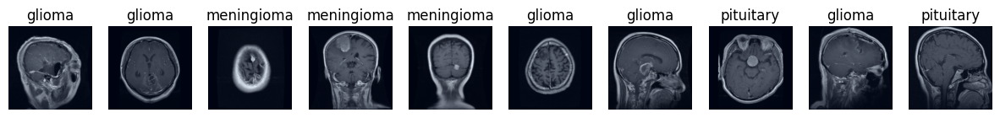

In [ ]:
# Creamos la instancia del conjunto de datos
batch_size = 64
my_dataset = MyDataset(batch_size=batch_size)

# Llama a la función pasando tus conjuntos de datos
dataset_summary(my_dataset=my_dataset)

# Llama a la función para mostrar una muestra de imágenes de tu dataset
print("Muestra de imágenes del conjunto de datos: ")
plot_dataset_sample(my_dataset.train_dataset, num_samples=10, random_seed=42)

In [ ]:
# Creamos el entrenador de modelos
patience = 15
num_max_epochs = 100

# entrenador de modelos
my_group_trainer = MyResnetGroupTrainer(
      my_dataset=my_dataset,
      patience = patience,
      num_max_epochs = num_max_epochs
    )

In [ ]:
# Creamos la instancia del entrenador de modelos
my_group_evaluator = MyResnetGroupEvaluator(my_dataset.no_tumor_label_position)

# Creación y entrenamiento de los grupos de modelos

## Resnet 18

In [ ]:
# Creamos el modelo de prueba
model_name = "resnet18"

my_model_group_18_1 = MyResnetGroupModel(model_name, my_dataset.num_classes)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 157MB/s]


Entrenando el modelo con transfer learning con learning rate 0.1
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 5.9912, Training Accuracy: 72.45%, Tumor Accuracy: 88.58% - Validation Loss: 6.4765, Validation Accuracy: 92.71%, Tumor Accuracy: 98.32
		Epoch [2/100] - Training Loss: 0.8897, Training Accuracy: 87.14%, Tumor Accuracy: 97.16% - Validation Loss: 11.2679, Validation Accuracy: 87.94%, Tumor Accuracy: 98.74
		Epoch [3/100] - Training Loss: 0.9944, Training Accuracy: 86.06%, Tumor Accuracy: 97.08% - Validation Loss: 12.0977, Validation Accuracy: 84.85%, Tumor Accuracy: 96.77
		Epoch [4/100] - Training Loss: 1.3774, Training Accuracy: 86.24%, Tumor Accuracy: 97.68% - Validation Loss: 4.9561, Validation Accuracy: 94.11%, Tumor Accuracy: 99.02
		Epoch [5/100] - Training Loss: 1.2275, Training Accuracy: 87.62%, Tumor Accuracy: 97.36% - Validation Loss: 4.2986, Validation Accuracy: 94.95%, Tumor Accuracy: 99.16
		Epoch [6/100] - Traini

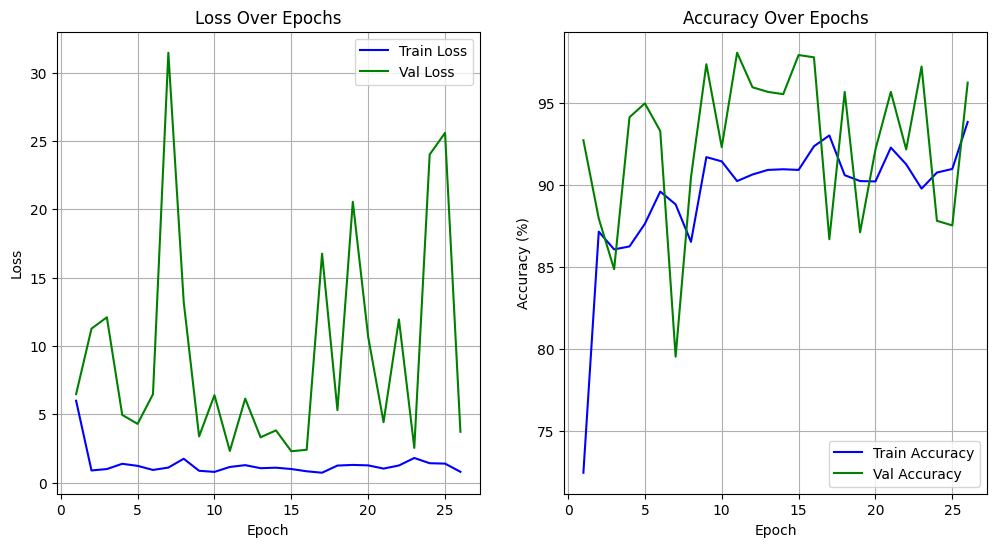

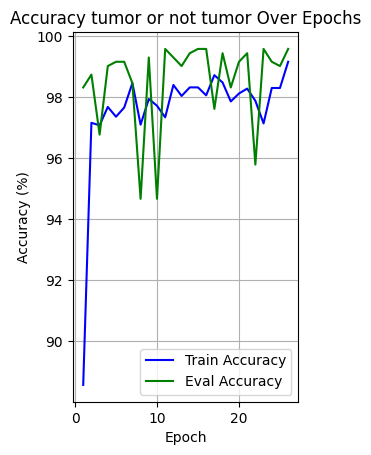

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning con learning rate 0.01
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.6737, Training Accuracy: 76.72%, Tumor Accuracy: 93.24% - Validation Loss: 2.7093, Validation Accuracy: 93.55%, Tumor Accuracy: 98.46
		Epoch [2/100] - Training Loss: 0.3248, Training Accuracy: 88.36%, Tumor Accuracy: 96.94% - Validation Loss: 2.4836, Validation Accuracy: 91.87%, Tumor Accuracy: 98.46
		Epoch [3/100] - Training Loss: 0.3015, Training Accuracy: 88.78%, Tumor Accuracy: 97.88% - Validation Loss: 2.2418, Validation Accuracy: 95.51%, Tumor Accuracy: 99.02
		Epoch [4/100] - Training Loss: 0.2557, Training Accuracy: 90.66%, Tumor Accuracy: 98.28% - Validation Loss: 1.6702, Validation Accuracy: 95.51%, Tumor Accuracy: 99.02
		Epoch [5/100] - Training Loss: 0.2434, Training Accuracy: 91.28%, Tumor Accuracy: 98.16% - Validation Loss: 1.4218, Validation Accuracy: 96.77%, Tumor Accu

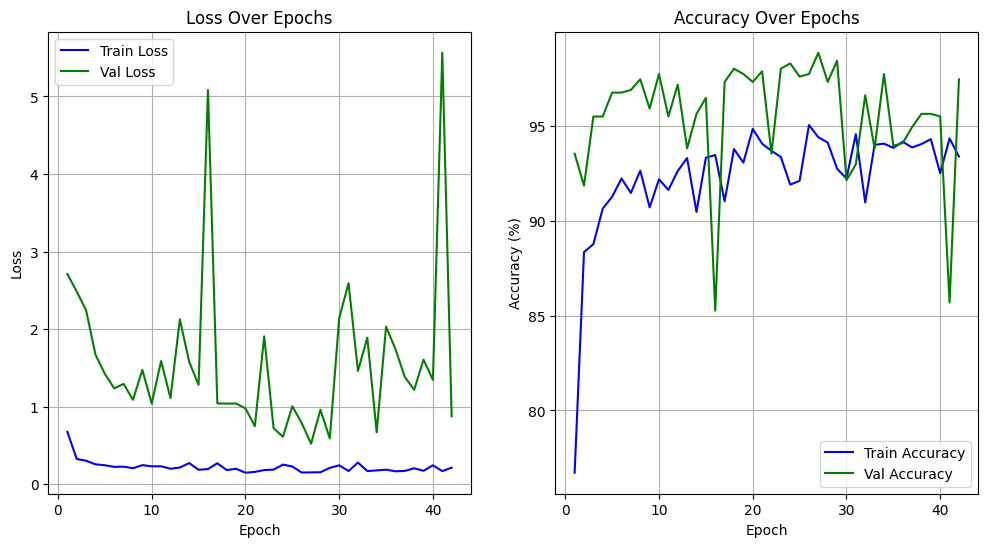

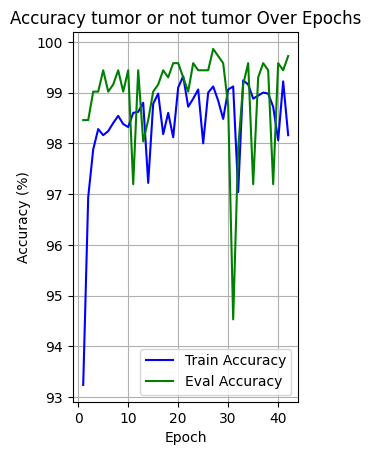

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning con learning rate 0.001
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.8159, Training Accuracy: 70.55%, Tumor Accuracy: 88.82% - Validation Loss: 4.8338, Validation Accuracy: 89.62%, Tumor Accuracy: 97.19
		Epoch [2/100] - Training Loss: 0.4517, Training Accuracy: 85.46%, Tumor Accuracy: 96.94% - Validation Loss: 3.6190, Validation Accuracy: 92.29%, Tumor Accuracy: 97.05
		Epoch [3/100] - Training Loss: 0.3856, Training Accuracy: 87.36%, Tumor Accuracy: 96.92% - Validation Loss: 3.2010, Validation Accuracy: 92.71%, Tumor Accuracy: 97.48
		Epoch [4/100] - Training Loss: 0.3627, Training Accuracy: 89.00%, Tumor Accuracy: 97.38% - Validation Loss: 2.8354, Validation Accuracy: 93.69%, Tumor Accuracy: 97.90
		Epoch [5/100] - Training Loss: 0.3367, Training Accuracy: 88.60%, Tumor Accuracy: 96.46% - Validation Loss: 2.5328, Validation Accuracy: 95.09%, Tumor Acc

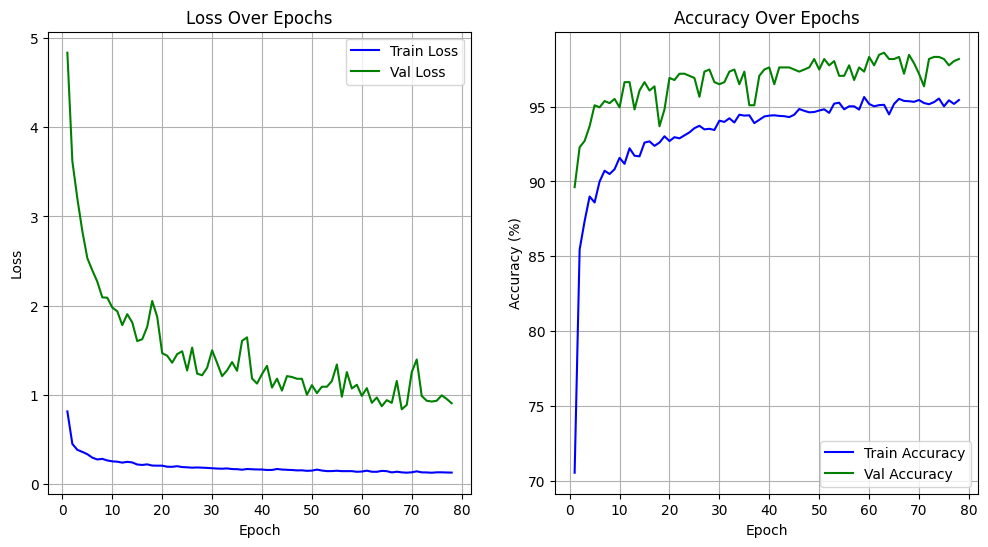

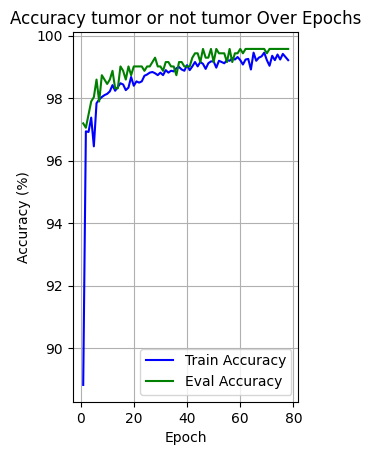

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning con learning rate 0.0001
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 1.4064, Training Accuracy: 27.89%, Tumor Accuracy: 63.79% - Validation Loss: 14.7171, Validation Accuracy: 42.36%, Tumor Accuracy: 77.70
		Epoch [2/100] - Training Loss: 1.1114, Training Accuracy: 59.33%, Tumor Accuracy: 85.48% - Validation Loss: 11.6499, Validation Accuracy: 71.53%, Tumor Accuracy: 90.60
		Epoch [3/100] - Training Loss: 0.9242, Training Accuracy: 73.49%, Tumor Accuracy: 92.54% - Validation Loss: 9.5838, Validation Accuracy: 80.08%, Tumor Accuracy: 93.27
		Epoch [4/100] - Training Loss: 0.7956, Training Accuracy: 78.10%, Tumor Accuracy: 94.30% - Validation Loss: 8.1855, Validation Accuracy: 84.71%, Tumor Accuracy: 95.09
		Epoch [5/100] - Training Loss: 0.7166, Training Accuracy: 80.08%, Tumor Accuracy: 95.20% - Validation Loss: 7.0964, Validation Accuracy: 87.66%, Tumor 

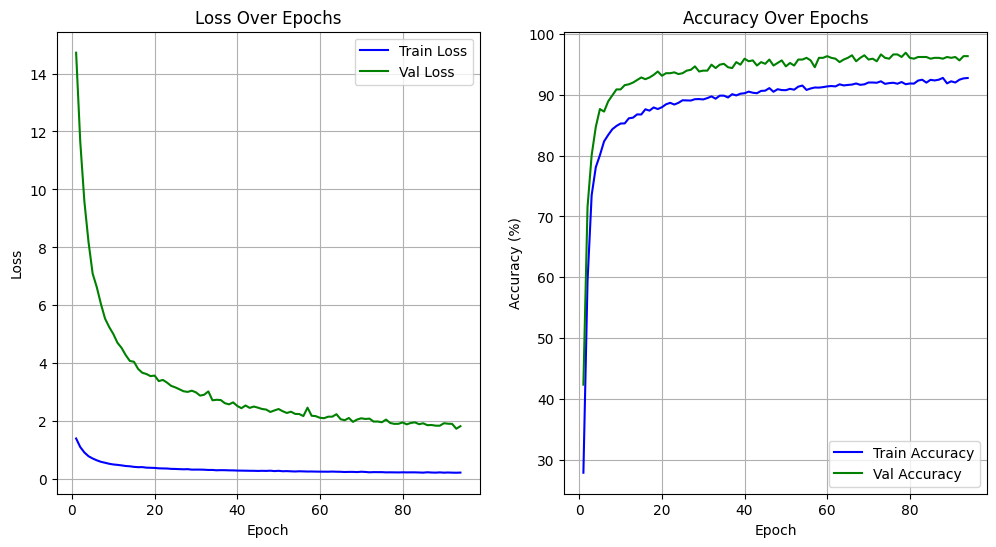

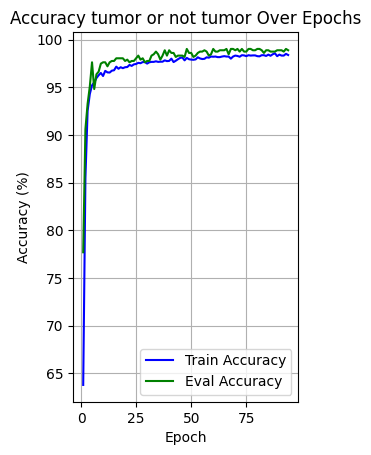

	Proceso de entrenamiento finalizado
Entrenando el modelo con fine tunning con learning rate 0.1
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 2.9625, Training Accuracy: 75.26%, Tumor Accuracy: 90.90% - Validation Loss: 6.6249, Validation Accuracy: 91.58%, Tumor Accuracy: 98.32
		Epoch [2/100] - Training Loss: 0.7914, Training Accuracy: 87.42%, Tumor Accuracy: 97.30% - Validation Loss: 31.1478, Validation Accuracy: 72.51%, Tumor Accuracy: 92.57
		Epoch [3/100] - Training Loss: 1.4864, Training Accuracy: 83.90%, Tumor Accuracy: 96.12% - Validation Loss: 6.3437, Validation Accuracy: 93.69%, Tumor Accuracy: 97.34
		Epoch [4/100] - Training Loss: 1.0217, Training Accuracy: 88.58%, Tumor Accuracy: 97.42% - Validation Loss: 4.5474, Validation Accuracy: 95.51%, Tumor Accuracy: 99.30
		Epoch [5/100] - Training Loss: 0.8644, Training Accuracy: 89.22%, Tumor Accuracy: 97.76% - Validation Loss: 11.9055, Validation Accuracy: 86.54%, Tumor Accuracy

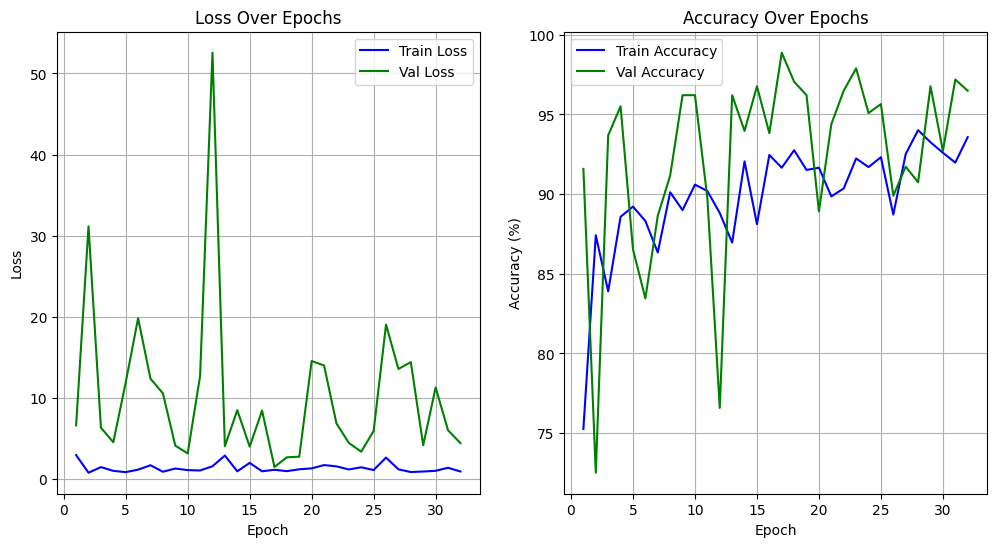

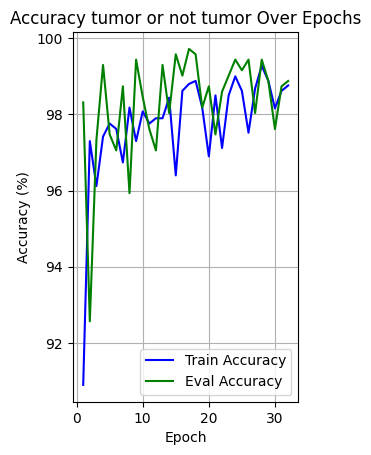

	Proceso de entrenamiento finalizado
Entrenando el modelo con fine tunning con learning rate 0.01
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.5488, Training Accuracy: 79.24%, Tumor Accuracy: 95.20% - Validation Loss: 2.2621, Validation Accuracy: 93.83%, Tumor Accuracy: 98.32
		Epoch [2/100] - Training Loss: 0.3244, Training Accuracy: 88.44%, Tumor Accuracy: 97.80% - Validation Loss: 1.6448, Validation Accuracy: 96.07%, Tumor Accuracy: 99.02
		Epoch [3/100] - Training Loss: 0.2807, Training Accuracy: 89.78%, Tumor Accuracy: 98.04% - Validation Loss: 1.8614, Validation Accuracy: 94.81%, Tumor Accuracy: 99.16
		Epoch [4/100] - Training Loss: 0.2967, Training Accuracy: 89.64%, Tumor Accuracy: 98.00% - Validation Loss: 1.6682, Validation Accuracy: 95.37%, Tumor Accuracy: 99.30
		Epoch [5/100] - Training Loss: 0.2342, Training Accuracy: 91.32%, Tumor Accuracy: 98.38% - Validation Loss: 1.1657, Validation Accuracy: 96.63%, Tumor Accuracy:

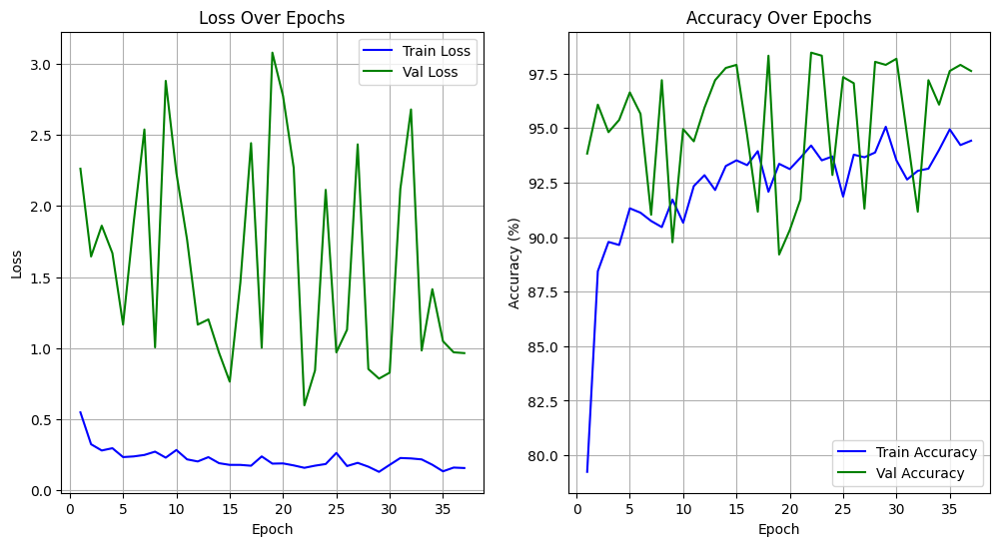

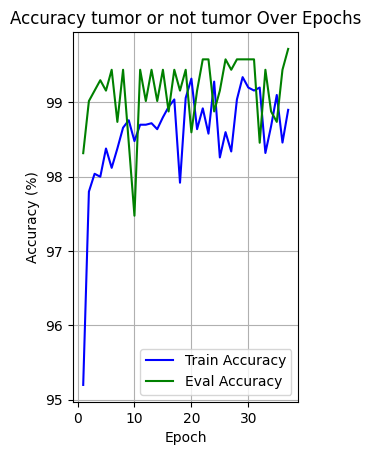

	Proceso de entrenamiento finalizado
Entrenando el modelo con fine tunning con learning rate 0.001
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.7703, Training Accuracy: 73.13%, Tumor Accuracy: 92.14% - Validation Loss: 4.9488, Validation Accuracy: 87.94%, Tumor Accuracy: 96.91
		Epoch [2/100] - Training Loss: 0.4334, Training Accuracy: 86.06%, Tumor Accuracy: 97.20% - Validation Loss: 3.7054, Validation Accuracy: 92.15%, Tumor Accuracy: 97.48
		Epoch [3/100] - Training Loss: 0.3747, Training Accuracy: 87.54%, Tumor Accuracy: 97.14% - Validation Loss: 3.1426, Validation Accuracy: 92.15%, Tumor Accuracy: 97.90
		Epoch [4/100] - Training Loss: 0.3343, Training Accuracy: 89.00%, Tumor Accuracy: 97.66% - Validation Loss: 2.8713, Validation Accuracy: 94.39%, Tumor Accuracy: 98.32
		Epoch [5/100] - Training Loss: 0.3074, Training Accuracy: 89.78%, Tumor Accuracy: 97.86% - Validation Loss: 2.7618, Validation Accuracy: 93.69%, Tumor Accuracy

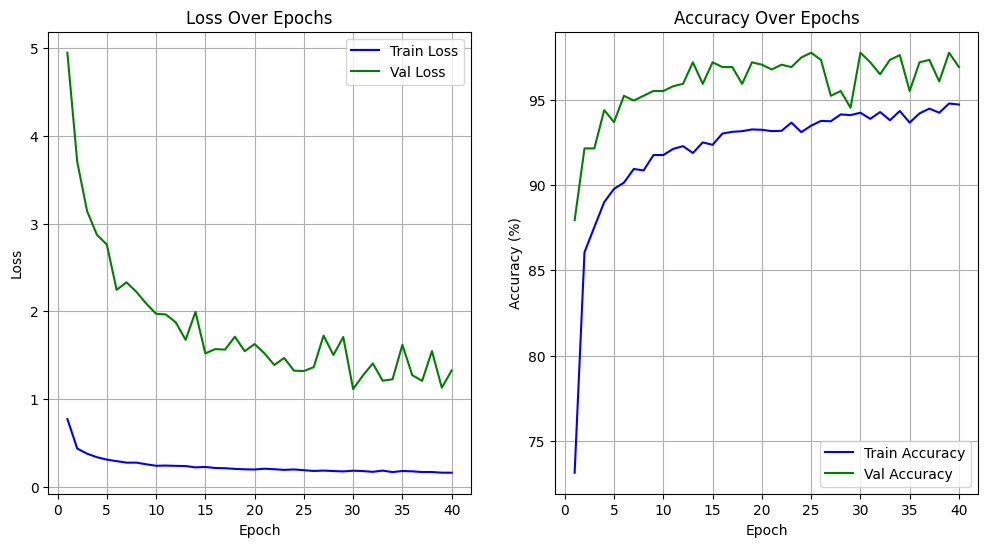

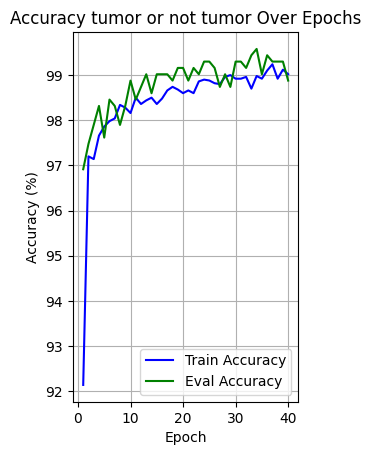

	Proceso de entrenamiento finalizado
Entrenando el modelo con fine tunning con learning rate 0.001
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 1.2086, Training Accuracy: 49.47%, Tumor Accuracy: 75.90% - Validation Loss: 11.9403, Validation Accuracy: 64.94%, Tumor Accuracy: 84.29
		Epoch [2/100] - Training Loss: 0.9666, Training Accuracy: 69.97%, Tumor Accuracy: 90.42% - Validation Loss: 9.8496, Validation Accuracy: 77.98%, Tumor Accuracy: 89.90
		Epoch [3/100] - Training Loss: 0.8289, Training Accuracy: 76.46%, Tumor Accuracy: 93.14% - Validation Loss: 8.1181, Validation Accuracy: 85.55%, Tumor Accuracy: 92.85
		Epoch [4/100] - Training Loss: 0.7270, Training Accuracy: 80.54%, Tumor Accuracy: 95.14% - Validation Loss: 6.9309, Validation Accuracy: 88.08%, Tumor Accuracy: 95.93
		Epoch [5/100] - Training Loss: 0.6569, Training Accuracy: 82.00%, Tumor Accuracy: 95.56% - Validation Loss: 6.2850, Validation Accuracy: 90.32%, Tumor Accurac

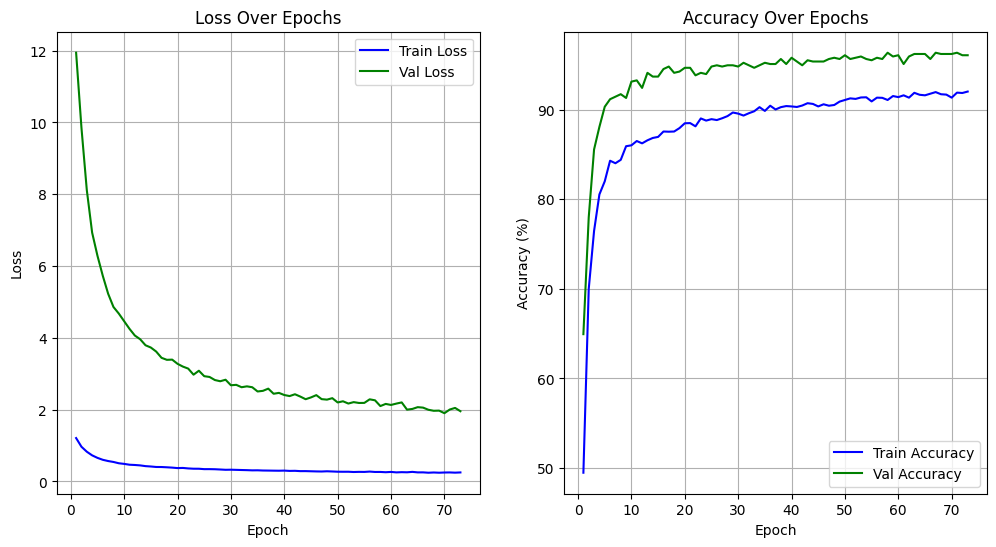

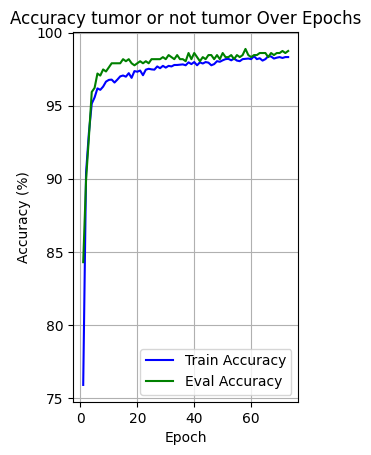

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning y fine tunning con learning rate 0.1
Actualizamos los pesos del modelo a partir del modelo entrenado con las capas congeladas y learning rate 0,1
Volvemos a entrenar con las capas descongeladas
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 1.8805, Training Accuracy: 90.96%, Tumor Accuracy: 97.98% - Validation Loss: 9.3242, Validation Accuracy: 94.39%, Tumor Accuracy: 99.72
		Epoch [2/100] - Training Loss: 1.6598, Training Accuracy: 90.66%, Tumor Accuracy: 97.74% - Validation Loss: 5.5485, Validation Accuracy: 96.63%, Tumor Accuracy: 99.58
		Epoch [3/100] - Training Loss: 1.1093, Training Accuracy: 92.44%, Tumor Accuracy: 98.24% - Validation Loss: 6.9291, Validation Accuracy: 94.81%, Tumor Accuracy: 99.44
		Epoch [4/100] - Training Loss: 0.8329, Training Accuracy: 93.72%, Tumor Accuracy: 98.78% - Validation Loss: 4.4287, Validation Accuracy: 95.93%, Tumor Ac

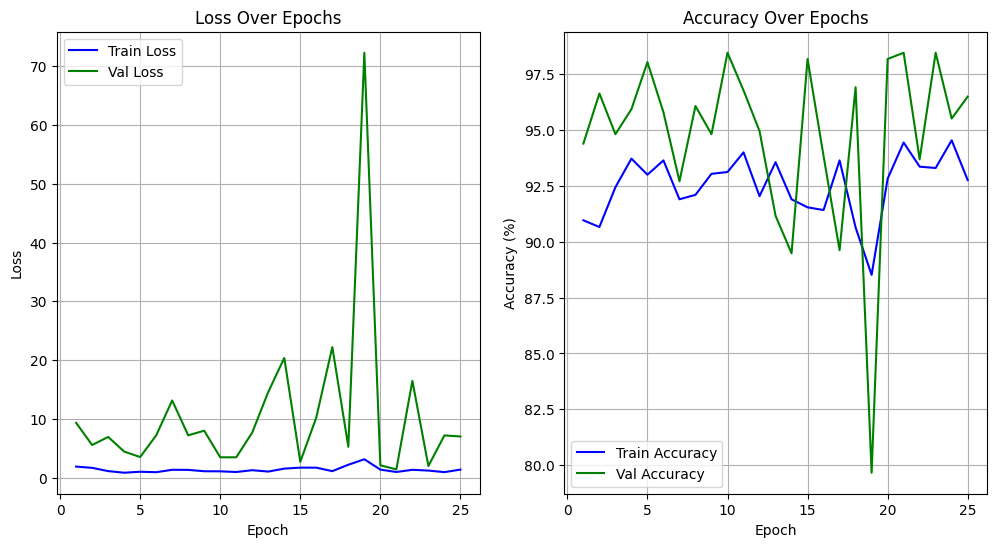

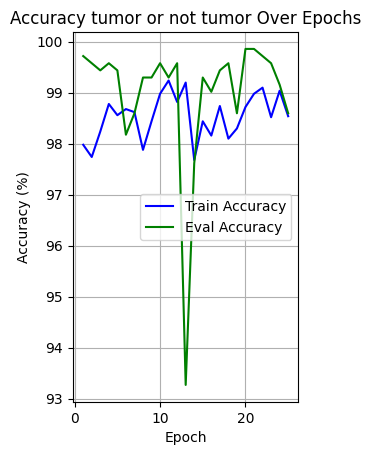

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning y fine tunning con learning rate 0.01
Actualizamos los pesos del modelo a partir del modelo entrenado con las capas congeladas y learning rate 0,01
Volvemos a entrenar con las capas descongeladas
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.1783, Training Accuracy: 93.86%, Tumor Accuracy: 99.04% - Validation Loss: 0.6556, Validation Accuracy: 98.32%, Tumor Accuracy: 99.58
		Epoch [2/100] - Training Loss: 0.2186, Training Accuracy: 92.60%, Tumor Accuracy: 98.94% - Validation Loss: 0.9939, Validation Accuracy: 96.77%, Tumor Accuracy: 99.16
		Epoch [3/100] - Training Loss: 0.1544, Training Accuracy: 94.62%, Tumor Accuracy: 99.02% - Validation Loss: 0.8703, Validation Accuracy: 97.90%, Tumor Accuracy: 99.30
		Epoch [4/100] - Training Loss: 0.1655, Training Accuracy: 94.38%, Tumor Accuracy: 99.18% - Validation Loss: 1.1654, Validation Accuracy: 96.91%, Tumor 

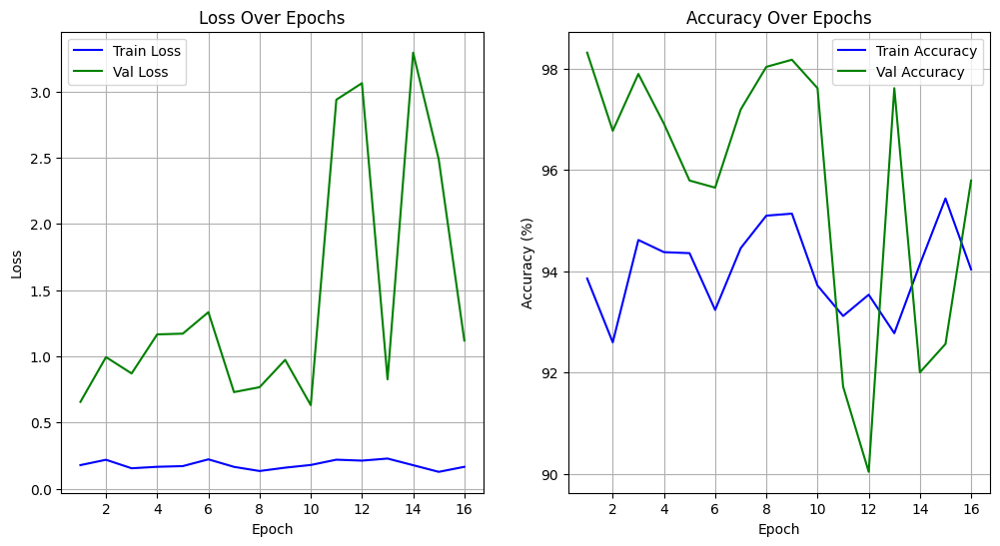

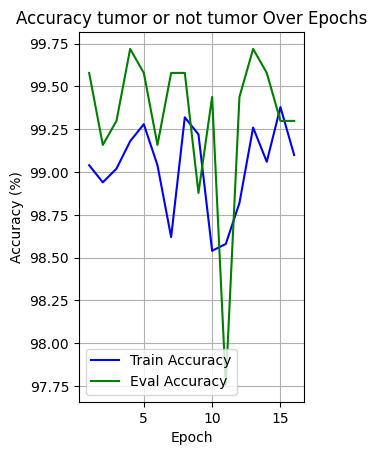

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning y fine tunning con learning rate 0.001
Actualizamos los pesos del modelo a partir del modelo entrenado con las capas congeladas y learning rate 0,001
Volvemos a entrenar con las capas descongeladas
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.1288, Training Accuracy: 95.50%, Tumor Accuracy: 99.32% - Validation Loss: 0.8869, Validation Accuracy: 98.18%, Tumor Accuracy: 99.58
		Epoch [2/100] - Training Loss: 0.1302, Training Accuracy: 95.64%, Tumor Accuracy: 99.28% - Validation Loss: 1.0652, Validation Accuracy: 98.04%, Tumor Accuracy: 99.30
		Epoch [3/100] - Training Loss: 0.1385, Training Accuracy: 94.94%, Tumor Accuracy: 99.08% - Validation Loss: 0.8218, Validation Accuracy: 98.18%, Tumor Accuracy: 99.58
		Epoch [4/100] - Training Loss: 0.1386, Training Accuracy: 95.38%, Tumor Accuracy: 99.16% - Validation Loss: 1.0647, Validation Accuracy: 97.90%, Tumo

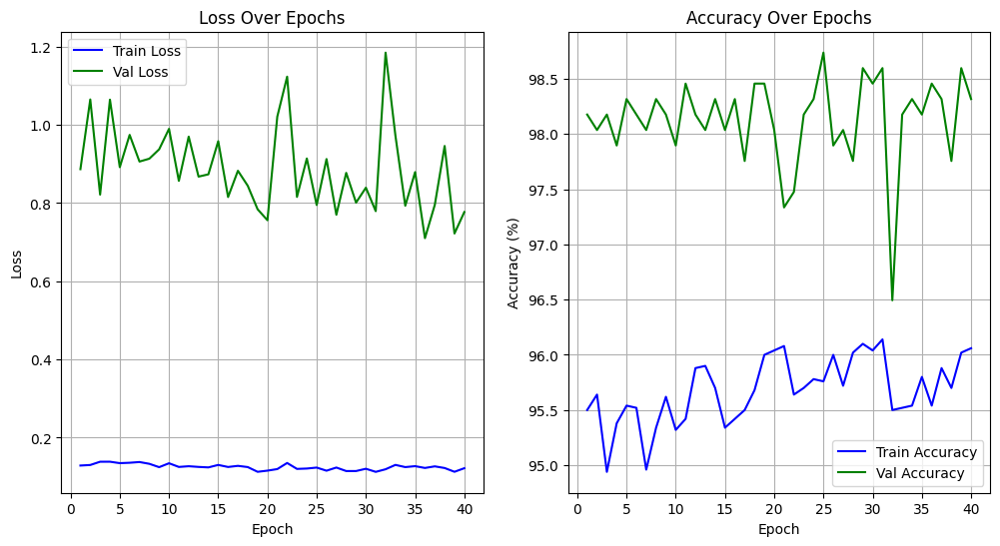

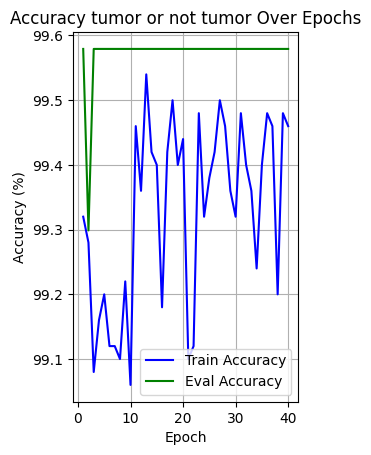

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning y fine tunning con learning rate 0.0001
Actualizamos los pesos del modelo a partir del modelo entrenado con las capas congeladas y learning rate 0,0001
Volvemos a entrenar con las capas descongeladas
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.2245, Training Accuracy: 92.64%, Tumor Accuracy: 98.44% - Validation Loss: 1.8299, Validation Accuracy: 96.21%, Tumor Accuracy: 98.88
		Epoch [2/100] - Training Loss: 0.2319, Training Accuracy: 92.56%, Tumor Accuracy: 98.60% - Validation Loss: 1.8470, Validation Accuracy: 96.35%, Tumor Accuracy: 99.02
		Epoch [3/100] - Training Loss: 0.2191, Training Accuracy: 92.70%, Tumor Accuracy: 98.46% - Validation Loss: 1.8336, Validation Accuracy: 96.21%, Tumor Accuracy: 99.02
		Epoch [4/100] - Training Loss: 0.2177, Training Accuracy: 92.78%, Tumor Accuracy: 98.60% - Validation Loss: 1.8050, Validation Accuracy: 96.91%, Tu

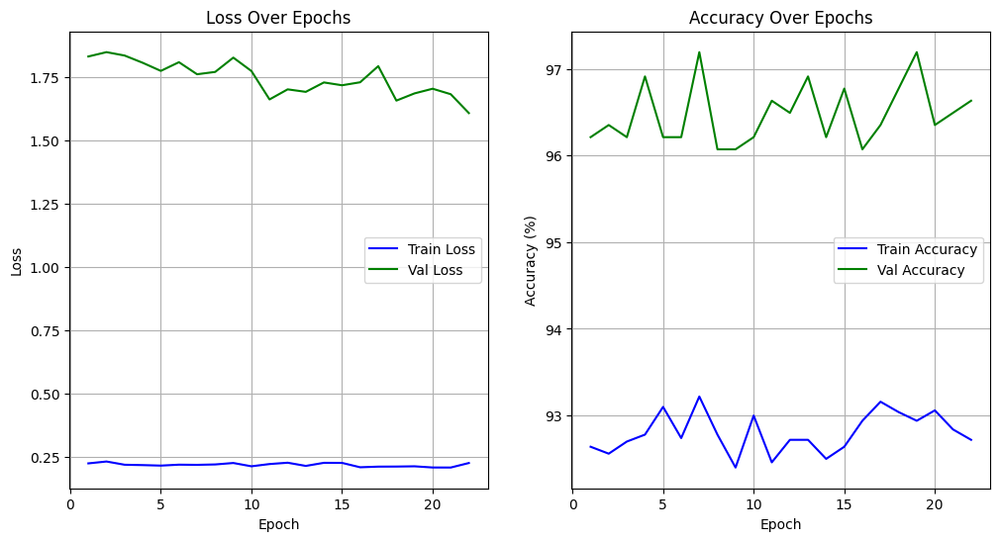

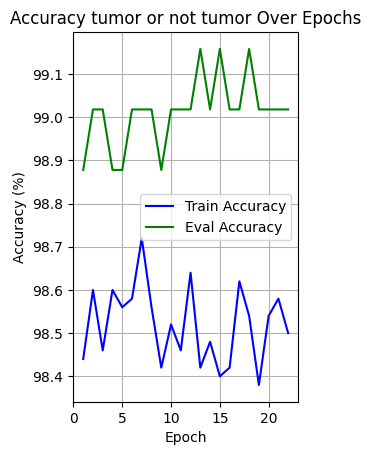

	Proceso de entrenamiento finalizado


In [ ]:



# entrenamos el grupo
my_group_trainer.trainer(my_model_group_18_1)

In [ ]:
# Mostramos los resultados obtenidos durante el entrenamiento
plot_group_training_info(my_model_group_18_1)




In [ ]:
#Evaluamos los resultados del grupo
my_group_evaluator.eval(my_dataset.test_loader, my_model_group_18_1)

In [ ]:

# Creamos una inteligencia compartida
min_accuracy_value = 0.85
my_model_group_18_1.create_shared_model(min_accuracy_value)

Número de modelos que cumplen con la condición: 2


	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet18.
			Loss: 0.6869
			Accuracy: 0.8734
			Precision: 0.8712
			Recall: 0.8682
			F1-score: 0.8697

			Accuracy tumor o no tumor: 0.9802
			Precision tumor o no tumor: 0.9698
			Recall tumor o no tumor: 0.9857
			F1-score tumor o no tumor: 0.9777

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.8481
			meningioma: 0.7516
			notumor: 0.936
			pituitary: 0.9491

		Sensibilidad (Recall):
			glioma: 0.8933
			meningioma: 0.7712
			notumor: 0.9383
			pituitary: 0.87

		Puntaje F1 (F1-score):
			glioma: 0.8701
			meningioma: 0.7613
			notumor: 0.9371
			pituitary: 0.9078

		Pérdida por categoría:
			glioma: 0.008
			meningioma: 0.0299
			notumor: 0.0095
			pituitary: 0.0121

		Matriz de confusión:


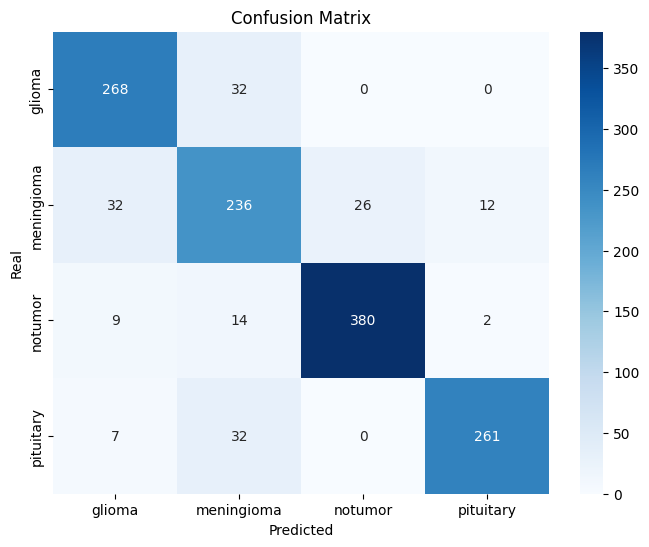

		Matriz de confusión tumor o no tumor:


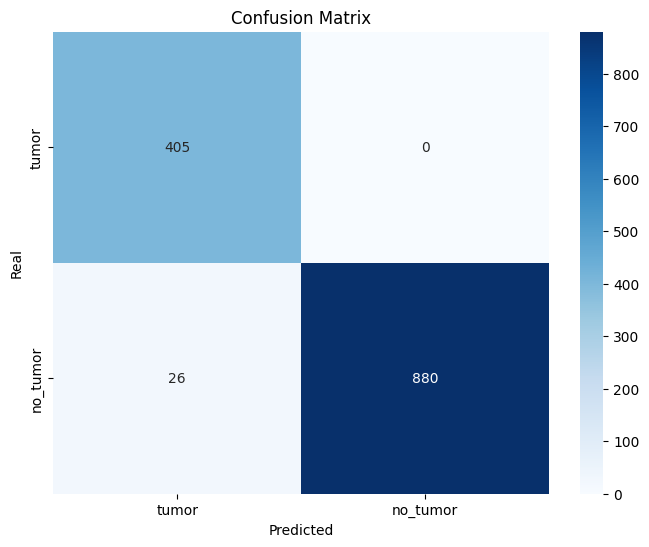

In [ ]:
# Comprobamos el rendimiento de la inteligencia compartida
evaluate(my_model_group_18_1.shared_model, my_dataset.test_loader, my_dataset.no_tumor_label_position)

In [ ]:
#guardado de todo un grupo
save_group_model(my_model_group_18_1)

Guardando los modelos entrenados desde cero.
Guardando los modelos con Transfer Learning.
Guardando los modelos con Fine Tunning.
Guardando los modelos con Transfer Learning y Fine Tunning.
Guardando la intenligencia compartida
Comprimiendo la carpeta con los modelos y subiendo al drive
proceso de guardado finalizado


## Resnet 34


In [ ]:
# Creamos el grupo de modelos
model_name = "resnet34"

my_model_group_34_1 = MyResnetGroupModel(model_name, my_dataset.num_classes)

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:01<00:00, 66.8MB/s]


Entrenando el modelo con transfer learning con learning rate 0.1
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 4.6823, Training Accuracy: 73.01%, Tumor Accuracy: 91.08% - Validation Loss: 9.1950, Validation Accuracy: 89.90%, Tumor Accuracy: 98.04
		Epoch [2/100] - Training Loss: 1.2933, Training Accuracy: 84.94%, Tumor Accuracy: 95.70% - Validation Loss: 11.0922, Validation Accuracy: 88.78%, Tumor Accuracy: 98.74
		Epoch [3/100] - Training Loss: 1.5938, Training Accuracy: 83.84%, Tumor Accuracy: 96.40% - Validation Loss: 8.0075, Validation Accuracy: 92.85%, Tumor Accuracy: 99.02
		Epoch [4/100] - Training Loss: 1.1397, Training Accuracy: 87.12%, Tumor Accuracy: 97.02% - Validation Loss: 19.7959, Validation Accuracy: 84.57%, Tumor Accuracy: 98.32
		Epoch [5/100] - Training Loss: 1.6581, Training Accuracy: 85.32%, Tumor Accuracy: 95.10% - Validation Loss: 29.5781, Validation Accuracy: 81.49%, Tumor Accuracy: 98.88
		Epoch [6/100] - Train

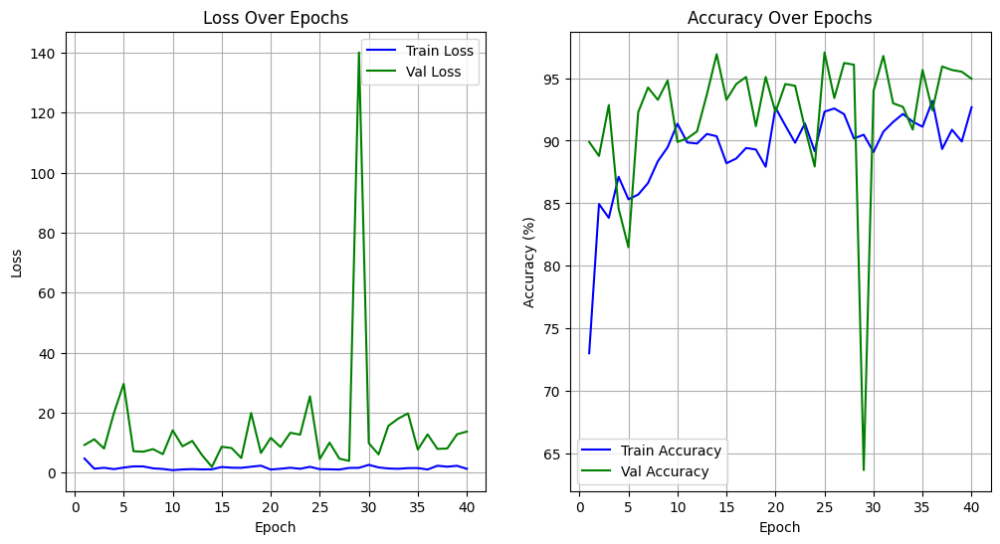

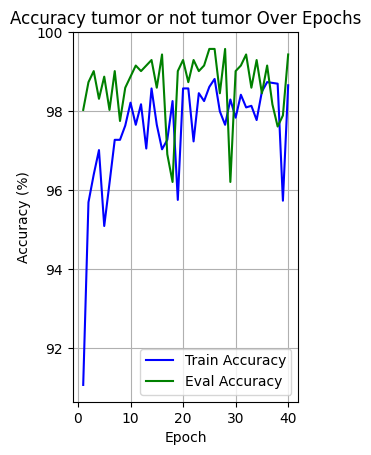

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning con learning rate 0.01
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.7903, Training Accuracy: 74.45%, Tumor Accuracy: 92.60% - Validation Loss: 2.8595, Validation Accuracy: 92.99%, Tumor Accuracy: 98.60
		Epoch [2/100] - Training Loss: 0.3710, Training Accuracy: 86.34%, Tumor Accuracy: 97.18% - Validation Loss: 2.6233, Validation Accuracy: 91.73%, Tumor Accuracy: 98.74
		Epoch [3/100] - Training Loss: 0.3745, Training Accuracy: 87.46%, Tumor Accuracy: 96.90% - Validation Loss: 2.7213, Validation Accuracy: 92.57%, Tumor Accuracy: 96.21
		Epoch [4/100] - Training Loss: 0.2520, Training Accuracy: 90.62%, Tumor Accuracy: 97.90% - Validation Loss: 1.7884, Validation Accuracy: 93.97%, Tumor Accuracy: 99.30
		Epoch [5/100] - Training Loss: 0.2753, Training Accuracy: 90.02%, Tumor Accuracy: 97.78% - Validation Loss: 1.5242, Validation Accuracy: 95.93%, Tumor Accu

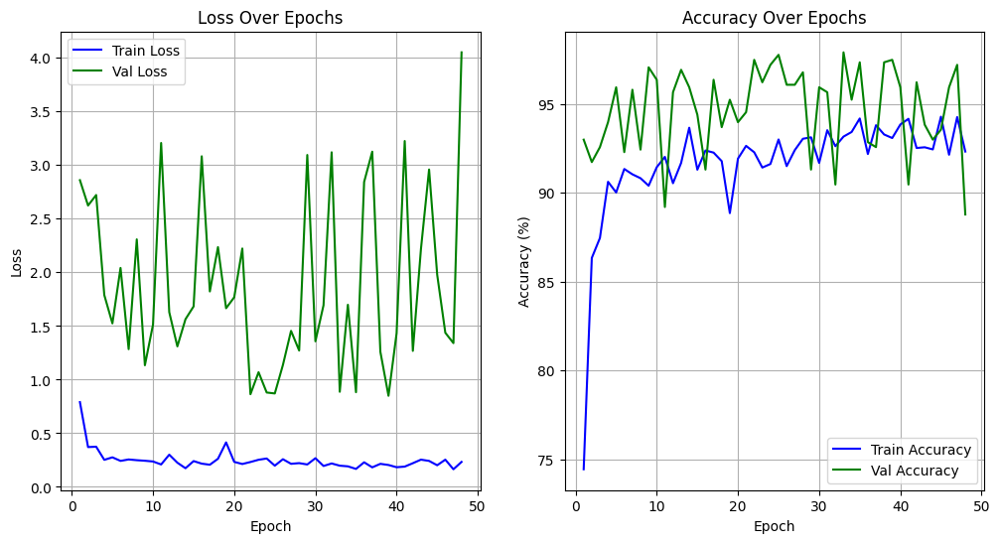

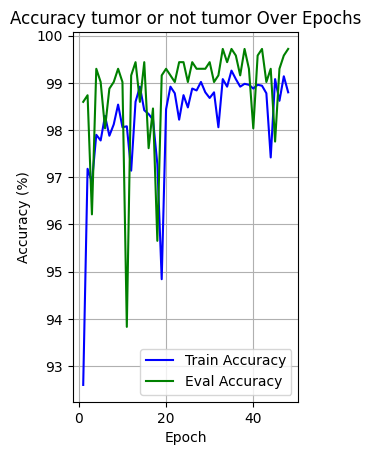

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning con learning rate 0.001
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.7516, Training Accuracy: 71.95%, Tumor Accuracy: 89.14% - Validation Loss: 4.7667, Validation Accuracy: 88.50%, Tumor Accuracy: 96.91
		Epoch [2/100] - Training Loss: 0.4436, Training Accuracy: 85.22%, Tumor Accuracy: 96.22% - Validation Loss: 3.5427, Validation Accuracy: 91.30%, Tumor Accuracy: 97.34
		Epoch [3/100] - Training Loss: 0.3813, Training Accuracy: 86.80%, Tumor Accuracy: 96.78% - Validation Loss: 3.1618, Validation Accuracy: 92.71%, Tumor Accuracy: 98.46
		Epoch [4/100] - Training Loss: 0.3399, Training Accuracy: 88.68%, Tumor Accuracy: 96.96% - Validation Loss: 2.9545, Validation Accuracy: 93.13%, Tumor Accuracy: 97.76
		Epoch [5/100] - Training Loss: 0.3405, Training Accuracy: 88.44%, Tumor Accuracy: 97.38% - Validation Loss: 2.6018, Validation Accuracy: 93.41%, Tumor Acc

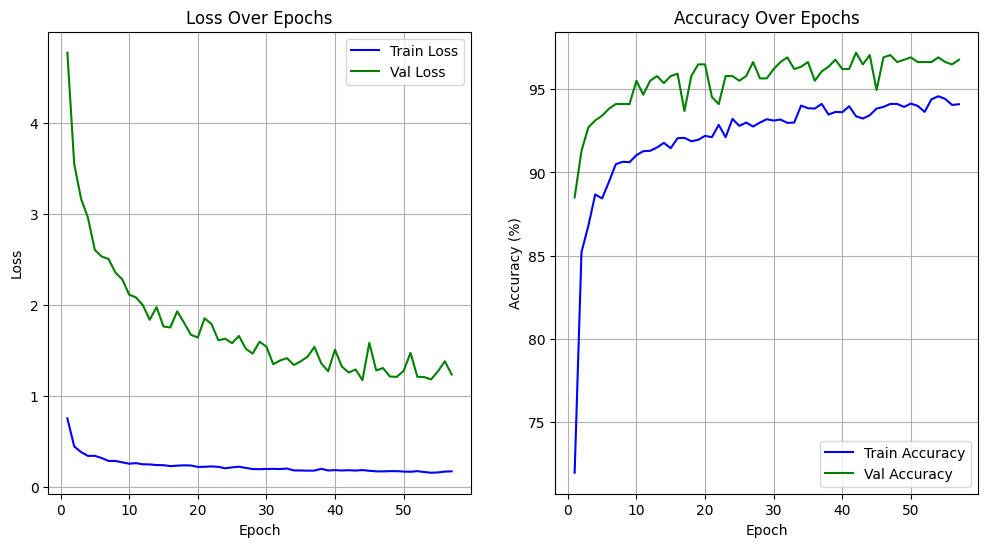

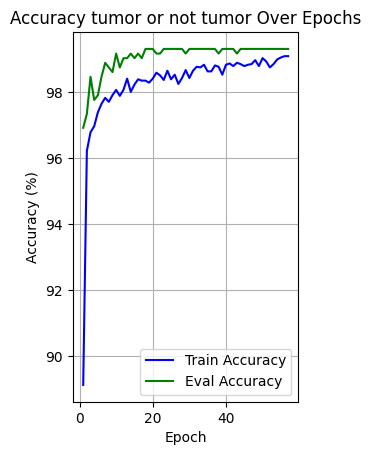

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning con learning rate 0.0001
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 1.2883, Training Accuracy: 40.41%, Tumor Accuracy: 71.25% - Validation Loss: 13.0502, Validation Accuracy: 61.43%, Tumor Accuracy: 79.10
		Epoch [2/100] - Training Loss: 1.0208, Training Accuracy: 66.65%, Tumor Accuracy: 87.02% - Validation Loss: 10.3431, Validation Accuracy: 77.42%, Tumor Accuracy: 88.92
		Epoch [3/100] - Training Loss: 0.8535, Training Accuracy: 76.68%, Tumor Accuracy: 91.40% - Validation Loss: 8.5952, Validation Accuracy: 83.45%, Tumor Accuracy: 92.43
		Epoch [4/100] - Training Loss: 0.7403, Training Accuracy: 79.50%, Tumor Accuracy: 92.70% - Validation Loss: 7.5221, Validation Accuracy: 86.54%, Tumor Accuracy: 93.41
		Epoch [5/100] - Training Loss: 0.6655, Training Accuracy: 81.86%, Tumor Accuracy: 93.84% - Validation Loss: 6.7088, Validation Accuracy: 88.22%, Tumor 

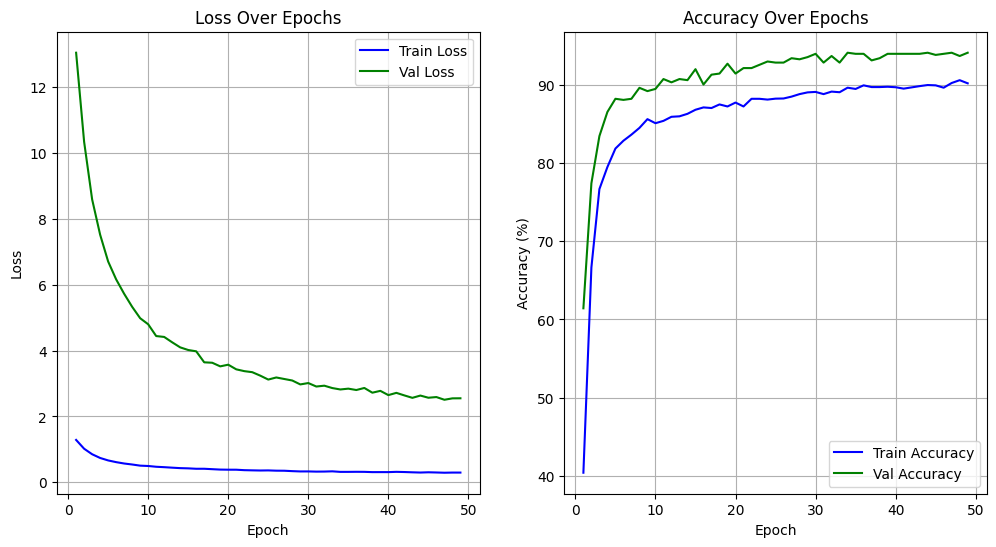

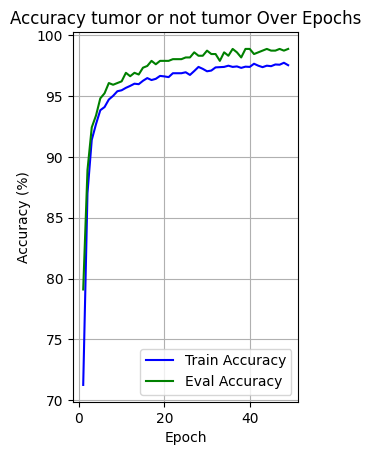

	Proceso de entrenamiento finalizado
Entrenando el modelo con fine tunning con learning rate 0.1
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 6.3545, Training Accuracy: 70.95%, Tumor Accuracy: 88.74% - Validation Loss: 20.5165, Validation Accuracy: 82.19%, Tumor Accuracy: 97.62
		Epoch [2/100] - Training Loss: 1.3763, Training Accuracy: 84.72%, Tumor Accuracy: 96.02% - Validation Loss: 19.6734, Validation Accuracy: 82.75%, Tumor Accuracy: 98.04
		Epoch [3/100] - Training Loss: 1.7581, Training Accuracy: 83.86%, Tumor Accuracy: 96.36% - Validation Loss: 19.8939, Validation Accuracy: 81.07%, Tumor Accuracy: 95.09
		Epoch [4/100] - Training Loss: 1.6546, Training Accuracy: 85.10%, Tumor Accuracy: 94.42% - Validation Loss: 23.3654, Validation Accuracy: 83.73%, Tumor Accuracy: 94.39
		Epoch [5/100] - Training Loss: 2.2120, Training Accuracy: 83.96%, Tumor Accuracy: 97.58% - Validation Loss: 5.1773, Validation Accuracy: 94.39%, Tumor Accura

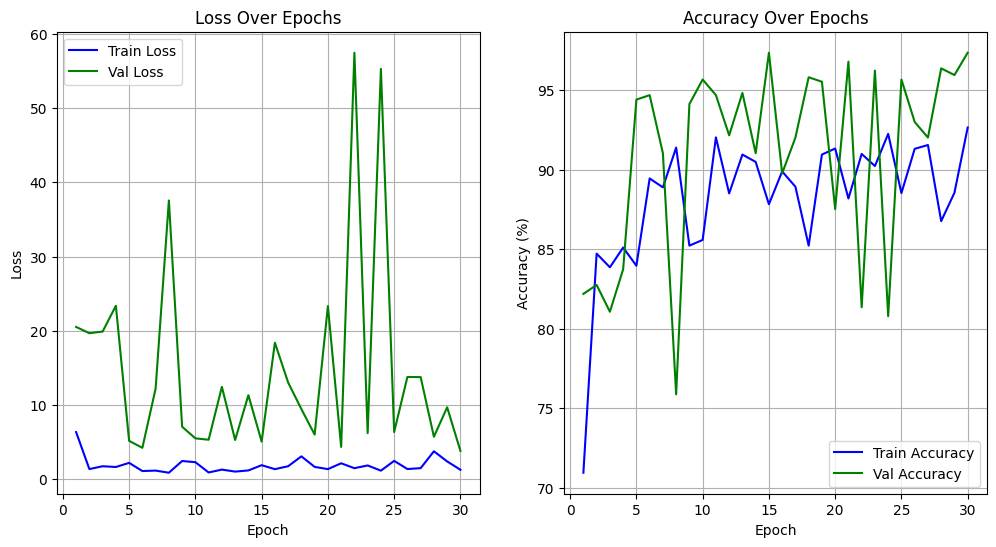

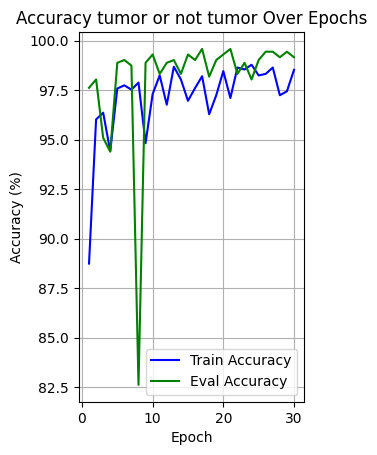

	Proceso de entrenamiento finalizado
Entrenando el modelo con fine tunning con learning rate 0.01
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.7316, Training Accuracy: 75.66%, Tumor Accuracy: 92.38% - Validation Loss: 2.8428, Validation Accuracy: 92.15%, Tumor Accuracy: 98.04
		Epoch [2/100] - Training Loss: 0.3433, Training Accuracy: 86.98%, Tumor Accuracy: 96.86% - Validation Loss: 3.5047, Validation Accuracy: 91.02%, Tumor Accuracy: 98.60
		Epoch [3/100] - Training Loss: 0.2814, Training Accuracy: 89.48%, Tumor Accuracy: 97.62% - Validation Loss: 2.8082, Validation Accuracy: 90.46%, Tumor Accuracy: 98.88
		Epoch [4/100] - Training Loss: 0.3087, Training Accuracy: 89.20%, Tumor Accuracy: 97.86% - Validation Loss: 1.8951, Validation Accuracy: 95.51%, Tumor Accuracy: 98.46
		Epoch [5/100] - Training Loss: 0.2960, Training Accuracy: 89.44%, Tumor Accuracy: 96.56% - Validation Loss: 2.4084, Validation Accuracy: 94.11%, Tumor Accuracy:

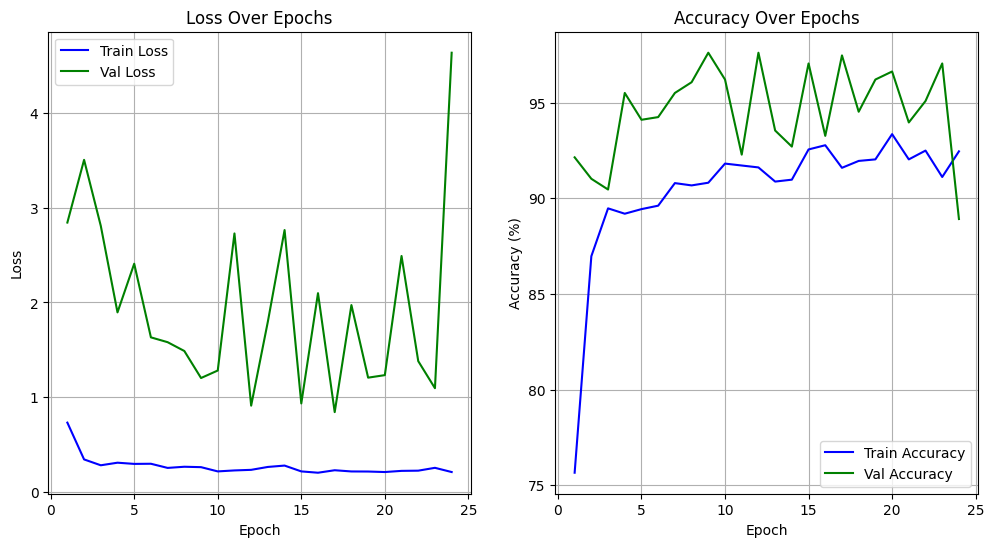

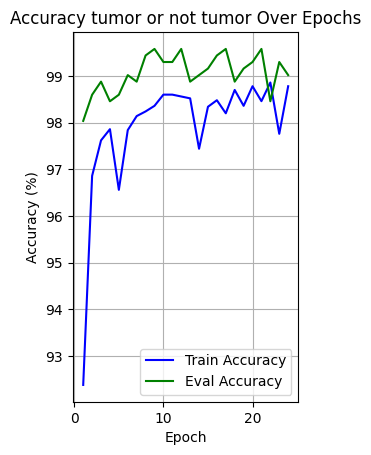

	Proceso de entrenamiento finalizado
Entrenando el modelo con fine tunning con learning rate 0.001
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.7826, Training Accuracy: 72.07%, Tumor Accuracy: 88.90% - Validation Loss: 5.1678, Validation Accuracy: 86.96%, Tumor Accuracy: 96.35
		Epoch [2/100] - Training Loss: 0.4435, Training Accuracy: 85.72%, Tumor Accuracy: 95.90% - Validation Loss: 3.6547, Validation Accuracy: 90.04%, Tumor Accuracy: 97.76
		Epoch [3/100] - Training Loss: 0.3823, Training Accuracy: 86.88%, Tumor Accuracy: 96.48% - Validation Loss: 3.2432, Validation Accuracy: 91.30%, Tumor Accuracy: 98.32
		Epoch [4/100] - Training Loss: 0.3456, Training Accuracy: 88.22%, Tumor Accuracy: 96.88% - Validation Loss: 2.9548, Validation Accuracy: 92.57%, Tumor Accuracy: 98.60
		Epoch [5/100] - Training Loss: 0.3271, Training Accuracy: 88.58%, Tumor Accuracy: 96.86% - Validation Loss: 2.8280, Validation Accuracy: 92.99%, Tumor Accuracy

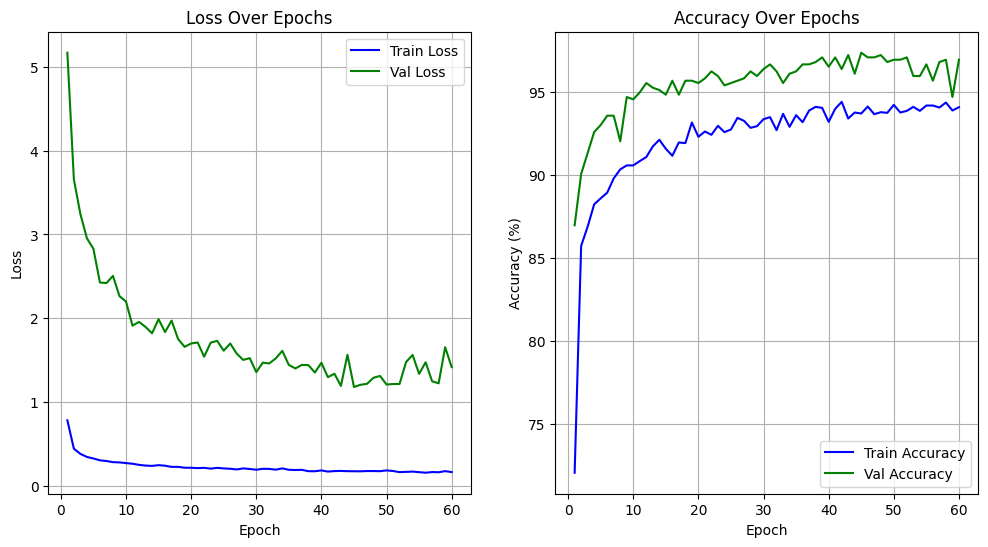

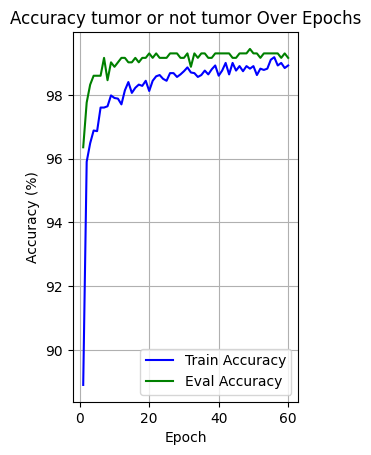

	Proceso de entrenamiento finalizado
Entrenando el modelo con fine tunning con learning rate 0.001
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 1.3012, Training Accuracy: 41.47%, Tumor Accuracy: 72.39% - Validation Loss: 12.9539, Validation Accuracy: 63.53%, Tumor Accuracy: 88.78
		Epoch [2/100] - Training Loss: 1.0230, Training Accuracy: 65.53%, Tumor Accuracy: 90.48% - Validation Loss: 10.2960, Validation Accuracy: 77.84%, Tumor Accuracy: 94.95
		Epoch [3/100] - Training Loss: 0.8629, Training Accuracy: 74.87%, Tumor Accuracy: 94.06% - Validation Loss: 8.7414, Validation Accuracy: 79.94%, Tumor Accuracy: 94.25
		Epoch [4/100] - Training Loss: 0.7487, Training Accuracy: 77.94%, Tumor Accuracy: 94.74% - Validation Loss: 7.5330, Validation Accuracy: 84.57%, Tumor Accuracy: 95.79
		Epoch [5/100] - Training Loss: 0.6764, Training Accuracy: 80.26%, Tumor Accuracy: 95.08% - Validation Loss: 6.7854, Validation Accuracy: 84.57%, Tumor Accura

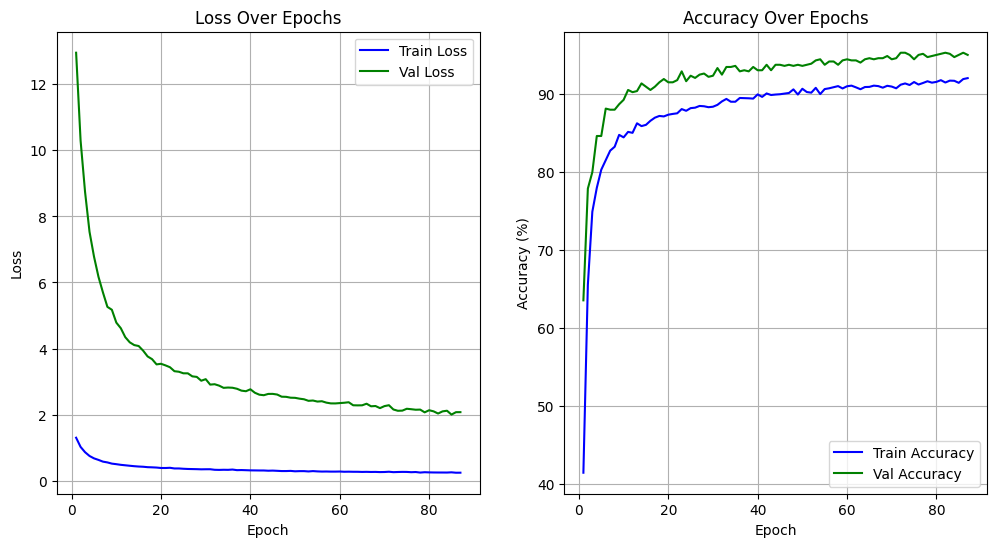

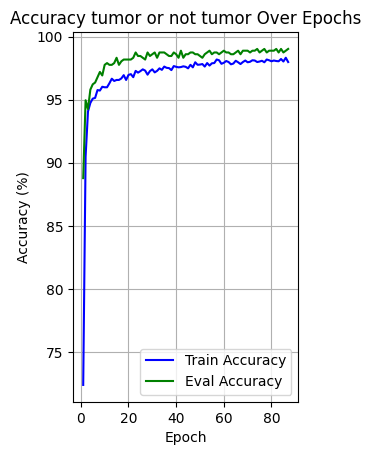

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning y fine tunning con learning rate 0.1
Actualizamos los pesos del modelo a partir del modelo entrenado con las capas congeladas y learning rate 0,1
Volvemos a entrenar con las capas descongeladas
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 2.0481, Training Accuracy: 90.76%, Tumor Accuracy: 98.74% - Validation Loss: 15.1660, Validation Accuracy: 93.97%, Tumor Accuracy: 96.91
		Epoch [2/100] - Training Loss: 1.5829, Training Accuracy: 92.36%, Tumor Accuracy: 98.60% - Validation Loss: 25.8407, Validation Accuracy: 89.20%, Tumor Accuracy: 99.44
		Epoch [3/100] - Training Loss: 1.6731, Training Accuracy: 91.36%, Tumor Accuracy: 98.30% - Validation Loss: 8.9621, Validation Accuracy: 94.95%, Tumor Accuracy: 99.72
		Epoch [4/100] - Training Loss: 1.1719, Training Accuracy: 92.76%, Tumor Accuracy: 98.68% - Validation Loss: 9.6813, Validation Accuracy: 94.81%, Tumor 

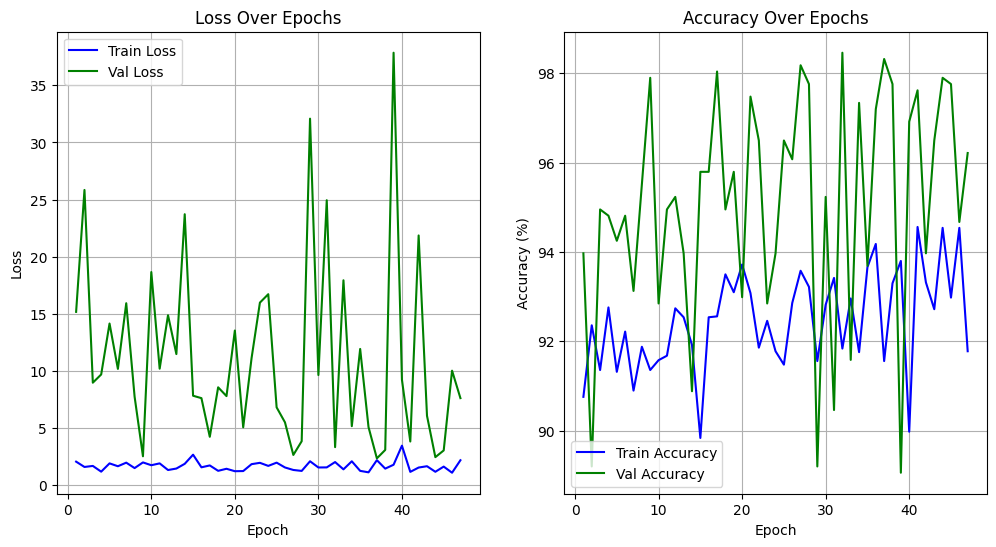

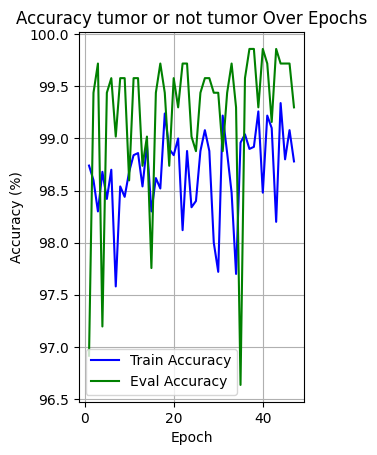

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning y fine tunning con learning rate 0.01
Actualizamos los pesos del modelo a partir del modelo entrenado con las capas congeladas y learning rate 0,01
Volvemos a entrenar con las capas descongeladas
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.2302, Training Accuracy: 92.62%, Tumor Accuracy: 98.58% - Validation Loss: 1.8144, Validation Accuracy: 95.09%, Tumor Accuracy: 99.44
		Epoch [2/100] - Training Loss: 0.1817, Training Accuracy: 93.76%, Tumor Accuracy: 98.92% - Validation Loss: 0.8865, Validation Accuracy: 97.05%, Tumor Accuracy: 99.58
		Epoch [3/100] - Training Loss: 0.2297, Training Accuracy: 93.34%, Tumor Accuracy: 98.46% - Validation Loss: 1.4392, Validation Accuracy: 95.37%, Tumor Accuracy: 99.44
		Epoch [4/100] - Training Loss: 0.2185, Training Accuracy: 92.94%, Tumor Accuracy: 98.48% - Validation Loss: 0.8244, Validation Accuracy: 97.48%, Tumor 

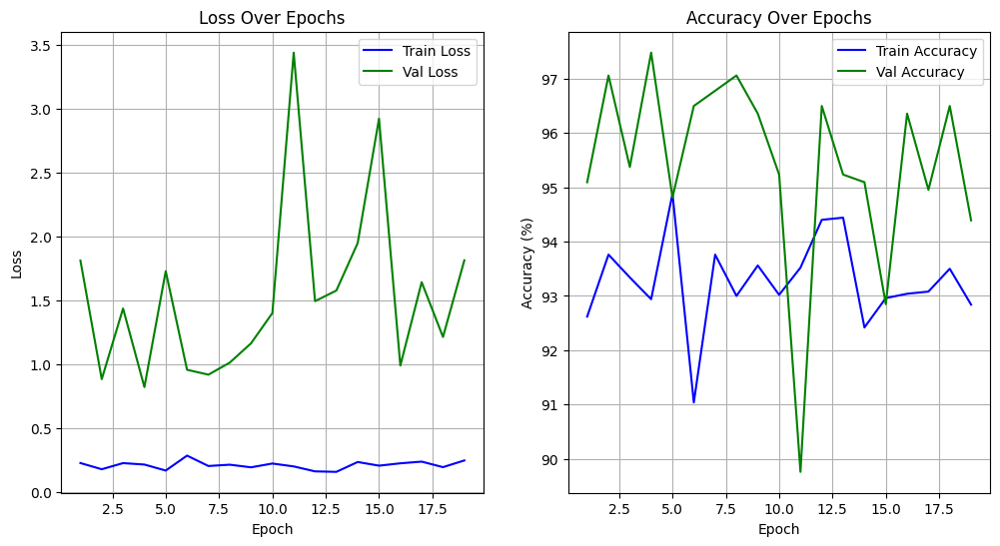

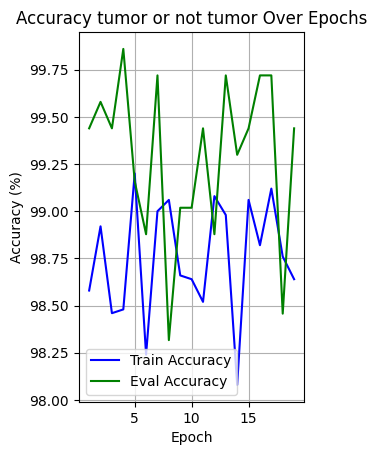

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning y fine tunning con learning rate 0.001
Actualizamos los pesos del modelo a partir del modelo entrenado con las capas congeladas y learning rate 0,001
Volvemos a entrenar con las capas descongeladas
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.1667, Training Accuracy: 94.18%, Tumor Accuracy: 99.08% - Validation Loss: 1.2362, Validation Accuracy: 96.63%, Tumor Accuracy: 99.30
		Epoch [2/100] - Training Loss: 0.1690, Training Accuracy: 94.38%, Tumor Accuracy: 99.08% - Validation Loss: 1.3717, Validation Accuracy: 96.07%, Tumor Accuracy: 99.30
		Epoch [3/100] - Training Loss: 0.1736, Training Accuracy: 93.52%, Tumor Accuracy: 98.88% - Validation Loss: 1.4170, Validation Accuracy: 96.07%, Tumor Accuracy: 99.30
		Epoch [4/100] - Training Loss: 0.1675, Training Accuracy: 94.08%, Tumor Accuracy: 98.94% - Validation Loss: 1.1655, Validation Accuracy: 96.77%, Tumo

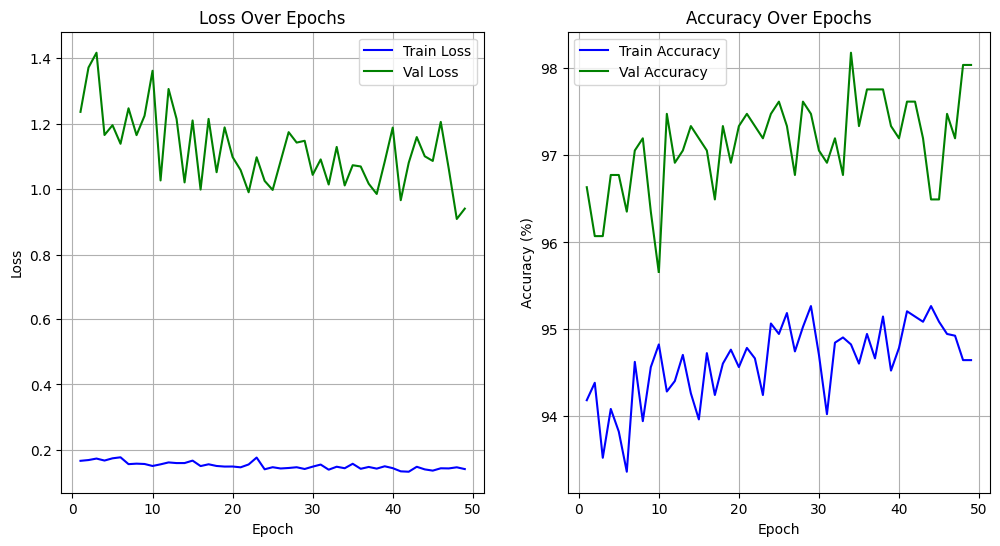

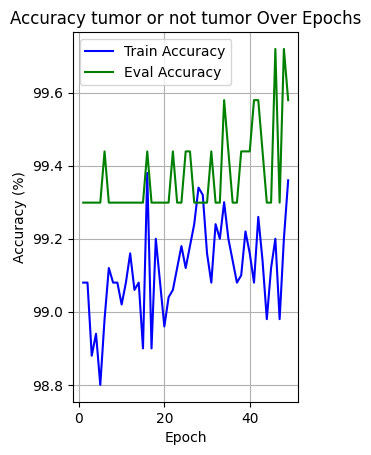

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning y fine tunning con learning rate 0.0001
Actualizamos los pesos del modelo a partir del modelo entrenado con las capas congeladas y learning rate 0,0001
Volvemos a entrenar con las capas descongeladas
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.2864, Training Accuracy: 90.36%, Tumor Accuracy: 97.64% - Validation Loss: 2.5254, Validation Accuracy: 93.83%, Tumor Accuracy: 98.32
		Epoch [2/100] - Training Loss: 0.2825, Training Accuracy: 90.68%, Tumor Accuracy: 97.60% - Validation Loss: 2.5050, Validation Accuracy: 93.69%, Tumor Accuracy: 98.88
		Epoch [3/100] - Training Loss: 0.2913, Training Accuracy: 90.26%, Tumor Accuracy: 97.64% - Validation Loss: 2.4203, Validation Accuracy: 94.39%, Tumor Accuracy: 98.88
		Epoch [4/100] - Training Loss: 0.2798, Training Accuracy: 90.80%, Tumor Accuracy: 97.92% - Validation Loss: 2.4719, Validation Accuracy: 93.97%, Tu

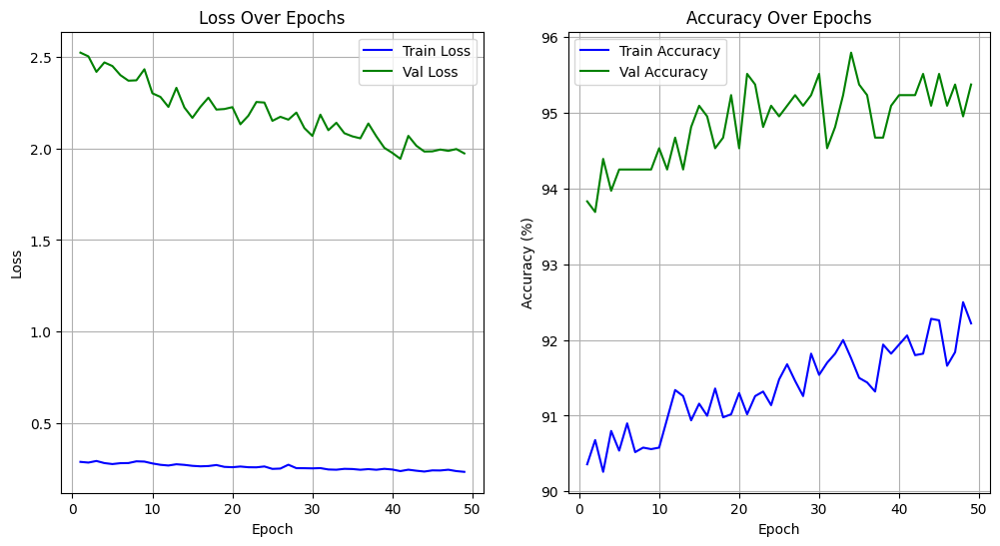

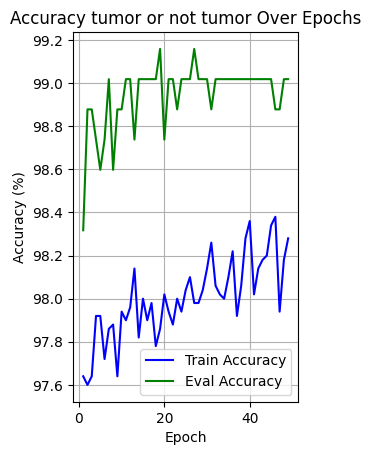

	Proceso de entrenamiento finalizado


In [ ]:
#Entrenamos el grupo de modelos
my_group_trainer.trainer(my_model_group_34_1)

In [ ]:
# Mostramos los resultados obtenidos durante el entrenamiento
plot_group_training_info(my_model_group_34_1)

Evaluamos el modelo con transfer learning con learning rate 0.1
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet34.
			Loss: 2.5344
			Accuracy: 0.8749
			Precision: 0.8825
			Recall: 0.8691
			F1-score: 0.8757

			Accuracy tumor o no tumor: 0.9947
			Precision tumor o no tumor: 0.9915
			Recall tumor o no tumor: 0.9961
			F1-score tumor o no tumor: 0.9938

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.8729
			meningioma: 0.7079
			notumor: 0.982
			pituitary: 0.9672

		Sensibilidad (Recall):
			glioma: 0.87
			meningioma: 0.8791
			notumor: 0.9407
			pituitary: 0.7867

		Puntaje F1 (F1-score):
			glioma: 0.8715
			meningioma: 0.7843
			notumor: 0.9609
			pituitary: 0.8676

		Pérdida por categoría:
			glioma: 0.0583
			meningioma: 0.032
			notumor: 0.024
			pituitary: 0.0858

		Matriz de confusión:


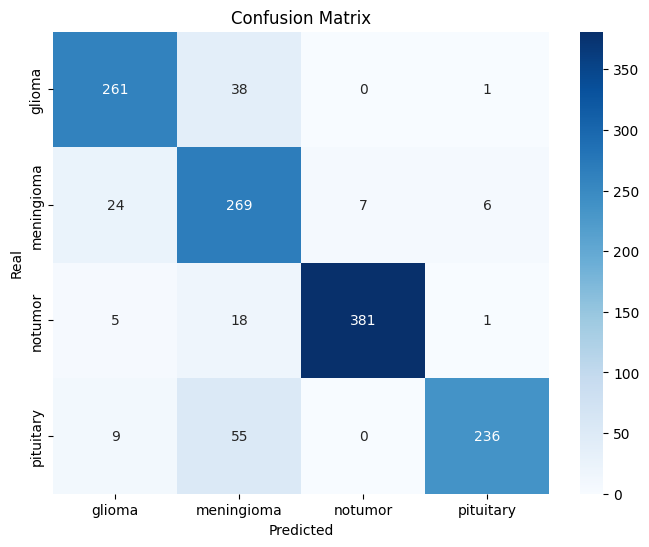

		Matriz de confusión tumor o no tumor:


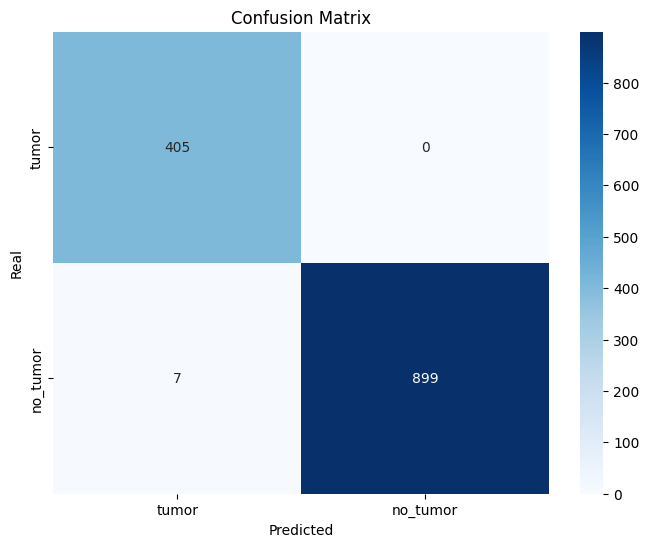

Evaluamos el modelo con transfer learning con learning rate 0.01
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet34.
			Loss: 0.5409
			Accuracy: 0.8650
			Precision: 0.8739
			Recall: 0.8583
			F1-score: 0.8660

			Accuracy tumor o no tumor: 0.9916
			Precision tumor o no tumor: 0.9868
			Recall tumor o no tumor: 0.9939
			F1-score tumor o no tumor: 0.9903

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.761
			meningioma: 0.9558
			notumor: 0.9724
			pituitary: 0.8065

		Sensibilidad (Recall):
			glioma: 0.9233
			meningioma: 0.5654
			notumor: 0.958
			pituitary: 0.9867

		Puntaje F1 (F1-score):
			glioma: 0.8343
			meningioma: 0.7105
			notumor: 0.9652
			pituitary: 0.8876

		Pérdida por categoría:
			glioma: 0.0057
			meningioma: 0.0353
			notumor: 0.0033
			pituitary: 0.0005

		Matriz de confusión:


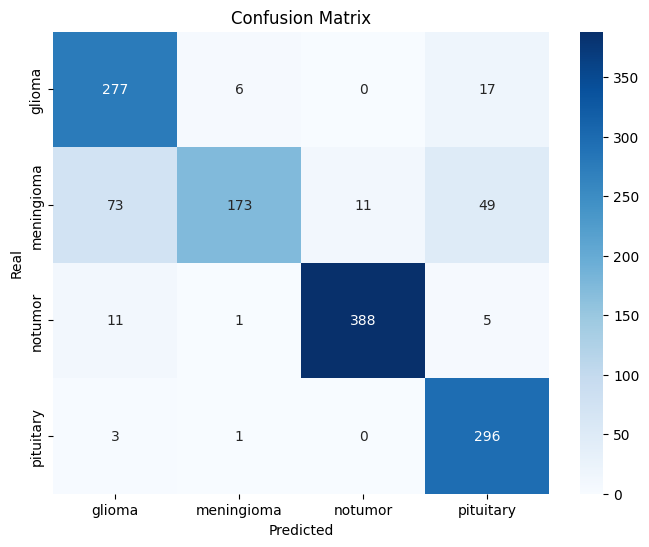

		Matriz de confusión tumor o no tumor:


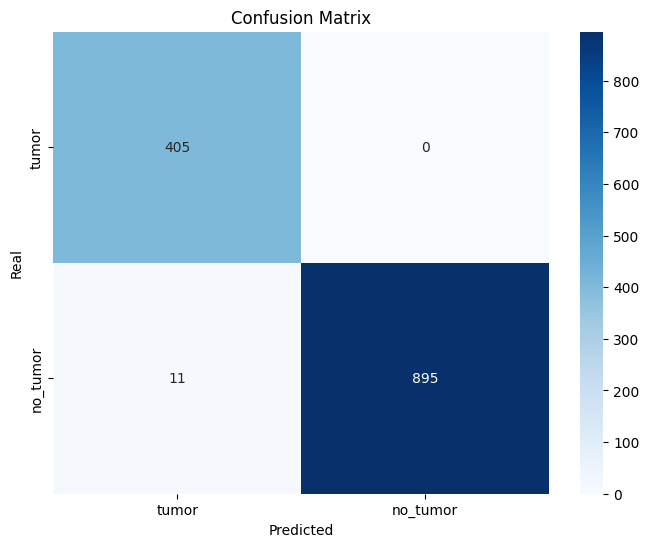

Evaluamos el modelo con transfer learning con learning rate 0.001
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet34.
			Loss: 0.2625
			Accuracy: 0.8970
			Precision: 0.8932
			Recall: 0.8906
			F1-score: 0.8919

			Accuracy tumor o no tumor: 0.9847
			Precision tumor o no tumor: 0.9765
			Recall tumor o no tumor: 0.9890
			F1-score tumor o no tumor: 0.9827

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9185
			meningioma: 0.8045
			notumor: 0.9518
			pituitary: 0.8981

		Sensibilidad (Recall):
			glioma: 0.8267
			meningioma: 0.8203
			notumor: 0.9753
			pituitary: 0.94

		Puntaje F1 (F1-score):
			glioma: 0.8702
			meningioma: 0.8123
			notumor: 0.9634
			pituitary: 0.9186

		Pérdida por categoría:
			glioma: 0.0084
			meningioma: 0.0085
			notumor: 0.0014
			pituitary: 0.003

		Matriz de confusión:


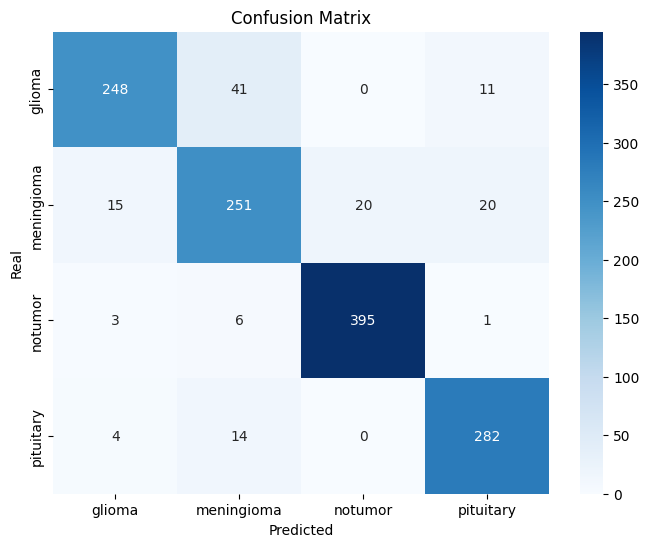

		Matriz de confusión tumor o no tumor:


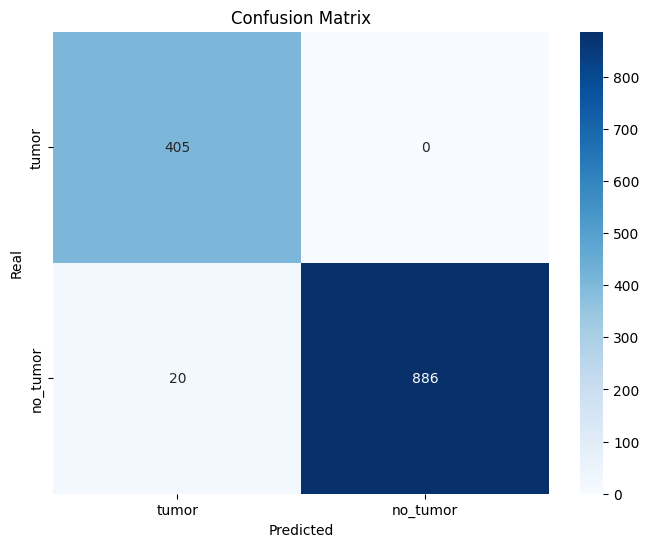

Evaluamos el modelo con transfer learning con learning rate 0.0001
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet34.
			Loss: 0.3903
			Accuracy: 0.8543
			Precision: 0.8507
			Recall: 0.8474
			F1-score: 0.8491

			Accuracy tumor o no tumor: 0.9687
			Precision tumor o no tumor: 0.9540
			Recall tumor o no tumor: 0.9774
			F1-score tumor o no tumor: 0.9656

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.8849
			meningioma: 0.7175
			notumor: 0.9028
			pituitary: 0.8977

		Sensibilidad (Recall):
			glioma: 0.82
			meningioma: 0.7222
			notumor: 0.9407
			pituitary: 0.9067

		Puntaje F1 (F1-score):
			glioma: 0.8512
			meningioma: 0.7199
			notumor: 0.9214
			pituitary: 0.9022

		Pérdida por categoría:
			glioma: 0.0081
			meningioma: 0.0143
			notumor: 0.0037
			pituitary: 0.0058

		Matriz de confusión:


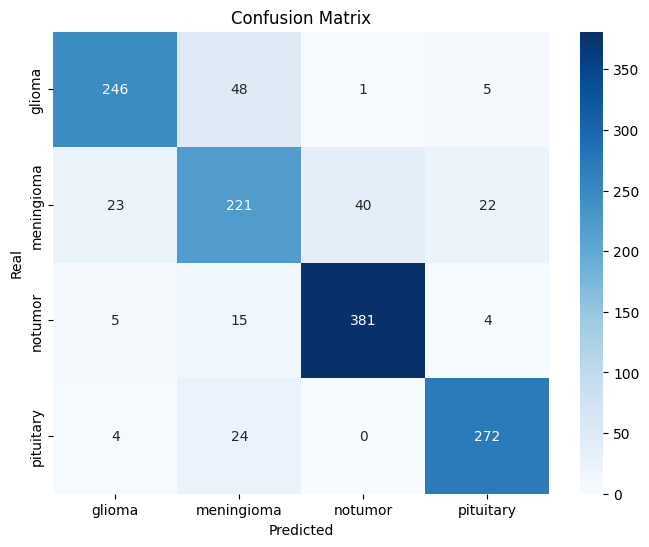

		Matriz de confusión tumor o no tumor:


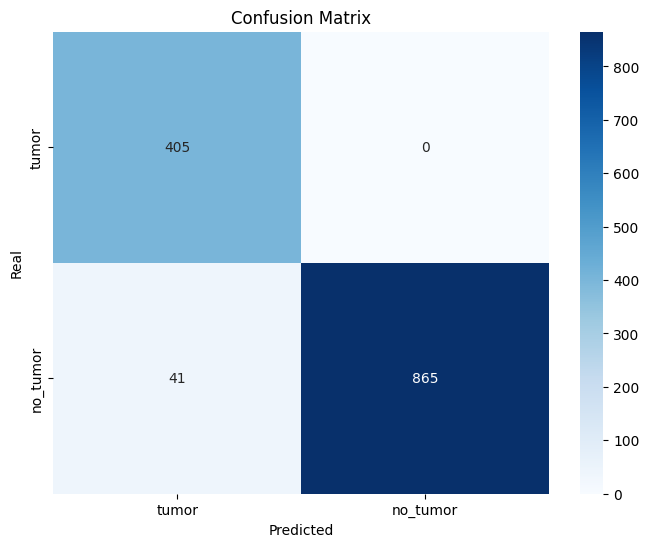

Evaluamos el modelo con fine tunning con learning rate 0.1
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet34.
			Loss: 1.8407
			Accuracy: 0.8970
			Precision: 0.8932
			Recall: 0.8891
			F1-score: 0.8911

			Accuracy tumor o no tumor: 0.9817
			Precision tumor o no tumor: 0.9720
			Recall tumor o no tumor: 0.9868
			F1-score tumor o no tumor: 0.9794

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9228
			meningioma: 0.8072
			notumor: 0.9437
			pituitary: 0.899

		Sensibilidad (Recall):
			glioma: 0.8367
			meningioma: 0.8072
			notumor: 0.9926
			pituitary: 0.92

		Puntaje F1 (F1-score):
			glioma: 0.8776
			meningioma: 0.8072
			notumor: 0.9675
			pituitary: 0.9094

		Pérdida por categoría:
			glioma: 0.0727
			meningioma: 0.0621
			notumor: 0.0015
			pituitary: 0.0152

		Matriz de confusión:


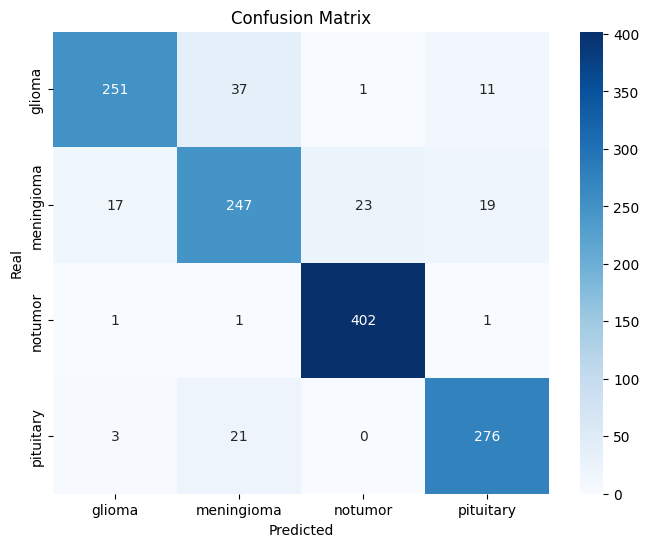

		Matriz de confusión tumor o no tumor:


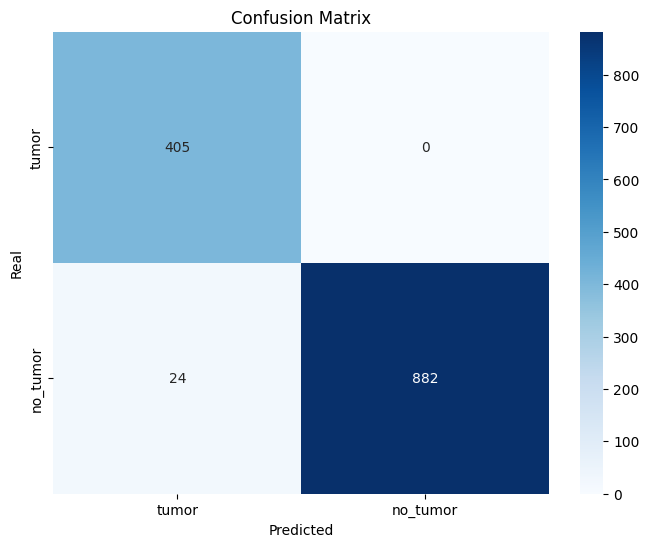

Evaluamos el modelo con fine tunning con learning rate 0.01
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet34.
			Loss: 0.7502
			Accuracy: 0.8131
			Precision: 0.8390
			Recall: 0.8003
			F1-score: 0.8192

			Accuracy tumor o no tumor: 0.9657
			Precision tumor o no tumor: 0.9500
			Recall tumor o no tumor: 0.9752
			F1-score tumor o no tumor: 0.9624

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9097
			meningioma: 0.8984
			notumor: 0.8986
			pituitary: 0.6494

		Sensibilidad (Recall):
			glioma: 0.84
			meningioma: 0.3758
			notumor: 0.9852
			pituitary: 1.0

		Puntaje F1 (F1-score):
			glioma: 0.8735
			meningioma: 0.53
			notumor: 0.9399
			pituitary: 0.7874

		Pérdida por categoría:
			glioma: 0.0136
			meningioma: 0.0489
			notumor: 0.0007
			pituitary: 0.0

		Matriz de confusión:


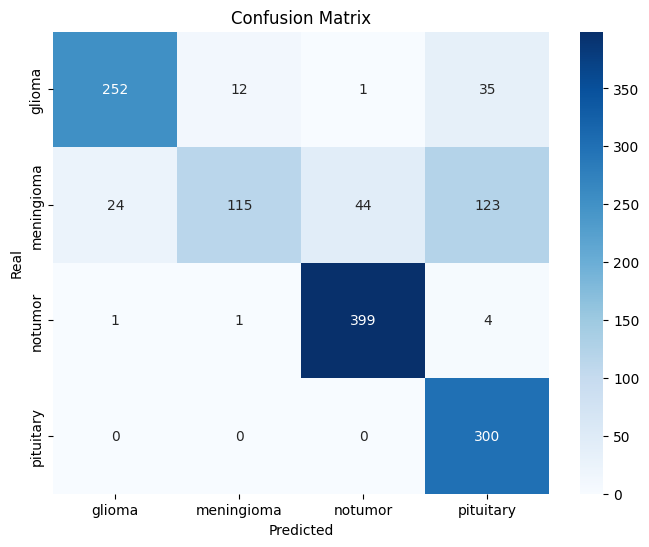

		Matriz de confusión tumor o no tumor:


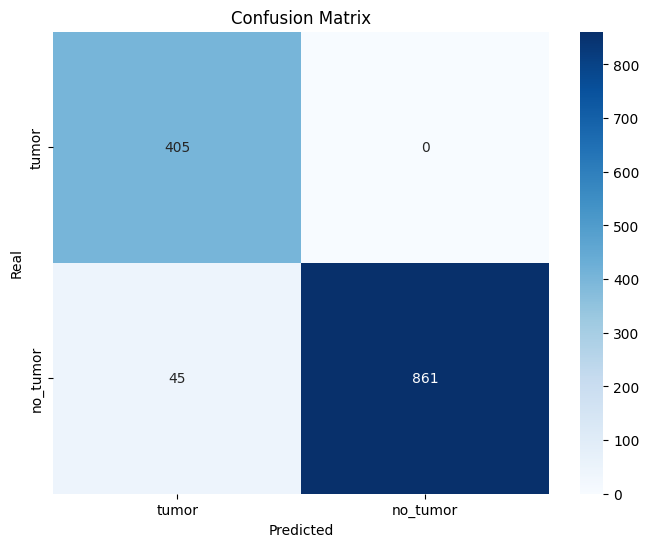

Evaluamos el modelo con fine tunning con learning rate 0.001
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet34.
			Loss: 0.2769
			Accuracy: 0.8947
			Precision: 0.8955
			Recall: 0.8889
			F1-score: 0.8922

			Accuracy tumor o no tumor: 0.9908
			Precision tumor o no tumor: 0.9856
			Recall tumor o no tumor: 0.9934
			F1-score tumor o no tumor: 0.9895

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9182
			meningioma: 0.7564
			notumor: 0.9701
			pituitary: 0.9373

		Sensibilidad (Recall):
			glioma: 0.8233
			meningioma: 0.8725
			notumor: 0.963
			pituitary: 0.8967

		Puntaje F1 (F1-score):
			glioma: 0.8682
			meningioma: 0.8103
			notumor: 0.9665
			pituitary: 0.9165

		Pérdida por categoría:
			glioma: 0.0085
			meningioma: 0.0066
			notumor: 0.002
			pituitary: 0.005

		Matriz de confusión:


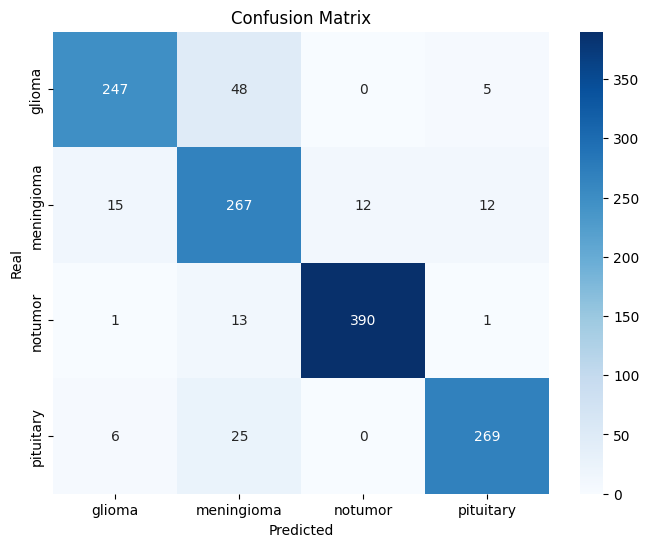

		Matriz de confusión tumor o no tumor:


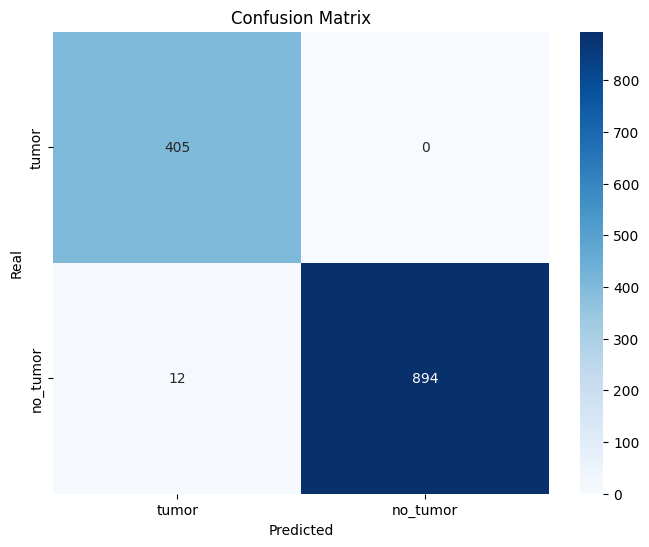

Evaluamos el modelo con fine tunning con learning rate 0.001
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet34.
			Loss: 0.3485
			Accuracy: 0.8749
			Precision: 0.8710
			Recall: 0.8683
			F1-score: 0.8696

			Accuracy tumor o no tumor: 0.9695
			Precision tumor o no tumor: 0.9551
			Recall tumor o no tumor: 0.9779
			F1-score tumor o no tumor: 0.9663

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9065
			meningioma: 0.7785
			notumor: 0.9065
			pituitary: 0.8924

		Sensibilidad (Recall):
			glioma: 0.84
			meningioma: 0.7353
			notumor: 0.958
			pituitary: 0.94

		Puntaje F1 (F1-score):
			glioma: 0.872
			meningioma: 0.7563
			notumor: 0.9316
			pituitary: 0.9156

		Pérdida por categoría:
			glioma: 0.0075
			meningioma: 0.0137
			notumor: 0.0029
			pituitary: 0.0043

		Matriz de confusión:


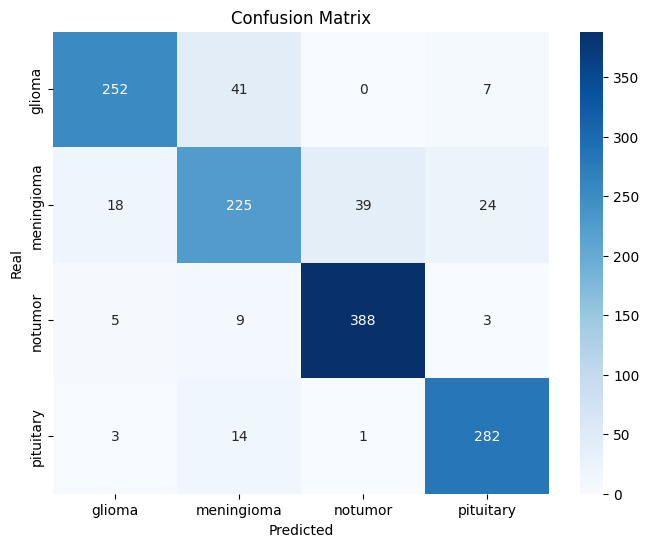

		Matriz de confusión tumor o no tumor:


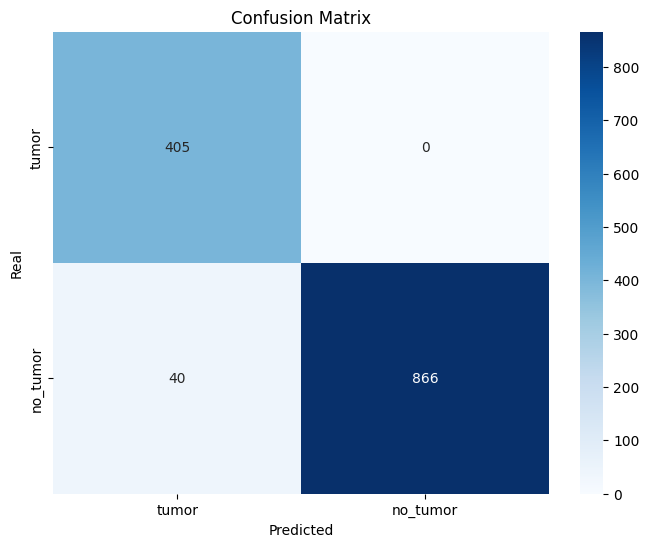

Evaluamos el modelo con transfer learning y fine tunning con learning rate 0.1
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet34.
			Loss: 4.9482
			Accuracy: 0.8734
			Precision: 0.8903
			Recall: 0.8676
			F1-score: 0.8788

			Accuracy tumor o no tumor: 1.0000
			Precision tumor o no tumor: 1.0000
			Recall tumor o no tumor: 1.0000
			F1-score tumor o no tumor: 1.0000

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9761
			meningioma: 0.6892
			notumor: 1.0
			pituitary: 0.8961

		Sensibilidad (Recall):
			glioma: 0.68
			meningioma: 0.9346
			notumor: 0.9358
			pituitary: 0.92

		Puntaje F1 (F1-score):
			glioma: 0.8016
			meningioma: 0.7933
			notumor: 0.9668
			pituitary: 0.9079

		Pérdida por categoría:
			glioma: 0.3002
			meningioma: 0.0287
			notumor: 0.025
			pituitary: 0.0405

		Matriz de confusión:


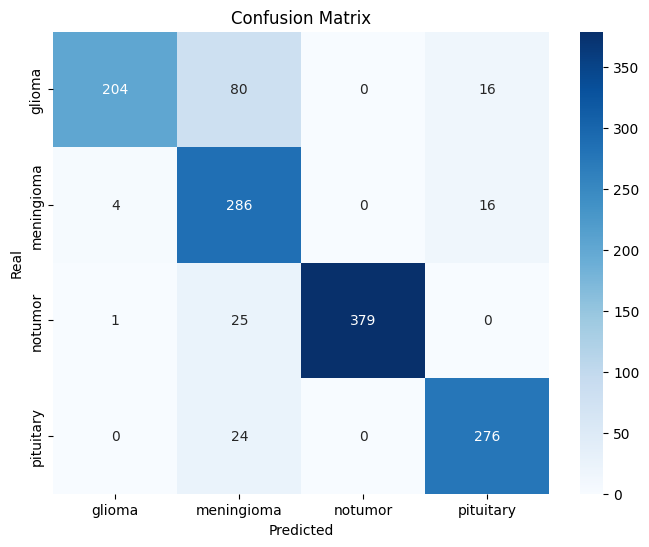

		Matriz de confusión tumor o no tumor:


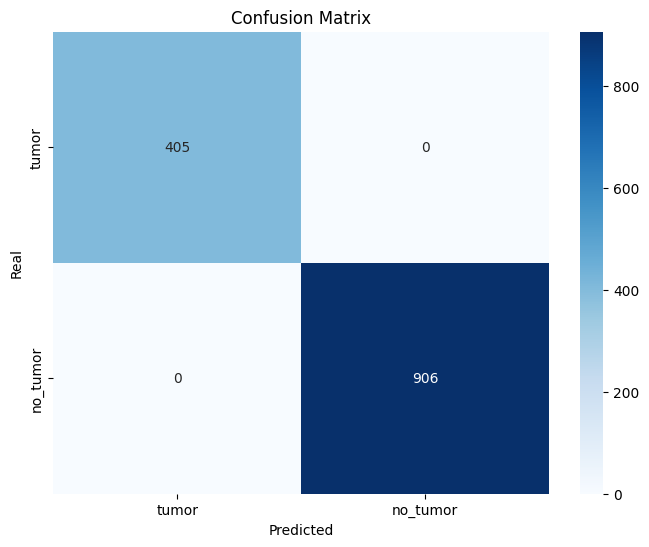

Evaluamos el modelo con transfer learning y fine tunning con learning rate 0.01
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet34.
			Loss: 0.4954
			Accuracy: 0.8856
			Precision: 0.8864
			Recall: 0.8777
			F1-score: 0.8820

			Accuracy tumor o no tumor: 0.9855
			Precision tumor o no tumor: 0.9776
			Recall tumor o no tumor: 0.9895
			F1-score tumor o no tumor: 0.9835

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9137
			meningioma: 0.8932
			notumor: 0.9547
			pituitary: 0.7842

		Sensibilidad (Recall):
			glioma: 0.8467
			meningioma: 0.683
			notumor: 0.9877
			pituitary: 0.9933

		Puntaje F1 (F1-score):
			glioma: 0.8789
			meningioma: 0.7741
			notumor: 0.9709
			pituitary: 0.8765

		Pérdida por categoría:
			glioma: 0.0139
			meningioma: 0.0263
			notumor: 0.001
			pituitary: 0.0003

		Matriz de confusión:


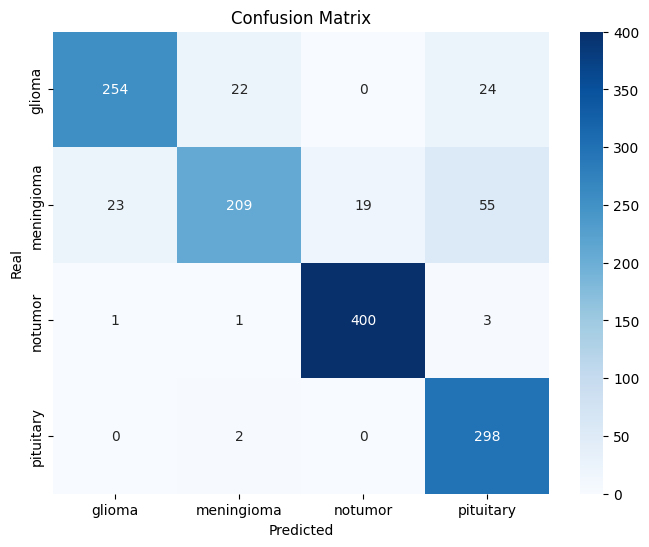

		Matriz de confusión tumor o no tumor:


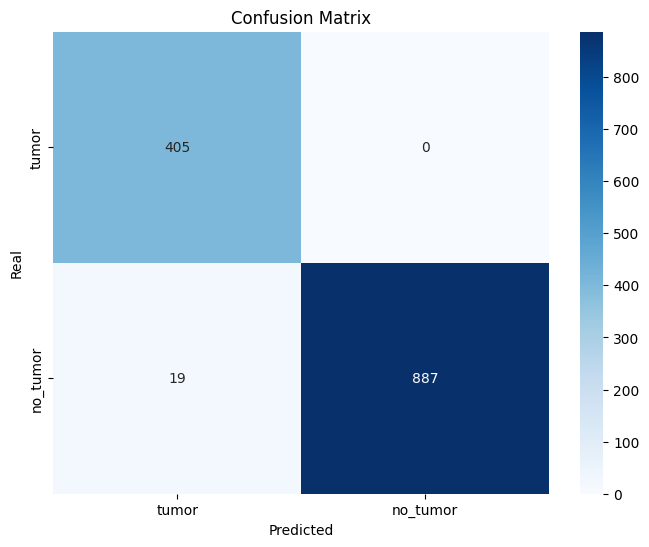

Evaluamos el modelo con transfer learning y fine tunning con learning rate 0.001
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet34.
			Loss: 0.2481
			Accuracy: 0.9085
			Precision: 0.9040
			Recall: 0.9024
			F1-score: 0.9032

			Accuracy tumor o no tumor: 0.9939
			Precision tumor o no tumor: 0.9903
			Recall tumor o no tumor: 0.9956
			F1-score tumor o no tumor: 0.9930

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9088
			meningioma: 0.8142
			notumor: 0.9802
			pituitary: 0.9126

		Sensibilidad (Recall):
			glioma: 0.83
			meningioma: 0.8595
			notumor: 0.9802
			pituitary: 0.94

		Puntaje F1 (F1-score):
			glioma: 0.8676
			meningioma: 0.8362
			notumor: 0.9802
			pituitary: 0.9261

		Pérdida por categoría:
			glioma: 0.0084
			meningioma: 0.0071
			notumor: 0.0017
			pituitary: 0.003

		Matriz de confusión:


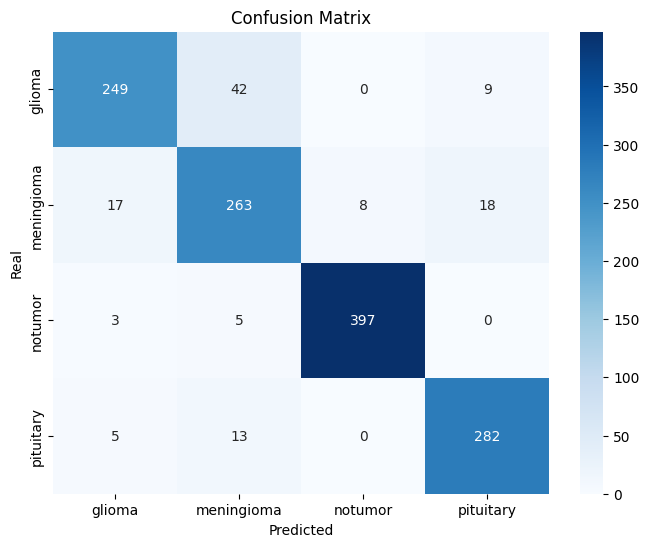

		Matriz de confusión tumor o no tumor:


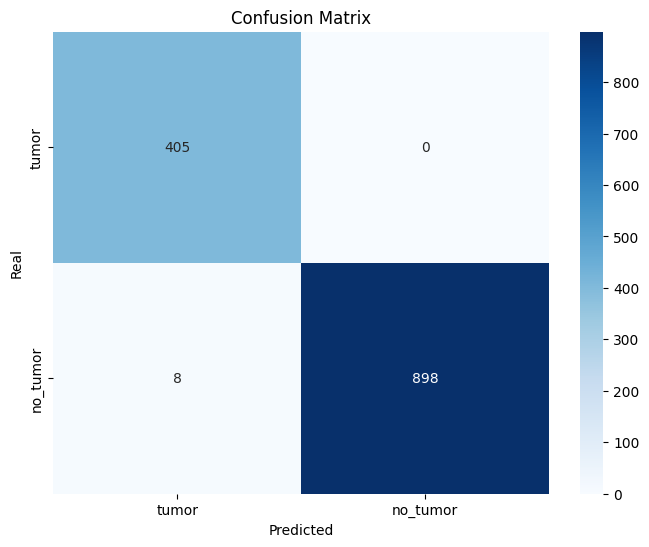

Evaluamos el modelo con transfer learning y fine tunning con learning rate 0.0001
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet34.
			Loss: 0.3366
			Accuracy: 0.8757
			Precision: 0.8699
			Recall: 0.8702
			F1-score: 0.8700

			Accuracy tumor o no tumor: 0.9771
			Precision tumor o no tumor: 0.9655
			Recall tumor o no tumor: 0.9834
			F1-score tumor o no tumor: 0.9744

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.8846
			meningioma: 0.7902
			notumor: 0.9274
			pituitary: 0.8773

		Sensibilidad (Recall):
			glioma: 0.8433
			meningioma: 0.7386
			notumor: 0.9457
			pituitary: 0.9533

		Puntaje F1 (F1-score):
			glioma: 0.8635
			meningioma: 0.7635
			notumor: 0.9364
			pituitary: 0.9137

		Pérdida por categoría:
			glioma: 0.007
			meningioma: 0.0129
			notumor: 0.0036
			pituitary: 0.0036

		Matriz de confusión:


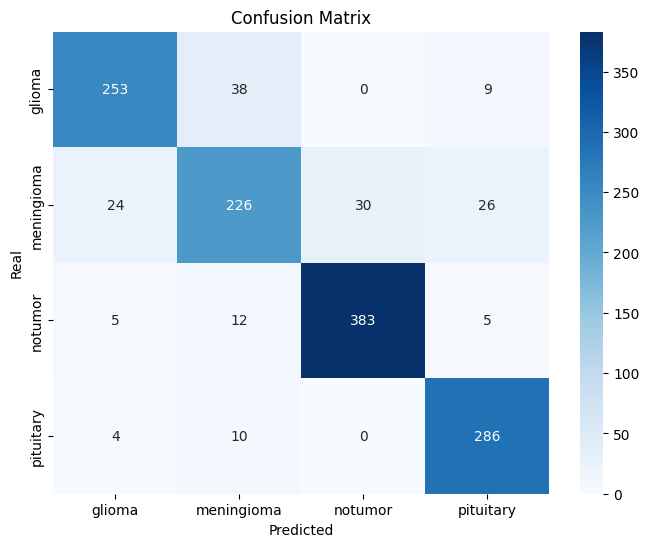

		Matriz de confusión tumor o no tumor:


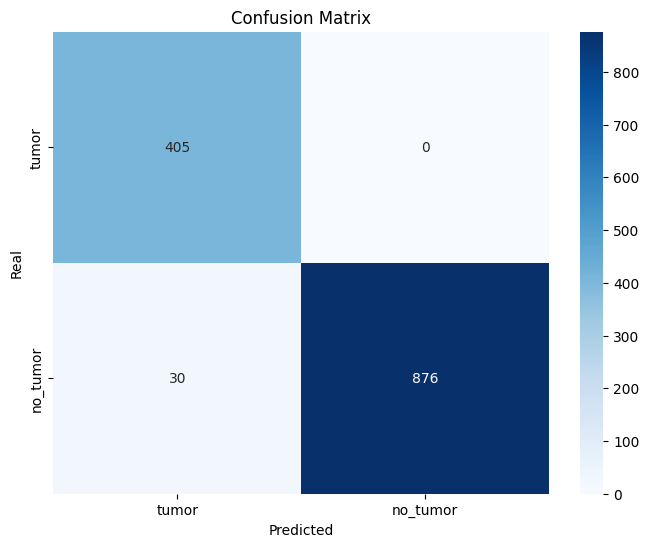

In [ ]:
#Evaluamos los resultados del grupo
my_group_evaluator.eval(my_dataset.test_loader, my_model_group_34_1)

In [ ]:
# Creamos una inteligencia compartida
min_accuracy_value = 0.85
my_model_group_34_1.create_shared_model(min_accuracy_value)

Número de modelos que cumplen con la condición: 11


	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet34.
			Loss: 0.7232
			Accuracy: 0.9001
			Precision: 0.9003
			Recall: 0.8944
			F1-score: 0.8973

			Accuracy tumor o no tumor: 0.9962
			Precision tumor o no tumor: 0.9939
			Recall tumor o no tumor: 0.9972
			F1-score tumor o no tumor: 0.9955

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9272
			meningioma: 0.7675
			notumor: 0.9874
			pituitary: 0.9192

		Sensibilidad (Recall):
			glioma: 0.8067
			meningioma: 0.8954
			notumor: 0.9654
			pituitary: 0.91

		Puntaje F1 (F1-score):
			glioma: 0.8627
			meningioma: 0.8265
			notumor: 0.9763
			pituitary: 0.9146

		Pérdida por categoría:
			glioma: 0.035
			meningioma: 0.0116
			notumor: 0.003
			pituitary: 0.0087

		Matriz de confusión:


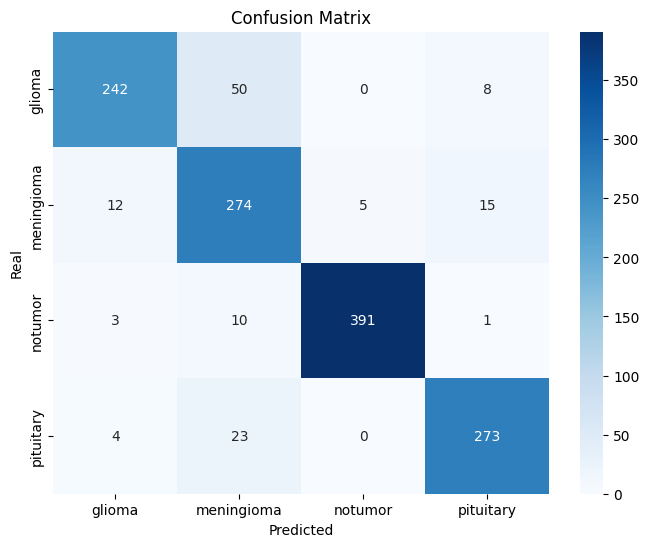

		Matriz de confusión tumor o no tumor:


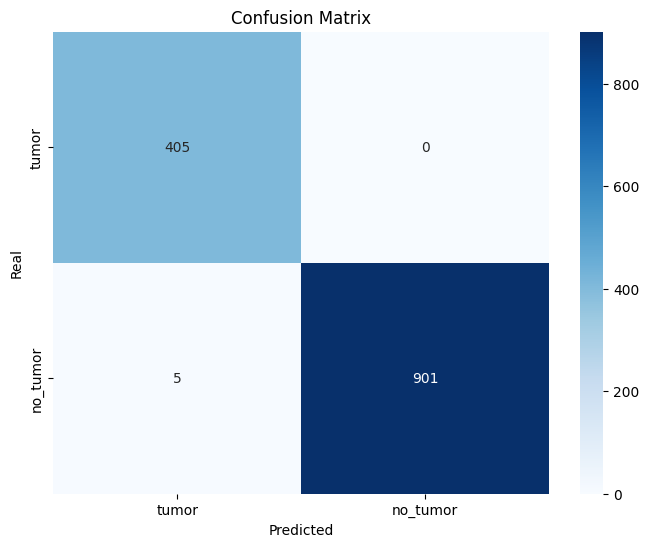

In [ ]:
# Comprobamos el rendimiento de la inteligencia compartida
evaluate(my_model_group_34_1.shared_model, my_dataset.test_loader, my_dataset.no_tumor_label_position)

In [ ]:
#guardado de todo un grupo

save_group_model(my_model_group_34_1)

Guardando los modelos con Transfer Learning.
Guardando los modelos con Fine Tunning.
Guardando los modelos con Transfer Learning y Fine Tunning.
Guardando la intenligencia compartida
Comprimiendo la carpeta con los modelos y subiendo al drive
proceso de guardado finalizado


## Resnet 50


In [ ]:
# Creamos el grupo de modelos
model_name = "resnet50"

my_model_group_50_1 = MyResnetGroupModel(model_name, my_dataset.num_classes)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 179MB/s]


Entrenando el modelo con transfer learning con learning rate 0.1
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 1.3371, Training Accuracy: 80.54%, Tumor Accuracy: 95.48% - Validation Loss: 4.9616, Validation Accuracy: 92.15%, Tumor Accuracy: 98.88
		Epoch [2/100] - Training Loss: 0.6830, Training Accuracy: 89.58%, Tumor Accuracy: 98.24% - Validation Loss: 13.7931, Validation Accuracy: 87.52%, Tumor Accuracy: 97.76
		Epoch [3/100] - Training Loss: 0.4710, Training Accuracy: 91.94%, Tumor Accuracy: 98.38% - Validation Loss: 5.1656, Validation Accuracy: 92.43%, Tumor Accuracy: 98.46
		Epoch [4/100] - Training Loss: 0.4635, Training Accuracy: 91.86%, Tumor Accuracy: 98.84% - Validation Loss: 4.4035, Validation Accuracy: 95.23%, Tumor Accuracy: 98.18
		Epoch [5/100] - Training Loss: 0.8510, Training Accuracy: 89.78%, Tumor Accuracy: 97.70% - Validation Loss: 5.0975, Validation Accuracy: 95.37%, Tumor Accuracy: 99.16
		Epoch [6/100] - Trainin

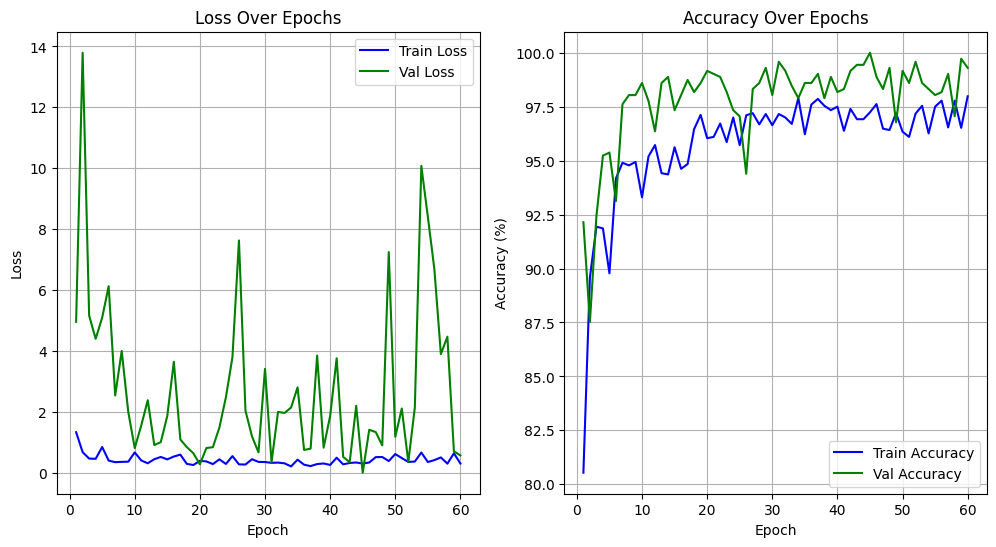

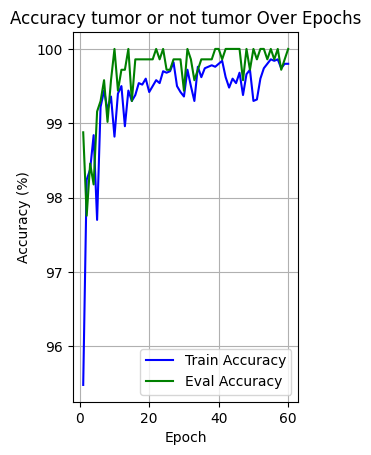

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning con learning rate 0.01
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.4269, Training Accuracy: 84.98%, Tumor Accuracy: 96.94% - Validation Loss: 2.5518, Validation Accuracy: 94.11%, Tumor Accuracy: 99.02
		Epoch [2/100] - Training Loss: 0.2608, Training Accuracy: 90.30%, Tumor Accuracy: 98.50% - Validation Loss: 1.7983, Validation Accuracy: 96.35%, Tumor Accuracy: 98.88
		Epoch [3/100] - Training Loss: 0.1784, Training Accuracy: 93.82%, Tumor Accuracy: 98.94% - Validation Loss: 1.2797, Validation Accuracy: 98.04%, Tumor Accuracy: 99.02
		Epoch [4/100] - Training Loss: 0.1445, Training Accuracy: 95.24%, Tumor Accuracy: 99.30% - Validation Loss: 1.3649, Validation Accuracy: 96.63%, Tumor Accuracy: 99.30
		Epoch [5/100] - Training Loss: 0.1223, Training Accuracy: 96.12%, Tumor Accuracy: 99.58% - Validation Loss: 1.3149, Validation Accuracy: 98.04%, Tumor Accu

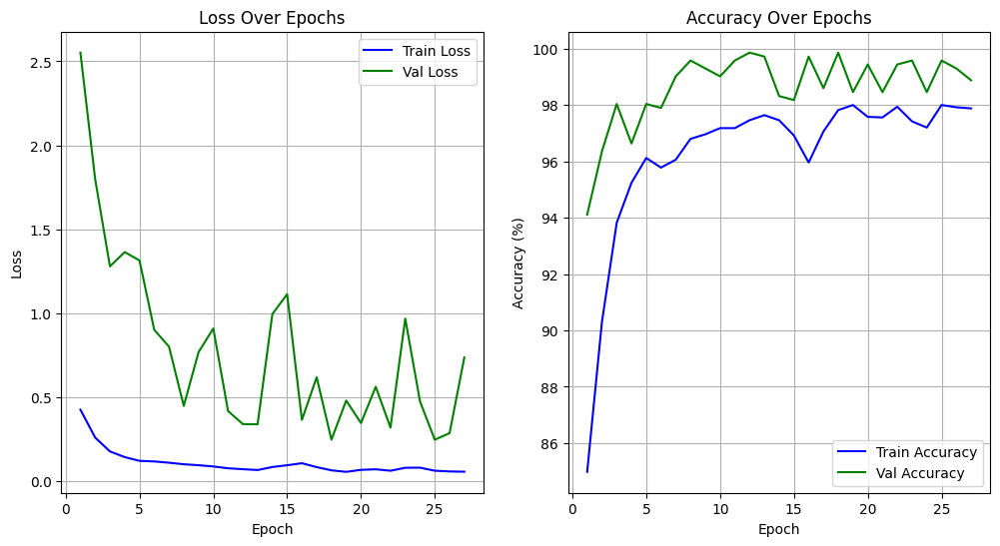

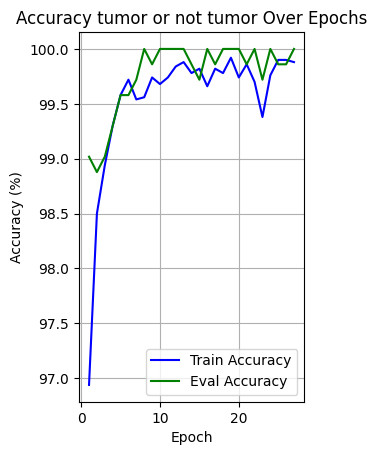

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning con learning rate 0.001
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.7966, Training Accuracy: 77.92%, Tumor Accuracy: 93.00% - Validation Loss: 6.1744, Validation Accuracy: 90.88%, Tumor Accuracy: 98.32
		Epoch [2/100] - Training Loss: 0.4524, Training Accuracy: 87.32%, Tumor Accuracy: 97.18% - Validation Loss: 4.1639, Validation Accuracy: 93.41%, Tumor Accuracy: 98.74
		Epoch [3/100] - Training Loss: 0.3727, Training Accuracy: 89.74%, Tumor Accuracy: 97.82% - Validation Loss: 3.2267, Validation Accuracy: 95.79%, Tumor Accuracy: 99.16
		Epoch [4/100] - Training Loss: 0.3265, Training Accuracy: 90.82%, Tumor Accuracy: 97.96% - Validation Loss: 3.0628, Validation Accuracy: 95.23%, Tumor Accuracy: 99.02
		Epoch [5/100] - Training Loss: 0.2881, Training Accuracy: 91.34%, Tumor Accuracy: 98.32% - Validation Loss: 3.4901, Validation Accuracy: 92.71%, Tumor Acc

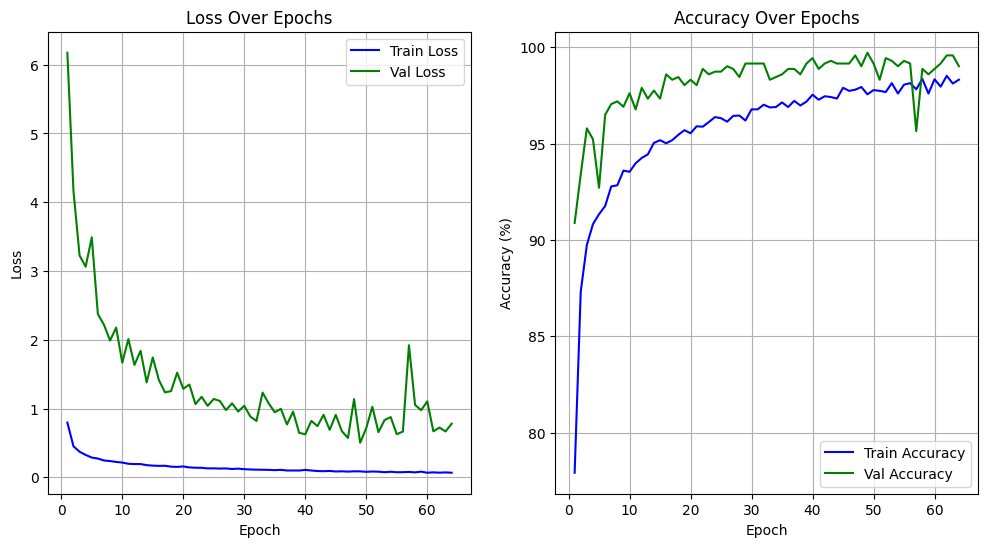

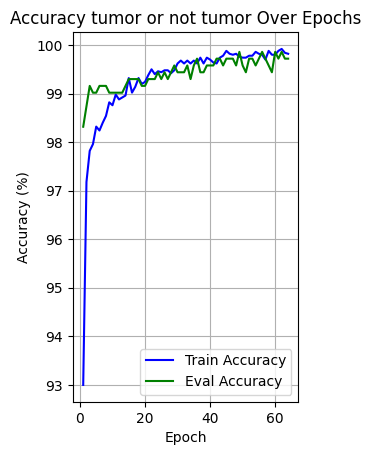

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning con learning rate 0.0001
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 1.2833, Training Accuracy: 54.75%, Tumor Accuracy: 82.88% - Validation Loss: 13.9866, Validation Accuracy: 74.89%, Tumor Accuracy: 88.50
		Epoch [2/100] - Training Loss: 1.0850, Training Accuracy: 77.30%, Tumor Accuracy: 92.58% - Validation Loss: 11.6566, Validation Accuracy: 86.26%, Tumor Accuracy: 95.79
		Epoch [3/100] - Training Loss: 0.9444, Training Accuracy: 80.34%, Tumor Accuracy: 94.54% - Validation Loss: 11.1401, Validation Accuracy: 87.66%, Tumor Accuracy: 96.35
		Epoch [4/100] - Training Loss: 0.8392, Training Accuracy: 82.60%, Tumor Accuracy: 95.62% - Validation Loss: 9.1018, Validation Accuracy: 90.60%, Tumor Accuracy: 96.63
		Epoch [5/100] - Training Loss: 0.7572, Training Accuracy: 84.44%, Tumor Accuracy: 96.30% - Validation Loss: 8.4775, Validation Accuracy: 90.04%, Tumor

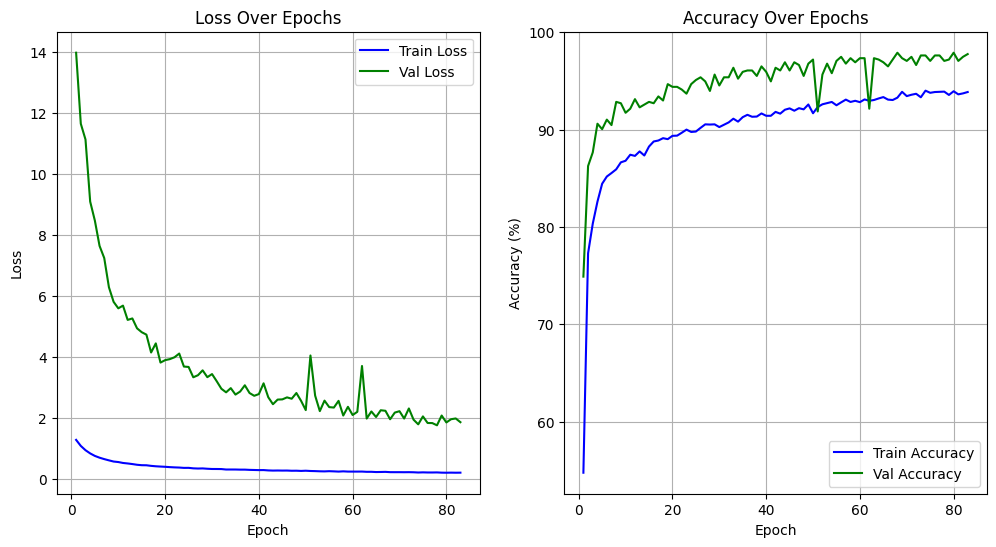

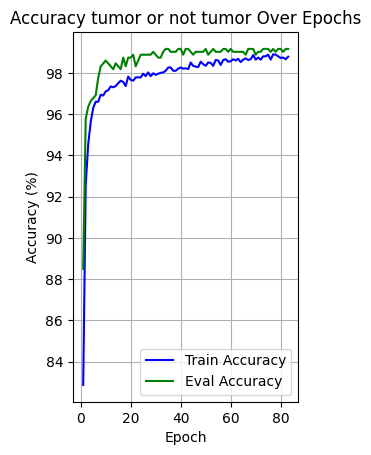

	Proceso de entrenamiento finalizado
Entrenando el modelo con fine tunning con learning rate 0.1
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 1.4305, Training Accuracy: 80.94%, Tumor Accuracy: 96.10% - Validation Loss: 5.5947, Validation Accuracy: 89.34%, Tumor Accuracy: 98.32
		Epoch [2/100] - Training Loss: 0.6405, Training Accuracy: 89.28%, Tumor Accuracy: 97.98% - Validation Loss: 2.4545, Validation Accuracy: 94.39%, Tumor Accuracy: 98.74
		Epoch [3/100] - Training Loss: 0.4181, Training Accuracy: 92.38%, Tumor Accuracy: 98.70% - Validation Loss: 1.5901, Validation Accuracy: 96.49%, Tumor Accuracy: 99.16
		Epoch [4/100] - Training Loss: 0.4108, Training Accuracy: 92.66%, Tumor Accuracy: 98.82% - Validation Loss: 3.0326, Validation Accuracy: 94.53%, Tumor Accuracy: 96.49
		Epoch [5/100] - Training Loss: 0.5442, Training Accuracy: 92.30%, Tumor Accuracy: 98.54% - Validation Loss: 3.5636, Validation Accuracy: 96.21%, Tumor Accuracy: 

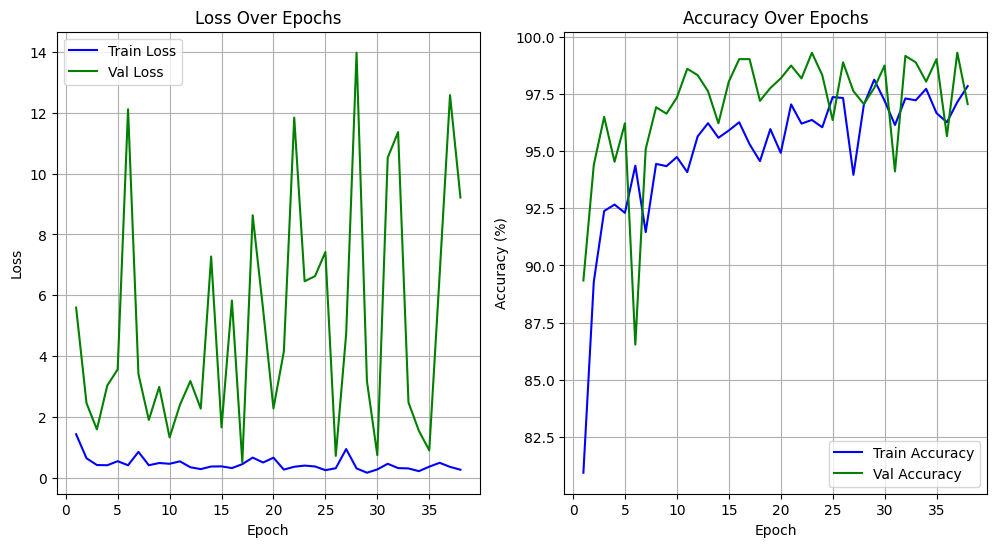

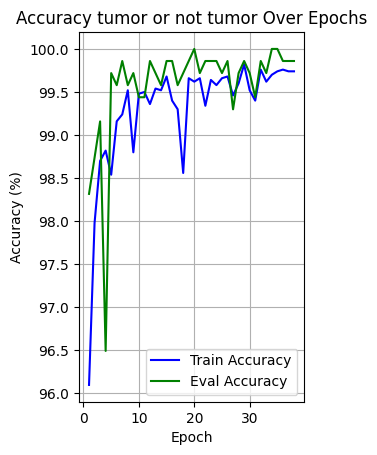

	Proceso de entrenamiento finalizado
Entrenando el modelo con fine tunning con learning rate 0.01
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.4116, Training Accuracy: 85.04%, Tumor Accuracy: 96.04% - Validation Loss: 2.3885, Validation Accuracy: 94.53%, Tumor Accuracy: 98.74
		Epoch [2/100] - Training Loss: 0.2277, Training Accuracy: 92.34%, Tumor Accuracy: 98.66% - Validation Loss: 1.2460, Validation Accuracy: 98.46%, Tumor Accuracy: 99.44
		Epoch [3/100] - Training Loss: 0.2122, Training Accuracy: 92.52%, Tumor Accuracy: 98.92% - Validation Loss: 1.0344, Validation Accuracy: 98.18%, Tumor Accuracy: 99.72
		Epoch [4/100] - Training Loss: 0.1536, Training Accuracy: 94.60%, Tumor Accuracy: 99.30% - Validation Loss: 1.5571, Validation Accuracy: 97.05%, Tumor Accuracy: 99.30
		Epoch [5/100] - Training Loss: 0.1382, Training Accuracy: 95.46%, Tumor Accuracy: 99.38% - Validation Loss: 0.8407, Validation Accuracy: 97.48%, Tumor Accuracy:

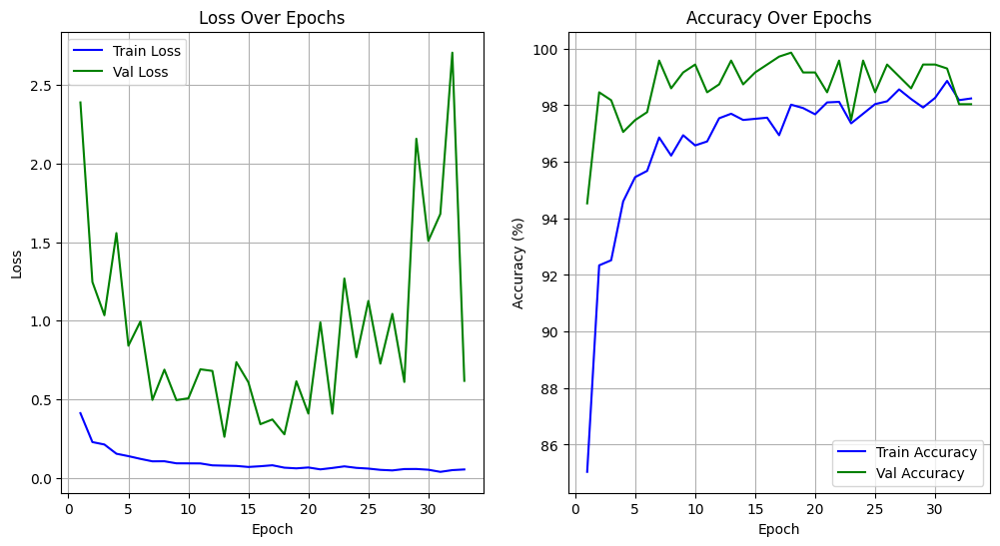

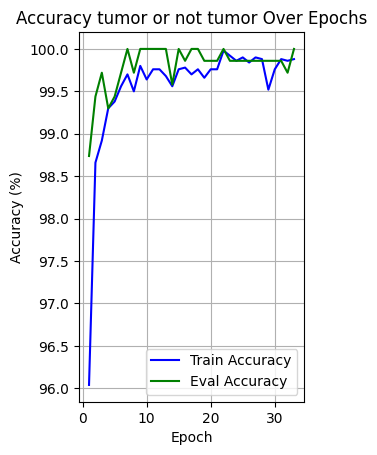

	Proceso de entrenamiento finalizado
Entrenando el modelo con fine tunning con learning rate 0.001
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.7945, Training Accuracy: 77.66%, Tumor Accuracy: 91.42% - Validation Loss: 6.6131, Validation Accuracy: 88.64%, Tumor Accuracy: 98.04
		Epoch [2/100] - Training Loss: 0.4494, Training Accuracy: 87.94%, Tumor Accuracy: 97.22% - Validation Loss: 3.9666, Validation Accuracy: 93.69%, Tumor Accuracy: 98.60
		Epoch [3/100] - Training Loss: 0.3626, Training Accuracy: 89.48%, Tumor Accuracy: 97.76% - Validation Loss: 3.4947, Validation Accuracy: 93.83%, Tumor Accuracy: 98.60
		Epoch [4/100] - Training Loss: 0.3212, Training Accuracy: 90.78%, Tumor Accuracy: 98.10% - Validation Loss: 2.9204, Validation Accuracy: 95.23%, Tumor Accuracy: 98.88
		Epoch [5/100] - Training Loss: 0.2937, Training Accuracy: 91.34%, Tumor Accuracy: 98.24% - Validation Loss: 2.5218, Validation Accuracy: 96.35%, Tumor Accuracy

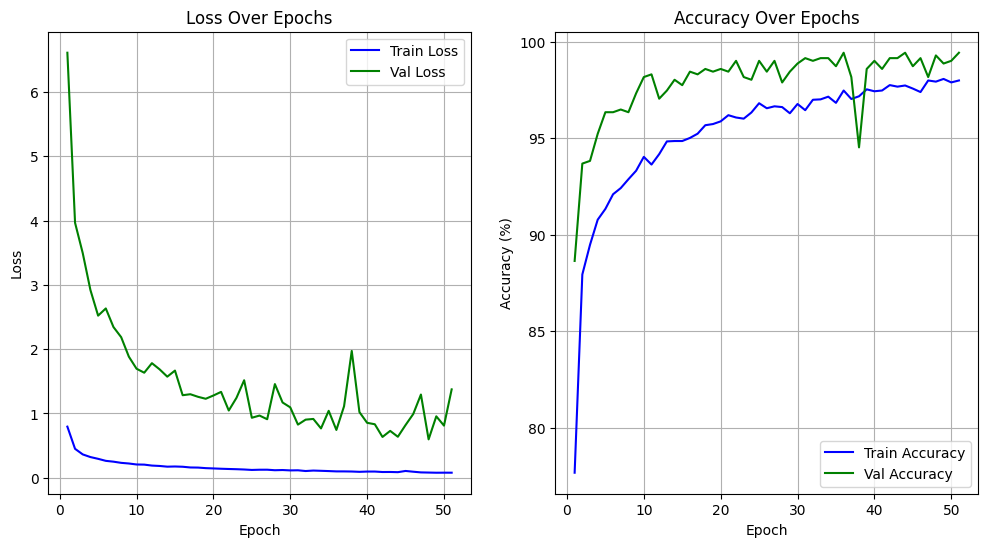

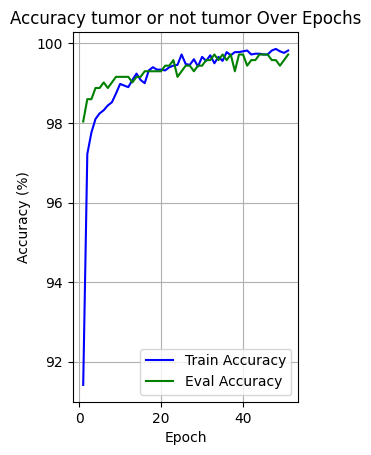

	Proceso de entrenamiento finalizado
Entrenando el modelo con fine tunning con learning rate 0.001
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 1.2536, Training Accuracy: 61.45%, Tumor Accuracy: 85.74% - Validation Loss: 13.7379, Validation Accuracy: 79.52%, Tumor Accuracy: 90.04
		Epoch [2/100] - Training Loss: 1.0676, Training Accuracy: 76.24%, Tumor Accuracy: 92.86% - Validation Loss: 11.6078, Validation Accuracy: 87.24%, Tumor Accuracy: 95.23
		Epoch [3/100] - Training Loss: 0.9262, Training Accuracy: 82.06%, Tumor Accuracy: 95.16% - Validation Loss: 10.2483, Validation Accuracy: 90.04%, Tumor Accuracy: 96.91
		Epoch [4/100] - Training Loss: 0.8304, Training Accuracy: 83.26%, Tumor Accuracy: 95.62% - Validation Loss: 8.8936, Validation Accuracy: 90.18%, Tumor Accuracy: 95.79
		Epoch [5/100] - Training Loss: 0.7560, Training Accuracy: 84.68%, Tumor Accuracy: 96.32% - Validation Loss: 8.0475, Validation Accuracy: 92.71%, Tumor Accur

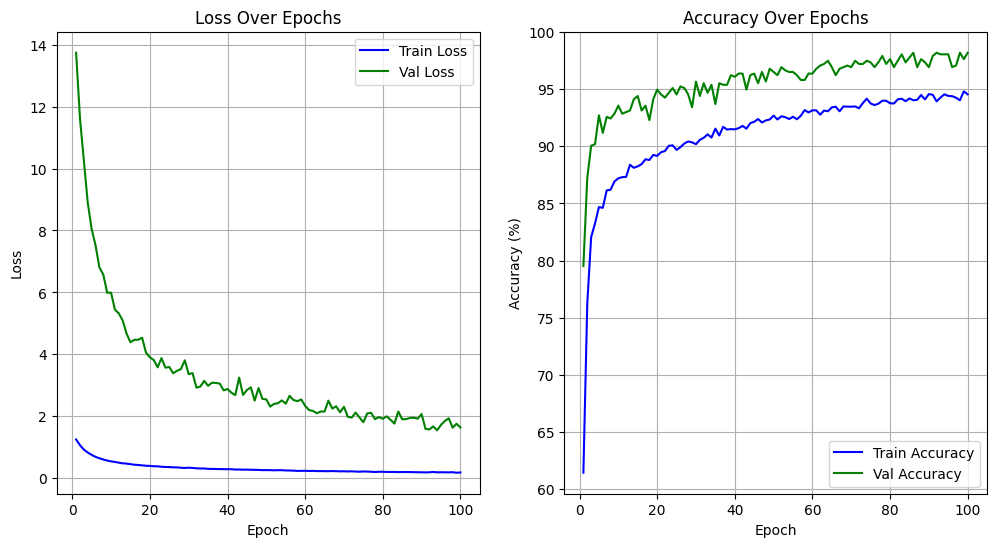

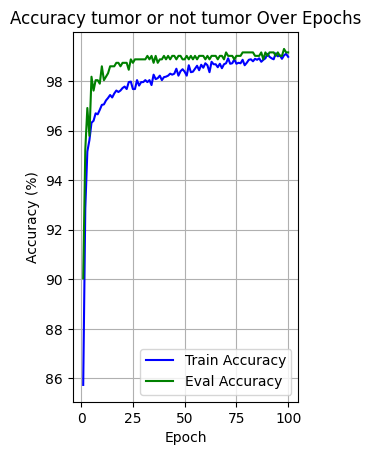

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning y fine tunning con learning rate 0.1
Actualizamos los pesos del modelo a partir del modelo entrenado con las capas congeladas y learning rate 0,1
Volvemos a entrenar con las capas descongeladas
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.4892, Training Accuracy: 96.74%, Tumor Accuracy: 99.58% - Validation Loss: 0.1366, Validation Accuracy: 99.58%, Tumor Accuracy: 99.86
		Epoch [2/100] - Training Loss: 0.3242, Training Accuracy: 97.82%, Tumor Accuracy: 99.72% - Validation Loss: 2.3417, Validation Accuracy: 99.02%, Tumor Accuracy: 99.86
		Epoch [3/100] - Training Loss: 0.3711, Training Accuracy: 97.66%, Tumor Accuracy: 99.82% - Validation Loss: 0.5865, Validation Accuracy: 99.58%, Tumor Accuracy: 100.00
		Epoch [4/100] - Training Loss: 0.3417, Training Accuracy: 97.70%, Tumor Accuracy: 99.86% - Validation Loss: 1.5416, Validation Accuracy: 99.02%, Tumor A

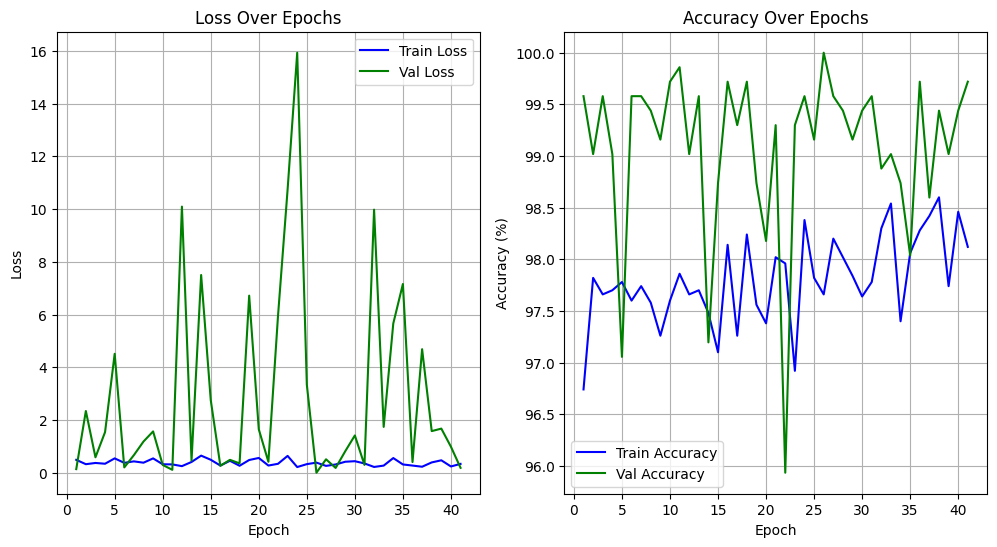

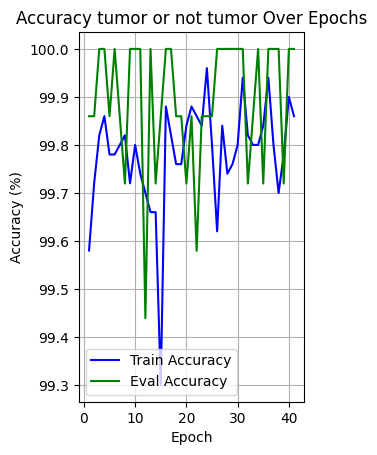

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning y fine tunning con learning rate 0.01
Actualizamos los pesos del modelo a partir del modelo entrenado con las capas congeladas y learning rate 0,01
Volvemos a entrenar con las capas descongeladas
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.0587, Training Accuracy: 97.84%, Tumor Accuracy: 99.72% - Validation Loss: 0.2264, Validation Accuracy: 99.72%, Tumor Accuracy: 99.86
		Epoch [2/100] - Training Loss: 0.0475, Training Accuracy: 98.26%, Tumor Accuracy: 99.82% - Validation Loss: 0.3794, Validation Accuracy: 98.74%, Tumor Accuracy: 100.00
		Epoch [3/100] - Training Loss: 0.0666, Training Accuracy: 97.74%, Tumor Accuracy: 99.78% - Validation Loss: 0.3855, Validation Accuracy: 98.88%, Tumor Accuracy: 100.00
		Epoch [4/100] - Training Loss: 0.0654, Training Accuracy: 97.68%, Tumor Accuracy: 99.78% - Validation Loss: 0.2114, Validation Accuracy: 99.58%, Tumo

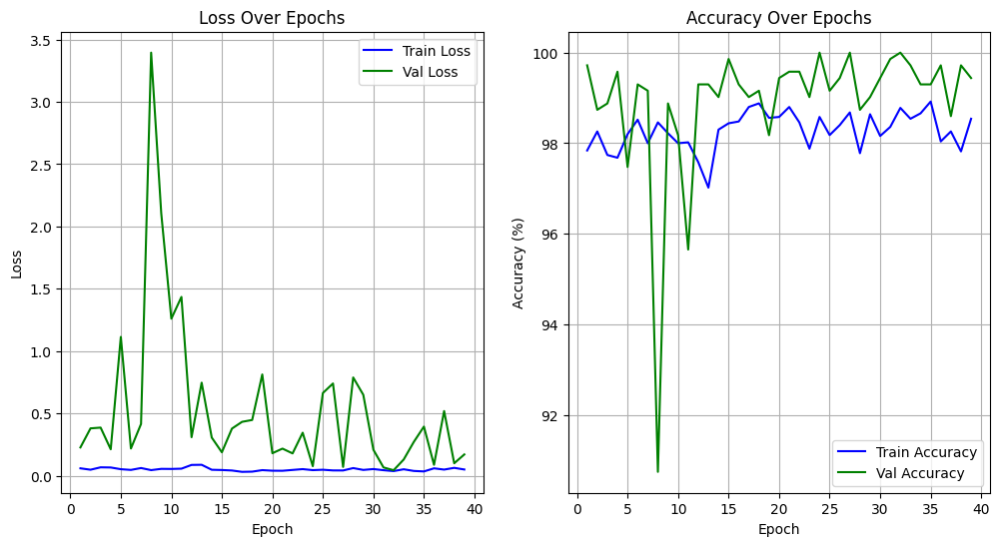

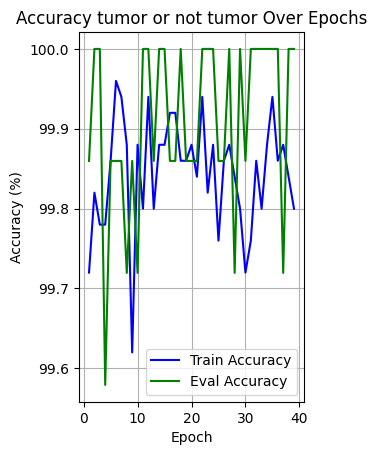

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning y fine tunning con learning rate 0.001
Actualizamos los pesos del modelo a partir del modelo entrenado con las capas congeladas y learning rate 0,001
Volvemos a entrenar con las capas descongeladas
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.0762, Training Accuracy: 97.84%, Tumor Accuracy: 99.78% - Validation Loss: 0.5369, Validation Accuracy: 99.58%, Tumor Accuracy: 99.72
		Epoch [2/100] - Training Loss: 0.0689, Training Accuracy: 98.04%, Tumor Accuracy: 99.76% - Validation Loss: 0.4901, Validation Accuracy: 99.72%, Tumor Accuracy: 99.86
		Epoch [3/100] - Training Loss: 0.0714, Training Accuracy: 98.16%, Tumor Accuracy: 99.90% - Validation Loss: 1.1023, Validation Accuracy: 98.18%, Tumor Accuracy: 99.72
		Epoch [4/100] - Training Loss: 0.0673, Training Accuracy: 98.30%, Tumor Accuracy: 99.76% - Validation Loss: 1.1778, Validation Accuracy: 99.44%, Tumo

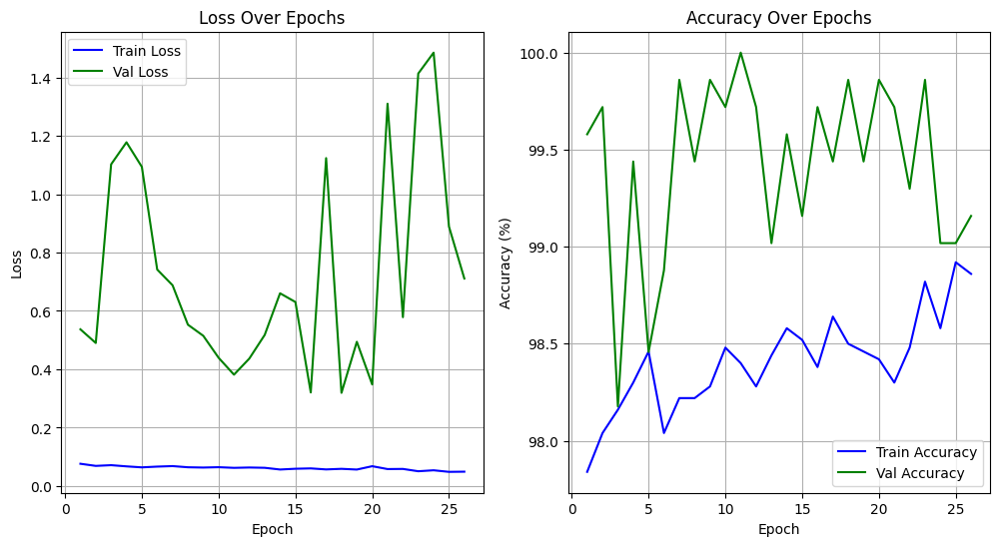

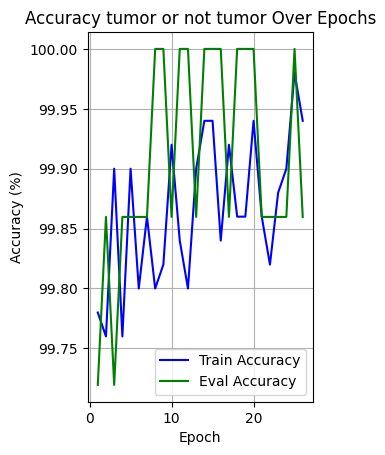

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning y fine tunning con learning rate 0.0001
Actualizamos los pesos del modelo a partir del modelo entrenado con las capas congeladas y learning rate 0,0001
Volvemos a entrenar con las capas descongeladas
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.2040, Training Accuracy: 94.14%, Tumor Accuracy: 98.92% - Validation Loss: 1.7682, Validation Accuracy: 97.62%, Tumor Accuracy: 99.16
		Epoch [2/100] - Training Loss: 0.1982, Training Accuracy: 94.40%, Tumor Accuracy: 98.96% - Validation Loss: 1.7711, Validation Accuracy: 97.48%, Tumor Accuracy: 99.16
		Epoch [3/100] - Training Loss: 0.2023, Training Accuracy: 94.26%, Tumor Accuracy: 98.98% - Validation Loss: 1.8688, Validation Accuracy: 97.48%, Tumor Accuracy: 99.16
		Epoch [4/100] - Training Loss: 0.1988, Training Accuracy: 94.46%, Tumor Accuracy: 99.04% - Validation Loss: 1.6870, Validation Accuracy: 97.34%, Tu

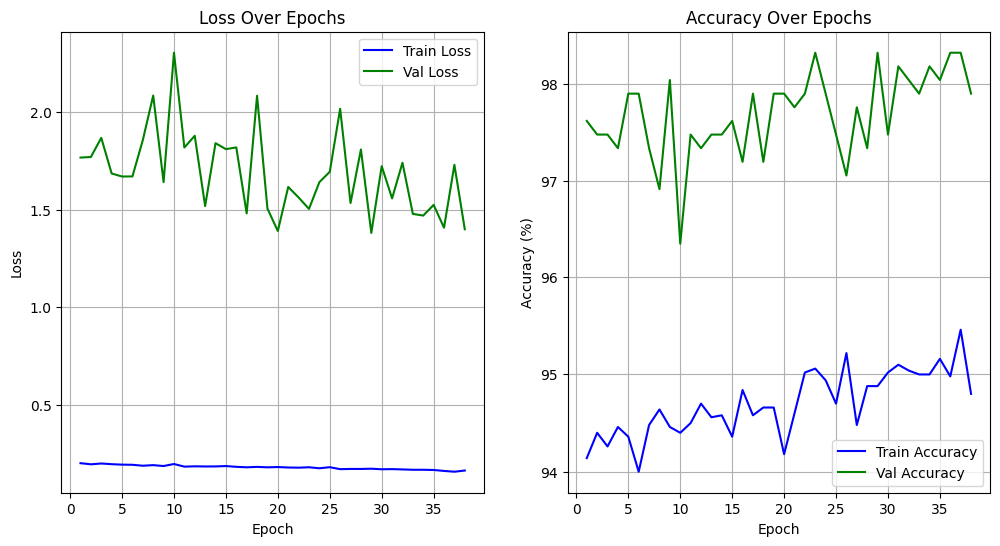

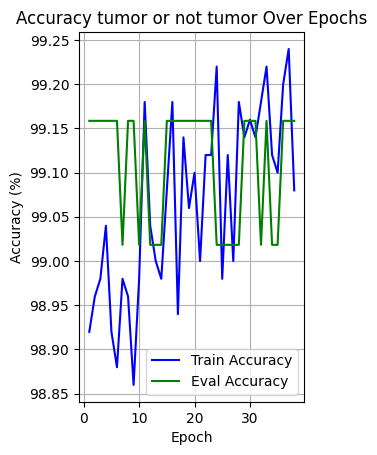

	Proceso de entrenamiento finalizado


In [ ]:
# Entrenamos el grupo de modelos
my_group_trainer.trainer(my_model_group_50_1)

In [ ]:
# Mostramos los resultados obtenidos durante el entrenamiento
plot_group_training_info(my_model_group_50_1)

Evaluamos el modelo con transfer learning con learning rate 0.1
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet50.
			Loss: 1.6503
			Accuracy: 0.9306
			Precision: 0.9263
			Recall: 0.9262
			F1-score: 0.9263

			Accuracy tumor o no tumor: 0.9985
			Precision tumor o no tumor: 0.9975
			Recall tumor o no tumor: 0.9989
			F1-score tumor o no tumor: 0.9982

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.8923
			meningioma: 0.8621
			notumor: 0.995
			pituitary: 0.9559

		Sensibilidad (Recall):
			glioma: 0.8833
			meningioma: 0.8987
			notumor: 0.9827
			pituitary: 0.94

		Puntaje F1 (F1-score):
			glioma: 0.8878
			meningioma: 0.88
			notumor: 0.9888
			pituitary: 0.9479

		Pérdida por categoría:
			glioma: 0.0604
			meningioma: 0.0417
			notumor: 0.0113
			pituitary: 0.0242

		Matriz de confusión:


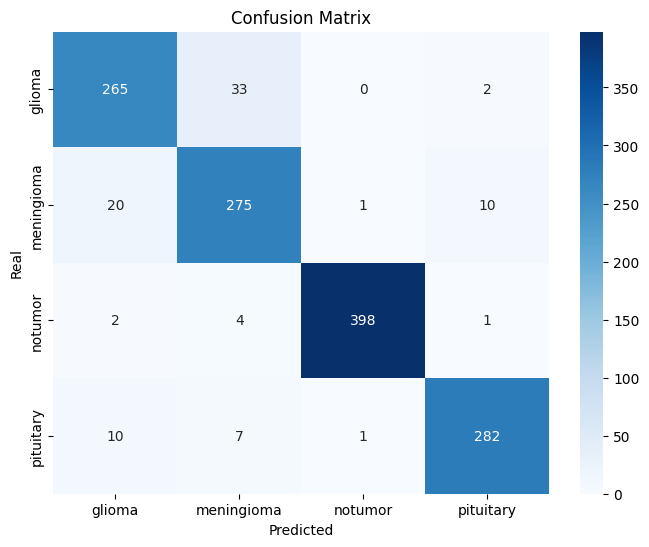

		Matriz de confusión tumor o no tumor:


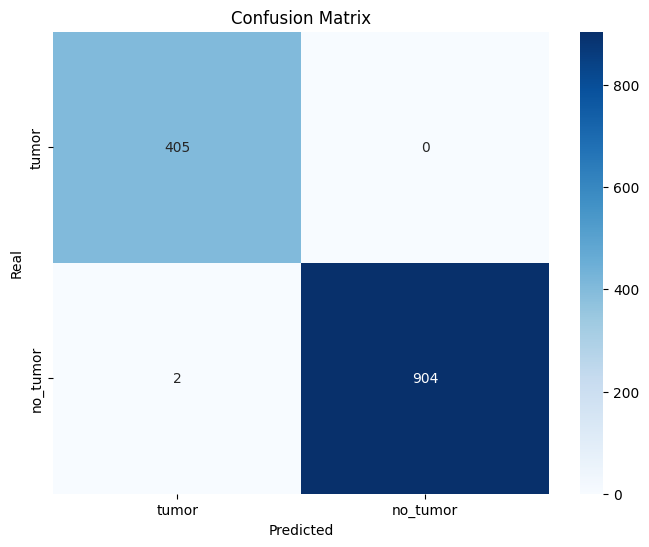

Evaluamos el modelo con transfer learning con learning rate 0.01
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet50.
			Loss: 0.2282
			Accuracy: 0.9260
			Precision: 0.9242
			Recall: 0.9209
			F1-score: 0.9226

			Accuracy tumor o no tumor: 0.9969
			Precision tumor o no tumor: 0.9951
			Recall tumor o no tumor: 0.9978
			F1-score tumor o no tumor: 0.9965

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9146
			meningioma: 0.8201
			notumor: 0.9901
			pituitary: 0.9722

		Sensibilidad (Recall):
			glioma: 0.8567
			meningioma: 0.9085
			notumor: 0.9852
			pituitary: 0.9333

		Puntaje F1 (F1-score):
			glioma: 0.8847
			meningioma: 0.862
			notumor: 0.9876
			pituitary: 0.9524

		Pérdida por categoría:
			glioma: 0.0094
			meningioma: 0.0039
			notumor: 0.0012
			pituitary: 0.005

		Matriz de confusión:


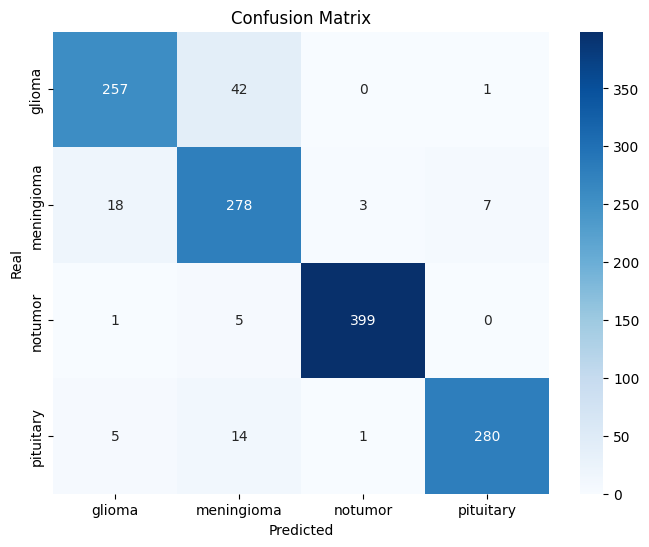

		Matriz de confusión tumor o no tumor:


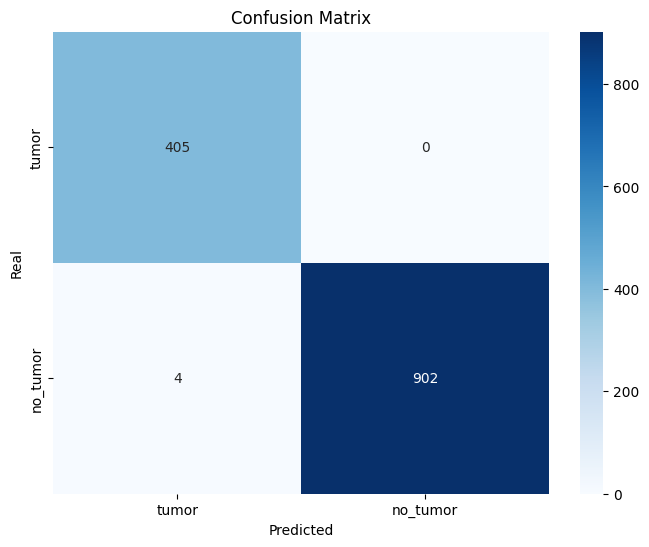

Evaluamos el modelo con transfer learning con learning rate 0.001
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet50.
			Loss: 0.1805
			Accuracy: 0.9344
			Precision: 0.9319
			Recall: 0.9295
			F1-score: 0.9307

			Accuracy tumor o no tumor: 0.9939
			Precision tumor o no tumor: 0.9903
			Recall tumor o no tumor: 0.9956
			F1-score tumor o no tumor: 0.9930

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9275
			meningioma: 0.8497
			notumor: 0.9805
			pituitary: 0.9699

		Sensibilidad (Recall):
			glioma: 0.8533
			meningioma: 0.9052
			notumor: 0.9926
			pituitary: 0.9667

		Puntaje F1 (F1-score):
			glioma: 0.8889
			meningioma: 0.8766
			notumor: 0.9865
			pituitary: 0.9683

		Pérdida por categoría:
			glioma: 0.0068
			meningioma: 0.0049
			notumor: 0.0008
			pituitary: 0.0028

		Matriz de confusión:


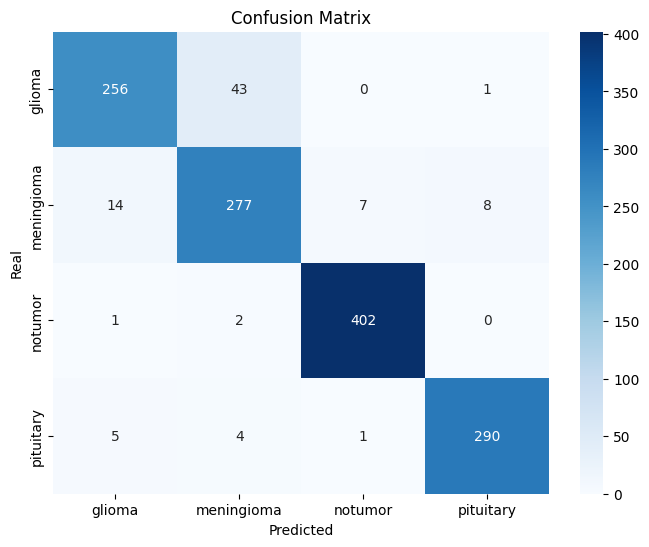

		Matriz de confusión tumor o no tumor:


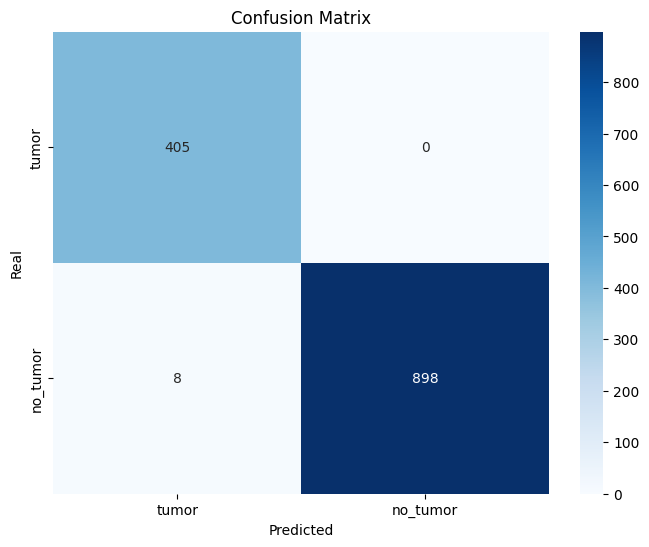

Evaluamos el modelo con transfer learning con learning rate 0.0001
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet50.
			Loss: 0.2849
			Accuracy: 0.8947
			Precision: 0.8937
			Recall: 0.8883
			F1-score: 0.8910

			Accuracy tumor o no tumor: 0.9756
			Precision tumor o no tumor: 0.9634
			Recall tumor o no tumor: 0.9823
			F1-score tumor o no tumor: 0.9728

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9321
			meningioma: 0.7866
			notumor: 0.9249
			pituitary: 0.9314

		Sensibilidad (Recall):
			glioma: 0.8233
			meningioma: 0.8072
			notumor: 0.9728
			pituitary: 0.95

		Puntaje F1 (F1-score):
			glioma: 0.8743
			meningioma: 0.7968
			notumor: 0.9483
			pituitary: 0.9406

		Pérdida por categoría:
			glioma: 0.0076
			meningioma: 0.0104
			notumor: 0.0017
			pituitary: 0.0046

		Matriz de confusión:


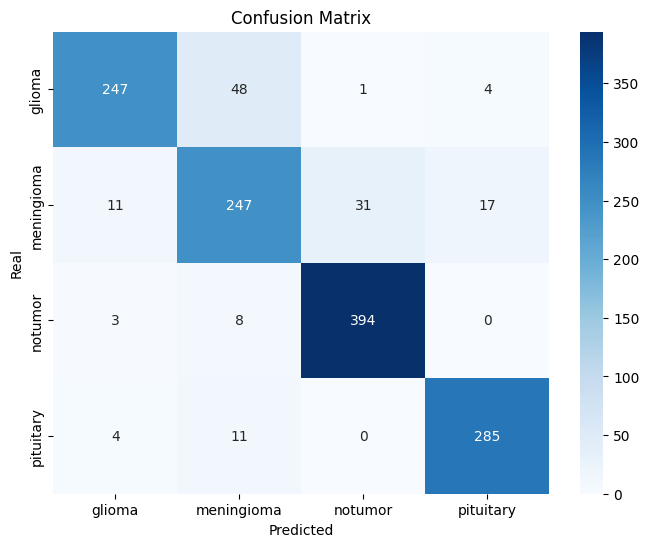

		Matriz de confusión tumor o no tumor:


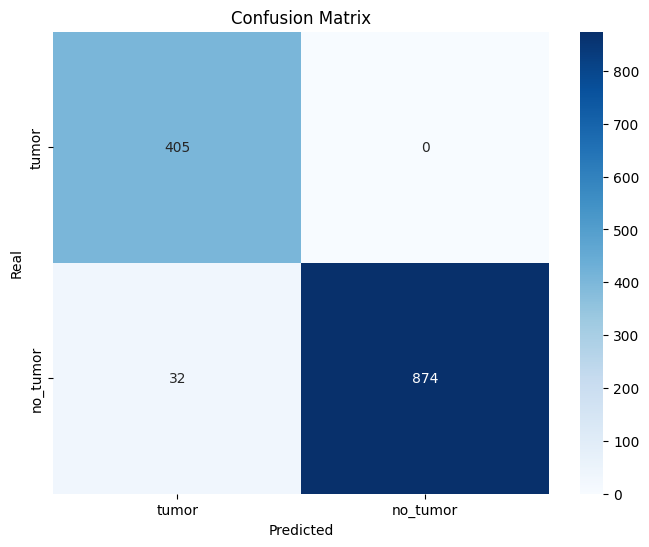

Evaluamos el modelo con fine tunning con learning rate 0.1
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet50.
			Loss: 1.6784
			Accuracy: 0.9260
			Precision: 0.9211
			Recall: 0.9219
			F1-score: 0.9215

			Accuracy tumor o no tumor: 1.0000
			Precision tumor o no tumor: 1.0000
			Recall tumor o no tumor: 1.0000
			F1-score tumor o no tumor: 1.0000

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.8495
			meningioma: 0.8814
			notumor: 1.0
			pituitary: 0.9535

		Sensibilidad (Recall):
			glioma: 0.9033
			meningioma: 0.8497
			notumor: 0.9778
			pituitary: 0.9567

		Puntaje F1 (F1-score):
			glioma: 0.8756
			meningioma: 0.8652
			notumor: 0.9888
			pituitary: 0.9551

		Pérdida por categoría:
			glioma: 0.0292
			meningioma: 0.0475
			notumor: 0.035
			pituitary: 0.0205

		Matriz de confusión:


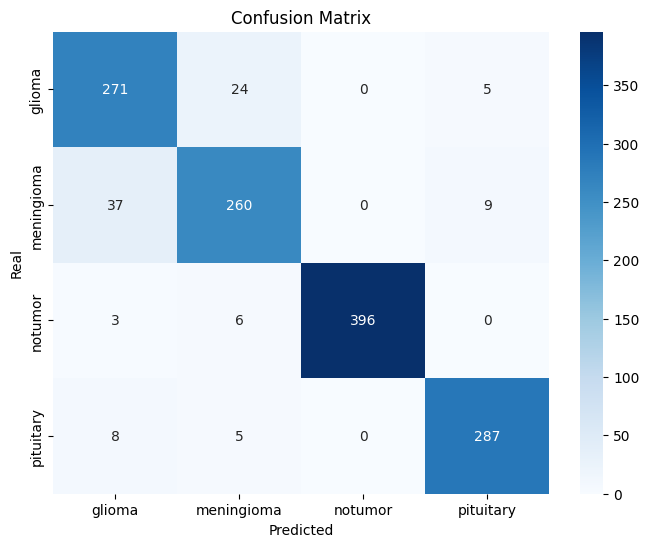

		Matriz de confusión tumor o no tumor:


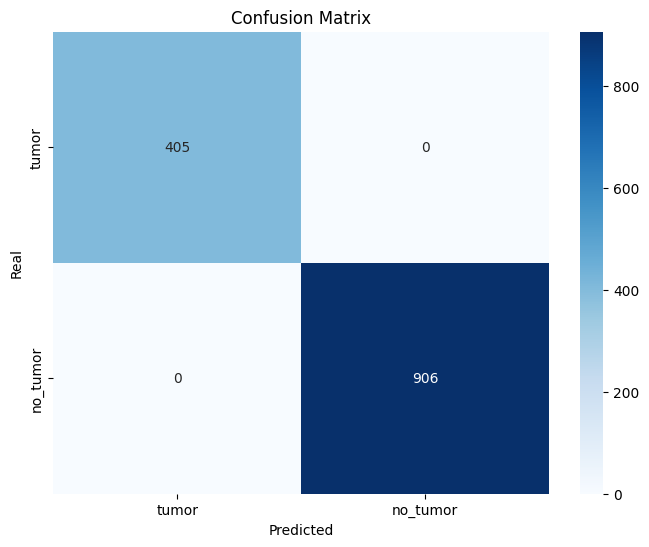

Evaluamos el modelo con fine tunning con learning rate 0.01
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet50.
			Loss: 0.2381
			Accuracy: 0.9359
			Precision: 0.9321
			Recall: 0.9316
			F1-score: 0.9319

			Accuracy tumor o no tumor: 0.9977
			Precision tumor o no tumor: 0.9963
			Recall tumor o no tumor: 0.9983
			F1-score tumor o no tumor: 0.9973

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.8904
			meningioma: 0.873
			notumor: 0.9926
			pituitary: 0.9726

		Sensibilidad (Recall):
			glioma: 0.8933
			meningioma: 0.8987
			notumor: 0.9877
			pituitary: 0.9467

		Puntaje F1 (F1-score):
			glioma: 0.8918
			meningioma: 0.8857
			notumor: 0.9901
			pituitary: 0.9595

		Pérdida por categoría:
			glioma: 0.0075
			meningioma: 0.0054
			notumor: 0.0026
			pituitary: 0.0046

		Matriz de confusión:


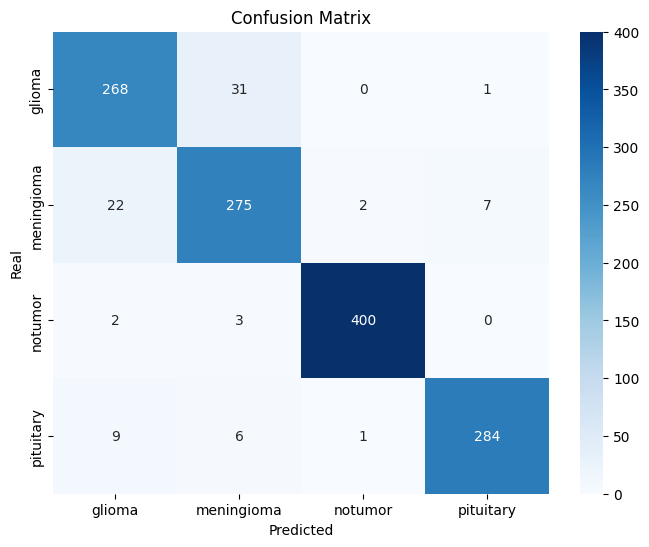

		Matriz de confusión tumor o no tumor:


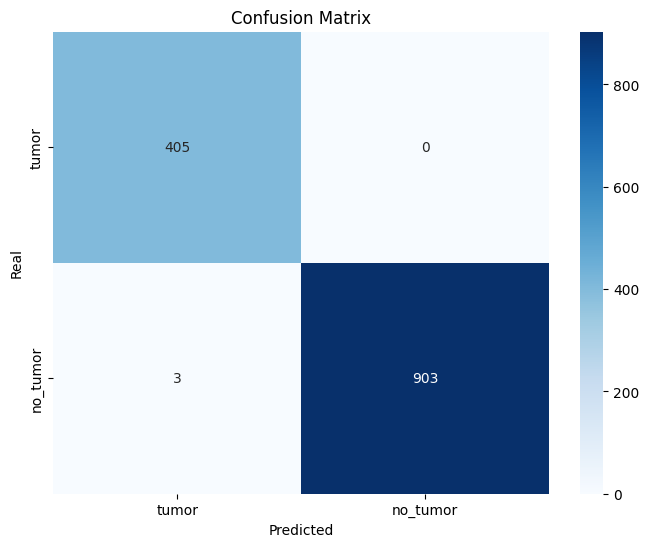

Evaluamos el modelo con fine tunning con learning rate 0.001
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet50.
			Loss: 0.2703
			Accuracy: 0.9375
			Precision: 0.9350
			Recall: 0.9340
			F1-score: 0.9345

			Accuracy tumor o no tumor: 0.9977
			Precision tumor o no tumor: 0.9963
			Recall tumor o no tumor: 0.9983
			F1-score tumor o no tumor: 0.9973

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9422
			meningioma: 0.8511
			notumor: 0.9925
			pituitary: 0.9542

		Sensibilidad (Recall):
			glioma: 0.87
			meningioma: 0.915
			notumor: 0.9778
			pituitary: 0.9733

		Puntaje F1 (F1-score):
			glioma: 0.9047
			meningioma: 0.8819
			notumor: 0.9851
			pituitary: 0.9637

		Pérdida por categoría:
			glioma: 0.0062
			meningioma: 0.0054
			notumor: 0.0067
			pituitary: 0.002

		Matriz de confusión:


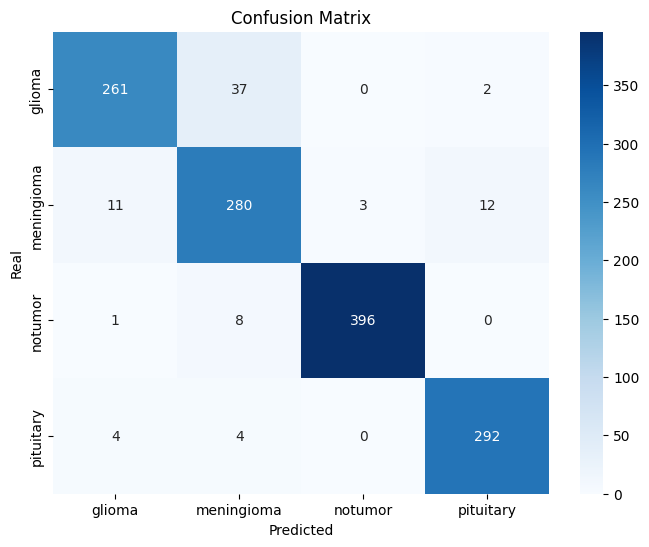

		Matriz de confusión tumor o no tumor:


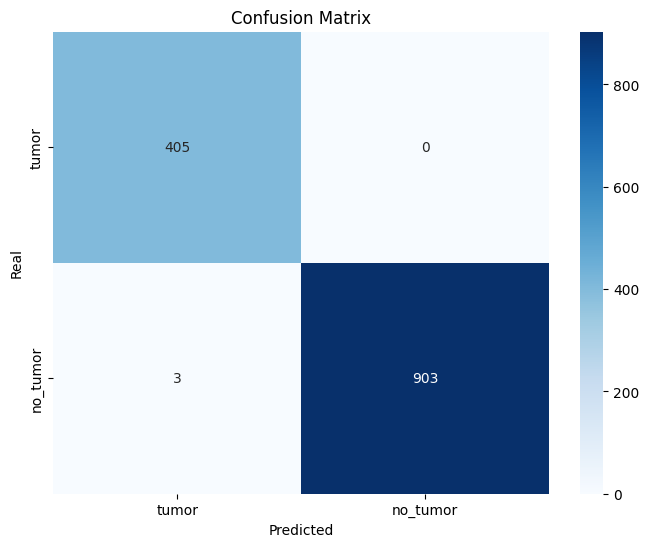

Evaluamos el modelo con fine tunning con learning rate 0.001
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet50.
			Loss: 0.2643
			Accuracy: 0.9077
			Precision: 0.9061
			Recall: 0.9027
			F1-score: 0.9044

			Accuracy tumor o no tumor: 0.9847
			Precision tumor o no tumor: 0.9765
			Recall tumor o no tumor: 0.9890
			F1-score tumor o no tumor: 0.9827

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9267
			meningioma: 0.7994
			notumor: 0.9515
			pituitary: 0.947

		Sensibilidad (Recall):
			glioma: 0.8433
			meningioma: 0.8464
			notumor: 0.9679
			pituitary: 0.9533

		Puntaje F1 (F1-score):
			glioma: 0.8831
			meningioma: 0.8222
			notumor: 0.9596
			pituitary: 0.9502

		Pérdida por categoría:
			glioma: 0.0069
			meningioma: 0.0087
			notumor: 0.0021
			pituitary: 0.0045

		Matriz de confusión:


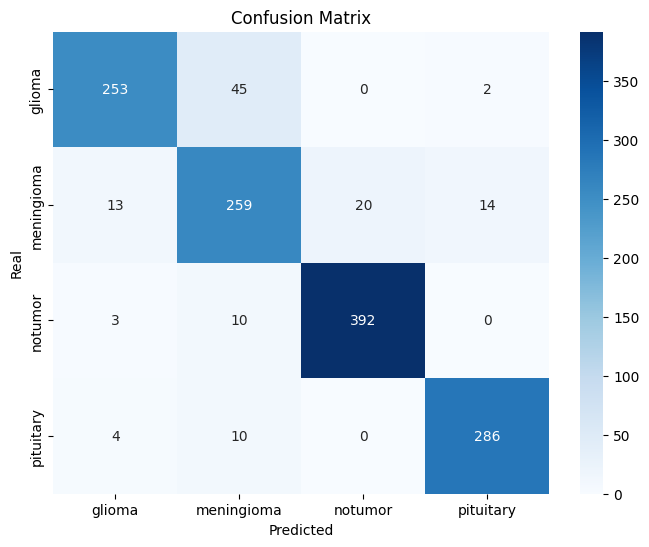

		Matriz de confusión tumor o no tumor:


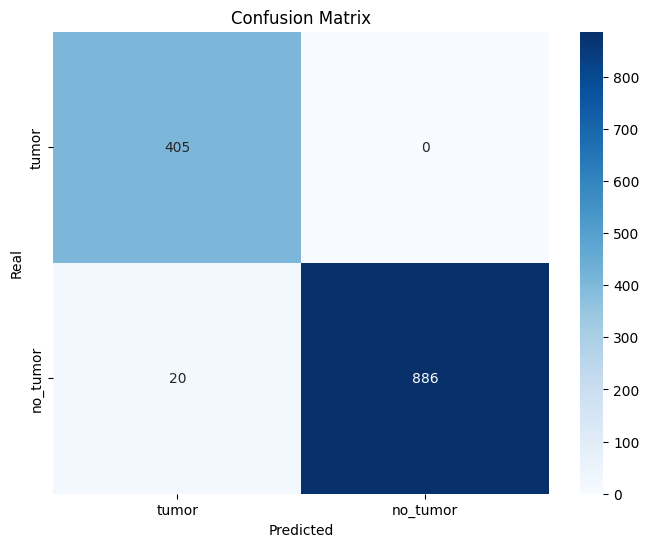

Evaluamos el modelo con transfer learning y fine tunning con learning rate 0.1
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet50.
			Loss: 2.2741
			Accuracy: 0.9298
			Precision: 0.9283
			Recall: 0.9248
			F1-score: 0.9266

			Accuracy tumor o no tumor: 0.9977
			Precision tumor o no tumor: 0.9963
			Recall tumor o no tumor: 0.9983
			F1-score tumor o no tumor: 0.9973

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9296
			meningioma: 0.8251
			notumor: 0.9926
			pituitary: 0.9661

		Sensibilidad (Recall):
			glioma: 0.8367
			meningioma: 0.9248
			notumor: 0.9877
			pituitary: 0.95

		Puntaje F1 (F1-score):
			glioma: 0.8807
			meningioma: 0.8721
			notumor: 0.9901
			pituitary: 0.958

		Pérdida por categoría:
			glioma: 0.1216
			meningioma: 0.0361
			notumor: 0.0138
			pituitary: 0.0325

		Matriz de confusión:


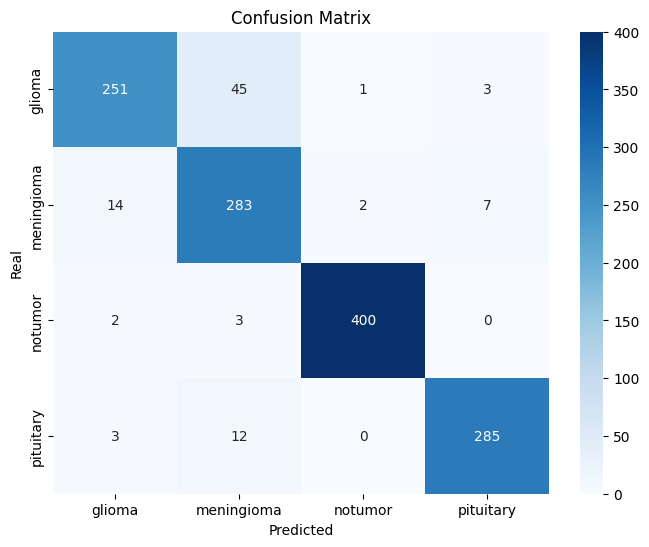

		Matriz de confusión tumor o no tumor:


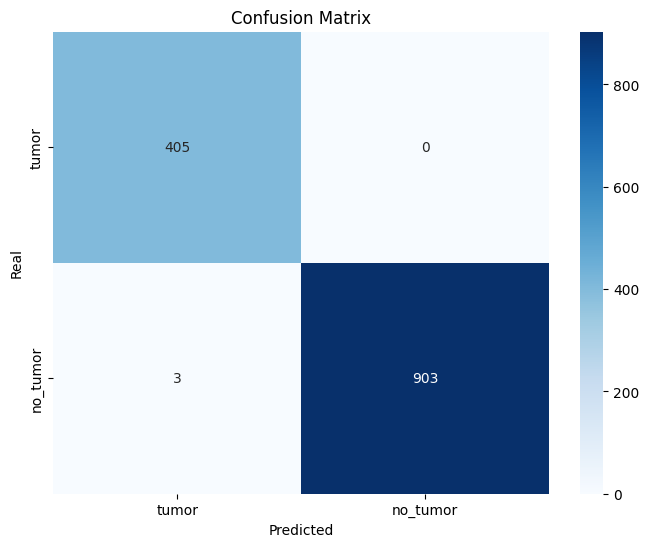

Evaluamos el modelo con transfer learning y fine tunning con learning rate 0.01
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet50.
			Loss: 0.3374
			Accuracy: 0.9329
			Precision: 0.9323
			Recall: 0.9280
			F1-score: 0.9301

			Accuracy tumor o no tumor: 0.9992
			Precision tumor o no tumor: 0.9988
			Recall tumor o no tumor: 0.9994
			F1-score tumor o no tumor: 0.9991

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9563
			meningioma: 0.8333
			notumor: 0.9975
			pituitary: 0.9419

		Sensibilidad (Recall):
			glioma: 0.8033
			meningioma: 0.9477
			notumor: 0.9877
			pituitary: 0.9733

		Puntaje F1 (F1-score):
			glioma: 0.8732
			meningioma: 0.8869
			notumor: 0.9926
			pituitary: 0.9574

		Pérdida por categoría:
			glioma: 0.0201
			meningioma: 0.0036
			notumor: 0.002
			pituitary: 0.0025

		Matriz de confusión:


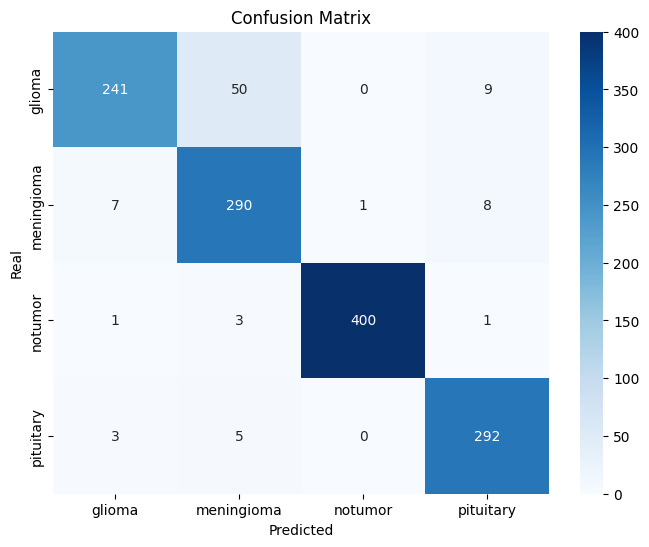

		Matriz de confusión tumor o no tumor:


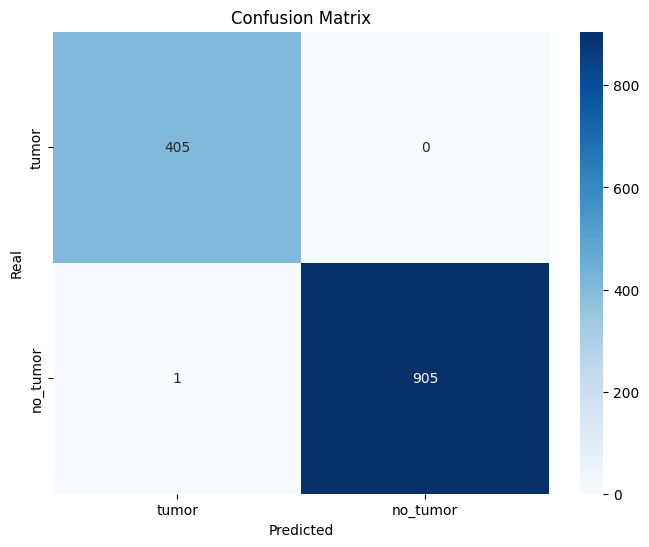

Evaluamos el modelo con transfer learning y fine tunning con learning rate 0.001
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet50.
			Loss: 0.1848
			Accuracy: 0.9359
			Precision: 0.9335
			Recall: 0.9313
			F1-score: 0.9324

			Accuracy tumor o no tumor: 0.9954
			Precision tumor o no tumor: 0.9927
			Recall tumor o no tumor: 0.9967
			F1-score tumor o no tumor: 0.9947

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9247
			meningioma: 0.8511
			notumor: 0.9853
			pituitary: 0.973

		Sensibilidad (Recall):
			glioma: 0.86
			meningioma: 0.915
			notumor: 0.9901
			pituitary: 0.96

		Puntaje F1 (F1-score):
			glioma: 0.8912
			meningioma: 0.8819
			notumor: 0.9877
			pituitary: 0.9664

		Pérdida por categoría:
			glioma: 0.0076
			meningioma: 0.0043
			notumor: 0.0008
			pituitary: 0.0028

		Matriz de confusión:


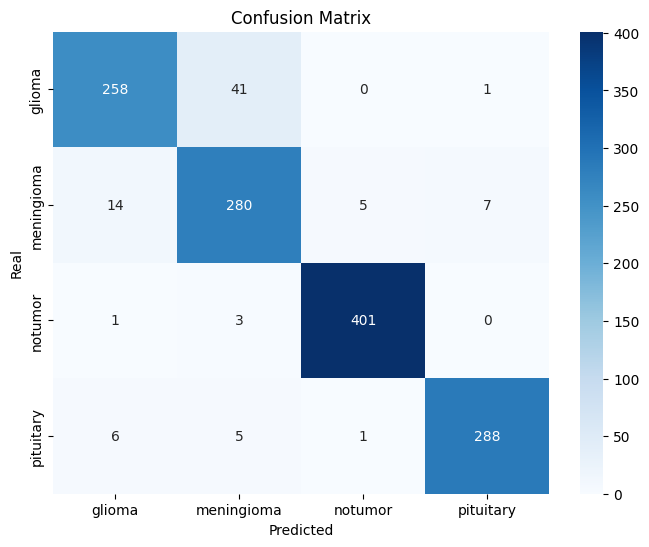

		Matriz de confusión tumor o no tumor:


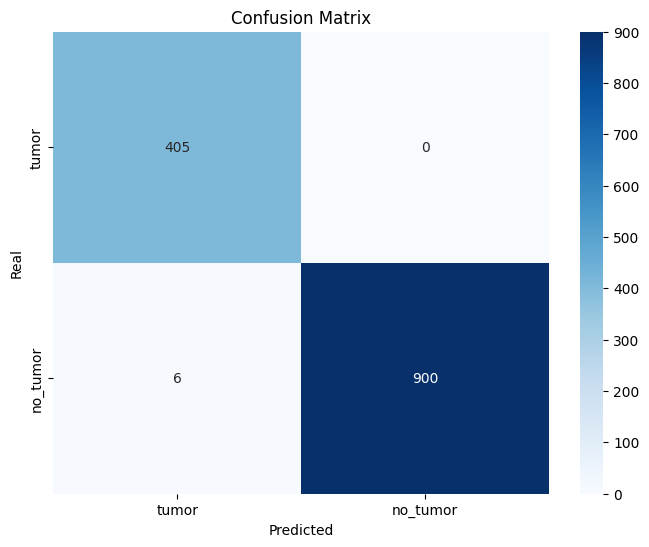

Evaluamos el modelo con transfer learning y fine tunning con learning rate 0.0001
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet50.
			Loss: 0.2390
			Accuracy: 0.9153
			Precision: 0.9127
			Recall: 0.9108
			F1-score: 0.9118

			Accuracy tumor o no tumor: 0.9893
			Precision tumor o no tumor: 0.9833
			Recall tumor o no tumor: 0.9923
			F1-score tumor o no tumor: 0.9878

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9281
			meningioma: 0.8162
			notumor: 0.9656
			pituitary: 0.941

		Sensibilidad (Recall):
			glioma: 0.86
			meningioma: 0.8562
			notumor: 0.9704
			pituitary: 0.9567

		Puntaje F1 (F1-score):
			glioma: 0.8927
			meningioma: 0.8357
			notumor: 0.968
			pituitary: 0.9488

		Pérdida por categoría:
			glioma: 0.0067
			meningioma: 0.0077
			notumor: 0.0019
			pituitary: 0.004

		Matriz de confusión:


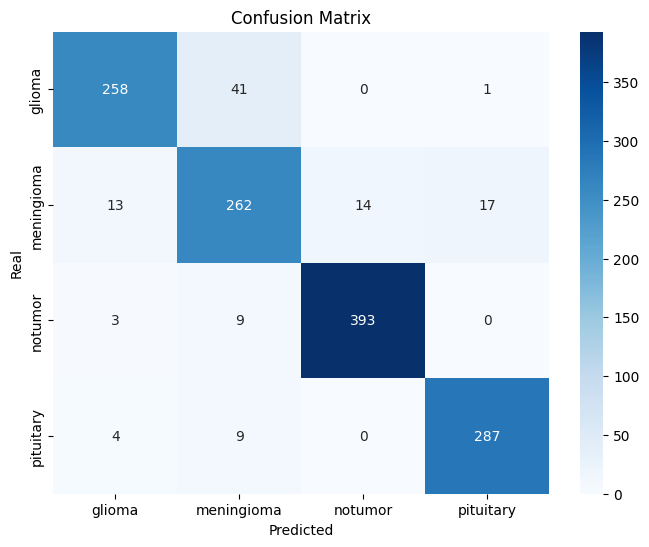

		Matriz de confusión tumor o no tumor:


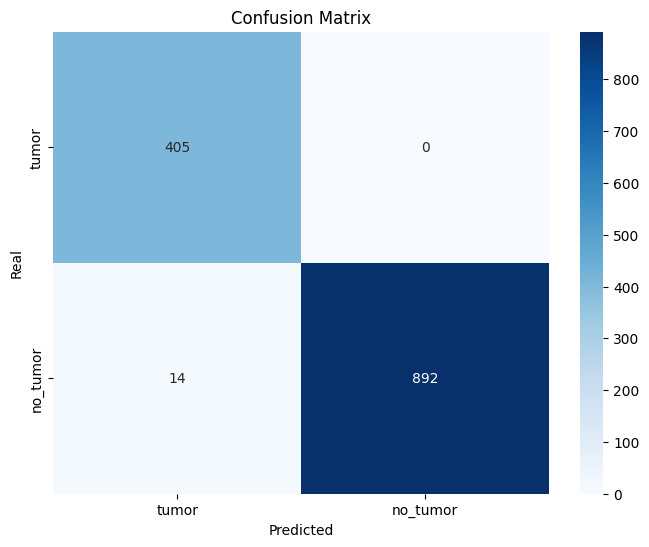

In [ ]:
#Evaluamos los resultados del grupo
my_group_evaluator.eval(my_dataset.test_loader, my_model_group_50_1)

In [ ]:
# Creamos una inteligencia compartida
min_accuracy_value = 0.92
my_model_group_50_1.create_shared_model(min_accuracy_value)

Número de modelos que cumplen con la condición: 9


	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet50.
			Loss: 0.5899
			Accuracy: 0.9390
			Precision: 0.9359
			Recall: 0.9348
			F1-score: 0.9353

			Accuracy tumor o no tumor: 0.9992
			Precision tumor o no tumor: 0.9988
			Recall tumor o no tumor: 0.9994
			F1-score tumor o no tumor: 0.9991

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9225
			meningioma: 0.8571
			notumor: 0.9975
			pituitary: 0.9663

		Sensibilidad (Recall):
			glioma: 0.8733
			meningioma: 0.9216
			notumor: 0.9877
			pituitary: 0.9567

		Puntaje F1 (F1-score):
			glioma: 0.8973
			meningioma: 0.8882
			notumor: 0.9926
			pituitary: 0.9615

		Pérdida por categoría:
			glioma: 0.028
			meningioma: 0.012
			notumor: 0.0038
			pituitary: 0.0078

		Matriz de confusión:


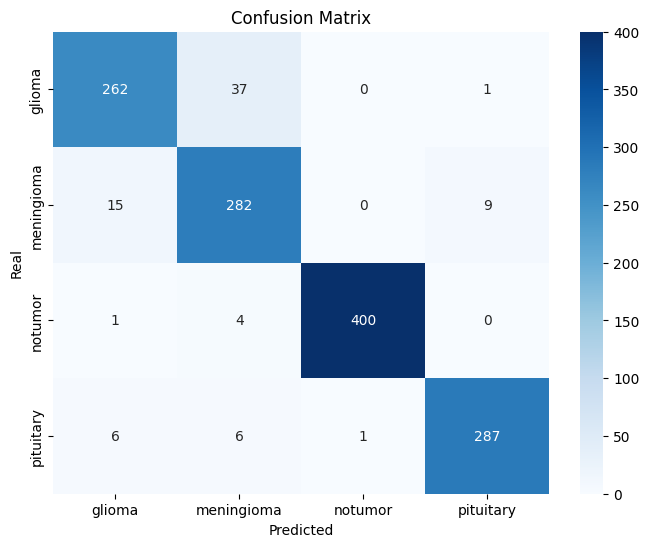

		Matriz de confusión tumor o no tumor:


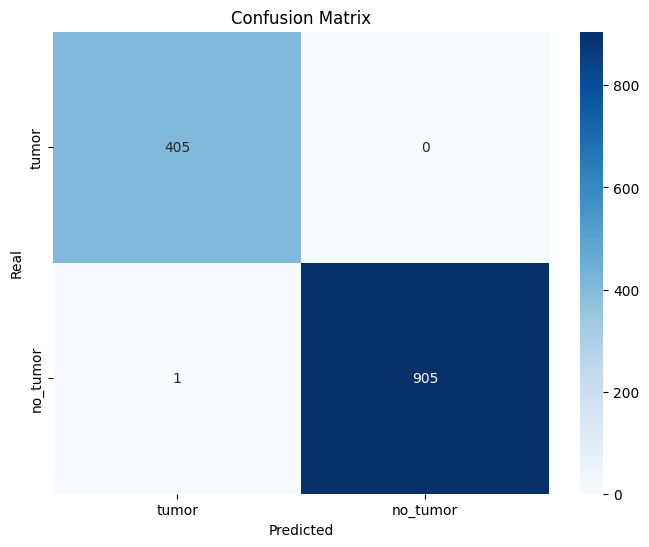

In [ ]:
# Comprobamos el rendimiento de la inteligencia compartida
evaluate(my_model_group_50_1.shared_model, my_dataset.test_loader, my_dataset.no_tumor_label_position)

In [ ]:
#guardado de todo un grupo

save_group_model(my_model_group_50_1)

Guardando los modelos con Transfer Learning.
Guardando los modelos con Fine Tunning.
Guardando los modelos con Transfer Learning y Fine Tunning.
Guardando la intenligencia compartida
Comprimiendo la carpeta con los modelos y subiendo al drive
proceso de guardado finalizado


## Resnet 101


In [ ]:
# Creamos el grupo de modelos
model_name = "resnet101"

my_model_group_101_1 = MyResnetGroupModel(model_name, my_dataset.num_classes)

Downloading: "https://download.pytorch.org/models/resnet101-cd907fc2.pth" to /root/.cache/torch/hub/checkpoints/resnet101-cd907fc2.pth
100%|██████████| 171M/171M [00:01<00:00, 92.0MB/s]


Entrenando el modelo con transfer learning con learning rate 0.1
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 2.4467, Training Accuracy: 78.66%, Tumor Accuracy: 95.10% - Validation Loss: 18.6015, Validation Accuracy: 85.13%, Tumor Accuracy: 97.76
		Epoch [2/100] - Training Loss: 0.8699, Training Accuracy: 89.28%, Tumor Accuracy: 98.18% - Validation Loss: 5.3410, Validation Accuracy: 94.95%, Tumor Accuracy: 99.30
		Epoch [3/100] - Training Loss: 0.6367, Training Accuracy: 91.04%, Tumor Accuracy: 98.48% - Validation Loss: 6.7516, Validation Accuracy: 93.13%, Tumor Accuracy: 98.60
		Epoch [4/100] - Training Loss: 0.6295, Training Accuracy: 91.46%, Tumor Accuracy: 98.40% - Validation Loss: 5.8629, Validation Accuracy: 95.93%, Tumor Accuracy: 99.16
		Epoch [5/100] - Training Loss: 0.7901, Training Accuracy: 91.20%, Tumor Accuracy: 98.30% - Validation Loss: 6.8641, Validation Accuracy: 95.37%, Tumor Accuracy: 99.30
		Epoch [6/100] - Trainin

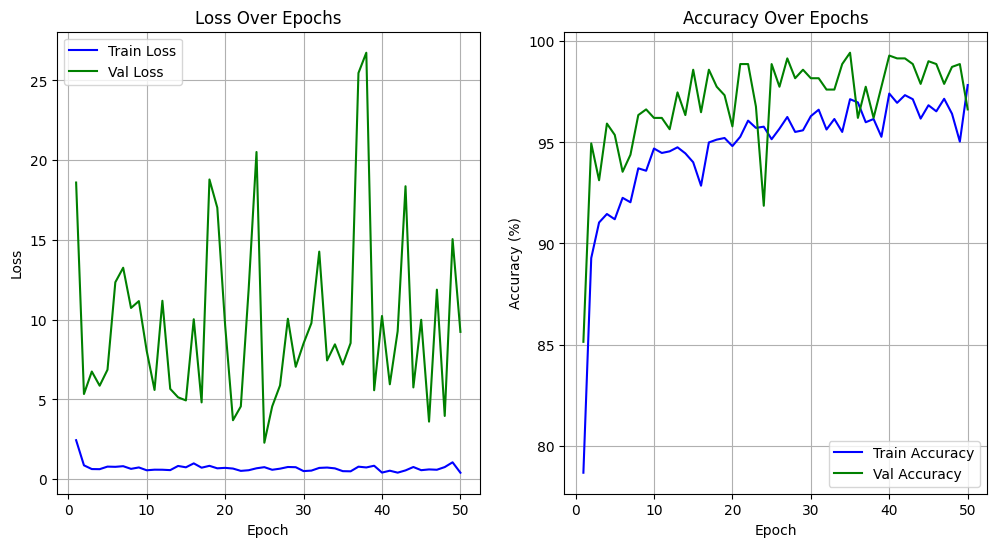

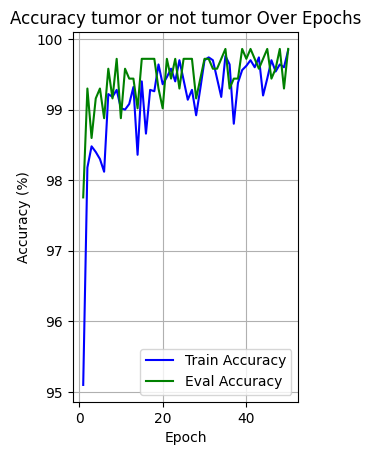

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning con learning rate 0.01
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.4464, Training Accuracy: 82.92%, Tumor Accuracy: 96.04% - Validation Loss: 2.4124, Validation Accuracy: 94.39%, Tumor Accuracy: 99.02
		Epoch [2/100] - Training Loss: 0.2523, Training Accuracy: 91.06%, Tumor Accuracy: 98.20% - Validation Loss: 1.4915, Validation Accuracy: 96.63%, Tumor Accuracy: 99.16
		Epoch [3/100] - Training Loss: 0.2247, Training Accuracy: 91.96%, Tumor Accuracy: 98.32% - Validation Loss: 1.5943, Validation Accuracy: 95.65%, Tumor Accuracy: 99.30
		Epoch [4/100] - Training Loss: 0.1766, Training Accuracy: 93.40%, Tumor Accuracy: 99.10% - Validation Loss: 1.8625, Validation Accuracy: 96.77%, Tumor Accuracy: 99.16
		Epoch [5/100] - Training Loss: 0.1588, Training Accuracy: 94.98%, Tumor Accuracy: 99.18% - Validation Loss: 1.8497, Validation Accuracy: 97.34%, Tumor Accu

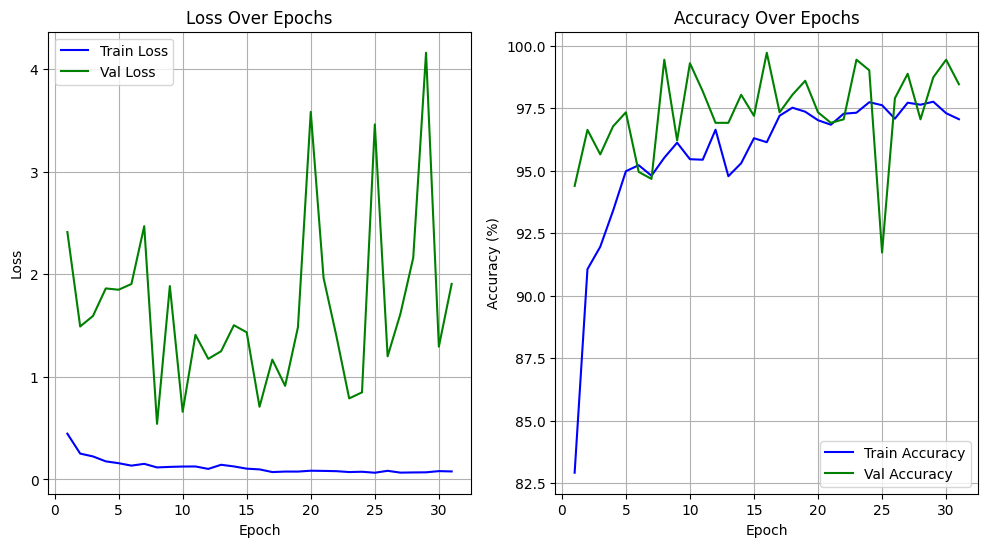

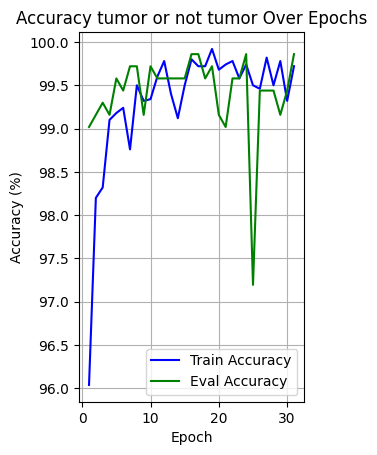

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning con learning rate 0.001
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.6966, Training Accuracy: 77.94%, Tumor Accuracy: 93.92% - Validation Loss: 5.0569, Validation Accuracy: 90.74%, Tumor Accuracy: 98.60
		Epoch [2/100] - Training Loss: 0.3986, Training Accuracy: 87.48%, Tumor Accuracy: 97.20% - Validation Loss: 2.8846, Validation Accuracy: 93.83%, Tumor Accuracy: 98.60
		Epoch [3/100] - Training Loss: 0.3375, Training Accuracy: 89.72%, Tumor Accuracy: 97.84% - Validation Loss: 3.4228, Validation Accuracy: 93.97%, Tumor Accuracy: 98.46
		Epoch [4/100] - Training Loss: 0.2895, Training Accuracy: 90.88%, Tumor Accuracy: 98.00% - Validation Loss: 2.4583, Validation Accuracy: 95.09%, Tumor Accuracy: 98.74
		Epoch [5/100] - Training Loss: 0.2716, Training Accuracy: 91.28%, Tumor Accuracy: 98.28% - Validation Loss: 2.6300, Validation Accuracy: 95.09%, Tumor Acc

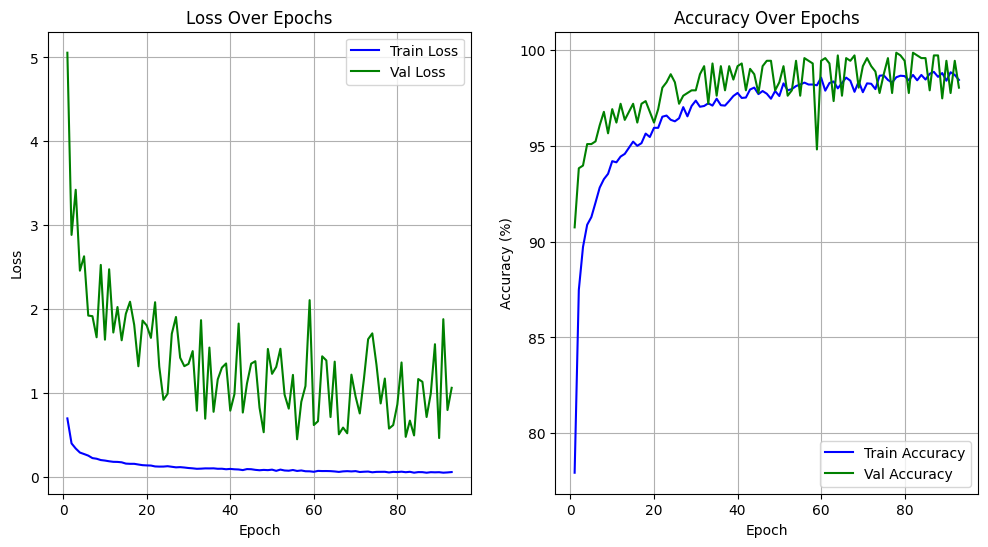

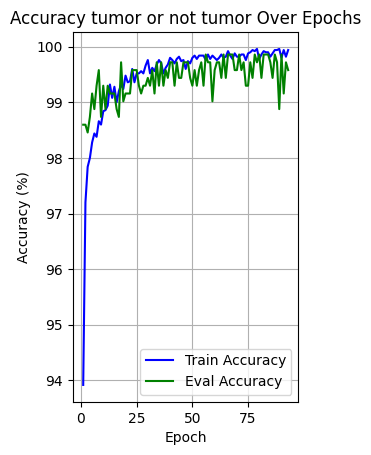

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning con learning rate 0.0001
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 1.2296, Training Accuracy: 56.79%, Tumor Accuracy: 84.54% - Validation Loss: 13.2746, Validation Accuracy: 75.46%, Tumor Accuracy: 86.96
		Epoch [2/100] - Training Loss: 0.9740, Training Accuracy: 78.20%, Tumor Accuracy: 94.08% - Validation Loss: 9.9110, Validation Accuracy: 86.12%, Tumor Accuracy: 95.51
		Epoch [3/100] - Training Loss: 0.8132, Training Accuracy: 81.80%, Tumor Accuracy: 95.62% - Validation Loss: 8.7179, Validation Accuracy: 89.06%, Tumor Accuracy: 95.79
		Epoch [4/100] - Training Loss: 0.7097, Training Accuracy: 83.22%, Tumor Accuracy: 96.12% - Validation Loss: 7.5294, Validation Accuracy: 91.16%, Tumor Accuracy: 97.19
		Epoch [5/100] - Training Loss: 0.6397, Training Accuracy: 83.82%, Tumor Accuracy: 96.22% - Validation Loss: 7.6086, Validation Accuracy: 92.01%, Tumor A

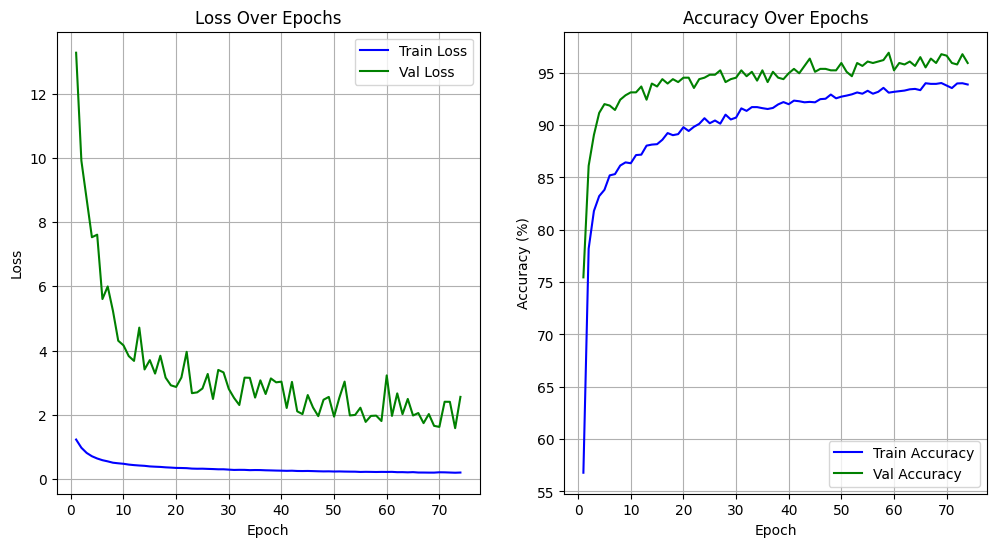

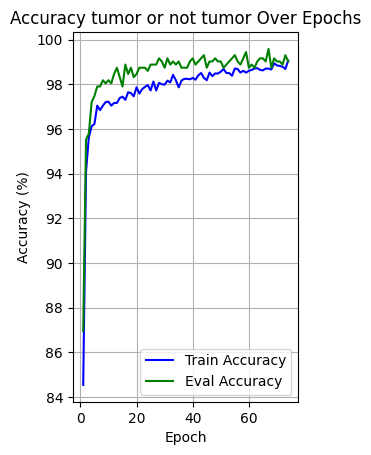

	Proceso de entrenamiento finalizado
Entrenando el modelo con fine tunning con learning rate 0.1
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 2.0509, Training Accuracy: 78.56%, Tumor Accuracy: 93.92% - Validation Loss: 11.2687, Validation Accuracy: 87.94%, Tumor Accuracy: 98.60
		Epoch [2/100] - Training Loss: 1.3385, Training Accuracy: 85.76%, Tumor Accuracy: 97.02% - Validation Loss: 37.7387, Validation Accuracy: 78.96%, Tumor Accuracy: 86.96
		Epoch [3/100] - Training Loss: 1.2936, Training Accuracy: 89.36%, Tumor Accuracy: 97.08% - Validation Loss: 6.6506, Validation Accuracy: 94.53%, Tumor Accuracy: 99.02
		Epoch [4/100] - Training Loss: 0.9349, Training Accuracy: 90.06%, Tumor Accuracy: 97.54% - Validation Loss: 9.5810, Validation Accuracy: 95.23%, Tumor Accuracy: 99.16
		Epoch [5/100] - Training Loss: 0.8698, Training Accuracy: 91.78%, Tumor Accuracy: 98.96% - Validation Loss: 10.5011, Validation Accuracy: 97.05%, Tumor Accurac

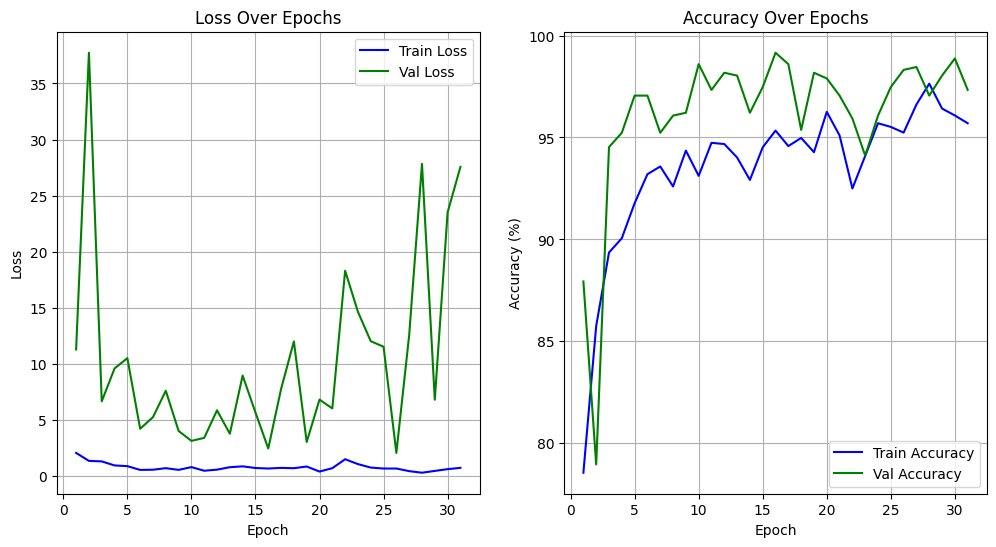

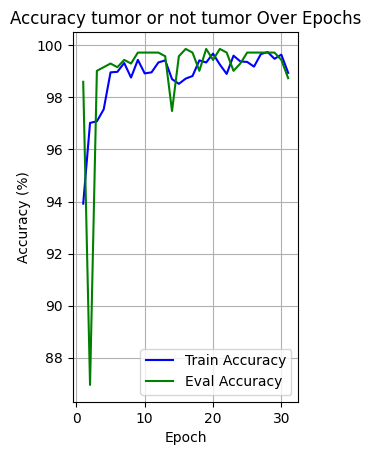

	Proceso de entrenamiento finalizado
Entrenando el modelo con fine tunning con learning rate 0.01
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.4577, Training Accuracy: 83.18%, Tumor Accuracy: 96.14% - Validation Loss: 1.9954, Validation Accuracy: 95.79%, Tumor Accuracy: 99.30
		Epoch [2/100] - Training Loss: 0.2491, Training Accuracy: 91.38%, Tumor Accuracy: 98.70% - Validation Loss: 2.4768, Validation Accuracy: 95.93%, Tumor Accuracy: 98.60
		Epoch [3/100] - Training Loss: 0.1997, Training Accuracy: 92.76%, Tumor Accuracy: 98.68% - Validation Loss: 1.9290, Validation Accuracy: 94.11%, Tumor Accuracy: 99.44
		Epoch [4/100] - Training Loss: 0.1676, Training Accuracy: 94.00%, Tumor Accuracy: 99.08% - Validation Loss: 1.4703, Validation Accuracy: 97.76%, Tumor Accuracy: 99.58
		Epoch [5/100] - Training Loss: 0.1513, Training Accuracy: 94.60%, Tumor Accuracy: 98.76% - Validation Loss: 2.0356, Validation Accuracy: 96.91%, Tumor Accuracy:

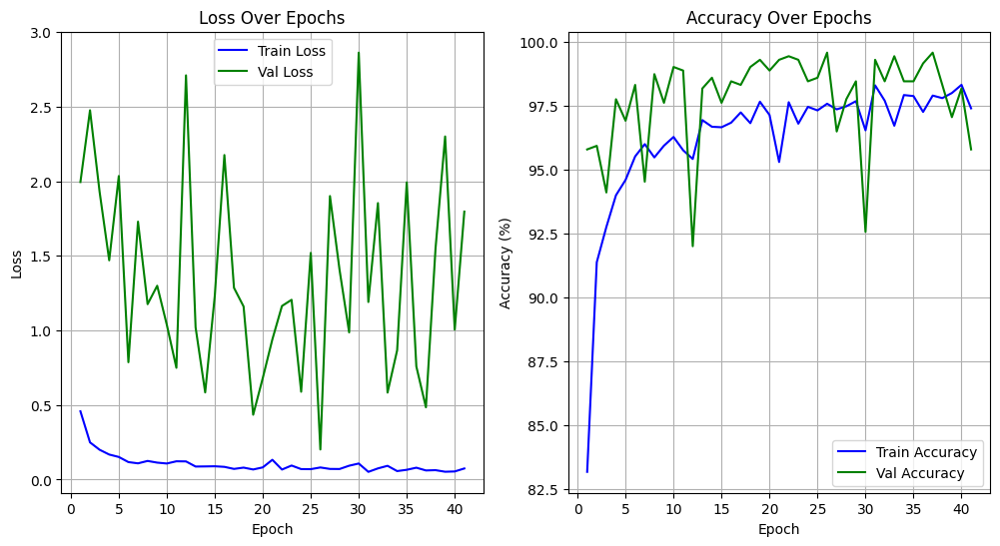

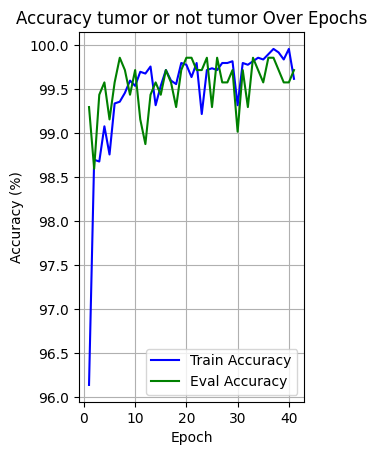

	Proceso de entrenamiento finalizado
Entrenando el modelo con fine tunning con learning rate 0.001
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.6866, Training Accuracy: 78.96%, Tumor Accuracy: 94.06% - Validation Loss: 4.8222, Validation Accuracy: 92.01%, Tumor Accuracy: 97.76
		Epoch [2/100] - Training Loss: 0.3927, Training Accuracy: 87.48%, Tumor Accuracy: 97.28% - Validation Loss: 3.4231, Validation Accuracy: 93.41%, Tumor Accuracy: 98.74
		Epoch [3/100] - Training Loss: 0.3280, Training Accuracy: 89.66%, Tumor Accuracy: 97.86% - Validation Loss: 2.3981, Validation Accuracy: 94.81%, Tumor Accuracy: 98.74
		Epoch [4/100] - Training Loss: 0.2952, Training Accuracy: 90.32%, Tumor Accuracy: 98.04% - Validation Loss: 3.0940, Validation Accuracy: 93.97%, Tumor Accuracy: 98.88
		Epoch [5/100] - Training Loss: 0.2630, Training Accuracy: 91.40%, Tumor Accuracy: 98.24% - Validation Loss: 2.4287, Validation Accuracy: 95.37%, Tumor Accuracy

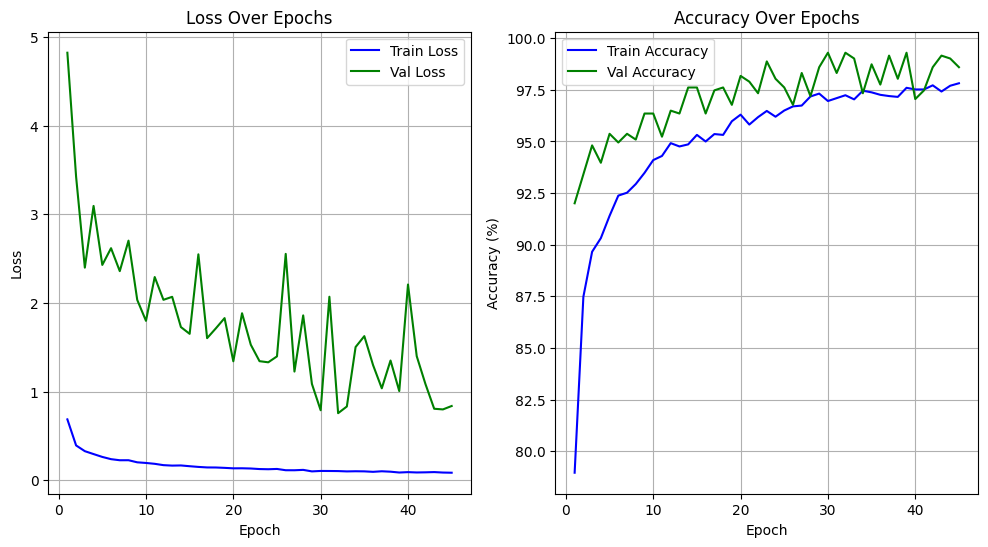

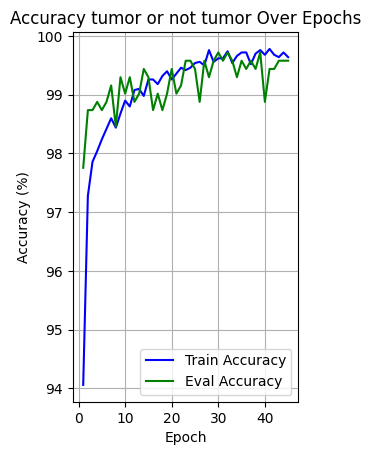

	Proceso de entrenamiento finalizado
Entrenando el modelo con fine tunning con learning rate 0.001
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 1.2106, Training Accuracy: 61.35%, Tumor Accuracy: 85.52% - Validation Loss: 13.1586, Validation Accuracy: 80.08%, Tumor Accuracy: 87.94
		Epoch [2/100] - Training Loss: 0.9559, Training Accuracy: 78.84%, Tumor Accuracy: 94.14% - Validation Loss: 9.3708, Validation Accuracy: 88.64%, Tumor Accuracy: 95.93
		Epoch [3/100] - Training Loss: 0.7979, Training Accuracy: 82.24%, Tumor Accuracy: 95.48% - Validation Loss: 8.6269, Validation Accuracy: 89.06%, Tumor Accuracy: 96.35
		Epoch [4/100] - Training Loss: 0.6972, Training Accuracy: 83.38%, Tumor Accuracy: 95.80% - Validation Loss: 6.6140, Validation Accuracy: 91.30%, Tumor Accuracy: 97.62
		Epoch [5/100] - Training Loss: 0.6384, Training Accuracy: 83.82%, Tumor Accuracy: 96.18% - Validation Loss: 5.8782, Validation Accuracy: 92.43%, Tumor Accurac

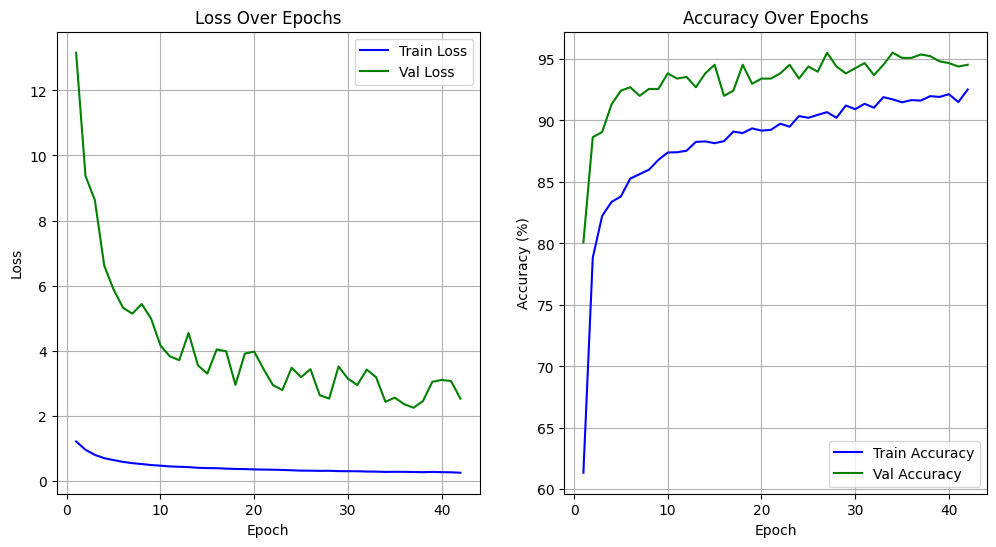

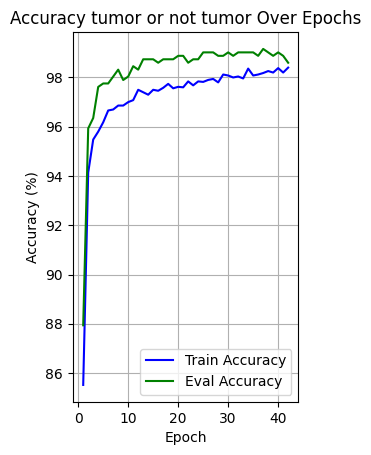

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning y fine tunning con learning rate 0.1
Actualizamos los pesos del modelo a partir del modelo entrenado con las capas congeladas y learning rate 0,1
Volvemos a entrenar con las capas descongeladas
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.6500, Training Accuracy: 96.72%, Tumor Accuracy: 99.38% - Validation Loss: 9.4308, Validation Accuracy: 97.76%, Tumor Accuracy: 99.58
		Epoch [2/100] - Training Loss: 0.9877, Training Accuracy: 95.90%, Tumor Accuracy: 99.64% - Validation Loss: 7.7063, Validation Accuracy: 97.76%, Tumor Accuracy: 99.16
		Epoch [3/100] - Training Loss: 0.6209, Training Accuracy: 96.62%, Tumor Accuracy: 99.58% - Validation Loss: 19.3589, Validation Accuracy: 97.76%, Tumor Accuracy: 99.30
		Epoch [4/100] - Training Loss: 0.9658, Training Accuracy: 96.00%, Tumor Accuracy: 99.46% - Validation Loss: 19.6211, Validation Accuracy: 96.49%, Tumor 

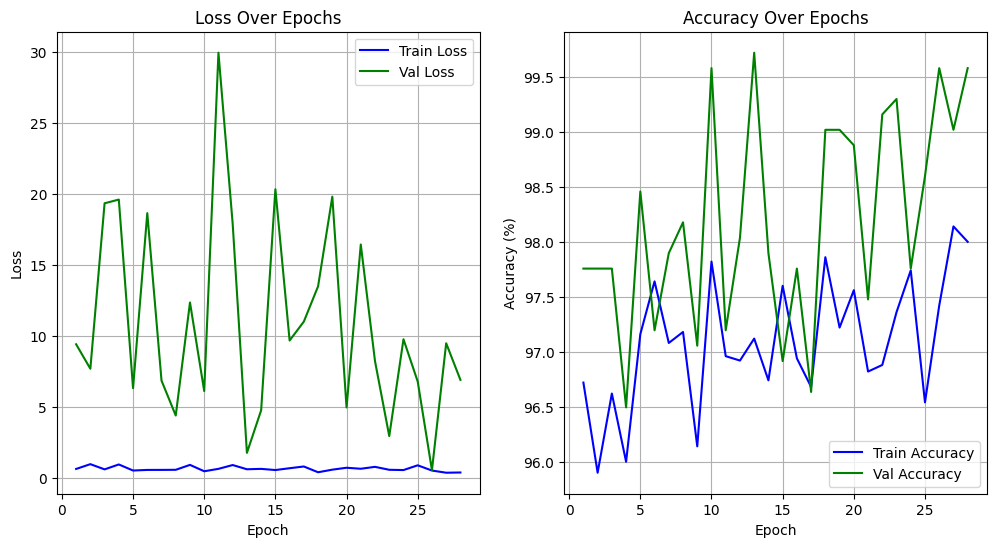

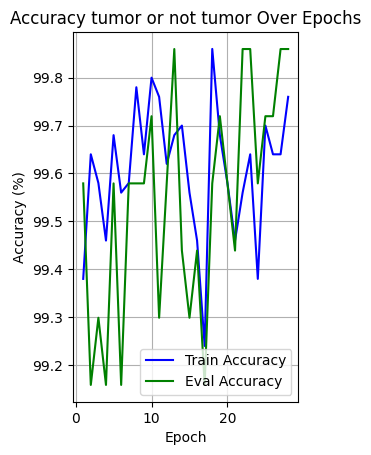

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning y fine tunning con learning rate 0.01
Actualizamos los pesos del modelo a partir del modelo entrenado con las capas congeladas y learning rate 0,01
Volvemos a entrenar con las capas descongeladas
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.0841, Training Accuracy: 96.92%, Tumor Accuracy: 99.68% - Validation Loss: 0.7328, Validation Accuracy: 98.46%, Tumor Accuracy: 99.44
		Epoch [2/100] - Training Loss: 0.0909, Training Accuracy: 96.80%, Tumor Accuracy: 99.68% - Validation Loss: 1.6724, Validation Accuracy: 97.34%, Tumor Accuracy: 99.30
		Epoch [3/100] - Training Loss: 0.0616, Training Accuracy: 97.62%, Tumor Accuracy: 99.42% - Validation Loss: 2.5460, Validation Accuracy: 99.16%, Tumor Accuracy: 99.72
		Epoch [4/100] - Training Loss: 0.0732, Training Accuracy: 97.36%, Tumor Accuracy: 99.62% - Validation Loss: 1.1286, Validation Accuracy: 99.16%, Tumor 

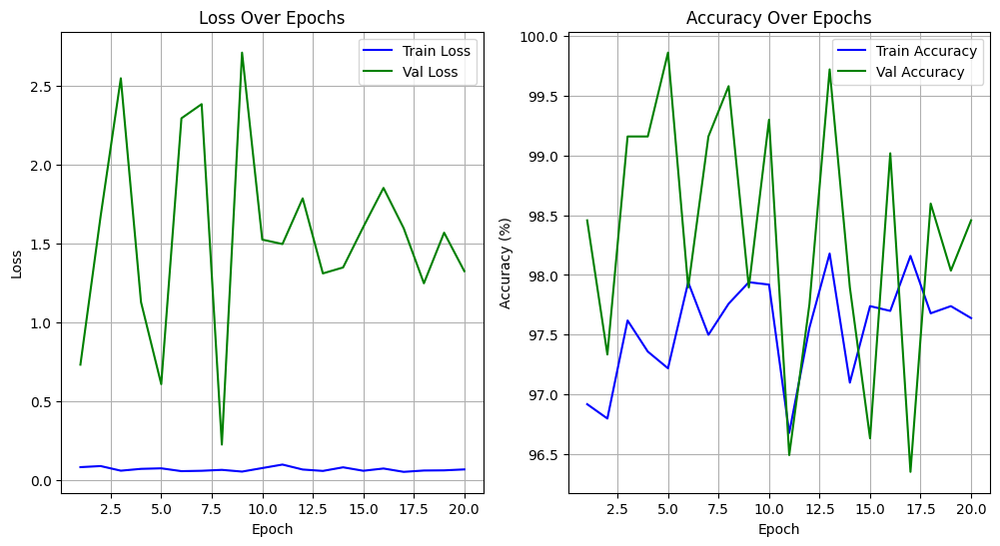

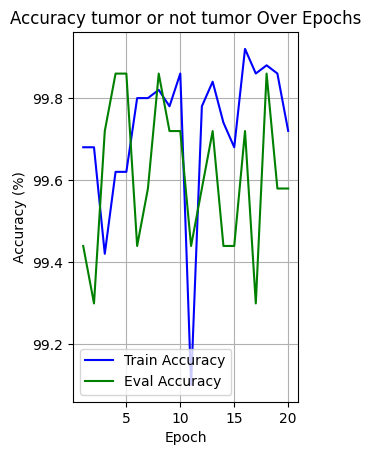

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning y fine tunning con learning rate 0.001
Actualizamos los pesos del modelo a partir del modelo entrenado con las capas congeladas y learning rate 0,001
Volvemos a entrenar con las capas descongeladas
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.0503, Training Accuracy: 98.90%, Tumor Accuracy: 99.86% - Validation Loss: 0.4504, Validation Accuracy: 99.86%, Tumor Accuracy: 99.86
		Epoch [2/100] - Training Loss: 0.0503, Training Accuracy: 98.58%, Tumor Accuracy: 99.88% - Validation Loss: 0.5878, Validation Accuracy: 99.16%, Tumor Accuracy: 99.86
		Epoch [3/100] - Training Loss: 0.0505, Training Accuracy: 98.58%, Tumor Accuracy: 99.88% - Validation Loss: 1.6113, Validation Accuracy: 97.76%, Tumor Accuracy: 99.02
		Epoch [4/100] - Training Loss: 0.0534, Training Accuracy: 98.52%, Tumor Accuracy: 99.86% - Validation Loss: 0.8173, Validation Accuracy: 99.58%, Tumo

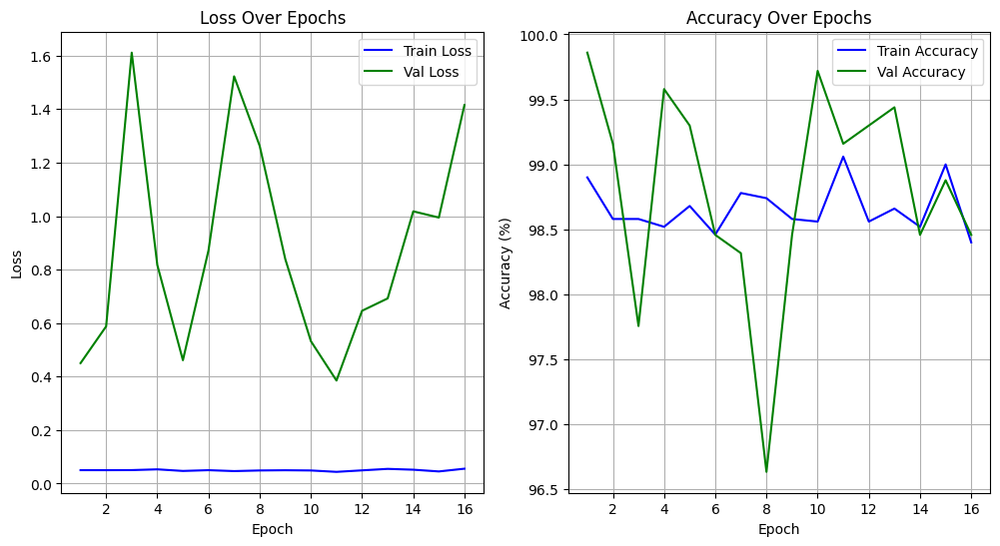

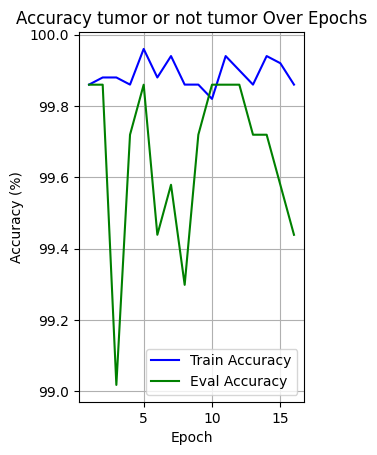

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning y fine tunning con learning rate 0.0001
Actualizamos los pesos del modelo a partir del modelo entrenado con las capas congeladas y learning rate 0,0001
Volvemos a entrenar con las capas descongeladas
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.1943, Training Accuracy: 94.06%, Tumor Accuracy: 98.66% - Validation Loss: 2.1164, Validation Accuracy: 96.35%, Tumor Accuracy: 99.16
		Epoch [2/100] - Training Loss: 0.1923, Training Accuracy: 93.90%, Tumor Accuracy: 98.78% - Validation Loss: 2.1670, Validation Accuracy: 95.93%, Tumor Accuracy: 99.02
		Epoch [3/100] - Training Loss: 0.1879, Training Accuracy: 94.18%, Tumor Accuracy: 98.88% - Validation Loss: 1.6107, Validation Accuracy: 96.91%, Tumor Accuracy: 99.44
		Epoch [4/100] - Training Loss: 0.1966, Training Accuracy: 93.86%, Tumor Accuracy: 98.98% - Validation Loss: 2.1339, Validation Accuracy: 96.91%, Tu

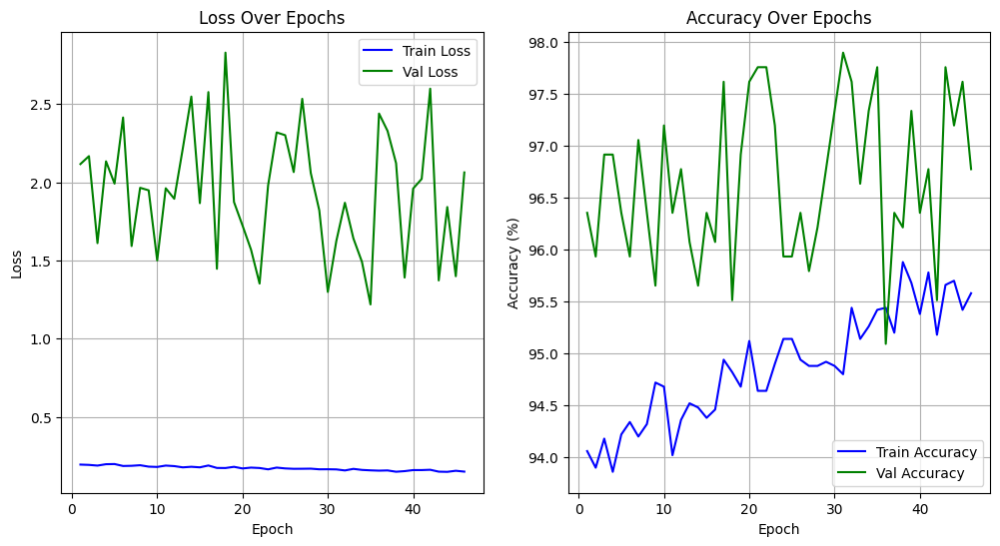

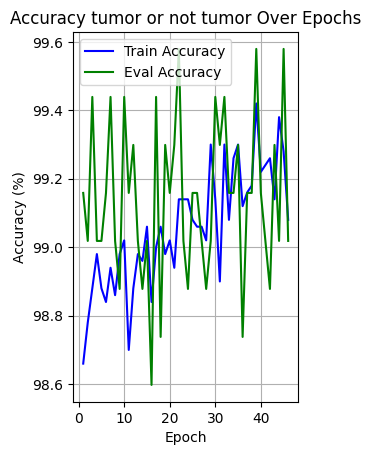

	Proceso de entrenamiento finalizado


In [ ]:
# Entrenamos el grupo de modelos
my_group_trainer.trainer(my_model_group_101_1)

In [ ]:
# Mostramos los resultados obtenidos durante el entrenamiento
plot_group_training_info(my_model_group_101_1)

Evaluamos el modelo con transfer learning con learning rate 0.1
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet101.
			Loss: 7.5139
			Accuracy: 0.8780
			Precision: 0.9068
			Recall: 0.8696
			F1-score: 0.8878

			Accuracy tumor o no tumor: 1.0000
			Precision tumor o no tumor: 1.0000
			Recall tumor o no tumor: 1.0000
			F1-score tumor o no tumor: 1.0000

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9898
			meningioma: 0.6667
			notumor: 1.0
			pituitary: 0.9706

		Sensibilidad (Recall):
			glioma: 0.65
			meningioma: 0.9804
			notumor: 0.9679
			pituitary: 0.88

		Puntaje F1 (F1-score):
			glioma: 0.7847
			meningioma: 0.7937
			notumor: 0.9837
			pituitary: 0.9231

		Pérdida por categoría:
			glioma: 0.3955
			meningioma: 0.0092
			notumor: 0.1015
			pituitary: 0.0807

		Matriz de confusión:


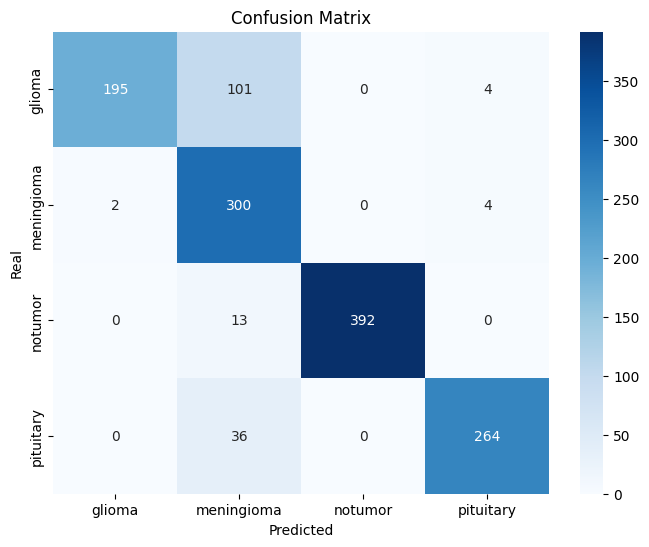

		Matriz de confusión tumor o no tumor:


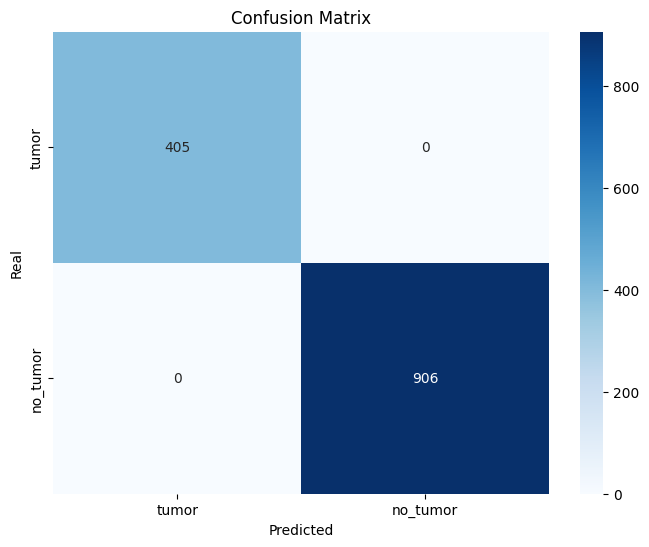

Evaluamos el modelo con transfer learning con learning rate 0.01
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet101.
			Loss: 0.6670
			Accuracy: 0.9024
			Precision: 0.9096
			Recall: 0.8956
			F1-score: 0.9025

			Accuracy tumor o no tumor: 0.9985
			Precision tumor o no tumor: 0.9975
			Recall tumor o no tumor: 0.9989
			F1-score tumor o no tumor: 0.9982

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9231
			meningioma: 0.739
			notumor: 0.995
			pituitary: 0.9812

		Sensibilidad (Recall):
			glioma: 0.8
			meningioma: 0.9346
			notumor: 0.9778
			pituitary: 0.87

		Puntaje F1 (F1-score):
			glioma: 0.8571
			meningioma: 0.8254
			notumor: 0.9863
			pituitary: 0.9223

		Pérdida por categoría:
			glioma: 0.018
			meningioma: 0.0034
			notumor: 0.0152
			pituitary: 0.0155

		Matriz de confusión:


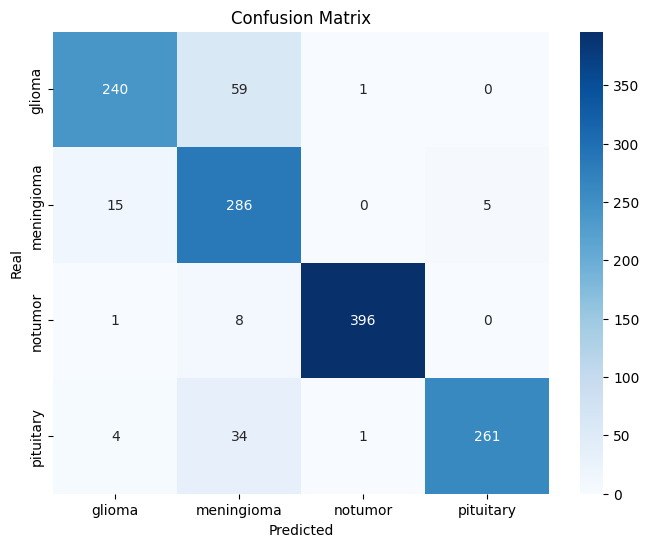

		Matriz de confusión tumor o no tumor:


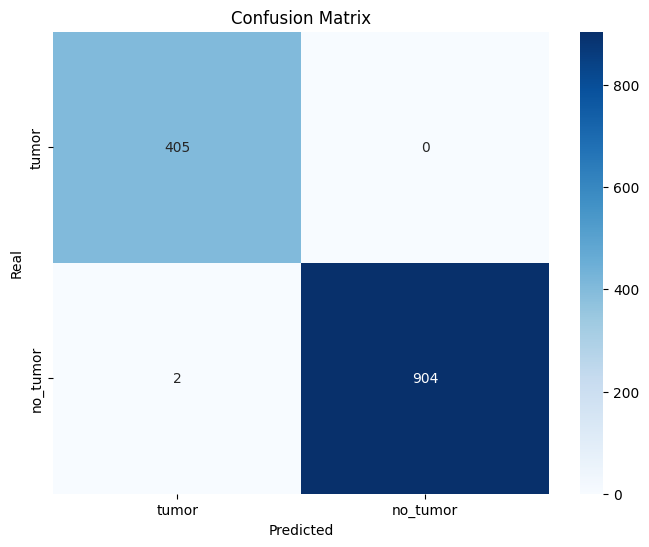

Evaluamos el modelo con transfer learning con learning rate 0.001
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet101.
			Loss: 0.4070
			Accuracy: 0.9252
			Precision: 0.9270
			Recall: 0.9206
			F1-score: 0.9238

			Accuracy tumor o no tumor: 0.9977
			Precision tumor o no tumor: 0.9963
			Recall tumor o no tumor: 0.9983
			F1-score tumor o no tumor: 0.9973

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9685
			meningioma: 0.8
			notumor: 0.9925
			pituitary: 0.9472

		Sensibilidad (Recall):
			glioma: 0.82
			meningioma: 0.9281
			notumor: 0.9778
			pituitary: 0.9567

		Puntaje F1 (F1-score):
			glioma: 0.8881
			meningioma: 0.8593
			notumor: 0.9851
			pituitary: 0.9519

		Pérdida por categoría:
			glioma: 0.0086
			meningioma: 0.0047
			notumor: 0.0115
			pituitary: 0.0031

		Matriz de confusión:


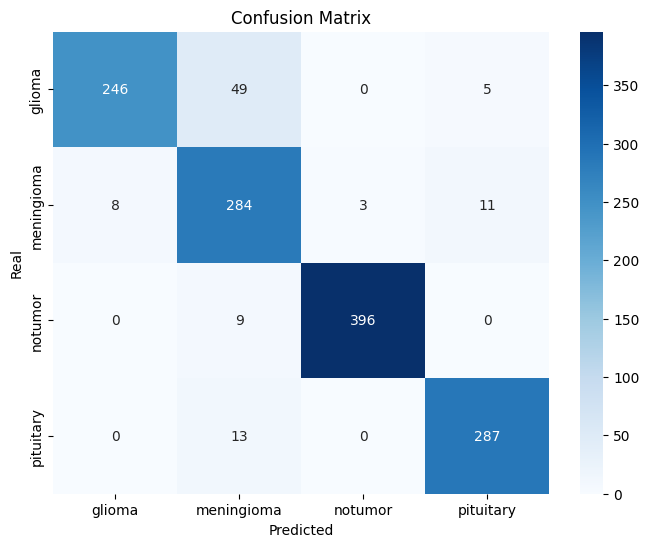

		Matriz de confusión tumor o no tumor:


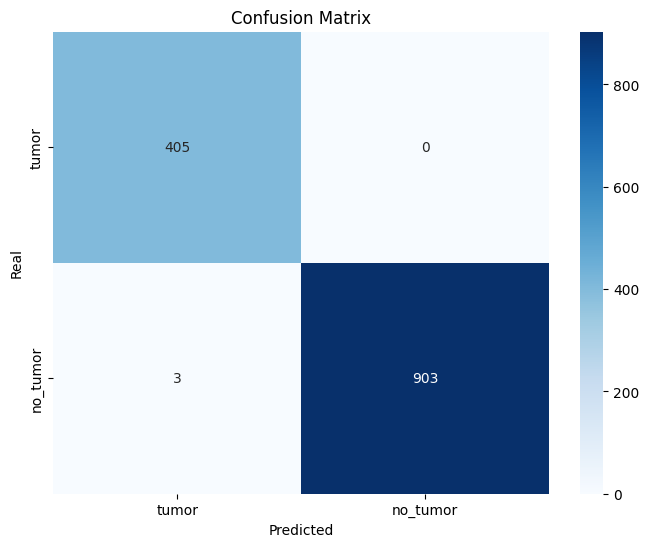

Evaluamos el modelo con transfer learning con learning rate 0.0001
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet101.
			Loss: 0.4860
			Accuracy: 0.8787
			Precision: 0.8775
			Recall: 0.8735
			F1-score: 0.8755

			Accuracy tumor o no tumor: 0.9779
			Precision tumor o no tumor: 0.9666
			Recall tumor o no tumor: 0.9840
			F1-score tumor o no tumor: 0.9752

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9094
			meningioma: 0.7454
			notumor: 0.9294
			pituitary: 0.9256

		Sensibilidad (Recall):
			glioma: 0.8033
			meningioma: 0.7941
			notumor: 0.9432
			pituitary: 0.9533

		Puntaje F1 (F1-score):
			glioma: 0.8531
			meningioma: 0.769
			notumor: 0.9363
			pituitary: 0.9392

		Pérdida por categoría:
			glioma: 0.0078
			meningioma: 0.0109
			notumor: 0.0113
			pituitary: 0.005

		Matriz de confusión:


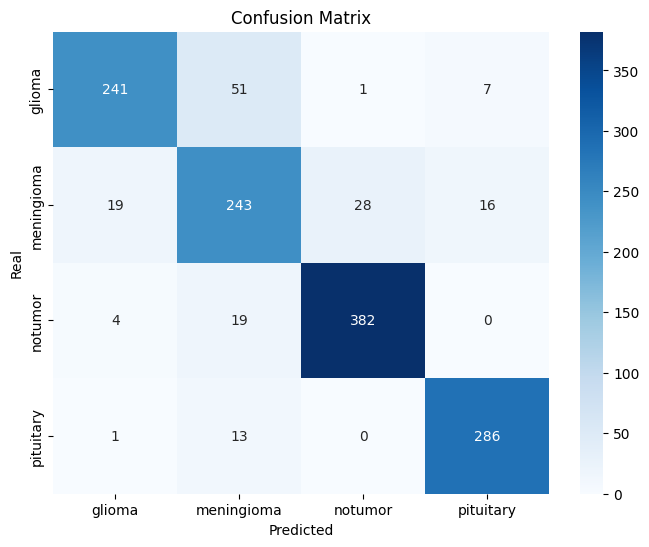

		Matriz de confusión tumor o no tumor:


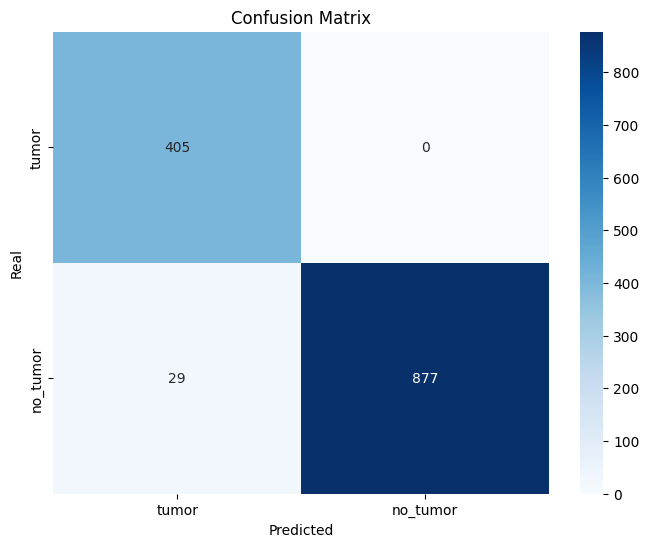

Evaluamos el modelo con fine tunning con learning rate 0.1
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet101.
			Loss: 9.4748
			Accuracy: 0.9047
			Precision: 0.9042
			Recall: 0.9002
			F1-score: 0.9022

			Accuracy tumor o no tumor: 0.9924
			Precision tumor o no tumor: 0.9880
			Recall tumor o no tumor: 0.9945
			F1-score tumor o no tumor: 0.9912

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.8958
			meningioma: 0.7742
			notumor: 0.9749
			pituitary: 0.9718

		Sensibilidad (Recall):
			glioma: 0.86
			meningioma: 0.8627
			notumor: 0.958
			pituitary: 0.92

		Puntaje F1 (F1-score):
			glioma: 0.8776
			meningioma: 0.8161
			notumor: 0.9664
			pituitary: 0.9452

		Pérdida por categoría:
			glioma: 0.062
			meningioma: 0.0479
			notumor: 0.4235
			pituitary: 0.0328

		Matriz de confusión:


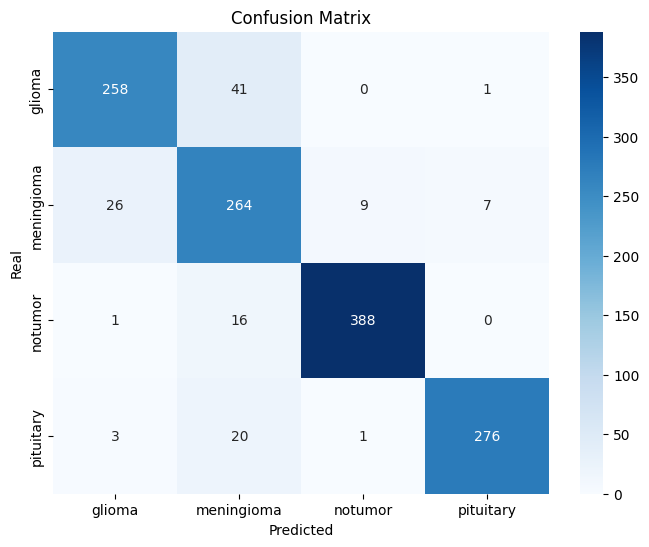

		Matriz de confusión tumor o no tumor:


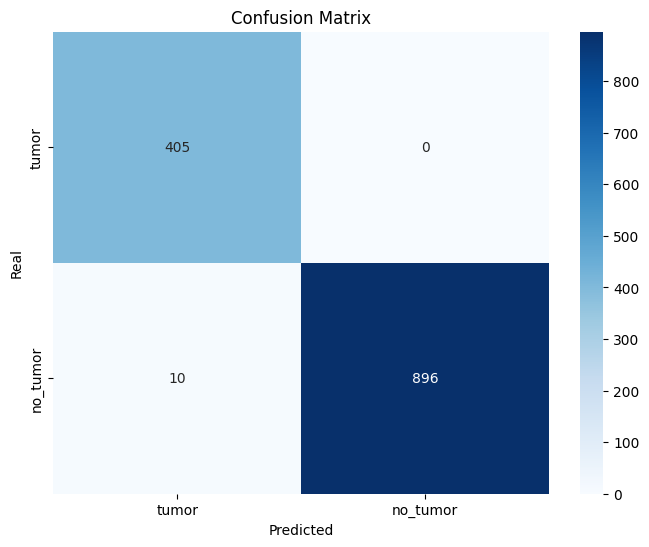

Evaluamos el modelo con fine tunning con learning rate 0.01
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet101.
			Loss: 0.5068
			Accuracy: 0.8871
			Precision: 0.8835
			Recall: 0.8803
			F1-score: 0.8819

			Accuracy tumor o no tumor: 0.9901
			Precision tumor o no tumor: 0.9844
			Recall tumor o no tumor: 0.9928
			F1-score tumor o no tumor: 0.9886

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.7682
			meningioma: 0.8536
			notumor: 0.9682
			pituitary: 0.9443

		Sensibilidad (Recall):
			glioma: 0.9167
			meningioma: 0.6667
			notumor: 0.9778
			pituitary: 0.96

		Puntaje F1 (F1-score):
			glioma: 0.8359
			meningioma: 0.7486
			notumor: 0.973
			pituitary: 0.9521

		Pérdida por categoría:
			glioma: 0.0055
			meningioma: 0.0237
			notumor: 0.0081
			pituitary: 0.0031

		Matriz de confusión:


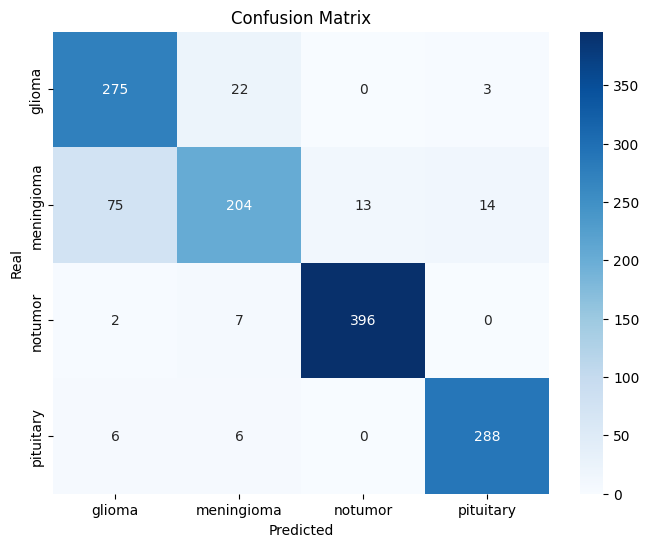

		Matriz de confusión tumor o no tumor:


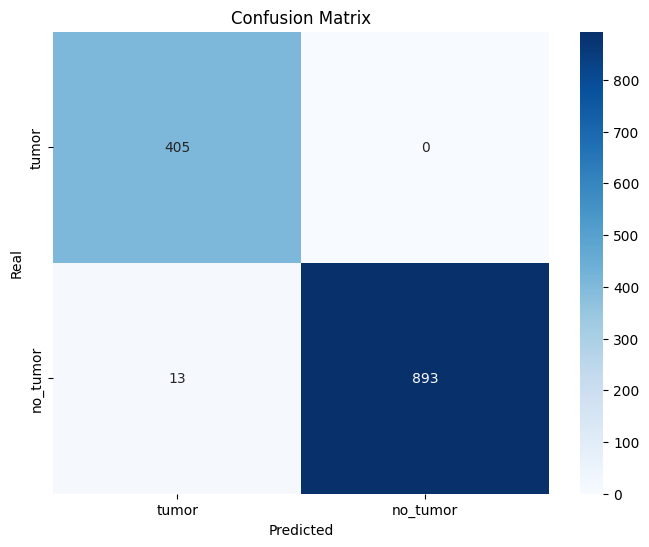

Evaluamos el modelo con fine tunning con learning rate 0.001
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet101.
			Loss: 0.3408
			Accuracy: 0.9252
			Precision: 0.9206
			Recall: 0.9208
			F1-score: 0.9207

			Accuracy tumor o no tumor: 0.9939
			Precision tumor o no tumor: 0.9903
			Recall tumor o no tumor: 0.9956
			F1-score tumor o no tumor: 0.9930

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9164
			meningioma: 0.8436
			notumor: 0.9802
			pituitary: 0.9423

		Sensibilidad (Recall):
			glioma: 0.8767
			meningioma: 0.8464
			notumor: 0.9802
			pituitary: 0.98

		Puntaje F1 (F1-score):
			glioma: 0.8961
			meningioma: 0.845
			notumor: 0.9802
			pituitary: 0.9608

		Pérdida por categoría:
			glioma: 0.0065
			meningioma: 0.008
			notumor: 0.0082
			pituitary: 0.0024

		Matriz de confusión:


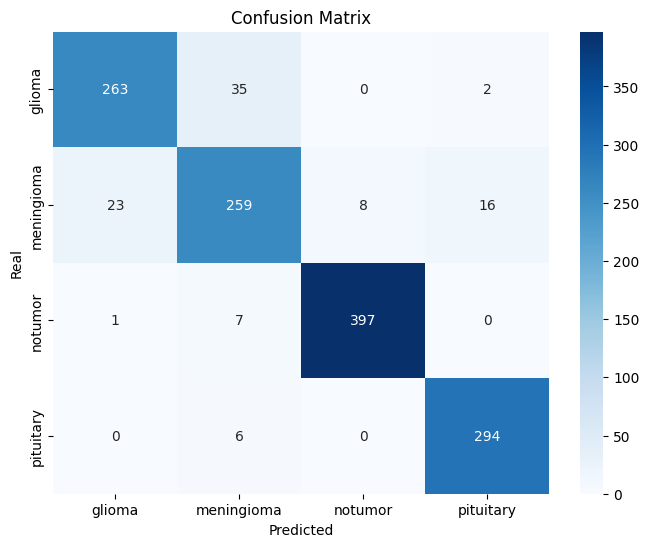

		Matriz de confusión tumor o no tumor:


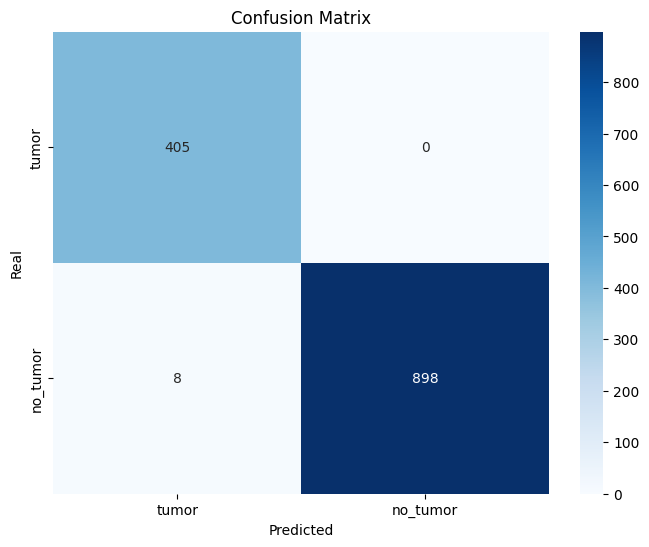

Evaluamos el modelo con fine tunning con learning rate 0.001
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet101.
			Loss: 0.4436
			Accuracy: 0.8612
			Precision: 0.8554
			Recall: 0.8559
			F1-score: 0.8556

			Accuracy tumor o no tumor: 0.9756
			Precision tumor o no tumor: 0.9634
			Recall tumor o no tumor: 0.9823
			F1-score tumor o no tumor: 0.9728

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.8674
			meningioma: 0.7525
			notumor: 0.9216
			pituitary: 0.88

		Sensibilidad (Recall):
			glioma: 0.8067
			meningioma: 0.7353
			notumor: 0.9284
			pituitary: 0.9533

		Puntaje F1 (F1-score):
			glioma: 0.8359
			meningioma: 0.7438
			notumor: 0.925
			pituitary: 0.9152

		Pérdida por categoría:
			glioma: 0.0075
			meningioma: 0.0136
			notumor: 0.0074
			pituitary: 0.0054

		Matriz de confusión:


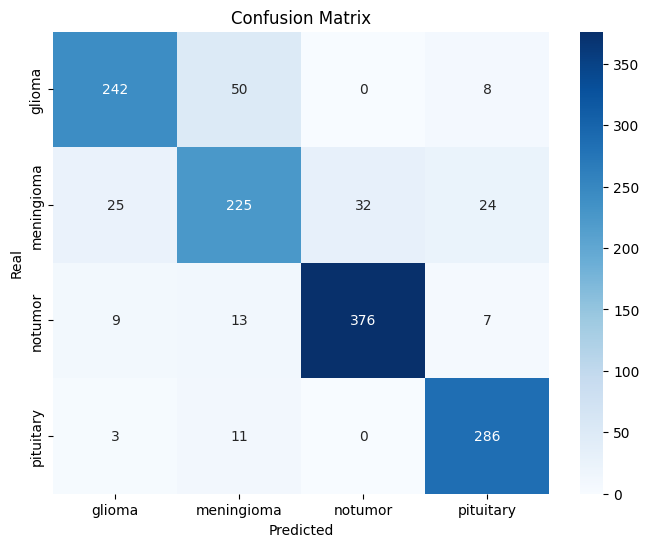

		Matriz de confusión tumor o no tumor:


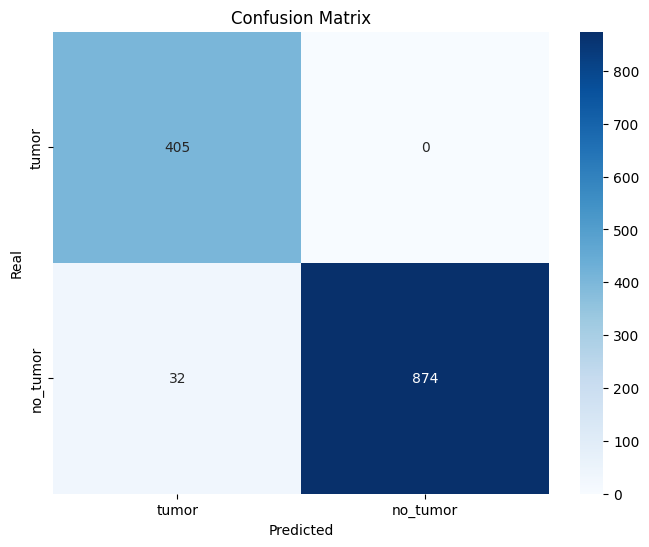

Evaluamos el modelo con transfer learning y fine tunning con learning rate 0.1
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet101.
			Loss: 6.1524
			Accuracy: 0.9184
			Precision: 0.9130
			Recall: 0.9140
			F1-score: 0.9135

			Accuracy tumor o no tumor: 0.9992
			Precision tumor o no tumor: 0.9988
			Recall tumor o no tumor: 0.9994
			F1-score tumor o no tumor: 0.9991

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.8567
			meningioma: 0.8344
			notumor: 0.9975
			pituitary: 0.9635

		Sensibilidad (Recall):
			glioma: 0.8767
			meningioma: 0.8399
			notumor: 0.9728
			pituitary: 0.9667

		Puntaje F1 (F1-score):
			glioma: 0.8666
			meningioma: 0.8371
			notumor: 0.985
			pituitary: 0.9651

		Pérdida por categoría:
			glioma: 0.1055
			meningioma: 0.1096
			notumor: 0.1709
			pituitary: 0.0551

		Matriz de confusión:


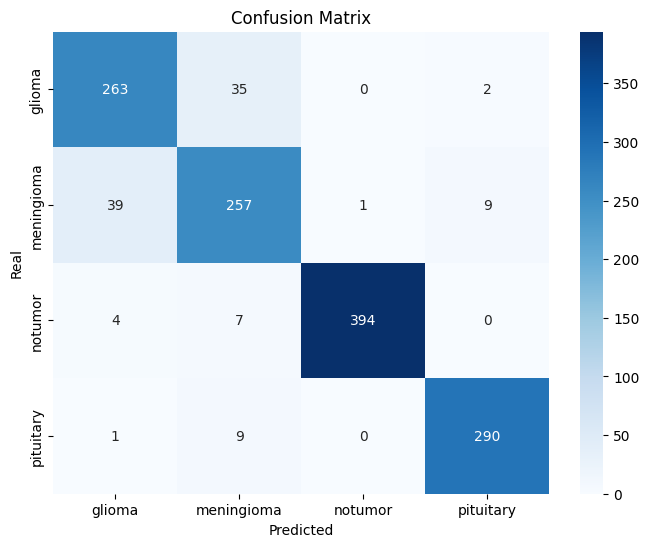

		Matriz de confusión tumor o no tumor:


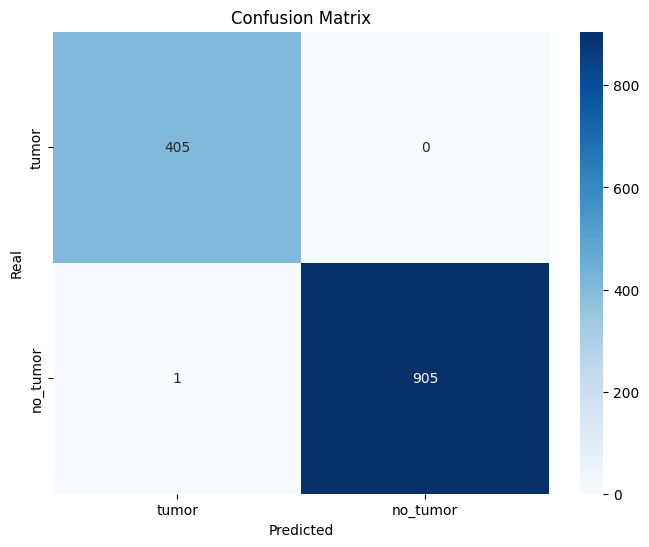

Evaluamos el modelo con transfer learning y fine tunning con learning rate 0.01
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet101.
			Loss: 0.6879
			Accuracy: 0.9191
			Precision: 0.9157
			Recall: 0.9141
			F1-score: 0.9149

			Accuracy tumor o no tumor: 0.9947
			Precision tumor o no tumor: 0.9915
			Recall tumor o no tumor: 0.9961
			F1-score tumor o no tumor: 0.9938

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9432
			meningioma: 0.8344
			notumor: 0.9827
			pituitary: 0.9027

		Sensibilidad (Recall):
			glioma: 0.83
			meningioma: 0.8562
			notumor: 0.9802
			pituitary: 0.99

		Puntaje F1 (F1-score):
			glioma: 0.883
			meningioma: 0.8452
			notumor: 0.9815
			pituitary: 0.9444

		Pérdida por categoría:
			glioma: 0.0158
			meningioma: 0.0107
			notumor: 0.0195
			pituitary: 0.0009

		Matriz de confusión:


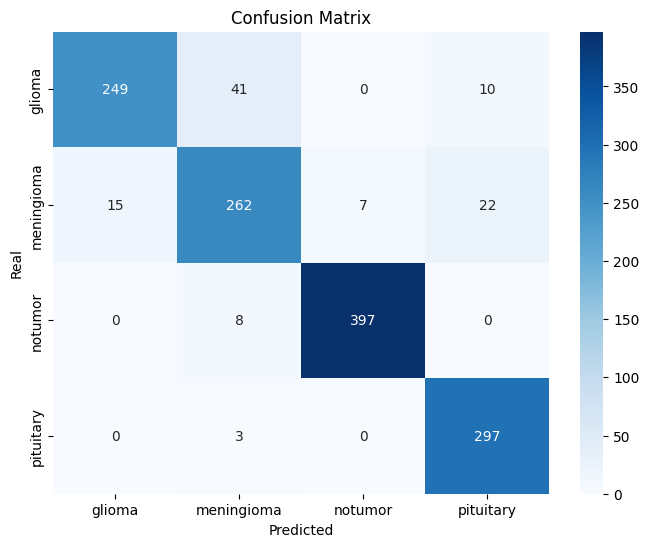

		Matriz de confusión tumor o no tumor:


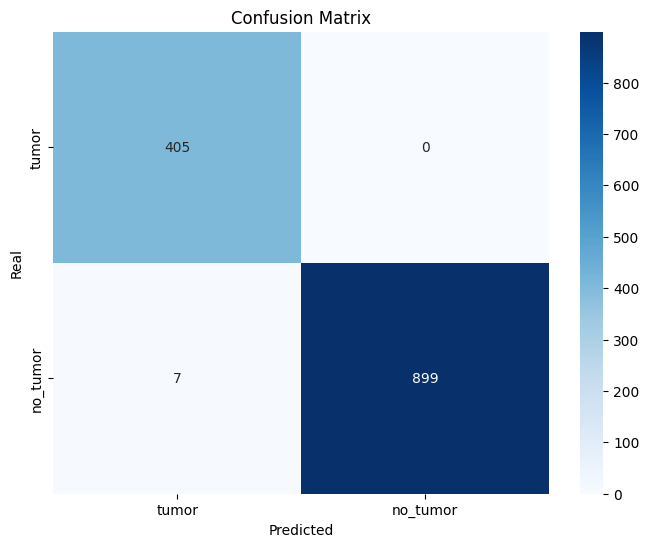

Evaluamos el modelo con transfer learning y fine tunning con learning rate 0.001
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet101.
			Loss: 0.4887
			Accuracy: 0.9199
			Precision: 0.9172
			Recall: 0.9152
			F1-score: 0.9162

			Accuracy tumor o no tumor: 0.9985
			Precision tumor o no tumor: 0.9975
			Recall tumor o no tumor: 0.9989
			F1-score tumor o no tumor: 0.9982

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9134
			meningioma: 0.8036
			notumor: 0.995
			pituitary: 0.9568

		Sensibilidad (Recall):
			glioma: 0.8433
			meningioma: 0.8824
			notumor: 0.9753
			pituitary: 0.96

		Puntaje F1 (F1-score):
			glioma: 0.8769
			meningioma: 0.8411
			notumor: 0.985
			pituitary: 0.9584

		Pérdida por categoría:
			glioma: 0.0086
			meningioma: 0.0056
			notumor: 0.0156
			pituitary: 0.0029

		Matriz de confusión:


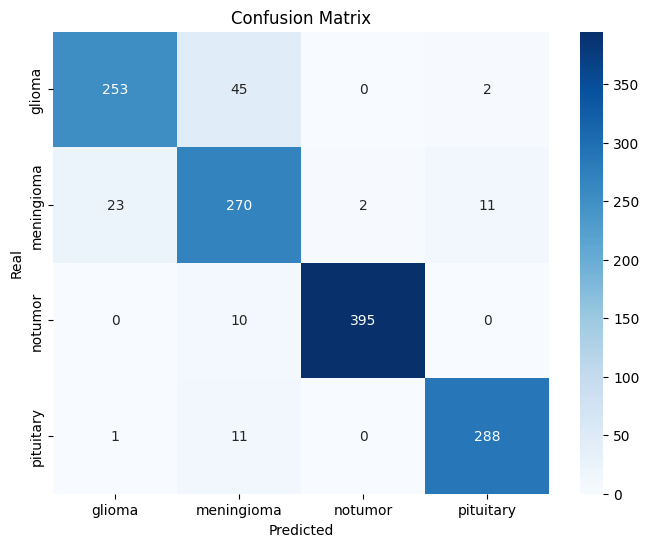

		Matriz de confusión tumor o no tumor:


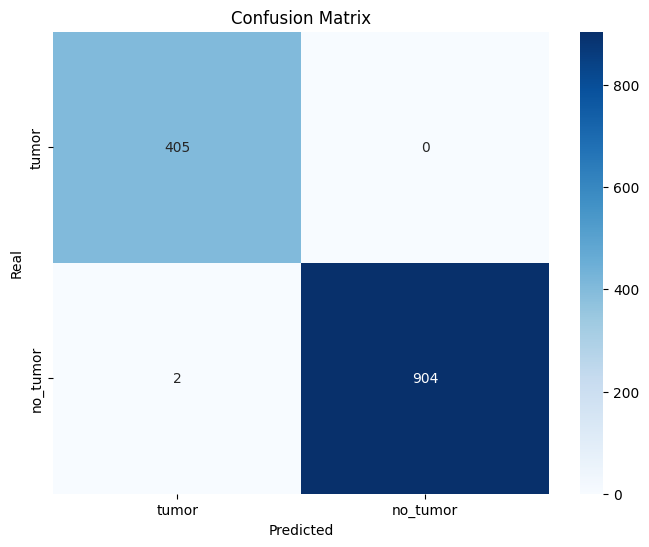

Evaluamos el modelo con transfer learning y fine tunning con learning rate 0.0001
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet101.
			Loss: 0.4611
			Accuracy: 0.9008
			Precision: 0.9026
			Recall: 0.8952
			F1-score: 0.8989

			Accuracy tumor o no tumor: 0.9832
			Precision tumor o no tumor: 0.9742
			Recall tumor o no tumor: 0.9879
			F1-score tumor o no tumor: 0.9810

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9567
			meningioma: 0.7692
			notumor: 0.9469
			pituitary: 0.9377

		Sensibilidad (Recall):
			glioma: 0.81
			meningioma: 0.8497
			notumor: 0.9679
			pituitary: 0.9533

		Puntaje F1 (F1-score):
			glioma: 0.8773
			meningioma: 0.8075
			notumor: 0.9573
			pituitary: 0.9455

		Pérdida por categoría:
			glioma: 0.0079
			meningioma: 0.009
			notumor: 0.0114
			pituitary: 0.0045

		Matriz de confusión:


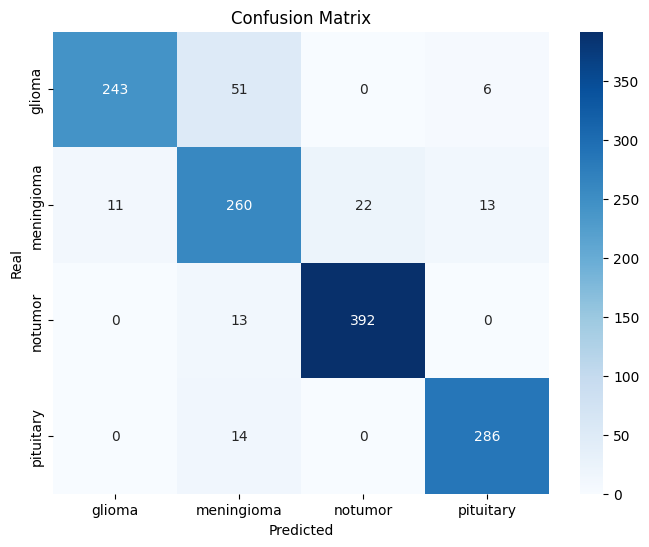

		Matriz de confusión tumor o no tumor:


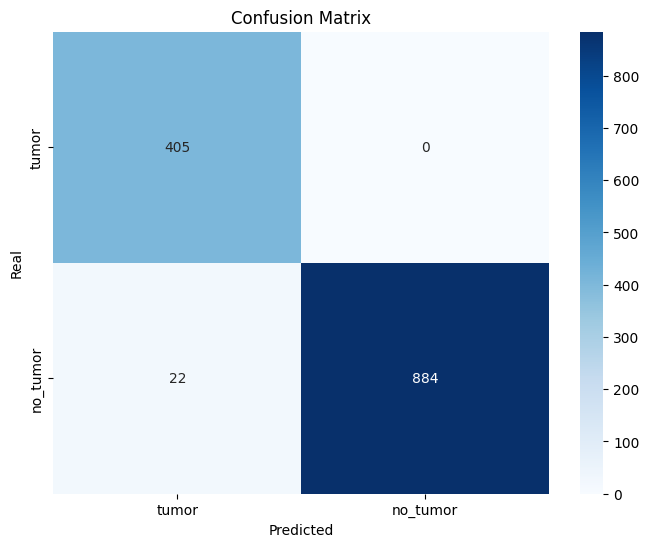

In [ ]:
#Evaluamos los resultados del grupo
my_group_evaluator.eval(my_dataset.test_loader, my_model_group_101_1)

In [ ]:
# Creamos una inteligencia compartida
min_accuracy_value = 0.90
my_model_group_101_1.create_shared_model(min_accuracy_value)

Número de modelos que cumplen con la condición: 8


	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet101.
			Loss: 1.9296
			Accuracy: 0.9260
			Precision: 0.9222
			Recall: 0.9217
			F1-score: 0.9219

			Accuracy tumor o no tumor: 1.0000
			Precision tumor o no tumor: 1.0000
			Recall tumor o no tumor: 1.0000
			F1-score tumor o no tumor: 1.0000

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.8986
			meningioma: 0.8267
			notumor: 1.0
			pituitary: 0.9633

		Sensibilidad (Recall):
			glioma: 0.8567
			meningioma: 0.8889
			notumor: 0.9778
			pituitary: 0.9633

		Puntaje F1 (F1-score):
			glioma: 0.8771
			meningioma: 0.8567
			notumor: 0.9888
			pituitary: 0.9633

		Pérdida por categoría:
			glioma: 0.0271
			meningioma: 0.0182
			notumor: 0.0717
			pituitary: 0.0077

		Matriz de confusión:


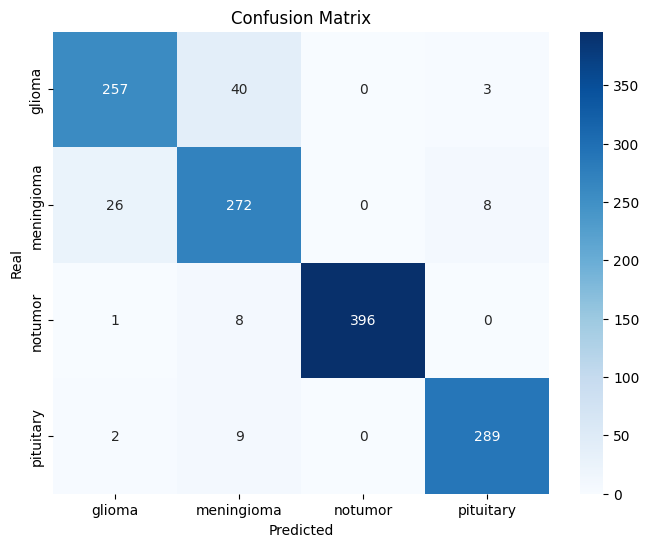

		Matriz de confusión tumor o no tumor:


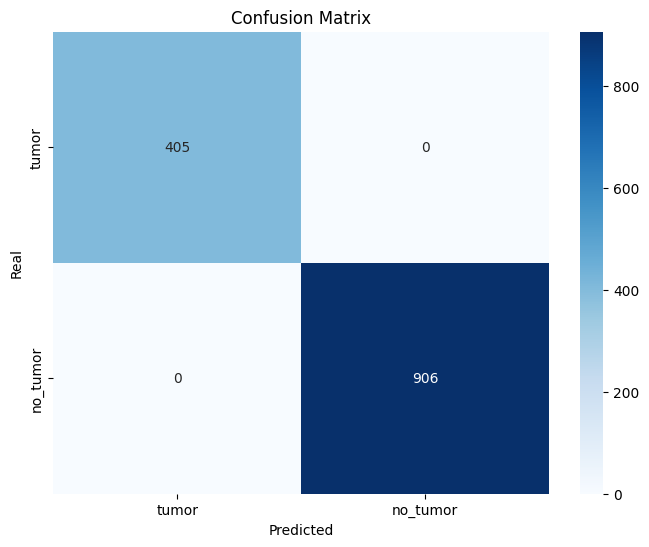

In [ ]:
# Comprobamos el rendimiento de la inteligencia compartida
evaluate(my_model_group_101_1.shared_model, my_dataset.test_loader, my_dataset.no_tumor_label_position)

In [ ]:
#guardado de todo un grupo

save_group_model(my_model_group_101_1)

Guardando los modelos con Transfer Learning.
Guardando los modelos con Fine Tunning.
Guardando los modelos con Transfer Learning y Fine Tunning.
Guardando la intenligencia compartida
Comprimiendo la carpeta con los modelos y subiendo al drive
proceso de guardado finalizado


## Resnet 152

In [ ]:
# Creamos el grupo de modelos
model_name = "resnet152"

my_model_group_152_1 = MyResnetGroupModel(model_name, my_dataset.num_classes)

Downloading: "https://download.pytorch.org/models/resnet152-f82ba261.pth" to /root/.cache/torch/hub/checkpoints/resnet152-f82ba261.pth
100%|██████████| 230M/230M [00:16<00:00, 14.7MB/s]


Entrenando el modelo con transfer learning con learning rate 0.1
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 1.7475, Training Accuracy: 80.38%, Tumor Accuracy: 96.34% - Validation Loss: 3.7524, Validation Accuracy: 94.39%, Tumor Accuracy: 99.30
		Epoch [2/100] - Training Loss: 0.5843, Training Accuracy: 89.98%, Tumor Accuracy: 98.52% - Validation Loss: 31.5483, Validation Accuracy: 90.60%, Tumor Accuracy: 99.16
		Epoch [3/100] - Training Loss: 0.8343, Training Accuracy: 89.76%, Tumor Accuracy: 98.42% - Validation Loss: 15.2928, Validation Accuracy: 95.23%, Tumor Accuracy: 99.30
		Epoch [4/100] - Training Loss: 0.6295, Training Accuracy: 92.34%, Tumor Accuracy: 98.90% - Validation Loss: 90.2290, Validation Accuracy: 97.76%, Tumor Accuracy: 99.16
		Epoch [5/100] - Training Loss: 0.4769, Training Accuracy: 93.42%, Tumor Accuracy: 99.42% - Validation Loss: 65.7014, Validation Accuracy: 96.49%, Tumor Accuracy: 98.88
		Epoch [6/100] - Trai

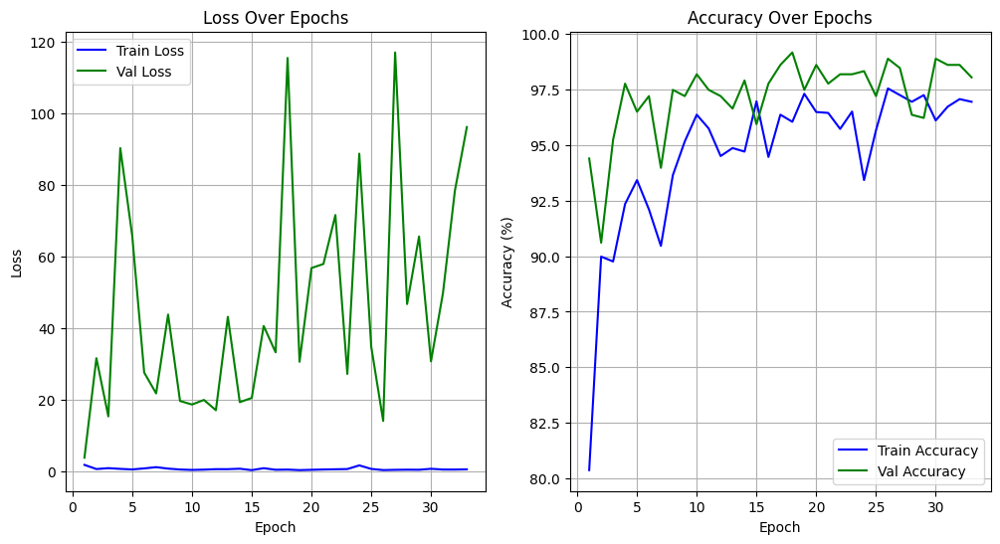

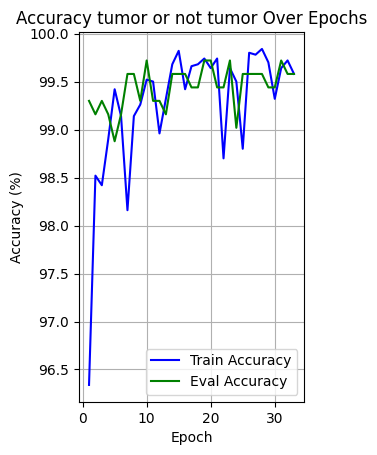

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning con learning rate 0.01
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.4030, Training Accuracy: 84.56%, Tumor Accuracy: 96.42% - Validation Loss: 2.4951, Validation Accuracy: 92.57%, Tumor Accuracy: 99.02
		Epoch [2/100] - Training Loss: 0.2145, Training Accuracy: 92.08%, Tumor Accuracy: 98.94% - Validation Loss: 4.5673, Validation Accuracy: 97.48%, Tumor Accuracy: 99.44
		Epoch [3/100] - Training Loss: 0.1527, Training Accuracy: 94.24%, Tumor Accuracy: 99.20% - Validation Loss: 2.3319, Validation Accuracy: 97.90%, Tumor Accuracy: 99.44
		Epoch [4/100] - Training Loss: 0.1377, Training Accuracy: 95.50%, Tumor Accuracy: 99.58% - Validation Loss: 6.7131, Validation Accuracy: 95.79%, Tumor Accuracy: 99.58
		Epoch [5/100] - Training Loss: 0.1155, Training Accuracy: 95.80%, Tumor Accuracy: 99.64% - Validation Loss: 2.2331, Validation Accuracy: 98.32%, Tumor Accu

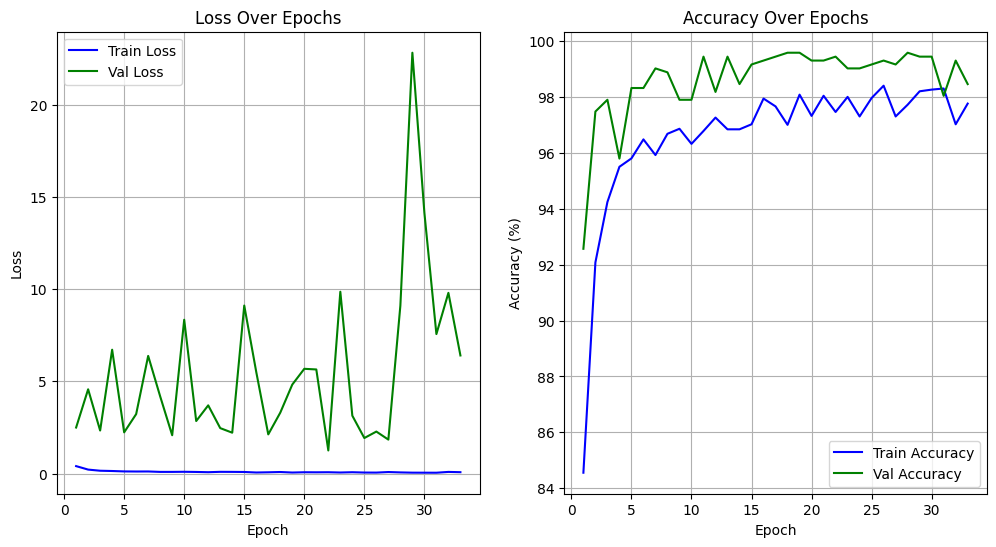

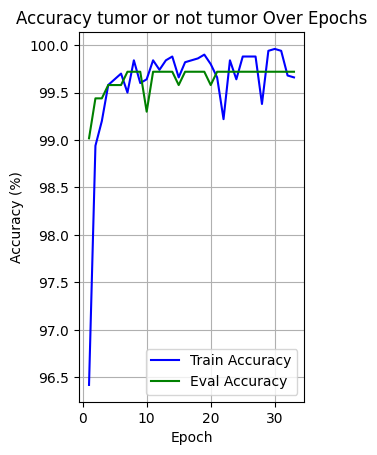

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning con learning rate 0.001
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.7204, Training Accuracy: 78.50%, Tumor Accuracy: 93.48% - Validation Loss: 5.3313, Validation Accuracy: 89.76%, Tumor Accuracy: 98.46
		Epoch [2/100] - Training Loss: 0.4050, Training Accuracy: 88.44%, Tumor Accuracy: 97.54% - Validation Loss: 3.7411, Validation Accuracy: 92.99%, Tumor Accuracy: 98.88
		Epoch [3/100] - Training Loss: 0.3345, Training Accuracy: 89.78%, Tumor Accuracy: 98.06% - Validation Loss: 3.8423, Validation Accuracy: 94.25%, Tumor Accuracy: 98.88
		Epoch [4/100] - Training Loss: 0.2969, Training Accuracy: 90.70%, Tumor Accuracy: 98.32% - Validation Loss: 3.2483, Validation Accuracy: 95.37%, Tumor Accuracy: 99.02
		Epoch [5/100] - Training Loss: 0.2636, Training Accuracy: 91.92%, Tumor Accuracy: 98.44% - Validation Loss: 3.4956, Validation Accuracy: 95.79%, Tumor Acc

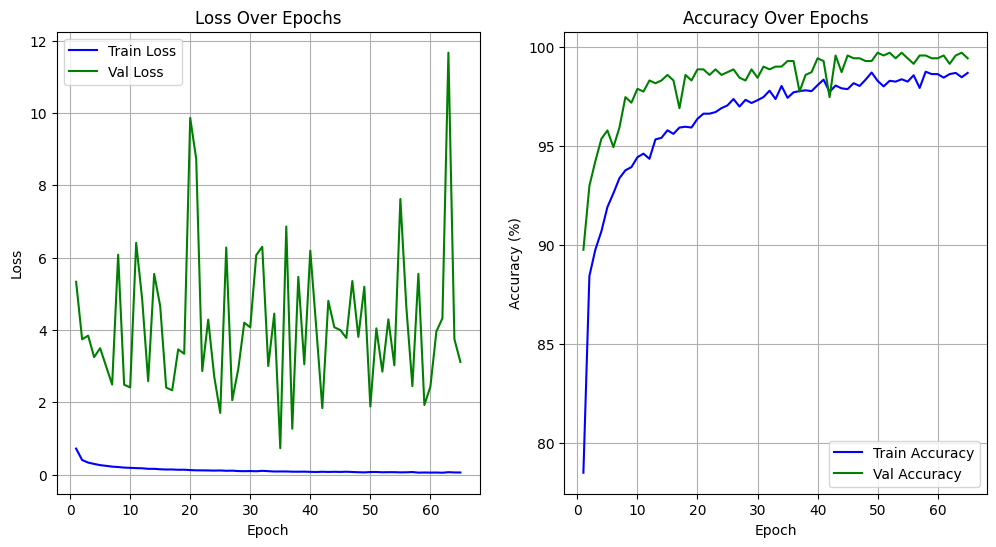

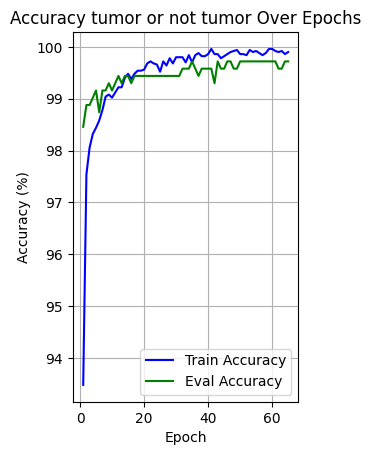

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning con learning rate 0.0001
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 1.2486, Training Accuracy: 57.29%, Tumor Accuracy: 82.74% - Validation Loss: 13.1828, Validation Accuracy: 78.82%, Tumor Accuracy: 92.15
		Epoch [2/100] - Training Loss: 1.0005, Training Accuracy: 77.86%, Tumor Accuracy: 94.80% - Validation Loss: 10.5989, Validation Accuracy: 85.13%, Tumor Accuracy: 96.35
		Epoch [3/100] - Training Loss: 0.8407, Training Accuracy: 80.98%, Tumor Accuracy: 95.72% - Validation Loss: 8.8346, Validation Accuracy: 86.54%, Tumor Accuracy: 97.62
		Epoch [4/100] - Training Loss: 0.7413, Training Accuracy: 83.06%, Tumor Accuracy: 96.08% - Validation Loss: 7.6933, Validation Accuracy: 88.36%, Tumor Accuracy: 97.76
		Epoch [5/100] - Training Loss: 0.6653, Training Accuracy: 84.04%, Tumor Accuracy: 96.34% - Validation Loss: 7.0178, Validation Accuracy: 88.78%, Tumor 

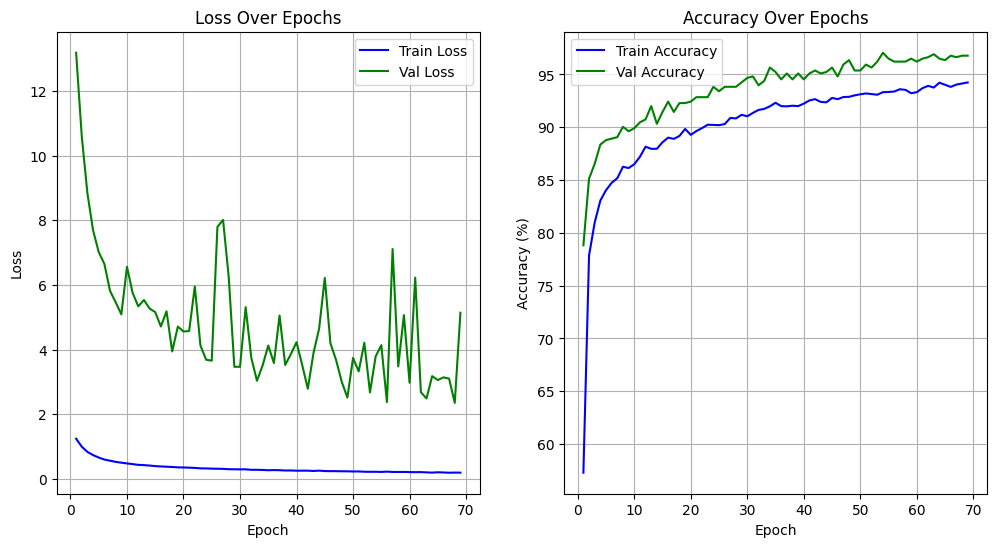

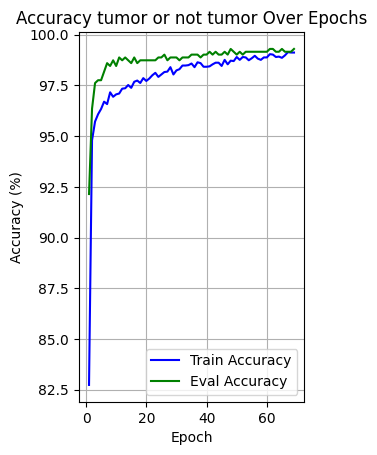

	Proceso de entrenamiento finalizado
Entrenando el modelo con fine tunning con learning rate 0.1
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 1.9620, Training Accuracy: 80.72%, Tumor Accuracy: 94.96% - Validation Loss: 12.1697, Validation Accuracy: 90.74%, Tumor Accuracy: 98.60
		Epoch [2/100] - Training Loss: 1.0758, Training Accuracy: 88.18%, Tumor Accuracy: 97.92% - Validation Loss: 17.2403, Validation Accuracy: 95.23%, Tumor Accuracy: 98.60
		Epoch [3/100] - Training Loss: 0.5581, Training Accuracy: 92.46%, Tumor Accuracy: 98.96% - Validation Loss: 19.1155, Validation Accuracy: 93.97%, Tumor Accuracy: 99.44
		Epoch [4/100] - Training Loss: 0.7788, Training Accuracy: 90.92%, Tumor Accuracy: 99.10% - Validation Loss: 17.9234, Validation Accuracy: 92.15%, Tumor Accuracy: 99.16
		Epoch [5/100] - Training Loss: 0.5545, Training Accuracy: 92.66%, Tumor Accuracy: 98.18% - Validation Loss: 72.2295, Validation Accuracy: 96.35%, Tumor Accur

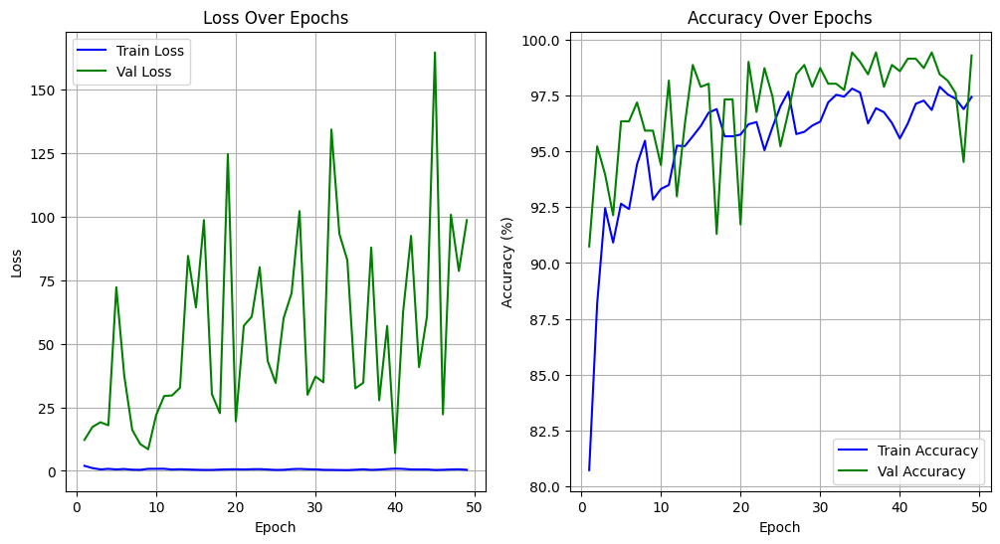

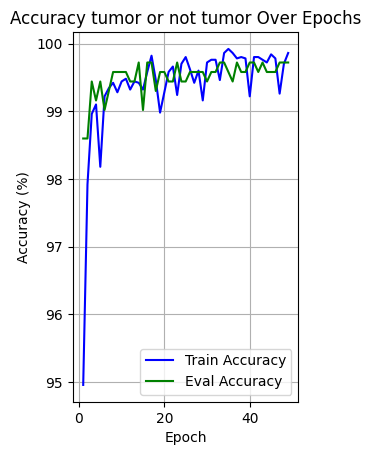

	Proceso de entrenamiento finalizado
Entrenando el modelo con fine tunning con learning rate 0.01
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.4181, Training Accuracy: 84.04%, Tumor Accuracy: 96.40% - Validation Loss: 2.4082, Validation Accuracy: 93.55%, Tumor Accuracy: 99.16
		Epoch [2/100] - Training Loss: 0.2237, Training Accuracy: 92.14%, Tumor Accuracy: 98.40% - Validation Loss: 4.2395, Validation Accuracy: 97.19%, Tumor Accuracy: 98.88
		Epoch [3/100] - Training Loss: 0.1680, Training Accuracy: 94.38%, Tumor Accuracy: 99.20% - Validation Loss: 4.4166, Validation Accuracy: 95.65%, Tumor Accuracy: 99.44
		Epoch [4/100] - Training Loss: 0.1510, Training Accuracy: 95.02%, Tumor Accuracy: 99.34% - Validation Loss: 3.5656, Validation Accuracy: 98.04%, Tumor Accuracy: 99.44
		Epoch [5/100] - Training Loss: 0.1252, Training Accuracy: 95.24%, Tumor Accuracy: 99.58% - Validation Loss: 4.2991, Validation Accuracy: 98.04%, Tumor Accuracy:

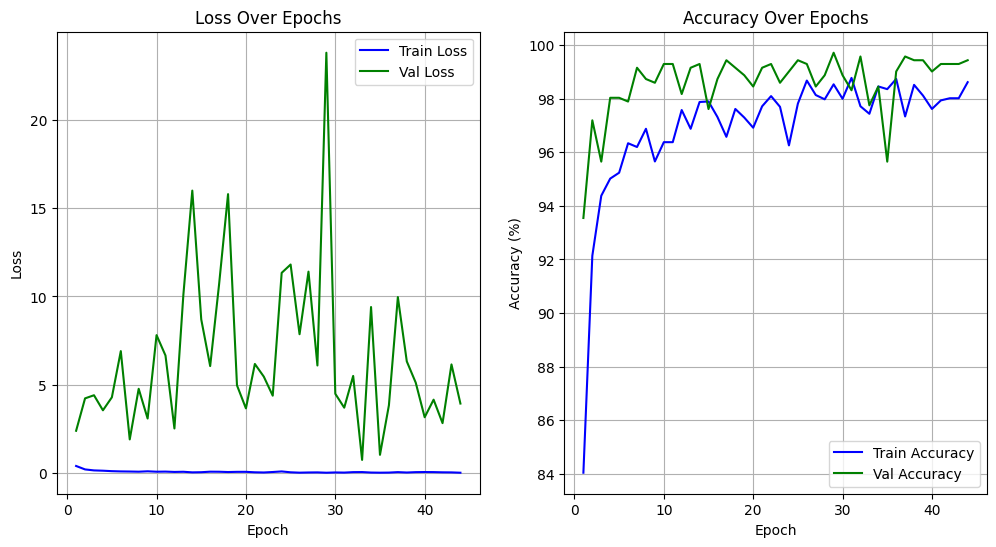

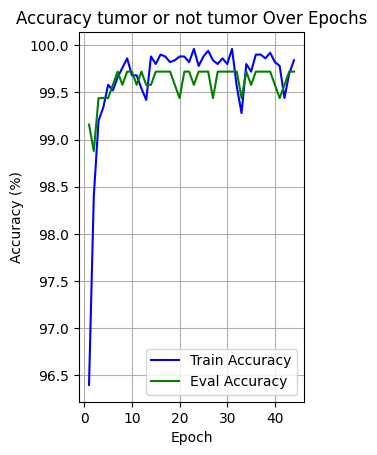

	Proceso de entrenamiento finalizado
Entrenando el modelo con fine tunning con learning rate 0.001
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.7115, Training Accuracy: 78.06%, Tumor Accuracy: 93.82% - Validation Loss: 4.9806, Validation Accuracy: 88.36%, Tumor Accuracy: 98.74
		Epoch [2/100] - Training Loss: 0.4021, Training Accuracy: 87.40%, Tumor Accuracy: 97.26% - Validation Loss: 4.5605, Validation Accuracy: 91.16%, Tumor Accuracy: 98.74
		Epoch [3/100] - Training Loss: 0.3366, Training Accuracy: 89.20%, Tumor Accuracy: 97.86% - Validation Loss: 3.5460, Validation Accuracy: 93.83%, Tumor Accuracy: 99.02
		Epoch [4/100] - Training Loss: 0.2900, Training Accuracy: 91.18%, Tumor Accuracy: 98.32% - Validation Loss: 4.9431, Validation Accuracy: 94.95%, Tumor Accuracy: 99.02
		Epoch [5/100] - Training Loss: 0.2638, Training Accuracy: 91.78%, Tumor Accuracy: 98.50% - Validation Loss: 2.7125, Validation Accuracy: 95.65%, Tumor Accuracy

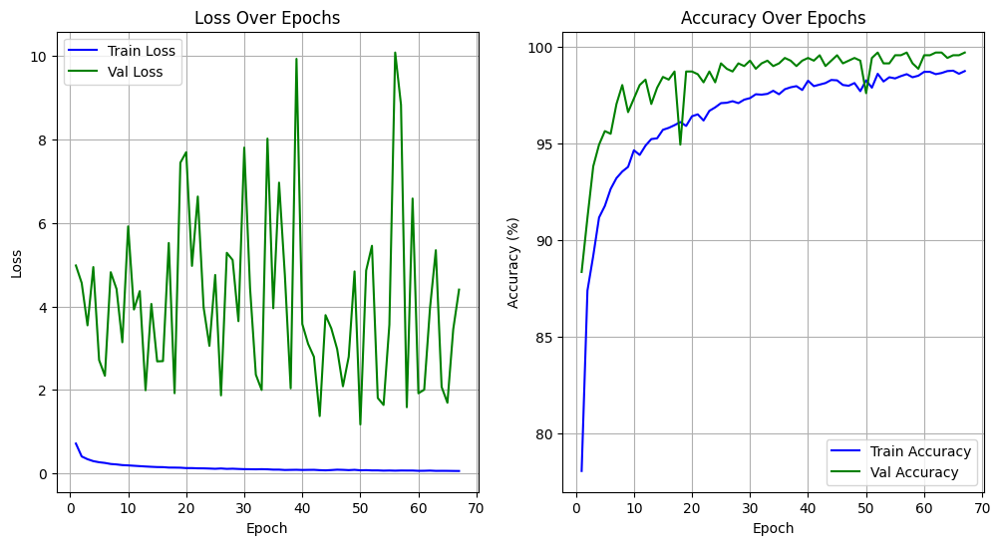

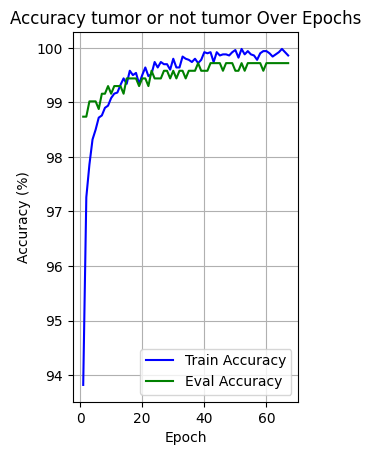

	Proceso de entrenamiento finalizado
Entrenando el modelo con fine tunning con learning rate 0.001
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 1.2315, Training Accuracy: 59.75%, Tumor Accuracy: 85.80% - Validation Loss: 13.1235, Validation Accuracy: 81.07%, Tumor Accuracy: 92.29
		Epoch [2/100] - Training Loss: 0.9869, Training Accuracy: 78.02%, Tumor Accuracy: 94.28% - Validation Loss: 10.1974, Validation Accuracy: 85.41%, Tumor Accuracy: 95.37
		Epoch [3/100] - Training Loss: 0.8300, Training Accuracy: 81.04%, Tumor Accuracy: 95.14% - Validation Loss: 8.5144, Validation Accuracy: 88.36%, Tumor Accuracy: 96.91
		Epoch [4/100] - Training Loss: 0.7284, Training Accuracy: 82.76%, Tumor Accuracy: 95.98% - Validation Loss: 7.7089, Validation Accuracy: 89.48%, Tumor Accuracy: 97.48
		Epoch [5/100] - Training Loss: 0.6586, Training Accuracy: 84.46%, Tumor Accuracy: 96.46% - Validation Loss: 6.8192, Validation Accuracy: 88.36%, Tumor Accura

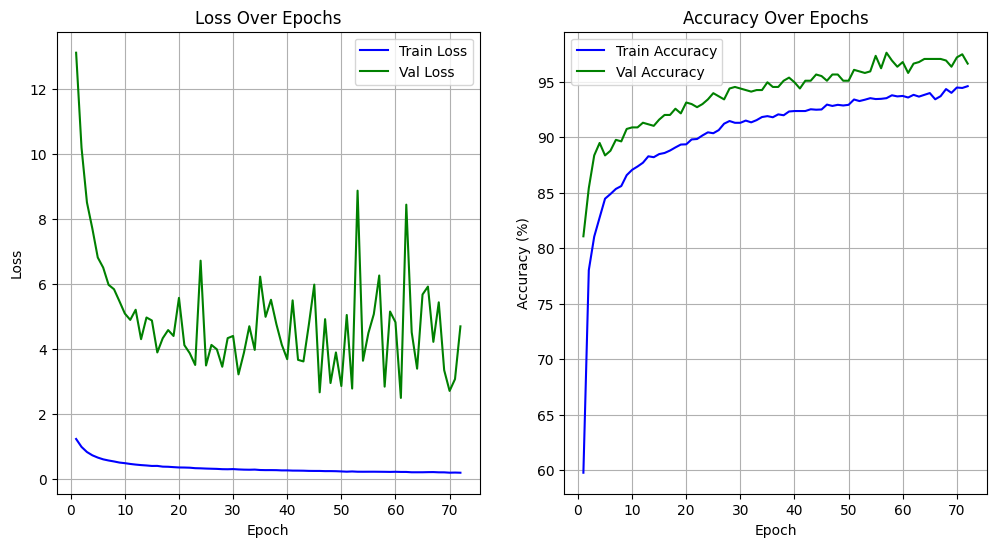

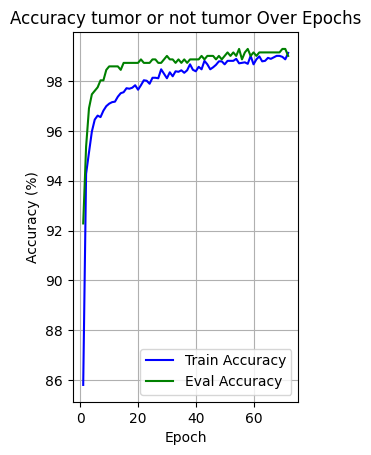

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning y fine tunning con learning rate 0.1
Actualizamos los pesos del modelo a partir del modelo entrenado con las capas congeladas y learning rate 0,1
Volvemos a entrenar con las capas descongeladas
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.4354, Training Accuracy: 96.90%, Tumor Accuracy: 99.72% - Validation Loss: 86.5316, Validation Accuracy: 96.77%, Tumor Accuracy: 99.58
		Epoch [2/100] - Training Loss: 0.7395, Training Accuracy: 96.36%, Tumor Accuracy: 99.64% - Validation Loss: 56.2070, Validation Accuracy: 96.49%, Tumor Accuracy: 99.58
		Epoch [3/100] - Training Loss: 0.9144, Training Accuracy: 95.94%, Tumor Accuracy: 99.50% - Validation Loss: 61.1399, Validation Accuracy: 98.88%, Tumor Accuracy: 99.72
		Epoch [4/100] - Training Loss: 0.5486, Training Accuracy: 96.80%, Tumor Accuracy: 99.76% - Validation Loss: 16.2419, Validation Accuracy: 96.35%, Tumo

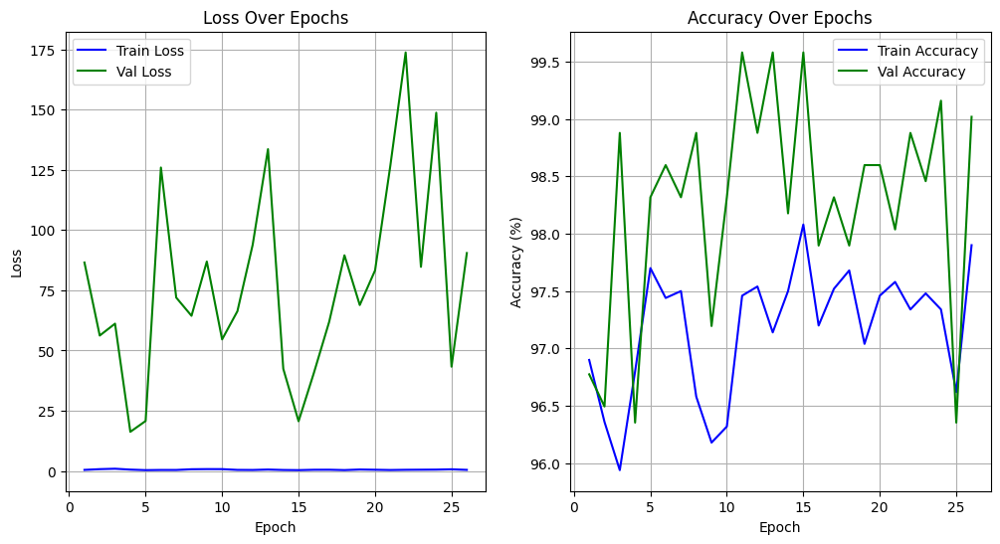

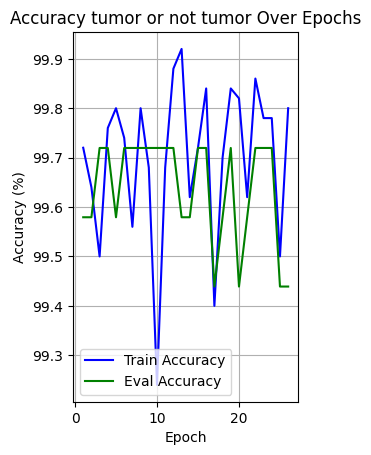

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning y fine tunning con learning rate 0.01
Actualizamos los pesos del modelo a partir del modelo entrenado con las capas congeladas y learning rate 0,01
Volvemos a entrenar con las capas descongeladas
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.0630, Training Accuracy: 97.84%, Tumor Accuracy: 99.76% - Validation Loss: 14.8100, Validation Accuracy: 99.16%, Tumor Accuracy: 99.72
		Epoch [2/100] - Training Loss: 0.0799, Training Accuracy: 97.52%, Tumor Accuracy: 99.78% - Validation Loss: 8.6857, Validation Accuracy: 99.02%, Tumor Accuracy: 99.72
		Epoch [3/100] - Training Loss: 0.0689, Training Accuracy: 97.48%, Tumor Accuracy: 99.86% - Validation Loss: 3.6818, Validation Accuracy: 99.02%, Tumor Accuracy: 99.72
		Epoch [4/100] - Training Loss: 0.0538, Training Accuracy: 98.16%, Tumor Accuracy: 99.88% - Validation Loss: 6.9865, Validation Accuracy: 99.16%, Tumor

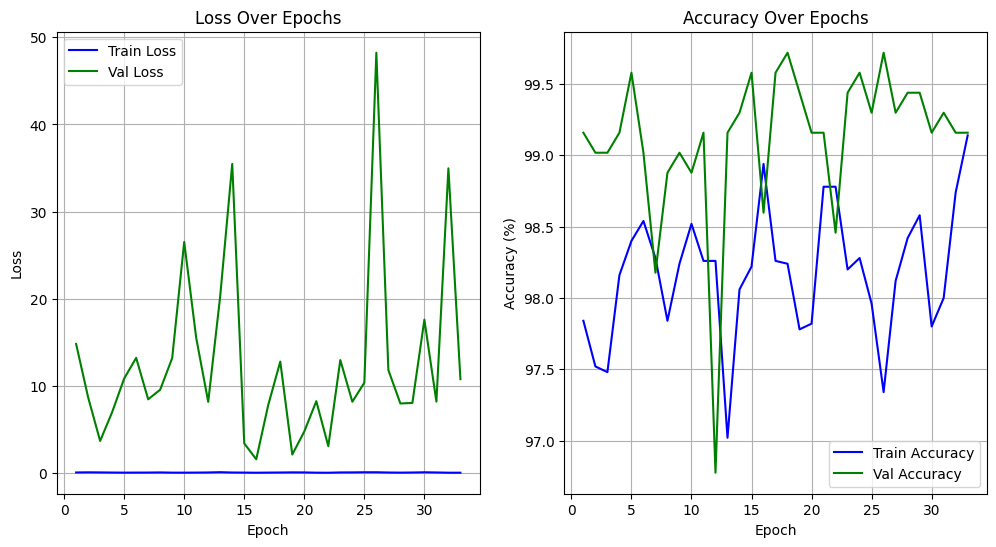

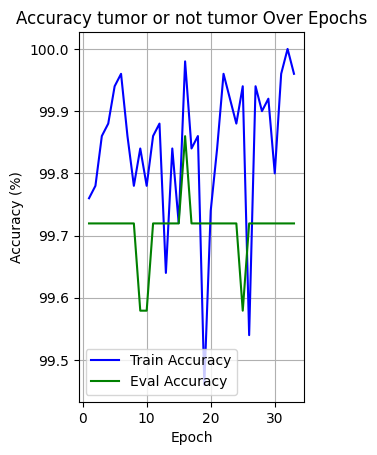

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning y fine tunning con learning rate 0.001
Actualizamos los pesos del modelo a partir del modelo entrenado con las capas congeladas y learning rate 0,001
Volvemos a entrenar con las capas descongeladas
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.0556, Training Accuracy: 98.80%, Tumor Accuracy: 99.88% - Validation Loss: 4.7951, Validation Accuracy: 99.58%, Tumor Accuracy: 99.72
		Epoch [2/100] - Training Loss: 0.0545, Training Accuracy: 98.62%, Tumor Accuracy: 99.92% - Validation Loss: 2.4034, Validation Accuracy: 99.58%, Tumor Accuracy: 99.72
		Epoch [3/100] - Training Loss: 0.0549, Training Accuracy: 98.42%, Tumor Accuracy: 99.96% - Validation Loss: 1.1904, Validation Accuracy: 99.30%, Tumor Accuracy: 99.72
		Epoch [4/100] - Training Loss: 0.0560, Training Accuracy: 98.78%, Tumor Accuracy: 99.84% - Validation Loss: 3.2942, Validation Accuracy: 99.58%, Tumo

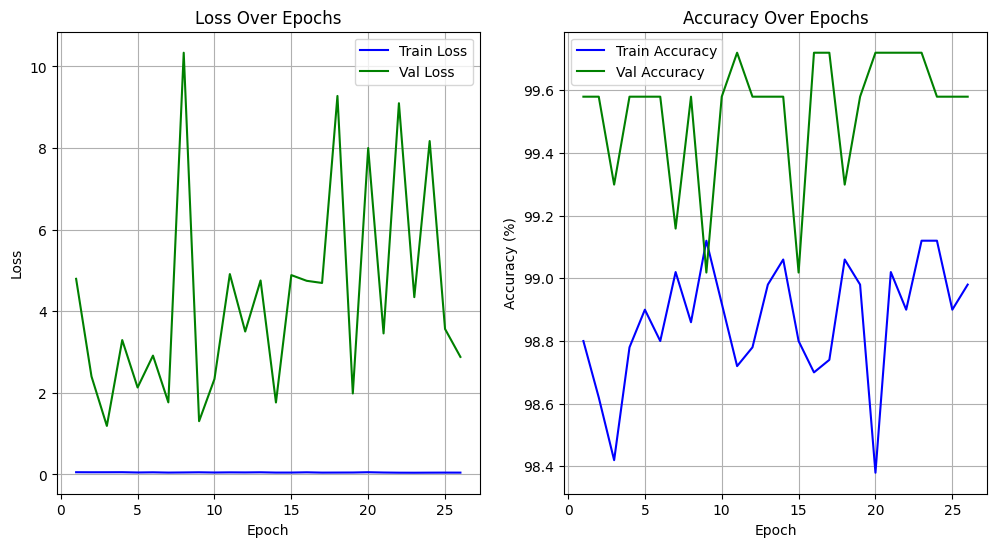

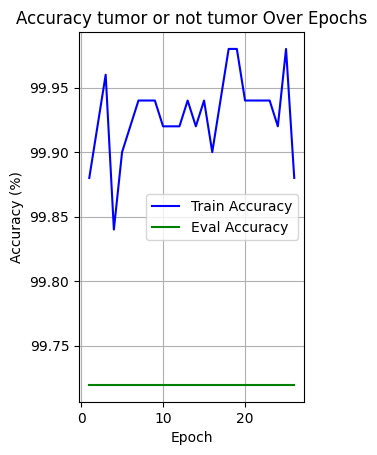

	Proceso de entrenamiento finalizado
Entrenando el modelo con transfer learning y fine tunning con learning rate 0.0001
Actualizamos los pesos del modelo a partir del modelo entrenado con las capas congeladas y learning rate 0,0001
Volvemos a entrenar con las capas descongeladas
	Empieza el proceso de entrenamiento mediante early stopping...
		Epoch [1/100] - Training Loss: 0.1935, Training Accuracy: 94.20%, Tumor Accuracy: 99.02% - Validation Loss: 3.4089, Validation Accuracy: 97.05%, Tumor Accuracy: 99.16
		Epoch [2/100] - Training Loss: 0.1954, Training Accuracy: 94.16%, Tumor Accuracy: 99.06% - Validation Loss: 4.3690, Validation Accuracy: 96.35%, Tumor Accuracy: 99.16
		Epoch [3/100] - Training Loss: 0.1895, Training Accuracy: 94.26%, Tumor Accuracy: 99.00% - Validation Loss: 2.1436, Validation Accuracy: 96.63%, Tumor Accuracy: 99.30
		Epoch [4/100] - Training Loss: 0.1898, Training Accuracy: 94.20%, Tumor Accuracy: 98.92% - Validation Loss: 5.6806, Validation Accuracy: 97.34%, Tu

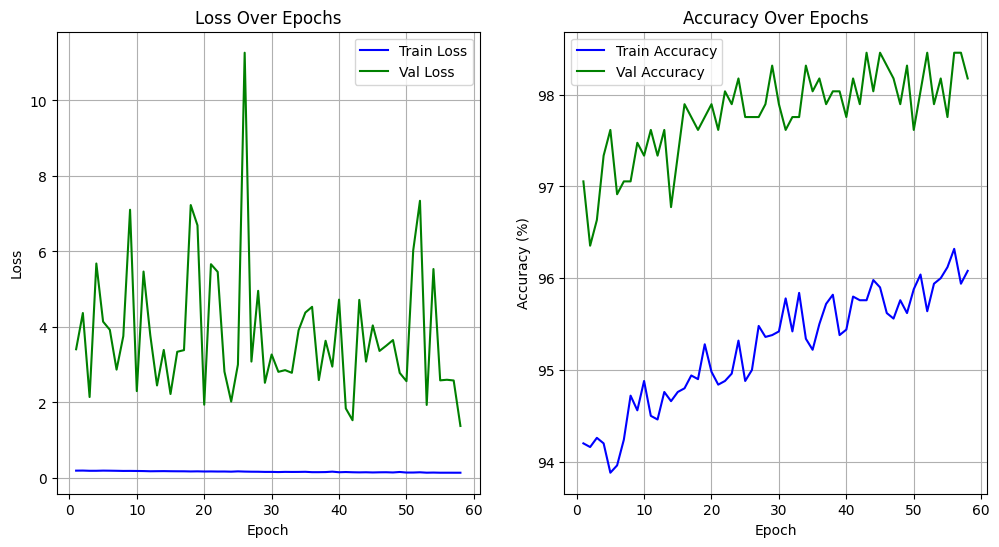

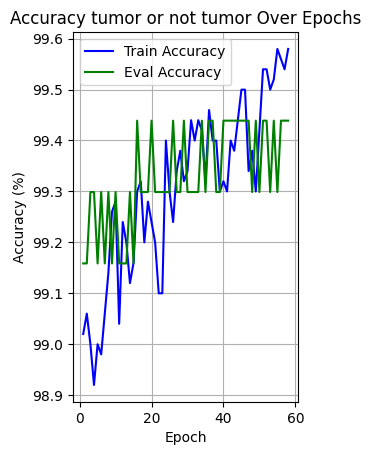

	Proceso de entrenamiento finalizado


In [ ]:
# Entrenamos el grupo de modelos
my_group_trainer.trainer(my_model_group_152_1)

In [ ]:
# Mostramos los resultados obtenidos durante el entrenamiento
plot_group_training_info(my_model_group_152_1)

Evaluamos el modelo con transfer learning con learning rate 0.1
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet152.
			Loss: 28.5827
			Accuracy: 0.9245
			Precision: 0.9189
			Recall: 0.9206
			F1-score: 0.9198

			Accuracy tumor o no tumor: 0.9977
			Precision tumor o no tumor: 0.9963
			Recall tumor o no tumor: 0.9983
			F1-score tumor o no tumor: 0.9973

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.8837
			meningioma: 0.8814
			notumor: 0.9924
			pituitary: 0.9182

		Sensibilidad (Recall):
			glioma: 0.8867
			meningioma: 0.8497
			notumor: 0.9728
			pituitary: 0.9733

		Puntaje F1 (F1-score):
			glioma: 0.8852
			meningioma: 0.8652
			notumor: 0.9825
			pituitary: 0.945

		Pérdida por categoría:
			glioma: 0.0447
			meningioma: 0.0737
			notumor: 1.4328
			pituitary: 0.0062

		Matriz de confusión:


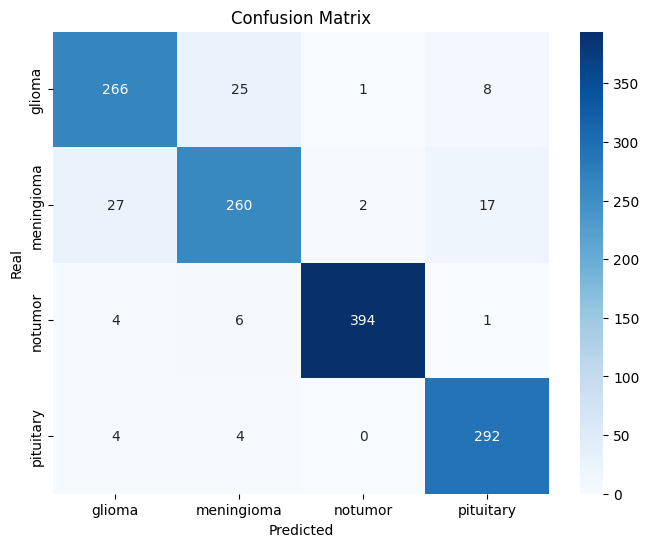

		Matriz de confusión tumor o no tumor:


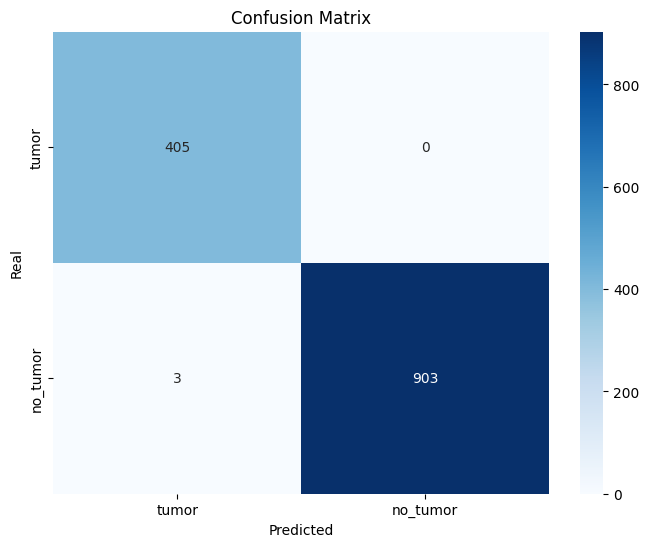

Evaluamos el modelo con transfer learning con learning rate 0.01
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet152.
			Loss: 1.8338
			Accuracy: 0.9245
			Precision: 0.9198
			Recall: 0.9202
			F1-score: 0.9200

			Accuracy tumor o no tumor: 0.9977
			Precision tumor o no tumor: 0.9963
			Recall tumor o no tumor: 0.9983
			F1-score tumor o no tumor: 0.9973

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.8469
			meningioma: 0.8832
			notumor: 0.9925
			pituitary: 0.9568

		Sensibilidad (Recall):
			glioma: 0.9033
			meningioma: 0.8399
			notumor: 0.9778
			pituitary: 0.96

		Puntaje F1 (F1-score):
			glioma: 0.8742
			meningioma: 0.861
			notumor: 0.9851
			pituitary: 0.9584

		Pérdida por categoría:
			glioma: 0.0069
			meningioma: 0.0107
			notumor: 0.0849
			pituitary: 0.0023

		Matriz de confusión:


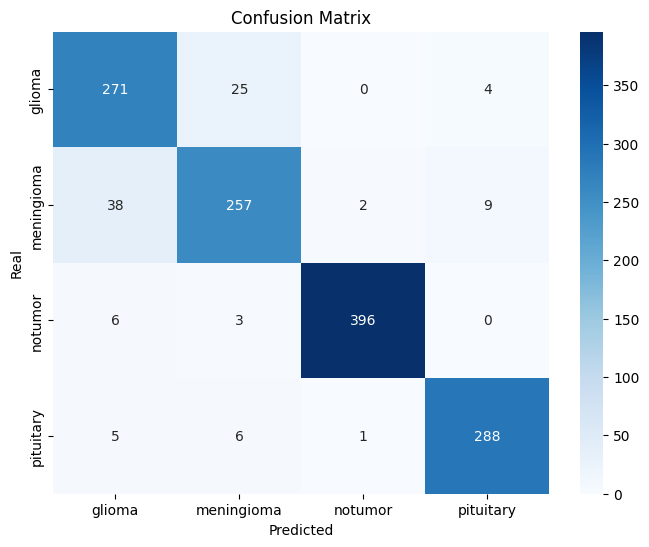

		Matriz de confusión tumor o no tumor:


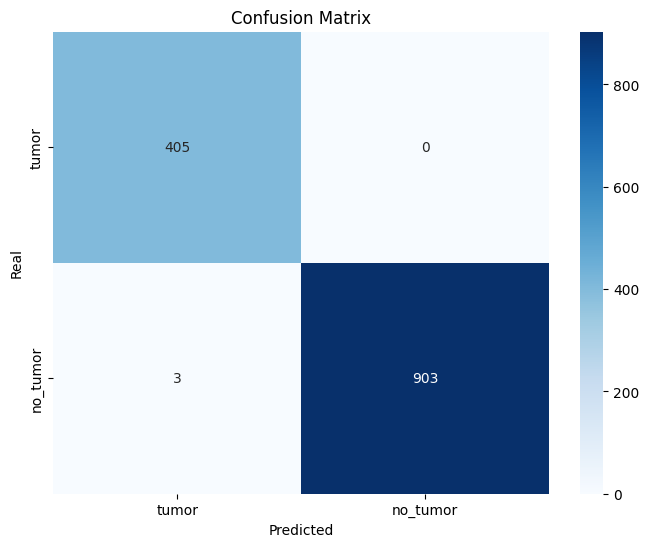

Evaluamos el modelo con transfer learning con learning rate 0.001
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet152.
			Loss: 0.9380
			Accuracy: 0.9336
			Precision: 0.9314
			Recall: 0.9302
			F1-score: 0.9308

			Accuracy tumor o no tumor: 0.9992
			Precision tumor o no tumor: 0.9988
			Recall tumor o no tumor: 0.9994
			F1-score tumor o no tumor: 0.9991

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9304
			meningioma: 0.8441
			notumor: 0.9975
			pituitary: 0.9538

		Sensibilidad (Recall):
			glioma: 0.8467
			meningioma: 0.9379
			notumor: 0.9728
			pituitary: 0.9633

		Puntaje F1 (F1-score):
			glioma: 0.8866
			meningioma: 0.8885
			notumor: 0.985
			pituitary: 0.9585

		Pérdida por categoría:
			glioma: 0.0075
			meningioma: 0.0042
			notumor: 0.0415
			pituitary: 0.0016

		Matriz de confusión:


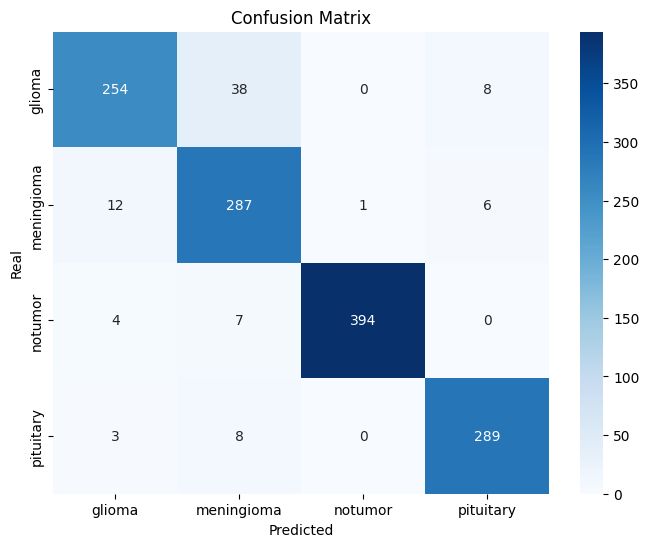

		Matriz de confusión tumor o no tumor:


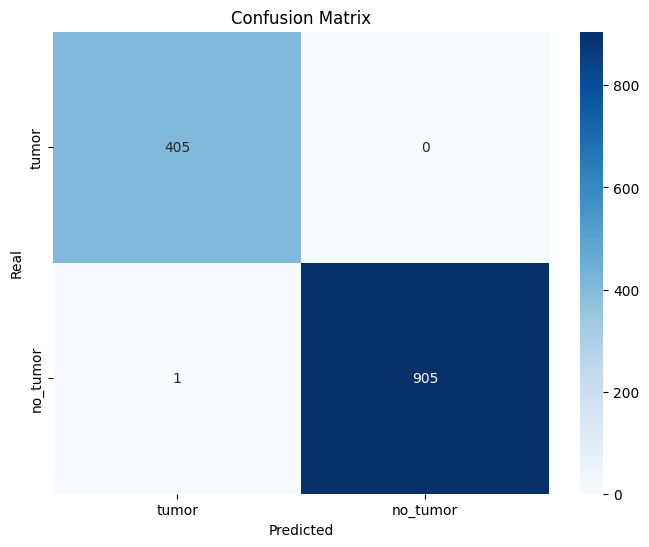

Evaluamos el modelo con transfer learning con learning rate 0.0001
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet152.
			Loss: 1.2349
			Accuracy: 0.8909
			Precision: 0.8854
			Recall: 0.8861
			F1-score: 0.8858

			Accuracy tumor o no tumor: 0.9893
			Precision tumor o no tumor: 0.9833
			Recall tumor o no tumor: 0.9923
			F1-score tumor o no tumor: 0.9878

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.8759
			meningioma: 0.7923
			notumor: 0.9649
			pituitary: 0.9085

		Sensibilidad (Recall):
			glioma: 0.8233
			meningioma: 0.8105
			notumor: 0.9506
			pituitary: 0.96

		Puntaje F1 (F1-score):
			glioma: 0.8488
			meningioma: 0.8013
			notumor: 0.9577
			pituitary: 0.9335

		Pérdida por categoría:
			glioma: 0.0072
			meningioma: 0.0091
			notumor: 0.0535
			pituitary: 0.0035

		Matriz de confusión:


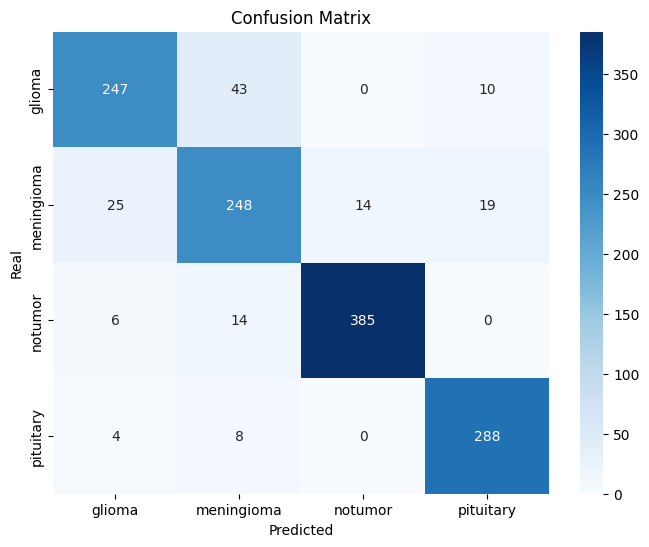

		Matriz de confusión tumor o no tumor:


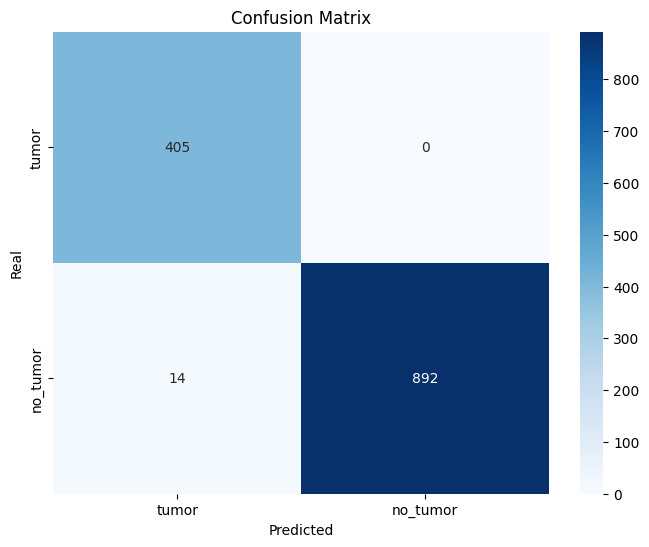

Evaluamos el modelo con fine tunning con learning rate 0.1
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet152.
			Loss: 28.5981
			Accuracy: 0.9252
			Precision: 0.9197
			Recall: 0.9216
			F1-score: 0.9207

			Accuracy tumor o no tumor: 0.9992
			Precision tumor o no tumor: 0.9988
			Recall tumor o no tumor: 0.9994
			F1-score tumor o no tumor: 0.9991

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.8746
			meningioma: 0.8742
			notumor: 0.9975
			pituitary: 0.9327

		Sensibilidad (Recall):
			glioma: 0.8833
			meningioma: 0.8627
			notumor: 0.9704
			pituitary: 0.97

		Puntaje F1 (F1-score):
			glioma: 0.8789
			meningioma: 0.8684
			notumor: 0.9837
			pituitary: 0.951

		Pérdida por categoría:
			glioma: 0.0706
			meningioma: 0.0655
			notumor: 1.4218
			pituitary: 0.0145

		Matriz de confusión:


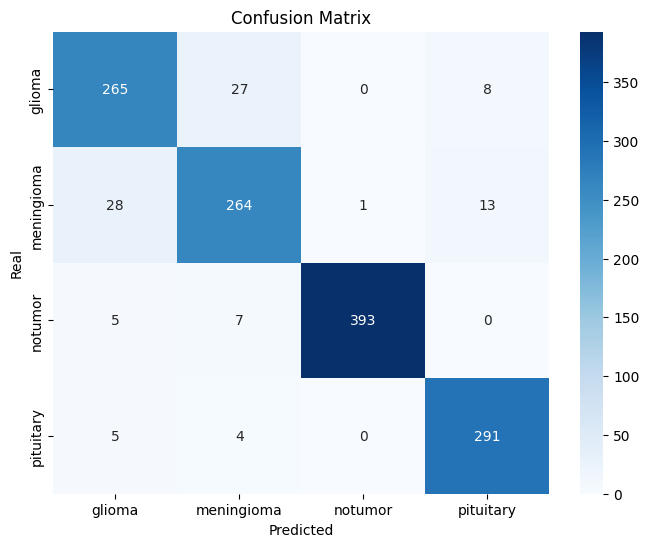

		Matriz de confusión tumor o no tumor:


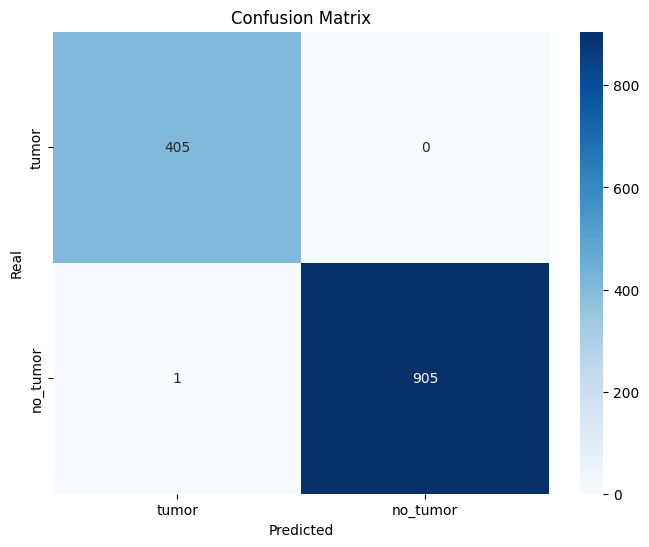

Evaluamos el modelo con fine tunning con learning rate 0.01
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet152.
			Loss: 1.3248
			Accuracy: 0.9268
			Precision: 0.9243
			Recall: 0.9232
			F1-score: 0.9237

			Accuracy tumor o no tumor: 0.9977
			Precision tumor o no tumor: 0.9963
			Recall tumor o no tumor: 0.9983
			F1-score tumor o no tumor: 0.9973

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9081
			meningioma: 0.8338
			notumor: 0.9924
			pituitary: 0.9628

		Sensibilidad (Recall):
			glioma: 0.8567
			meningioma: 0.9183
			notumor: 0.9679
			pituitary: 0.95

		Puntaje F1 (F1-score):
			glioma: 0.8816
			meningioma: 0.874
			notumor: 0.98
			pituitary: 0.9564

		Pérdida por categoría:
			glioma: 0.0117
			meningioma: 0.0071
			notumor: 0.0564
			pituitary: 0.0034

		Matriz de confusión:


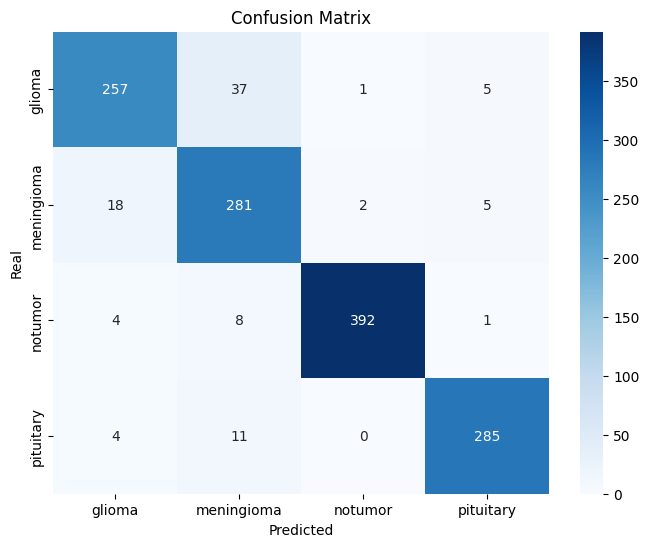

		Matriz de confusión tumor o no tumor:


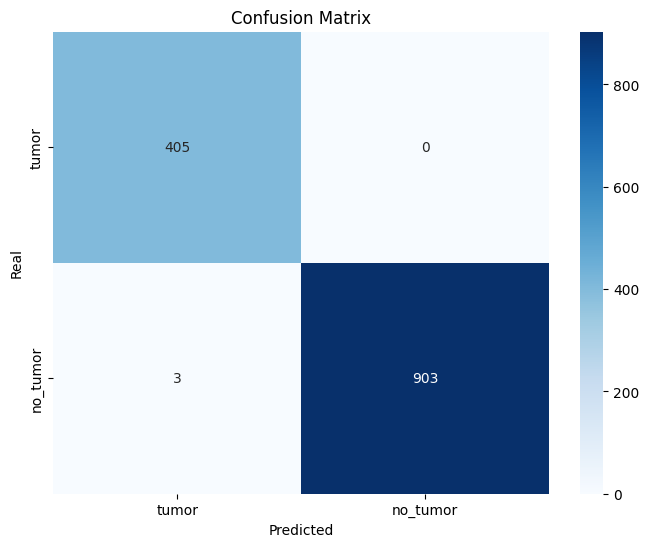

Evaluamos el modelo con fine tunning con learning rate 0.001
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet152.
			Loss: 1.2771
			Accuracy: 0.9329
			Precision: 0.9295
			Recall: 0.9294
			F1-score: 0.9294

			Accuracy tumor o no tumor: 0.9985
			Precision tumor o no tumor: 0.9975
			Recall tumor o no tumor: 0.9989
			F1-score tumor o no tumor: 0.9982

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9059
			meningioma: 0.8571
			notumor: 0.9949
			pituitary: 0.9599

		Sensibilidad (Recall):
			glioma: 0.8667
			meningioma: 0.9216
			notumor: 0.9728
			pituitary: 0.9567

		Puntaje F1 (F1-score):
			glioma: 0.8859
			meningioma: 0.8882
			notumor: 0.9838
			pituitary: 0.9583

		Pérdida por categoría:
			glioma: 0.0064
			meningioma: 0.0045
			notumor: 0.0597
			pituitary: 0.0019

		Matriz de confusión:


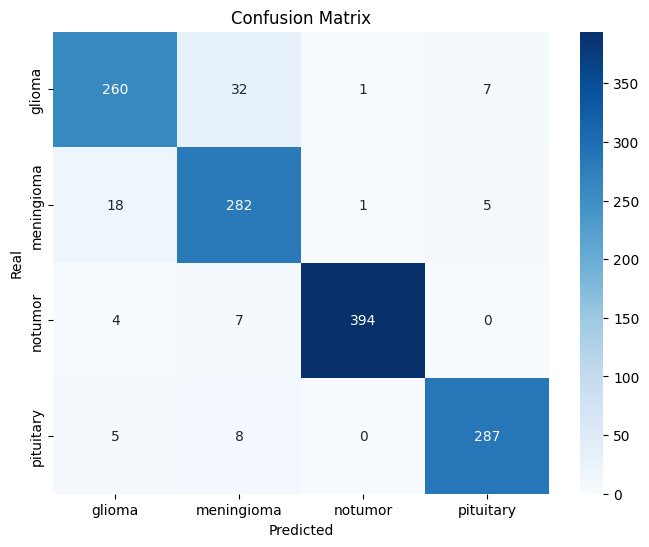

		Matriz de confusión tumor o no tumor:


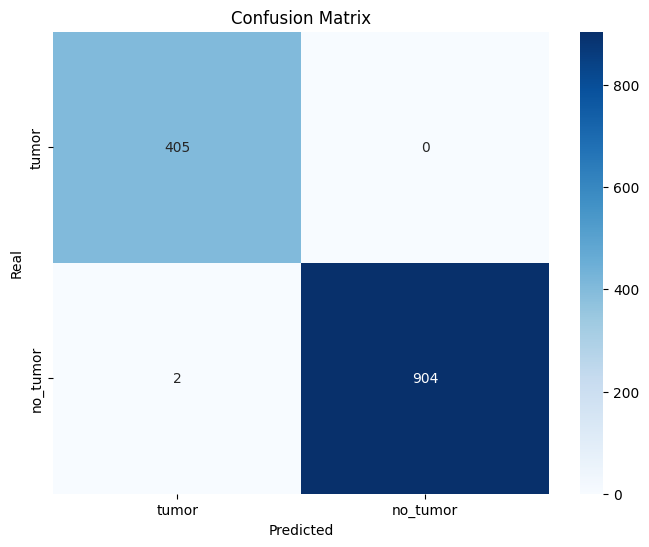

Evaluamos el modelo con fine tunning con learning rate 0.001
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet152.
			Loss: 1.1035
			Accuracy: 0.8841
			Precision: 0.8789
			Recall: 0.8789
			F1-score: 0.8789

			Accuracy tumor o no tumor: 0.9840
			Precision tumor o no tumor: 0.9754
			Recall tumor o no tumor: 0.9884
			F1-score tumor o no tumor: 0.9818

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.8646
			meningioma: 0.7871
			notumor: 0.9481
			pituitary: 0.9156

		Sensibilidad (Recall):
			glioma: 0.83
			meningioma: 0.7974
			notumor: 0.9481
			pituitary: 0.94

		Puntaje F1 (F1-score):
			glioma: 0.8469
			meningioma: 0.7922
			notumor: 0.9481
			pituitary: 0.9276

		Pérdida por categoría:
			glioma: 0.0068
			meningioma: 0.0093
			notumor: 0.0463
			pituitary: 0.0041

		Matriz de confusión:


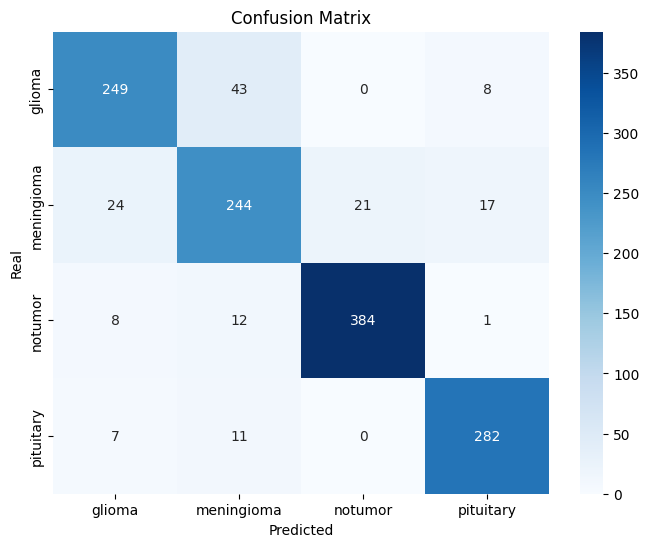

		Matriz de confusión tumor o no tumor:


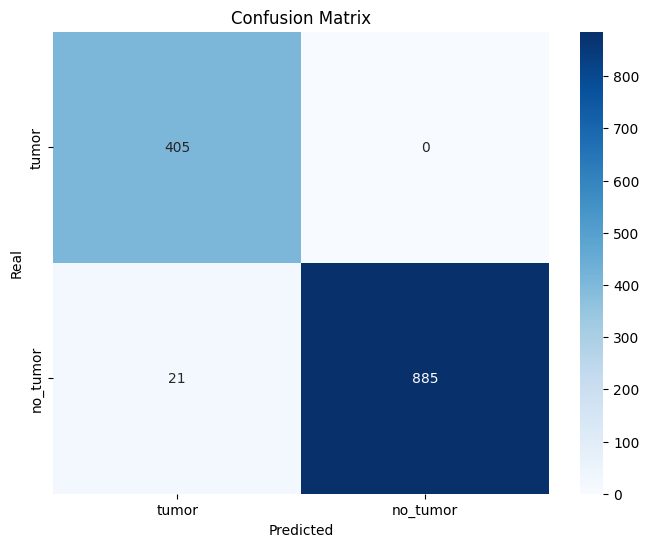

Evaluamos el modelo con transfer learning y fine tunning con learning rate 0.1
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet152.
			Loss: 28.1679
			Accuracy: 0.9146
			Precision: 0.9140
			Recall: 0.9101
			F1-score: 0.9120

			Accuracy tumor o no tumor: 0.9985
			Precision tumor o no tumor: 0.9975
			Recall tumor o no tumor: 0.9989
			F1-score tumor o no tumor: 0.9982

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9032
			meningioma: 0.7926
			notumor: 0.9949
			pituitary: 0.9652

		Sensibilidad (Recall):
			glioma: 0.84
			meningioma: 0.9118
			notumor: 0.9654
			pituitary: 0.9233

		Puntaje F1 (F1-score):
			glioma: 0.8705
			meningioma: 0.848
			notumor: 0.9799
			pituitary: 0.9438

		Pérdida por categoría:
			glioma: 0.11
			meningioma: 0.0511
			notumor: 1.3657
			pituitary: 0.0303

		Matriz de confusión:


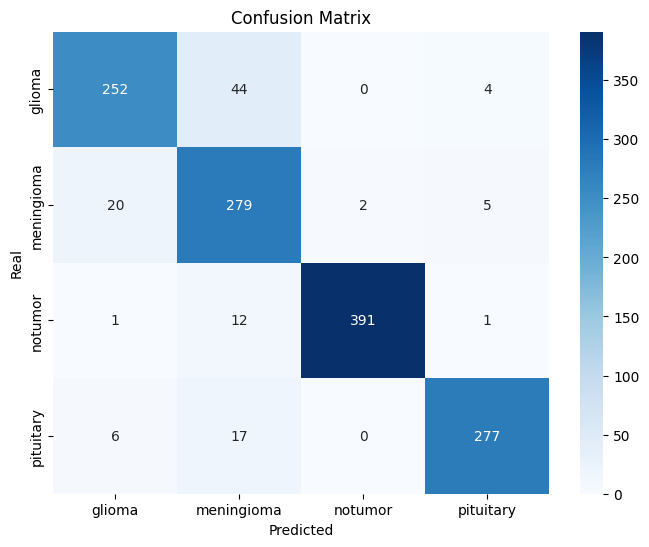

		Matriz de confusión tumor o no tumor:


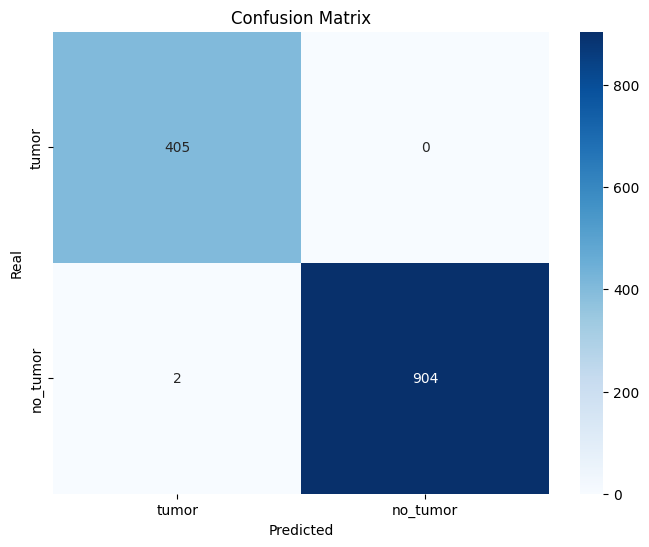

Evaluamos el modelo con transfer learning y fine tunning con learning rate 0.01
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet152.
			Loss: 3.3252
			Accuracy: 0.9298
			Precision: 0.9252
			Recall: 0.9267
			F1-score: 0.9260

			Accuracy tumor o no tumor: 1.0000
			Precision tumor o no tumor: 1.0000
			Recall tumor o no tumor: 1.0000
			F1-score tumor o no tumor: 1.0000

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.875
			meningioma: 0.869
			notumor: 1.0
			pituitary: 0.957

		Sensibilidad (Recall):
			glioma: 0.8867
			meningioma: 0.8889
			notumor: 0.9679
			pituitary: 0.9633

		Puntaje F1 (F1-score):
			glioma: 0.8808
			meningioma: 0.8788
			notumor: 0.9837
			pituitary: 0.9601

		Pérdida por categoría:
			glioma: 0.0108
			meningioma: 0.0099
			notumor: 0.1624
			pituitary: 0.0029

		Matriz de confusión:


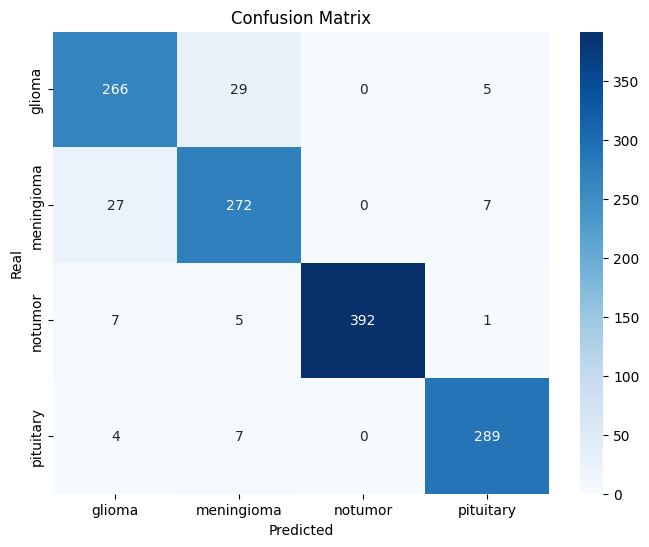

		Matriz de confusión tumor o no tumor:


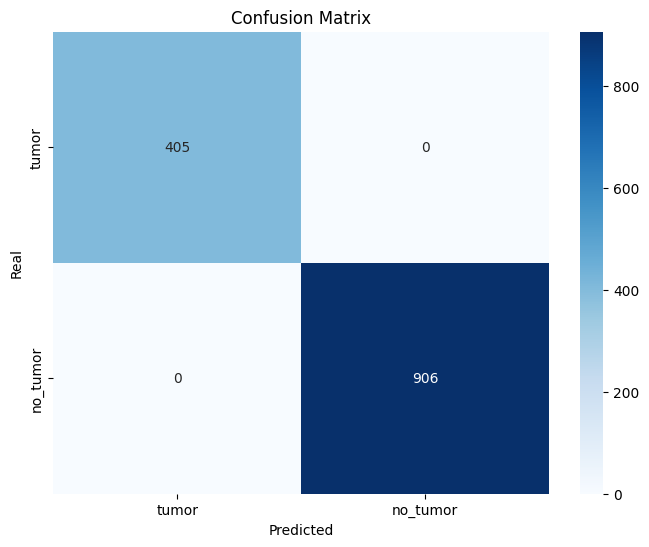

Evaluamos el modelo con transfer learning y fine tunning con learning rate 0.001
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet152.
			Loss: 0.8898
			Accuracy: 0.9375
			Precision: 0.9349
			Recall: 0.9342
			F1-score: 0.9346

			Accuracy tumor o no tumor: 1.0000
			Precision tumor o no tumor: 1.0000
			Recall tumor o no tumor: 1.0000
			F1-score tumor o no tumor: 1.0000

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9286
			meningioma: 0.8512
			notumor: 1.0
			pituitary: 0.96

		Sensibilidad (Recall):
			glioma: 0.8667
			meningioma: 0.9346
			notumor: 0.9753
			pituitary: 0.96

		Puntaje F1 (F1-score):
			glioma: 0.8966
			meningioma: 0.891
			notumor: 0.9875
			pituitary: 0.96

		Pérdida por categoría:
			glioma: 0.0073
			meningioma: 0.0042
			notumor: 0.0388
			pituitary: 0.002

		Matriz de confusión:


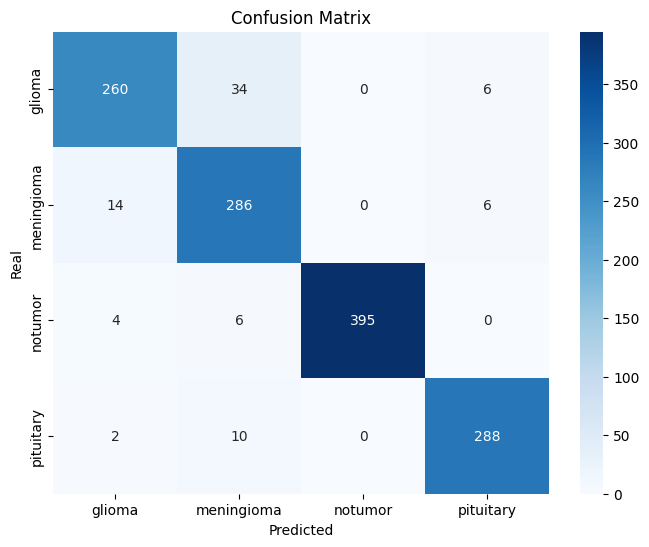

		Matriz de confusión tumor o no tumor:


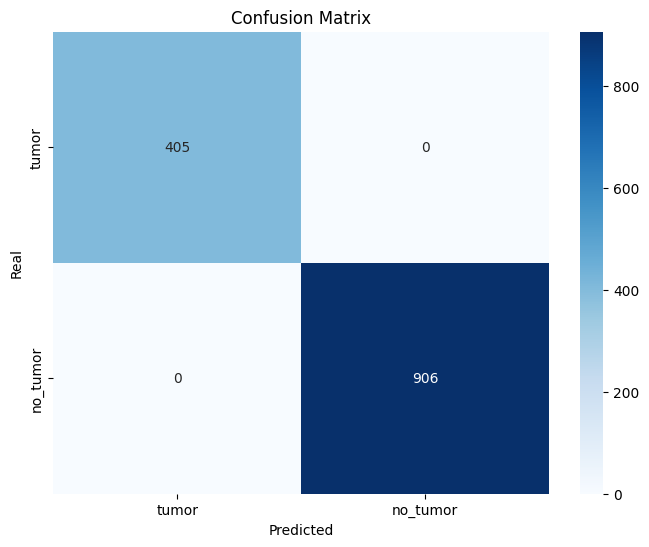

Evaluamos el modelo con transfer learning y fine tunning con learning rate 0.0001
	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet152.
			Loss: 0.3573
			Accuracy: 0.9085
			Precision: 0.9042
			Recall: 0.9048
			F1-score: 0.9045

			Accuracy tumor o no tumor: 0.9962
			Precision tumor o no tumor: 0.9939
			Recall tumor o no tumor: 0.9972
			F1-score tumor o no tumor: 0.9955

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.8865
			meningioma: 0.811
			notumor: 0.9872
			pituitary: 0.9323

		Sensibilidad (Recall):
			glioma: 0.8333
			meningioma: 0.8693
			notumor: 0.9531
			pituitary: 0.9633

		Puntaje F1 (F1-score):
			glioma: 0.8591
			meningioma: 0.8391
			notumor: 0.9698
			pituitary: 0.9475

		Pérdida por categoría:
			glioma: 0.0065
			meningioma: 0.0065
			notumor: 0.0091
			pituitary: 0.003

		Matriz de confusión:


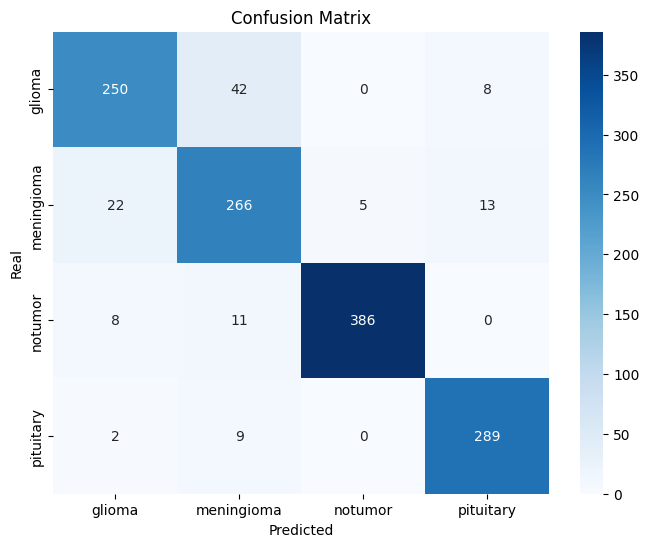

		Matriz de confusión tumor o no tumor:


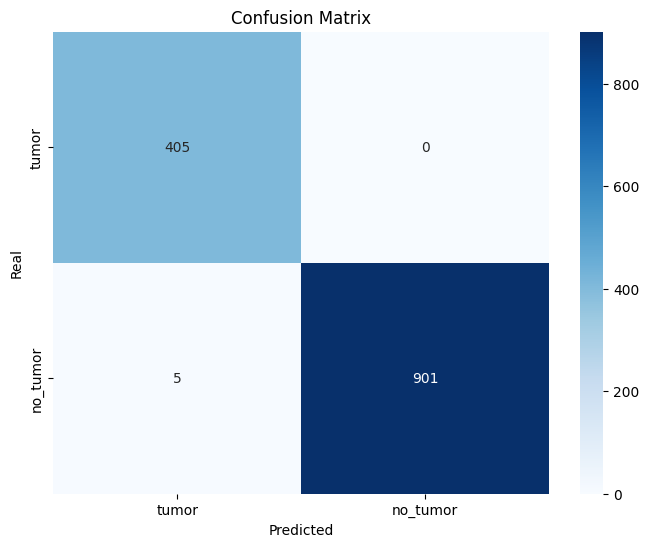

In [ ]:
#Evaluamos los resultados del grupo
my_group_evaluator.eval(my_dataset.test_loader, my_model_group_152_1)

In [ ]:
# Creamos una inteligencia compartida
min_accuracy_value = 0.93
my_model_group_152_1.create_shared_model(min_accuracy_value)

Número de modelos que cumplen con la condición: 3


	Evaluando el rendimiento del modelo...
		Rendimiento en el conjunto de test del modelo resnet152.
			Loss: 1.0026
			Accuracy: 0.9375
			Precision: 0.9351
			Recall: 0.9341
			F1-score: 0.9346

			Accuracy tumor o no tumor: 0.9992
			Precision tumor o no tumor: 0.9988
			Recall tumor o no tumor: 0.9994
			F1-score tumor o no tumor: 0.9991

		Resultados obtenidos por cada categoría:
		Precisión (Precision):
			glioma: 0.9312
			meningioma: 0.8516
			notumor: 0.9975
			pituitary: 0.9603

		Sensibilidad (Recall):
			glioma: 0.8567
			meningioma: 0.9379
			notumor: 0.9753
			pituitary: 0.9667

		Puntaje F1 (F1-score):
			glioma: 0.8924
			meningioma: 0.8927
			notumor: 0.9863
			pituitary: 0.9635

		Pérdida por categoría:
			glioma: 0.0072
			meningioma: 0.0042
			notumor: 0.045
			pituitary: 0.0018

		Matriz de confusión:


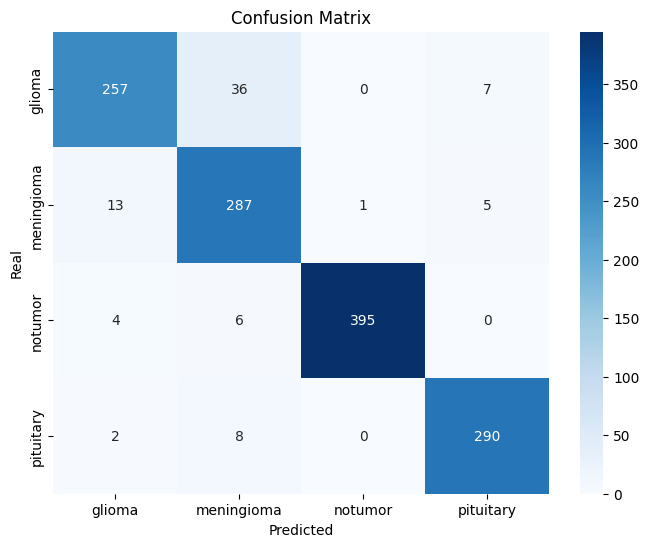

		Matriz de confusión tumor o no tumor:


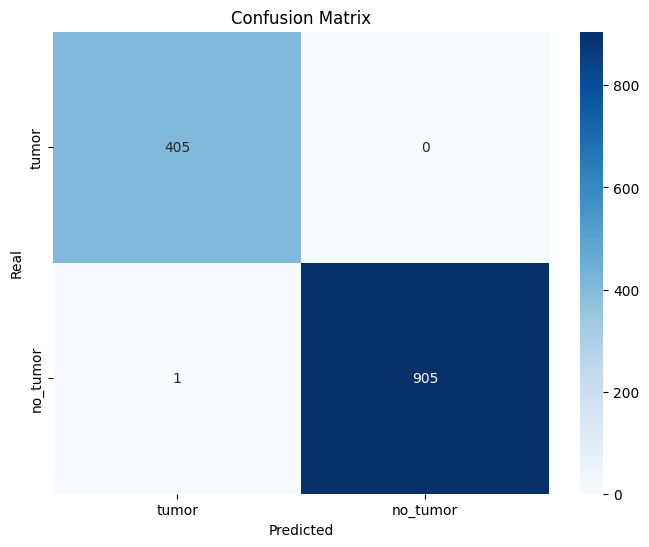

In [ ]:
# Comprobamos el rendimiento de la inteligencia compartida
evaluate(my_model_group_152_1.shared_model, my_dataset.test_loader, my_dataset.no_tumor_label_position)

In [ ]:
#guardado de todo un grupo

save_group_model(my_model_group_152_1)

Guardando los modelos con Transfer Learning.
Guardando los modelos con Fine Tunning.
Guardando los modelos con Transfer Learning y Fine Tunning.
Guardando la intenligencia compartida
Comprimiendo la carpeta con los modelos y subiendo al drive
proceso de guardado finalizado


# Resultados finales

## Importamos los grupos de modelos

In [ ]:
# Ejemplo de uso
dir_path = "/content/drive/MyDrive/tfg"
print("Importando resnet 18")
resnet_18_group = MyResnetGroupModel(model_name='resnet18', num_classes=my_dataset.num_classes)
load_group_model(resnet_18_group, dir_path)

print("\nImportando resnet 34")
resnet_34_group = MyResnetGroupModel(model_name='resnet34', num_classes=my_dataset.num_classes)
load_group_model(resnet_34_group, dir_path)

print("\nImportando resnet 50")
resnet_50_group = MyResnetGroupModel(model_name='resnet50', num_classes=my_dataset.num_classes)
load_group_model(resnet_50_group, dir_path)

print("\nImportando resnet 101")
resnet_101_group = MyResnetGroupModel(model_name='resnet101', num_classes=my_dataset.num_classes)
load_group_model(resnet_101_group, dir_path)

print("\nImportando resnet 152")
resnet_152_group = MyResnetGroupModel(model_name='resnet152', num_classes=my_dataset.num_classes)
load_group_model(resnet_152_group, dir_path)


Importando resnet 18


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 105MB/s]


Descomprimiendo el fichero
Descompresión finalizada
Cargando modelos...
Carga de modelos completada.

Importando resnet 34


Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:01<00:00, 45.1MB/s]


Descomprimiendo el fichero
Descompresión finalizada
Cargando modelos...
Carga de modelos completada.

Importando resnet 152
Descomprimiendo el fichero
Descompresión finalizada
Cargando modelos...
Carga de modelos completada.


## Pintamos una tabla con el rendimiento de todos los modelos

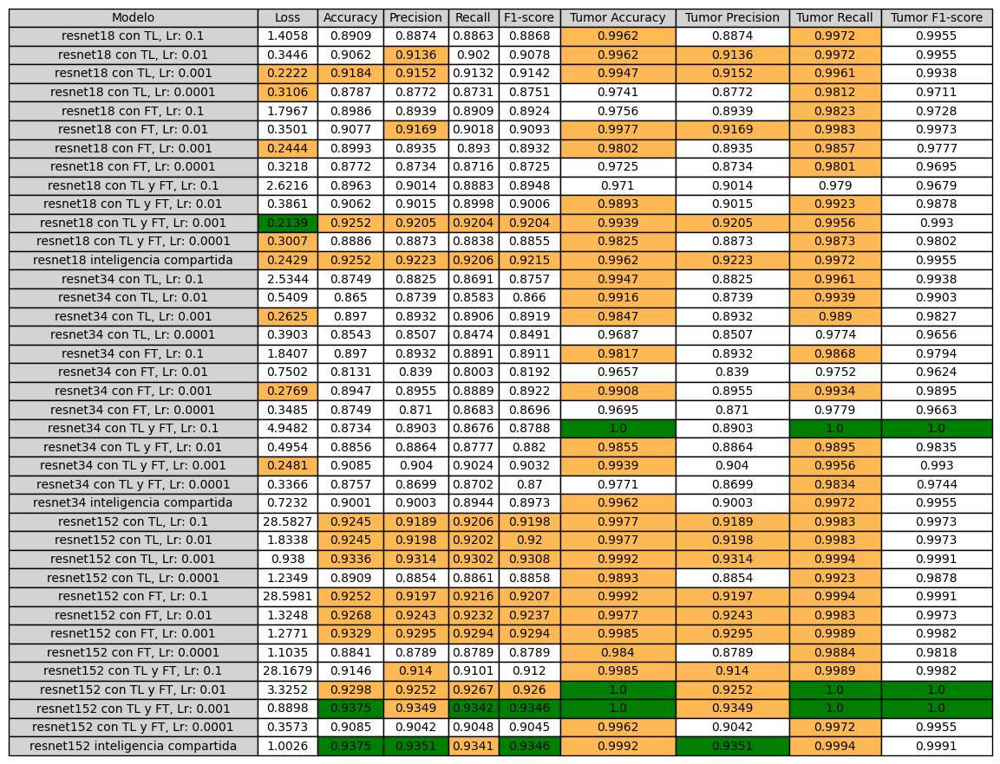

In [ ]:
# Lista de grupos creados
#all_groups = [my_model_group_18_1, my_model_group_34_1, my_model_group_50_1, my_model_group_101_1, my_model_group_152_1]
all_groups = [resnet_18_group, resnet_34_group, resnet_152_group]

# margen de error que queremos tener en cuenta (las celdas con un valor con una diferencia menor a la indicada, se pintarán en amarillo)
loss_margin = 0.1
accuracy_margin = 0.02
precision_margin = 0.03
recall_margin = 0.02
f1_score_margin = 0.02

# Pintamos la tabla con los resultados
printGroupListResults(all_groups, loss_margin, accuracy_margin, precision_margin, recall_margin, f1_score_margin)